**Segmentez des clients d'un site e-commerce - Phase Exploratoire**

**Contexte**<br>
Vous venez d’intégrer l’équipe Data d’Olist, en pleine structuration, en tant que consultant Data Science. Votre mission principale est de poser les fondations d’une segmentation client exploitable par l’équipe Marketing dans leurs campagnes et leur communication personnalisée.

Avant cela, une urgence vous a été confiée par Fernanda, Lead Data Analyst, pour soutenir l’équipe Customer Experience via l’implémentation de requêtes SQL alimentant leur dashboard. Cette première tâche accomplie, vous pouvez désormais vous concentrer sur la mission centrale : comprendre les comportements clients à partir des données à disposition.

**Objectifs**<br>
- Identifier les différents profils de clients en s'appuyant sur des techniques de clustering non supervisé.

- Construire une segmentation actionnable, claire et stable dans le temps.

- Fournir une analyse descriptive de chaque segment pour une compréhension facile par l’équipe Marketing.

- Évaluer la stabilité des segments dans le temps et proposer une recommandation de fréquence de mise à jour du modèle de segmentation.

- Produire un code conforme à la convention PEP8, pour une intégration future par l’équipe Data interne.<br>
→ Respecter l’indentation standard (4 espaces par niveau)<br>
→ Limiter la longueur des lignes à 79 caractères pour faciliter la lecture<br>
→ Utiliser des noms de variables explicites et en snake_case<br>
→ Ajouter des commentaires clairs et des docstrings pour chaque fonction ou classe<br>
→ Organiser le code en modules bien structurés, avec une séparation claire des responsabilités<br>
→ Supprimer le code mort ou non utilisé<br>
→ Éviter les imports inutiles et respecter l’ordre : imports standard, puis librairies tierces, puis modules internes<br>
→ Garder une cohérence dans la mise en forme (espaces autour des opérateurs, lignes vides entre les blocs logiques, etc.)<br>



**Données disponibles**<br>
Olist met à disposition une base de données anonymisée contenant :

- L’historique des commandes clients depuis 2016.

- Les produits achetés.

- Les scores de satisfaction des utilisateurs.

- Des informations géographiques sur les clients.

**Plan d’action**<br>
Dans cette première partie, nous nous concentrerons sur l’analyse exploratoire des données afin de :

- Comprendre la structure et la qualité des données.

- Identifier les variables pertinentes à inclure dans la segmentation.

- Évaluer la distribution des variables clés (commandes, satisfaction, fréquence, etc.).

- Détecter les valeurs extrêmes et les données manquantes.

- Préparer les données à la phase de modélisation.

Ce notebook servira de base de réflexion et de préparation à la modélisation de la segmentation, tout en permettant aux parties prenantes de suivre votre démarche de façon transparente.



# Importation des librairies

In [1]:
# Bibliothèque pour la gestion des bases de données SQLite
import sqlite3

# Bibliothèques pour la manipulation et l'analyse des données
import pandas as pd
import numpy as np

# Bibliothèque pour les visualisations
import matplotlib.pyplot as plt
import seaborn as sns

# Bibliothèques pour les calculs statistiques
from scipy import stats
from scipy.stats import kstest, f_oneway

# Bibliothèque pour la gestion des dates et heures
from datetime import datetime

# Bibliothèques pour la réduction de dimensionnalité et la préprocessing des données
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Importation des données

In [2]:
# Connexion à la base de données SQLite
conn = sqlite3.connect("olist.db")

# Exécution de la requête SQL pour récupérer les noms des tables dans la base de données
tables = pd.read_sql_query("SELECT name FROM sqlite_master WHERE type='table';", conn)

# Affichage des tables présentes
print(tables)

            name
0      customers
1         geoloc
2    order_items
3    order_pymts
4  order_reviews
5         orders
6       products
7        sellers
8    translation


In [3]:
# Chargement des tables
customers = pd.read_sql_query("SELECT * FROM customers;", conn)
geoloc = pd.read_sql_query("SELECT * FROM geoloc;", conn)
order_items = pd.read_sql_query("SELECT * FROM order_items;", conn)
order_pymts = pd.read_sql_query("SELECT * FROM order_pymts;", conn)
order_reviews = pd.read_sql_query("SELECT * FROM order_reviews;", conn)
orders = pd.read_sql_query("SELECT * FROM orders;", conn)
products = pd.read_sql_query("SELECT * FROM products;", conn)
sellers = pd.read_sql_query("SELECT * FROM sellers;", conn)
translation = pd.read_sql_query("SELECT * FROM translation;", conn)

conn.close()  # Ferme la connexion à la base SQLite

# Analyse exploratoire des données

## Aperçu général

In [9]:
dfs = {
    "customers": customers,
    "geoloc": geoloc,
    "order_items": order_items,
    "order_pymts": order_pymts,
    "order_reviews": order_reviews,
    "orders": orders,
    "products": products,
    "sellers": sellers,
    "translation": translation
}
# Analyse de chaque DataFrame dans le dictionnaire dfs
for name, df in dfs.items():
    print(f"\n Analyse du DataFrame : {name}")
    print(f"Dimensions : {df.shape}")
    print("Types de données :")
    print(df.dtypes)
    print("\nValeurs manquantes :")
    print(df.isna().sum())


 Analyse du DataFrame : customers
Dimensions : (99441, 6)
Types de données :
index                        int64
customer_id                 object
customer_unique_id          object
customer_zip_code_prefix     int64
customer_city               object
customer_state              object
dtype: object

Valeurs manquantes :
index                       0
customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64

 Analyse du DataFrame : geoloc
Dimensions : (1000163, 6)
Types de données :
index                            int64
geolocation_zip_code_prefix      int64
geolocation_lat                float64
geolocation_lng                float64
geolocation_city                object
geolocation_state               object
dtype: object

Valeurs manquantes :
index                          0
geolocation_zip_code_prefix    0
geolocation_lat                0
geolocation_lng                0
geol

### Table customers

In [10]:
customers.head()

,index,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


La table customers contient des informations sur les clients. Chaque client est identifié par un customer_id, mais il peut avoir plusieurs commandes associées à un même customer_unique_id (qui représente un client unique). La table inclut aussi des informations géographiques comme le code postal (customer_zip_code_prefix), la ville (customer_city) et l'État (customer_state).

| Colonne                     | Type     | Description                                          | Valeurs manquantes |
|:----------------------------|:--------|:-----------------------------------------------------|:-------------------|
| `index`                     | `int64`  | Identifiant unique de la ligne (auto-généré par pandas) | 0 |
| `customer_id`               | `object` | Identifiant unique du client (lié aux commandes)    | 0 |
| `customer_unique_id`        | `object` | Identifiant unique d’un client sur plusieurs commandes | 0 |
| `customer_zip_code_prefix`  | `int64`  | Préfixe du code postal du client                    | 0 |
| `customer_city`             | `object` | Ville du client                                     | 0 |
| `customer_state`            | `object` | État du client                                      | 0 |

La table contient 99 441 lignes, qui correspondent au nombre d'enregistrements des clients, certains clients apparaissant plusieurs fois en fonction du nombre de commandes qu'ils ont passées.<br>
La clé primaire de la table customers est customer_id.
Chaque customer_id est unique et correspond à un client dans la base de données. En revanche, plusieurs customer_id peuvent être associés au même customer_unique_id, car un client peut passer plusieurs commandes sous différents customer_id.

#### Vérification des doublons

In [112]:
# Vérification du nombre de doublons dans les identifiants des clients
customer_id_duplicates = customers['customer_id'].duplicated().sum()
customer_unique_id_duplicates = customers['customer_unique_id'].duplicated().sum()

print(f"Doublons dans 'customer_id': {customer_id_duplicates}")
print(f"Doublons dans 'customer_unique_id': {customer_unique_id_duplicates}")

Doublons dans 'customer_id': 0
Doublons dans 'customer_unique_id': 3345


Il n'y a pas de doublons dans la colonne customer_id, ce qui est normal car chaque commande a un identifiant unique.

Il y a 3345 doublons dans la colonne customer_unique_id, ce qui est aussi normal. Cela signifie qu'un même client a passé plusieurs commandes, chaque commande ayant un customer_id unique, mais le même customer_unique_id pour le client.

Les doublons dans customer_unique_id sont donc attendus, car un client peut passer plusieurs commandes. 

#### Conversion des types

On va convertir la colonne customer_zip_code_prefix en chaîne de caractères, car un code postal est une donnée qui ne nécessite pas de traitement numérique. Nous n'effectuons pas de calculs ou de transformations sur cette colonne.

In [114]:
# Conversion de la colonne 'customer_zip_code_prefix' en type string (chaîne de caractères)
customers['customer_zip_code_prefix'] = customers['customer_zip_code_prefix'].astype(str)

# Vérification du type de la colonne après conversion
customers['customer_zip_code_prefix'].dtype

dtype('O')

#### Analyse du nombre de valeurs uniques par colonne

In [116]:
# Vérification du nombre de valeurs uniques pour chaque colonne de type 'object'
for col in customers.select_dtypes(include=['object']).columns:
    unique_values = customers[col].nunique()
    print(f"Nombre de valeurs uniques dans la colonne {col} : {unique_values}")

Nombre de valeurs uniques dans la colonne customer_id : 99441
Nombre de valeurs uniques dans la colonne customer_unique_id : 96096
Nombre de valeurs uniques dans la colonne customer_zip_code_prefix : 14994
Nombre de valeurs uniques dans la colonne customer_city : 4119
Nombre de valeurs uniques dans la colonne customer_state : 27


Nous avons vérifié le nombre de valeurs uniques pour chaque colonne de type 'object' dans la table customers. On constate que la colonne customer_id contient 99 441 valeurs uniques, tandis que customer_unique_id en compte 96 096, ce qui indique qu'un client peut passer plusieurs commandes. Le préfixe du code postal (customer_zip_code_prefix) a 14 994 valeurs uniques, et les villes (customer_city) comptent 4 119 valeurs uniques. Enfin, la colonne customer_state contient 27 valeurs uniques, ce qui correspond aux différents états du pays.

In [117]:
# Compter le nombre de valeurs uniques pour chaque pays dans 'customer_state'
country_counts = customers['customer_state'].value_counts()

# Afficher les résultats
print(country_counts)

customer_state
SP    41746
RJ    12852
MG    11635
RS     5466
PR     5045
SC     3637
BA     3380
DF     2140
ES     2033
GO     2020
PE     1652
CE     1336
PA      975
MT      907
MA      747
MS      715
PB      536
PI      495
RN      485
AL      413
SE      350
TO      280
RO      253
AM      148
AC       81
AP       68
RR       46
Name: count, dtype: int64


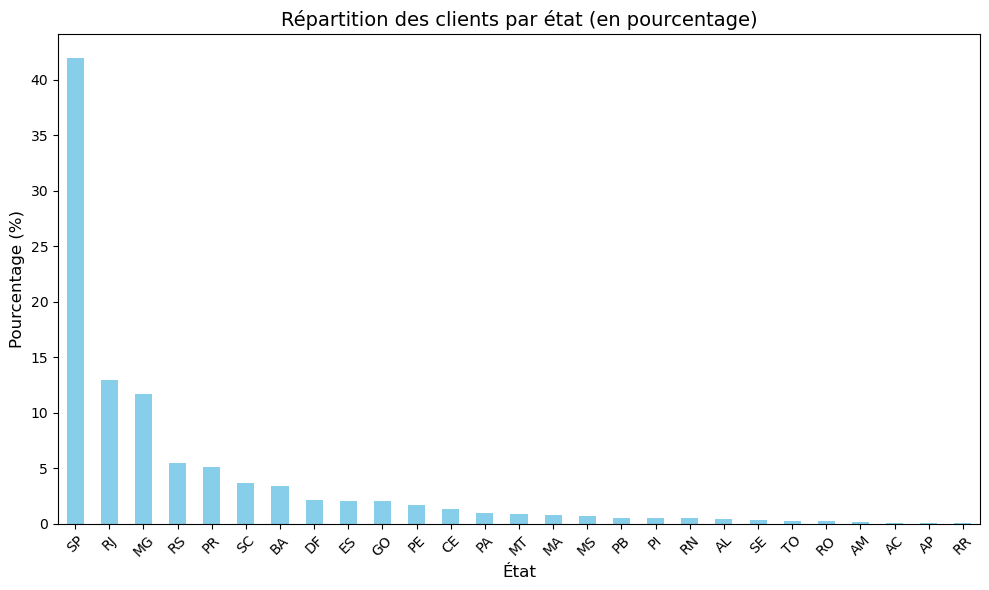

In [118]:
# Calcul des pourcentages de chaque valeur unique dans 'customer_state'
state_counts = customers['customer_state'].value_counts(normalize=True) * 100

# Création du graphique
plt.figure(figsize=(10, 6))
state_counts.plot(kind='bar', color='skyblue')

# Personnalisation du graphique
plt.title('Répartition des clients par état (en pourcentage)', fontsize=14)
plt.xlabel('État', fontsize=12)
plt.ylabel('Pourcentage (%)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()

# Affichage du graphique
plt.show()

### Table geoloc

In [11]:
geoloc.head()

,index,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,0,1037,-23.545621,-46.639292,sao paulo,SP
1,1,1046,-23.546081,-46.644820,sao paulo,SP
2,2,1046,-23.546129,-46.642951,sao paulo,SP
3,3,1041,-23.544392,-46.639499,sao paulo,SP
4,4,1035,-23.541578,-46.641607,sao paulo,SP


Cette table contient des données géographiques associées aux codes postaux brésiliens. Elle fait le lien entre un code postal (geolocation_zip_code_prefix) et ses coordonnées GPS (geolocation_lat et geolocation_lng), ainsi que la ville et l'État correspondants.

| Colonne                     | Type     | Description                                        | Valeurs manquantes |
|:----------------------------|:--------|:---------------------------------------------------|:-------------------|
| `geolocation_zip_code_prefix` | `int64`  | Préfixe du code postal                            | 0 |
| `geolocation_lat`           | `float64`| Latitude de la localisation                      | 0 |
| `geolocation_lng`           | `float64`| Longitude de la localisation                     | 0 |
| `geolocation_city`          | `object` | Ville associée                                   | 0 |
| `geolocation_state`         | `object` | État associé                                     | 0 |


La table contient 1 000 163 lignes qui correspondent à des points géographiques spécifiques associés à des préfixes de codes postaux brésiliens, chacun incluant des informations sur la latitude, la longitude, la ville, et l'État correspondants.

#### Vérification des doublons

In [22]:
# Supprimer la colonne 'index'
df_geoloc_no_index = geoloc.drop(columns=['index'], errors='ignore')

# Vérifier les doublons sur toutes les autres colonnes
duplicates = df_geoloc_no_index[df_geoloc_no_index.duplicated()]

# Afficher le nombre de doublons
print(f"Nombre de doublons : {duplicates.shape[0]}")

Nombre de doublons : 261831


#### Conversion de types

In [119]:
# Conversion de la colonne 'geolocation_zip_code_prefix' en type string (chaîne de caractères)
geoloc['geolocation_zip_code_prefix'] = geoloc['geolocation_zip_code_prefix'].astype(str)

# Vérification du type de la colonne après conversion
print(geoloc['geolocation_zip_code_prefix'].dtype)

object


#### Analyse du nombre de valeurs uniques par colonne

In [120]:
# Vérification du nombre de valeurs uniques pour chaque colonne de type 'object'
for col in geoloc.select_dtypes(include=['object']).columns:
    unique_values = geoloc[col].nunique()
    print(f"Nombre de valeurs uniques dans la colonne {col} : {unique_values}")

Nombre de valeurs uniques dans la colonne geolocation_zip_code_prefix : 19015
Nombre de valeurs uniques dans la colonne geolocation_city : 8011
Nombre de valeurs uniques dans la colonne geolocation_state : 27


La colonne geolocation_zip_code_prefix contient 19 015 valeurs uniques, représentant les différents préfixes de codes postaux.

La colonne geolocation_city contient 8 011 valeurs uniques, correspondant aux différentes villes.

La colonne geolocation_state contient 27 valeurs uniques, représentant les États du Brésil.

### Table order_items

In [12]:
order_items.head()

,index,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


Cette table détaille les articles commandés. Chaque ligne représente un produit unique dans une commande. Elle contient les identifiants de la commande (order_id), du produit (product_id), du vendeur (seller_id), ainsi que des informations comme le prix (price) et les frais de livraison (freight_value).

| Colonne              | Type     | Description                                     | Valeurs manquantes |
|:---------------------|:--------|:------------------------------------------------|:-------------------|
| `order_id`          | `object` | Identifiant unique de la commande               | 0 |
| `order_item_id`     | `int64`  | Numéro de l’article dans la commande            | 0 |
| `product_id`        | `object` | Identifiant du produit                          | 0 |
| `seller_id`         | `object` | Identifiant du vendeur                          | 0 |
| `shipping_limit_date` | `object` | Date limite d’expédition                       | 0 |
| `price`            | `float64` | Prix de l’article                              | 0 |
| `freight_value`    | `float64` | Coût de la livraison                           | 0 |

La table order_items contient 112 650 lignes qui représentent les détails de chaque article commandé dans les commandes passées par les clients. Chaque ligne correspond à un produit unique dans une commande et inclut des informations sur l'identifiant de la commande (order_id), le produit (product_id), le vendeur (seller_id), ainsi que le prix du produit (price) et les frais de livraison (freight_value).

La clé primaire de la table order_items est probablement une combinaison de deux colonnes :
- order_id : l'identifiant unique de la commande
- order_item_id : le numéro de l'article dans la commande

#### Vérification des doublons

In [127]:
# Vérification du nombre de doublons dans 'order_items' pour les combinaisons 'order_id' et 'order_item_id'
duplicates_orders = order_items.duplicated(subset=['order_id', 'order_item_id']).sum()

print(f"Nombre de doublons dans la table 'orders' (par rapport à 'order_id' et 'order_item_id') : {duplicates_orders}")

Nombre de doublons dans la table 'orders' (par rapport à 'order_id' et 'order_item_id') : 0


#### Recherche des valeurs incohérentes

In [128]:
order_items.describe()

,index,order_item_id,price,freight_value
count,112650.000000,112650.000000,112650.000000,112650.000000
mean,56324.500000,1.197834,120.653739,19.990320
std,32519.398249,0.705124,183.633928,15.806405
min,0.000000,1.000000,0.850000,0.000000
25%,28162.250000,1.000000,39.900000,13.080000
50%,56324.500000,1.000000,74.990000,16.260000
75%,84486.750000,1.000000,134.900000,21.150000
max,112649.000000,21.000000,6735.000000,409.680000


D'après l'analyse des statistiques descriptives de la table order_items, aucune valeur incohérente n'a été identifiée.

#### Analyse préliminaire : Nombre de commandes et de produits vendus

In [29]:
# Calcul du nombre total de commandes distinctes en fonction de 'order_id'
nombre_commandes_distinctes = order_items['order_id'].nunique()

# Afficher le résultat
print(f"Nombre total de commandes distinctes : {nombre_commandes_distinctes}")

Nombre total de commandes distinctes : 98666


In [40]:
# Calcul du nombre total de produits vendus (nombre de lignes dans 'order_items')
nombre_produits_vendus = order_items.shape[0]

# Afficher le nombre total de produits vendus
print(f"Nombre total de produits vendus : {nombre_produits_vendus}")

Nombre total de produits vendus : 112650


In [41]:
# Calcul du nombre moyen de produits par commande
produits_moyens_par_commande = nombre_produits_vendus / nombre_commandes_distinctes

# Afficher le résultat
print(f"Nombre moyen de produits par commande : {produits_moyens_par_commande:.2f}")

Nombre moyen de produits par commande : 1.14


#### Analyse du nombre de valeurs uniques par colonne

In [130]:
# Vérification du nombre de valeurs uniques pour chaque colonne de type 'object'
for col in order_items.select_dtypes(include=['object']).columns:
    unique_values = order_items[col].nunique()
    print(f"Nombre de valeurs uniques dans la colonne {col} : {unique_values}")

Nombre de valeurs uniques dans la colonne order_id : 98666
Nombre de valeurs uniques dans la colonne product_id : 32951
Nombre de valeurs uniques dans la colonne seller_id : 3095
Nombre de valeurs uniques dans la colonne shipping_limit_date : 93318


On constate que la colonne order_id contient 98 666 valeurs uniques, ce qui correspond au nombre total de commandes distinctes. La colonne product_id comporte 32 951 valeurs uniques, indiquant la diversité des produits vendus. Le champ seller_id comprend 3 095 valeurs uniques, ce qui représente le nombre de vendeurs distincts. Enfin, la colonne shipping_limit_date affiche 93 318 valeurs uniques, mais il sera nécessaire de la convertir en type date pour une meilleure manipulation.

### Table order_pymts

In [13]:
order_pymts.head()

,index,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


Elle enregistre les informations sur les paiements des commandes. Chaque ligne correspond à un paiement effectué, avec un identifiant de commande (order_id), le type de paiement (payment_type), le nombre de versements (payment_installments) et le montant total payé (payment_value).

| Colonne               | Type     | Description                                 | Valeurs manquantes |
|:----------------------|:--------|:--------------------------------------------|:-------------------|
| `order_id`           | `object` | Identifiant unique de la commande           | 0 |
| `payment_sequential` | `int64`  | Ordre du paiement (si plusieurs paiements) | 0 |
| `payment_type`       | `object` | Mode de paiement                           | 0 |
| `payment_installments` | `int64`  | Nombre de paiements échelonnés            | 0 |
| `payment_value`      | `float64` | Montant payé                              | 0 |

La table order_pymts contient 103 886 lignes qui représentent les informations relatives aux paiements effectués pour les commandes. Chaque ligne correspond à un paiement, qu'il s'agisse d'un paiement intégral ou échelonné, et elle est liée à une commande par l'identifiant order_id.

La clé primaire de la table order_payments est probablement une clé composite formée par les colonnes suivantes :
- order_id : Identifiant unique de la commande.
- payment_sequential : Ordre du paiement pour une commande donnée.

#### Vérification des doublons

In [131]:
# Vérification des doublons dans la table 'order_pymts'
duplicates_order_pymts = order_pymts.duplicated(subset=['order_id', 'payment_sequential']).sum()

# Affichage du nombre de doublons
print(f"Nombre de doublons dans la table 'order_pymts' (par rapport à 'order_id' et 'payment_sequential') : {duplicates_order_pymts}")

Nombre de doublons dans la table 'order_pymts' (par rapport à 'order_id' et 'payment_sequential') : 0


#### Recherche des valeurs aberrantes

In [132]:
order_pymts.describe()

,index,payment_sequential,payment_installments,payment_value
count,103886.00000,103886.000000,103886.000000,103886.000000
mean,51942.50000,1.092679,2.853349,154.100380
std,29989.44937,0.706584,2.687051,217.494064
min,0.00000,1.000000,0.000000,0.000000
25%,25971.25000,1.000000,1.000000,56.790000
50%,51942.50000,1.000000,1.000000,100.000000
75%,77913.75000,1.000000,4.000000,171.837500
max,103885.00000,29.000000,24.000000,13664.080000


Il y a des paiements dont la valeur est égale à 0, ce qui semble incohérent, car il est peu probable qu'un paiement d'une commande soit égal à 0. Cela pourrait indiquer des erreurs dans les enregistrements de paiement ou des paiements annulés qui n'ont pas été correctement gérés.

In [134]:
# Filtrer les paiements dont la valeur est égale à 0
paiements_zero = order_pymts[order_pymts['payment_value'] == 0]

# Afficher les résultats
print(f"Nombre de paiements égaux à 0 : {paiements_zero.shape[0]}")
paiements_zero

Nombre de paiements égaux à 0 : 9


,index,order_id,payment_sequential,payment_type,payment_installments,payment_value
19922,19922,8bcbe01d44d147f901cd3192671144db,4,voucher,1,0.0
36822,36822,fa65dad1b0e818e3ccc5cb0e39231352,14,voucher,1,0.0
43744,43744,6ccb433e00daae1283ccc956189c82ae,4,voucher,1,0.0
51280,51280,4637ca194b6387e2d538dc89b124b0ee,1,not_defined,1,0.0
57411,57411,00b1cb0320190ca0daa2c88b35206009,1,not_defined,1,0.0
62674,62674,45ed6e85398a87c253db47c2d9f48216,3,voucher,1,0.0
77885,77885,fa65dad1b0e818e3ccc5cb0e39231352,13,voucher,1,0.0
94427,94427,c8c528189310eaa44a745b8d9d26908b,1,not_defined,1,0.0
100766,100766,b23878b3e8eb4d25a158f57d96331b18,4,voucher,1,0.0


On observe que plusieurs paiements ont une valeur de 0, tous ayant un payment_type de type "voucher" ou "not_defined". Cela peut indiquer que ces paiements sont des paiements qui ont été enregistrés comme des bons ou des paiements non définis.

Paiements voucher :
Ces entrées sont probablement valides et représentent des commandes payées avec des bons ou coupons.
Le montant de paiement étant 0.0 est logique si le bon couvre entièrement le coût.

Paiements not_defined :
Ces entrées pourraient être des erreurs ou des enregistrements incomplets.
Le type de paiement n'étant pas défini (not_defined) et le montant étant nul (0.0) suggèrent qu'il faudrait les examiner plus en détail pour déterminer leur validité.

In [137]:
order_ids_anomalous = [
    '8bcbe01d44d147f901cd3192671144db', 'fa65dad1b0e818e3ccc5cb0e39231352', 
    '6ccb433e00daae1283ccc956189c82ae', '4637ca194b6387e2d538dc89b124b0ee', 
    '00b1cb0320190ca0daa2c88b35206009', '45ed6e85398a87c253db47c2d9f48216',
    'c8c528189310eaa44a745b8d9d26908b', 'b23878b3e8eb4d25a158f57d96331b18'
]

# Filtrer les commandes ayant des ID anormaux
commandes_anomalous = orders[orders['order_id'].isin(order_ids_anomalous)]
commandes_anomalous

,index,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
423,423,45ed6e85398a87c253db47c2d9f48216,8eab8f9b3c744b76b65f7a2c0c8f2d6c,delivered,2017-06-08 21:18:45,2017-06-08 21:30:18,2017-06-09 08:35:18,2017-06-22 17:44:53,2017-07-10 00:00:00
1130,1130,00b1cb0320190ca0daa2c88b35206009,3532ba38a3fd242259a514ac2b6ae6b6,canceled,2018-08-28 15:26:39,None,None,None,2018-09-12 00:00:00
25932,25932,fa65dad1b0e818e3ccc5cb0e39231352,9af2372a1e49340278e7c1ef8d749f34,shipped,2017-04-20 12:45:34,2017-04-22 09:10:13,2017-04-24 11:31:17,None,2017-05-18 00:00:00
32287,32287,6ccb433e00daae1283ccc956189c82ae,843b211abe7b0264dd4a69eafc5bdf43,delivered,2017-10-26 23:51:35,2017-10-27 00:46:58,2017-10-27 19:53:03,2017-11-08 18:47:00,2017-11-22 00:00:00
39919,39919,4637ca194b6387e2d538dc89b124b0ee,a73c1f73f5772cf801434bf984b0b1a7,canceled,2018-09-03 14:14:25,None,None,None,2018-09-10 00:00:00
40235,40235,c8c528189310eaa44a745b8d9d26908b,197a2a6a77da93f678ea0d379f21da0a,canceled,2018-08-28 20:05:14,None,None,None,2018-09-11 00:00:00
85786,85786,b23878b3e8eb4d25a158f57d96331b18,648121b599d98c420ef93f6135f8c80c,delivered,2017-05-27 19:20:24,2017-05-27 19:35:17,2017-05-29 04:49:37,2017-06-07 08:53:10,2017-06-29 00:00:00
96970,96970,8bcbe01d44d147f901cd3192671144db,f2def7f64f36952f2f5a9791f0285f34,delivered,2018-01-24 23:24:14,2018-01-24 23:37:20,2018-01-30 22:43:30,2018-02-02 21:26:42,2018-02-21 00:00:00


Paiements avec not_defined :

Ces paiements sont associés à des commandes annulées, ce qui pourrait indiquer qu'ils sont des enregistrements incomplets ou techniques.

#### Analyse du nombre de valeurs uniques par colonne

In [142]:
# Vérification du nombre de valeurs uniques pour chaque colonne de type 'object'
for col in order_pymts.select_dtypes(include=['object']).columns:
    unique_values = order_pymts[col].nunique()
    # Afficher le nombre de valeurs uniques pour chaque colonne de type 'object'
    print(f"Nombre de valeurs uniques dans la colonne {col} : {unique_values}")

Nombre de valeurs uniques dans la colonne order_id : 99440
Nombre de valeurs uniques dans la colonne payment_type : 5


order_id : Il y a 99 440 valeurs uniques, ce qui indique qu'il y a un grand nombre de commandes distinctes.

payment_type : Il y a 5 valeurs uniques pour le mode de paiement, ce qui suggère une variété de méthodes de paiement, telles que "voucher" et d'autres types probablement associés à des paiements différés ou complets.

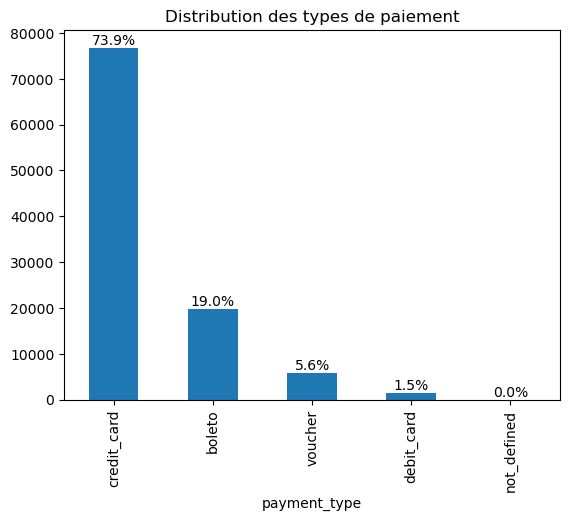

In [80]:
# Distribution des types de paiement
payment_type_counts = order_pymts['payment_type'].value_counts()

# Calcul des pourcentages
total_payments = payment_type_counts.sum()
payment_percentage = (payment_type_counts / total_payments) * 100

# Affichage de la distribution des types de paiement
ax = payment_type_counts.plot(kind='bar', title='Distribution des types de paiement')

# Ajouter les pourcentages sur les barres
for i, (payment_type, v) in enumerate(payment_type_counts.items()):
    ax.text(i, v + 0.5, f'{payment_percentage[payment_type]:.1f}%', ha='center', va='bottom')

# Afficher le graphique
plt.show()

#### Analyse préliminaire: Distribution des paiements par commande et des montants payés

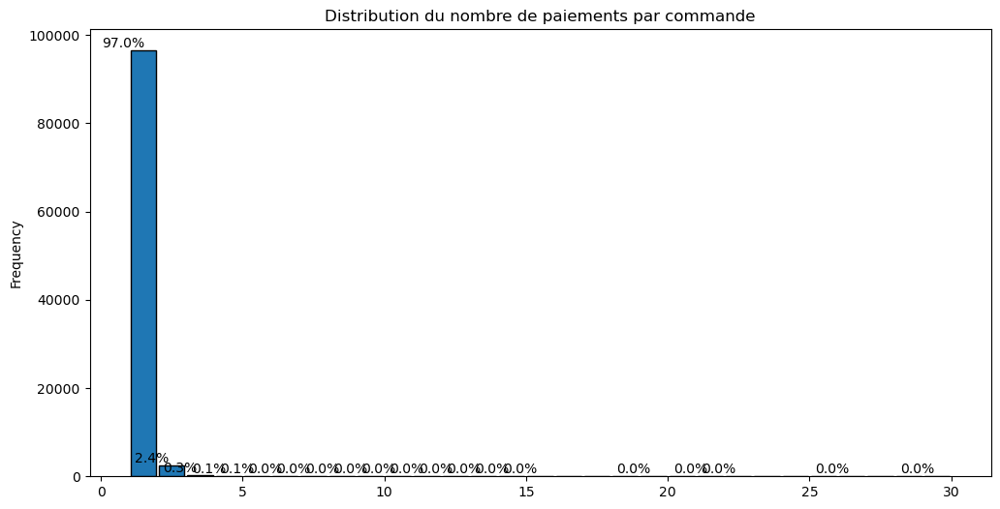

payment_value
1     96479
2      2382
3       301
4       108
5        52
6        36
7        28
8        11
9         9
10        5
11        8
12        8
13        3
14        2
15        2
19        2
21        1
22        1
26        1
29        1
Name: count, dtype: int64


In [84]:
# Nombre de paiements par commande
paiements_par_commande = order_pymts.groupby('order_id')['payment_value'].count()

# Définir la taille du graphique pour qu'il soit plus large
plt.figure(figsize=(12, 6)) 

# Afficher la distribution des paiements par commande (histogramme)
ax = paiements_par_commande.plot(kind='hist', bins=range(1, paiements_par_commande.max() + 2), 
                                 title='Distribution du nombre de paiements par commande', edgecolor='black', rwidth=0.9)

# Afficher les pourcentages sur les barres
# Nombre total de paiements
total_paiements = paiements_par_commande.sum() 

# Comptage des paiements par nombre de paiements par commande
paiements_counts = paiements_par_commande.value_counts().sort_index() 

for i, (nb_paiements, count) in enumerate(paiements_counts.items()):
    percentage = (count / len(paiements_par_commande)) * 100  # Pourcentage de commandes ayant ce nombre de paiements
    ax.text(nb_paiements - 0.2, count + 0.5, f'{percentage:.1f}%', ha='center', va='bottom')

# Afficher le graphique
plt.show()

# Afficher les statistiques de la distribution
print(paiements_counts)

In [88]:
order_pymts['payment_value'].describe()

count    103886.000000
mean        154.100380
std         217.494064
min           0.000000
25%          56.790000
50%         100.000000
75%         171.837500
max       13664.080000
Name: payment_value, dtype: float64

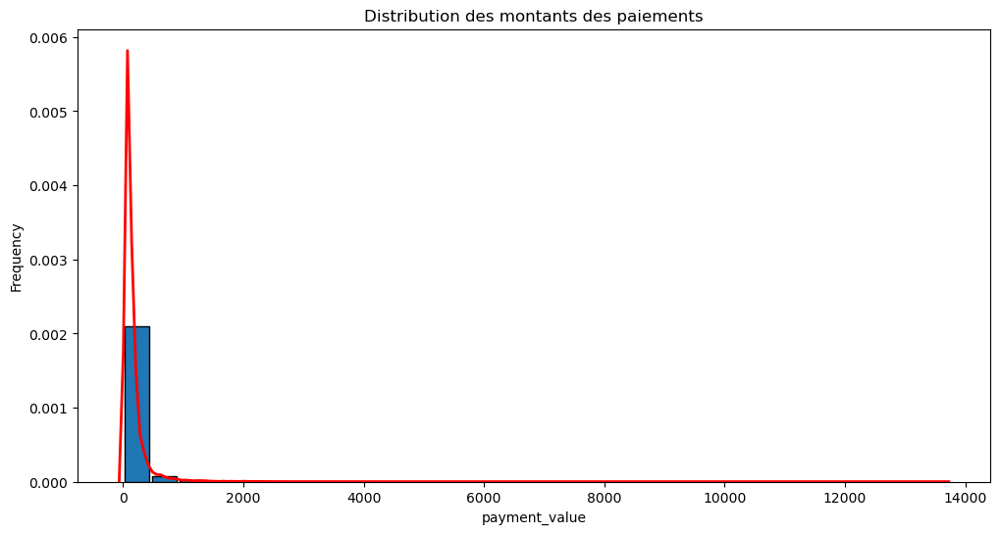

In [89]:
# Distribution des montants des paiements
plt.figure(figsize=(12, 6))  # Ajustez la taille du graphique

# Afficher la distribution des paiements
ax = order_pymts['payment_value'].plot(
    kind='hist', 
    bins=30, 
    edgecolor='black', 
    rwidth=0.9, 
    density=True, 
    title='Distribution des montants des paiements'
)

# Ajouter une courbe de densité normale
sns.kdeplot(order_pymts['payment_value'], color='red', lw=2)

# Afficher le graphique
plt.show()

### Table order_reviews

In [14]:
order_reviews.head()

,index,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,None,None,2018-01-18 00:00:00,2018-01-18 21:46:59
1,1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,None,None,2018-03-10 00:00:00,2018-03-11 03:05:13
2,2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,None,None,2018-02-17 00:00:00,2018-02-18 14:36:24
3,3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,None,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,None,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


Cette table contient les avis laissés par les clients sur leurs commandes. Elle inclut l’identifiant de la commande (order_id), une note (review_score), une date de soumission (review_creation_date) et le texte de l’avis (review_comment_message).

| Colonne                | Type     | Description                                    | Valeurs manquantes |
|:-----------------------|:--------|:-----------------------------------------------|:-------------------|
| `review_id`           | `object` | Identifiant unique de l’avis                  | 0 |
| `order_id`           | `object` | Identifiant de la commande                    | 0 |
| `review_score`       | `int64`  | Score attribué par le client (1 à 5)          | 0 |
| `review_comment_title` | `object` | Titre du commentaire (si renseigné)          | Oui |
| `review_comment_message` | `object` | Contenu du commentaire (si renseigné)       | Oui |
| `review_creation_date` | `object` | Date de création de l’avis                   | 0 |
| `review_answer_timestamp` | `object` | Date de réponse du vendeur à l’avis        | 0 |

La table order_reviews contient 99 224 lignes qui représentent des avis individuels laissés par les clients sur leurs commandes. Chaque ligne correspond à un avis unique associé à une commande spécifique, incluant le score attribué, la date de création de l'avis, et éventuellement un commentaire du client et une réponse du vendeur.

La clé primaire de la table order_reviews semble être la combinaison des colonnes review_id et order_id, car chaque avis est associé à un identifiant unique (review_id), mais plusieurs avis peuvent être liés à une même commande (order_id). La combinaison des deux garantit l'unicité de chaque ligne.

#### Vérification des doublons

In [149]:
# Vérifier le nombre de doublons dans la colonne 'review_id'
doublons_review_id = order_reviews['review_id'].duplicated().sum()

# Afficher le résultat
print(f"Il y a {doublons_review_id} doublons dans la colonne 'review_id'.")

Il y a 814 doublons dans la colonne 'review_id'.


In [160]:
# Vérifier le nombre de  review_id  lié à plusieurs order_id
(order_reviews["review_id"].value_counts() > 1).sum()

789

Un commentaire peut etre associé à plusieurs commandes différentes. Il y a 789 review_id qui sont associés à plus d'une commande. Cela peut être des clients ont passé plusieurs commandes et  ont laissé un seul avis pour toutes (ex. un panier fractionné en plusieurs commandes).

In [145]:
# Vérifier le nombre de doublons dans les colonnes review_id et order_id
doublons_specifiques = order_reviews[['review_id', 'order_id']].duplicated().sum()

# Afficher le résultat
print(f"Il y a {doublons_specifiques} doublons basés sur review_id et order_id.")

Il y a 0 doublons basés sur review_id et order_id.


#### Analyse du nombre de valeurs uniques par colonne

In [143]:
# Vérification du nombre de valeurs uniques pour chaque colonne de type 'object'
for col in order_reviews.select_dtypes(include=['object']).columns:
    unique_values = order_reviews[col].nunique()
    print(f"Nombre de valeurs uniques dans la colonne {col} : {unique_values}")

Nombre de valeurs uniques dans la colonne review_id : 98410
Nombre de valeurs uniques dans la colonne order_id : 98673
Nombre de valeurs uniques dans la colonne review_comment_title : 4527
Nombre de valeurs uniques dans la colonne review_comment_message : 36159
Nombre de valeurs uniques dans la colonne review_creation_date : 636
Nombre de valeurs uniques dans la colonne review_answer_timestamp : 98248


review_id : 98 410 valeurs uniques.

order_id : 98 673 valeurs uniques, suggérant que certaines commandes ont plusieurs avis .

review_comment_title : 4 527 titres uniques, indiquant que tous les commentaires n'ont pas de titres.

review_comment_message : 36 159 messages uniques, indicquant que certains avis n'ont pas de messages.

review_creation_date : 636 dates uniques et review_answer_timestamp : 98 248 valeurs uniques, ce qui montre que la majorité des avis ont reçu une réponse mais il sera nécessaire de les convertir en type date pour une meilleure manipulation.

In [147]:
# Compter le nombre d'avis par commande
avis_par_commande = order_reviews.groupby('order_id')['review_id'].count()

# Identifier les commandes avec plusieurs avis
commandes_plusieurs_avis = avis_par_commande[avis_par_commande > 1]

# Afficher le résultat
print(f"Nombre de commandes avec plusieurs avis : {len(commandes_plusieurs_avis)}")

Nombre de commandes avec plusieurs avis : 547


Il y a 547 commandes qui ont plusieurs avis

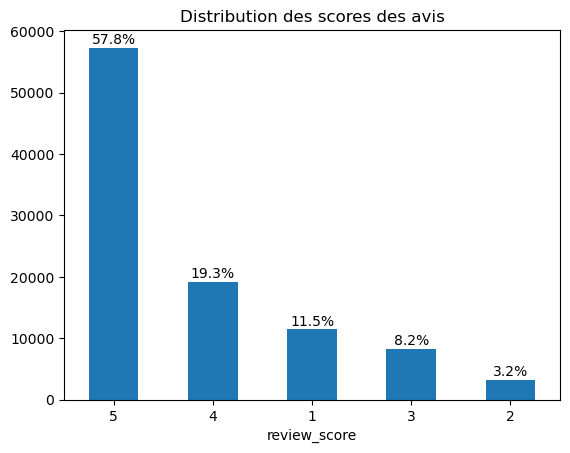

In [78]:
# Distribution des scores des avis
review_scores = order_reviews['review_score'].value_counts()

# Calcul des pourcentages
total_reviews = review_scores.sum()
review_percentage = (review_scores / total_reviews) * 100

# Affichage de la distribution des scores des avis
ax = review_scores.plot(kind='bar', title='Distribution des scores des avis')

# Ajouter les pourcentages sur les barres
for i, (score, v) in enumerate(review_scores.items()):
    ax.text(i, v + 200, f'{review_percentage[score]:.1f}%', ha='center', va='bottom')

# Tourner les labels de l'axe X pour qu'ils soient verticaux
plt.xticks(rotation=0)

# Afficher le graphique
plt.show()

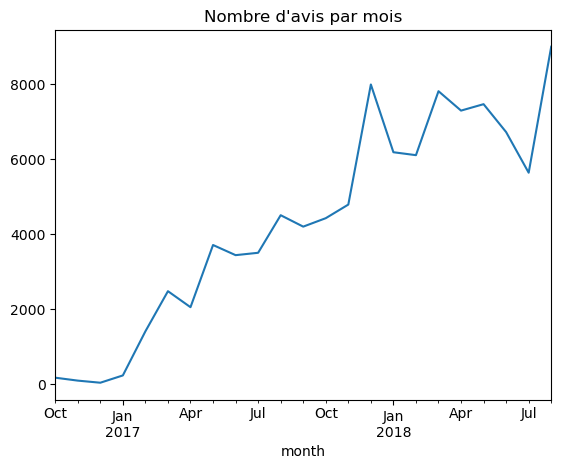

In [71]:
# Distribution des avis dans le temps
order_reviews['review_creation_date'] = pd.to_datetime(order_reviews['review_creation_date'])
order_reviews['month'] = order_reviews['review_creation_date'].dt.to_period('M')
avis_par_mois = order_reviews.groupby('month').size()

# Graphique du nombre d'avis par mois
avis_par_mois.plot(kind='line', title="Nombre d'avis par mois")
plt.show()

### Table orders

In [15]:
orders.head()

,index,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


Cette table liste toutes les commandes passées sur la plateforme. Chaque commande est identifiée par order_id et est associée à un client (customer_id). Elle contient des informations comme la date d’achat (order_purchase_timestamp), les délais de livraison (order_estimated_delivery_date vs. order_delivered_customer_date) et le statut (order_status).

| Colonne                        | Type     | Description                                   | Valeurs manquantes |
|:-------------------------------|:--------|:----------------------------------------------|:-------------------|
| `order_id`                     | `object` | Identifiant unique de la commande            | 0 |
| `customer_id`                  | `object` | Identifiant du client                        | 0 |
| `order_status`                 | `object` | Statut de la commande                        | 0 |
| `order_purchase_timestamp`      | `object` | Date et heure d’achat                        | 0 |
| `order_approved_at`             | `object` | Date d’approbation (si renseigné)           | Oui |
| `order_delivered_carrier_date`  | `object` | Date d’expédition par le transporteur       | Oui |
| `order_delivered_customer_date` | `object` | Date de livraison chez le client            | Oui |
| `order_estimated_delivery_date` | `object` | Date de livraison estimée                   | 0 |

La table orders contient 99 441 lignes, qui représentent les commandes passées sur la plateforme. Chaque ligne correspond à une commande unique, identifiée par order_id. Une même commande peut contenir plusieurs articles, mais elle est enregistrée une seule fois dans cette table.

#### Vérification des doublons

In [161]:
# Vérifier le nombre de doublons dans la colonne 'order_id'
doublons_order_id = orders['order_id'].duplicated().sum()

# Afficher le résultat
print(f"Il y a {doublons_order_id} doublons dans la colonne 'order_id'.")

Il y a 0 doublons dans la colonne 'order_id'.


#### Analyse du nombre de valeurs uniques par colonne

In [162]:
# Vérification du nombre de valeurs uniques pour chaque colonne de type 'object'
for col in orders.select_dtypes(include=['object']).columns:
    unique_values = orders[col].nunique()
    print(f"Nombre de valeurs uniques dans la colonne {col} : {unique_values}")

Nombre de valeurs uniques dans la colonne order_id : 99441
Nombre de valeurs uniques dans la colonne customer_id : 99441
Nombre de valeurs uniques dans la colonne order_status : 8
Nombre de valeurs uniques dans la colonne order_purchase_timestamp : 98875
Nombre de valeurs uniques dans la colonne order_approved_at : 90733
Nombre de valeurs uniques dans la colonne order_delivered_carrier_date : 81018
Nombre de valeurs uniques dans la colonne order_delivered_customer_date : 95664
Nombre de valeurs uniques dans la colonne order_estimated_delivery_date : 459


order_id : 99 441 valeurs uniques (pas de doublons, c'est un identifiant unique pour chaque commande).

customer_id : 99 441 valeurs uniques (chaque commande est associée à un client unique).

order_status : 8 valeurs uniques (différents statuts des commandes).

Colonnes de dates :
order_purchase_timestamp : 98 875 valeurs uniques.

order_approved_at : 90 733 valeurs uniques.

order_delivered_carrier_date : 81 018 valeurs uniques.

order_delivered_customer_date : 95 664 valeurs uniques.

order_estimated_delivery_date : 459 valeurs uniques.

Problème des dates :
Les colonnes liées aux dates ne sont pas au bon format, elles devraient être converties en type datetime pour faciliter les calculs et l'analyse

order_status
delivered      96478
shipped         1107
canceled         625
unavailable      609
invoiced         314
processing       301
created            5
approved           2
Name: count, dtype: int64


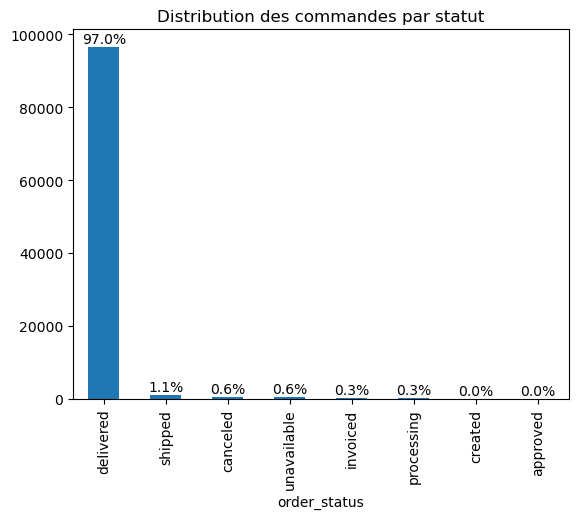

In [57]:
# Distribution des commandes par statut
status_counts = orders['order_status'].value_counts()
print(status_counts)

# Calculer le pourcentage pour chaque statut
status_percentage = status_counts / status_counts.sum() * 100

# Afficher la distribution des commandes par statut
ax = status_counts.plot(kind='bar', title='Distribution des commandes par statut')

# Ajouter les pourcentages sur les barres
for i, v in enumerate(status_counts):
    ax.text(i, v + 200, f'{status_percentage.iloc[i]:.1f}%', ha='center', va='bottom')

# Afficher le graphique
plt.show()

#### Recherche des incohérences

In [27]:
# Compter le nombre de commandes distinctes
nombre_commandes_distinctes = orders['order_id'].nunique()

# Afficher le résultat
print(f"Nombre total de commandes distinctes : {nombre_commandes_distinctes}")

Nombre total de commandes distinctes : 99441


Ici nous avons un nombre différent de commandes distinctes par rapport à la table order_items. Combien?

In [30]:
# Vérifier les commandes dans orders qui n'ont pas d'articles associés dans order_items
commandes_sans_articles = orders[~orders['order_id'].isin(order_items['order_id'])]

# Afficher le nombre de commandes sans articles
print(f"Nombre de commandes sans articles dans order_items : {commandes_sans_articles.shape[0]}")

Nombre de commandes sans articles dans order_items : 775


Comment expliquer cette différence?

In [32]:
# Vérifier les statuts des commandes sans articles
print(commandes_sans_articles['order_status'].value_counts())

order_status
unavailable    603
canceled       164
created          5
invoiced         2
shipped          1
Name: count, dtype: int64


Les 775 commandes sans articles dans order_items semblent correspondre à différentes catégories de statut dans order_status. Voici une analyse possible basée sur les résultats :

- unavailable (603) : Cela pourrait indiquer des commandes qui ont été créées mais dont les articles sont indisponibles, ce qui empêche leur enregistrement dans order_items.

- canceled (164) : Ce sont des commandes annulées, où aucun article n'a été associé.

- created (5) : Ces commandes ont été créées, mais les articles ne sont peut-être pas encore associés (cela pourrait être une situation temporaire).

- invoiced (2) : Ces commandes ont été facturées, mais il semble qu'il n'y ait pas d'articles enregistrés pour elles.

- shipped (1) : Une seule commande a été expédiée sans article associé, ce qui semble étrange mais peut-être dû à une erreur de données.

In [34]:
commandes_incoherentes = commandes_sans_articles[commandes_sans_articles['order_status'].isin(['invoiced', 'shipped'])]
commandes_incoherentes.head()

,index,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
23254,23254,a68ce1686d536ca72bd2dadc4b8671e5,d7bed5fac093a4136216072abaf599d5,shipped,2016-10-05 01:47:40,2016-10-07 03:11:22,2016-11-07 16:37:37,None,2016-12-01 00:00:00
57591,57591,2ce9683175cdab7d1c95bcbb3e36f478,b2d7ae0415dbbca535b5f7b38056dd1f,invoiced,2016-10-05 21:03:33,2016-10-06 07:46:39,None,None,2016-11-25 00:00:00
69926,69926,e04f1da1f48bf2bbffcf57b9824f76e1,0d00d77134cae4c58695086ad8d85100,invoiced,2016-10-05 13:22:20,2016-10-06 15:51:38,None,None,2016-11-29 00:00:00


Commande avec statut shipped (index 23254) :
- Le statut shipped indique que la commande a été expédiée par le transporteur.
- La colonne order_delivered_customer_date est None, ce qui signifie que la commande n'a pas encore été livrée au client.

Cependant, il est étrange qu'une commande expédiée n'ait aucun article associé dans la table order_items. Cela peut indiquer :
- Une erreur dans la base de données (les articles n'ont pas été enregistrés).
- Une commande fantôme ou un problème technique.

Commandes avec statut invoiced (index 57591 et 69926) :
- Les deux commandes ont le statut invoiced, ce qui signifie qu'elles ont été facturées.
- Les colonnes order_delivered_carrier_date et order_delivered_customer_date sont toutes deux None, ce qui indique que ces commandes n'ont pas encore été expédiées ou livrées.

L'absence d'articles associés dans la table order_items est problématique, car une commande facturée devrait normalement inclure des articles.
Hypothèses pour ces anomalies :
- Erreur dans les données :
Les articles associés à ces commandes n'ont pas été correctement enregistrés dans la table order_items.
Cela pourrait être dû à un problème technique ou une incohérence lors de l'importation des données.
- Commandes fantômes :
Ces commandes pourraient être des enregistrements fantômes créés par erreur ou pour des tests, sans intention réelle de traitement.
- Traitement incomplet :
Ces commandes pourraient être en cours de traitement, mais les articles n'ont pas encore été ajoutés à la table order_items.

In [36]:
# Sélection des paiements associés à des commandes incohérentes
commandes_incoherentes_ids = [
    'a68ce1686d536ca72bd2dadc4b8671e5',
    '2ce9683175cdab7d1c95bcbb3e36f478',
    'e04f1da1f48bf2bbffcf57b9824f76e1'
]

df_payments_incoherents = order_pymts[order_pymts['order_id'].isin(commandes_incoherentes_ids)]
df_payments_incoherents.head()

,index,order_id,payment_sequential,payment_type,payment_installments,payment_value
75617,75617,2ce9683175cdab7d1c95bcbb3e36f478,1,boleto,1,73.04
88900,88900,a68ce1686d536ca72bd2dadc4b8671e5,1,boleto,1,77.73
99415,99415,e04f1da1f48bf2bbffcf57b9824f76e1,1,credit_card,7,76.19


Commande (index 75617) :
- La commande a été payée via le mode de paiement boleto.
- Le paiement a été effectué en une seule fois (payment_installments = 1) pour un montant total de 73.04.
Cela confirme que cette commande a été facturée (invoiced) et payée, mais elle n'a pas d'articles associés dans la table order_items.

Commande (index 88900) :
- Cette commande a également été payée via le mode de paiement boleto.
- Le paiement a été effectué en une seule fois (payment_installments = 1) pour un montant total de 77.73.
Le statut de cette commande est shipped, ce qui indique qu'elle a été expédiée, mais elle n'a pas d'articles associés dans la table order_items. Cela semble être une incohérence.

Commande (index 99415) :
- Cette commande a été payée via carte de crédit (credit_card).
- Le paiement a été effectué en 7 versements (payment_installments = 7) pour un montant total de 76.19.
Le statut de cette commande est invoiced, ce qui indique qu'elle a été facturée, mais elle n'a pas d'articles associés dans la table order_items. Cela semble être une incohérence similaire aux autres cas.


Hypothèses sur ces commandes :
- Paiement effectué sans articles enregistrés :
Ces commandes ont des paiements associés, ce qui indique qu'elles ont été traitées financièrement.
Cependant, l'absence d'articles dans la table order_items pourrait indiquer une erreur ou un problème dans le processus d'enregistrement des articles.
- Commandes fantômes ou tests :
Ces commandes pourraient avoir été créées pour des tests ou par erreur, avec des paiements enregistrés mais sans articles.
- Traitement incomplet :
Ces commandes pourraient être en cours de traitement, mais les articles n'ont pas encore été ajoutés à la table order_items.

In [37]:
commandes_ids = [
    '2ce9683175cdab7d1c95bcbb3e36f478', 
    'a68ce1686d536ca72bd2dadc4b8671e5', 
    'e04f1da1f48bf2bbffcf57b9824f76e1'
]

df_reviews_incoherents = order_reviews[order_reviews['order_id'].isin(commandes_ids)]
df_reviews_incoherents.head()

,index,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
23544,23544,17bc0bc3207616ee37afd4a39b10054a,2ce9683175cdab7d1c95bcbb3e36f478,1,None,"meu produto não chegou ,prazo de entrega de 34...",2016-11-27 00:00:00,2016-12-04 00:03:47
58565,58565,5a4f0fe15c7a914e40cabe9a06d81513,e04f1da1f48bf2bbffcf57b9824f76e1,1,None,"Até agora não recebi o produto, e já foi desco...",2016-12-01 00:00:00,2016-12-03 11:24:52
74430,74430,b399a4b417fc794a814ef957423bd67a,a68ce1686d536ca72bd2dadc4b8671e5,1,None,Comprei o produto dia 06/10/2016 hj é 15/12/20...,2016-12-07 00:00:00,2016-12-15 19:57:06


Les avis montrent une forte insatisfaction (note de 1) en raison du non-respect des délais ou de l'absence totale de livraison.
Ces commandes présentent des anomalies importantes : elles ont été facturées ou expédiées, mais aucun article n'a été livré au client. Les avis clients confirment ces problèmes, avec des commentaires négatifs et des notes très basses. 

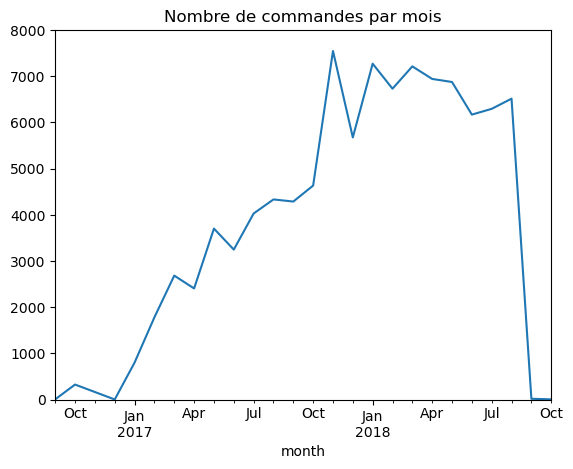

In [59]:
# Distribution des commandes dans le temps (par mois par exemple)
orders['order_purchase_timestamp'] = pd.to_datetime(orders['order_purchase_timestamp'])
orders['month'] = orders['order_purchase_timestamp'].dt.to_period('M')
commandes_par_mois = orders.groupby('month').size()

# Afficher le graphique des commandes par mois
commandes_par_mois.plot(kind='line', title='Nombre de commandes par mois')

# Ajuster la limite de l'axe des ordonnées
plt.ylim(0, 8000)

# Afficher le graphique
plt.show()

### Table products

In [16]:
products.head()

,index,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


Elle contient des informations sur les produits vendus sur la plateforme. Chaque produit a un product_id et est décrit par sa catégorie (product_category_name), ses dimensions (product_length_cm, product_height_cm, etc.), ainsi que son poids (product_weight_g).

| Colonne                    | Type     | Description                                   | Valeurs manquantes |
|:---------------------------|:--------|:----------------------------------------------|:-------------------|
| `product_id`               | `object` | Identifiant unique du produit                 | 0 |
| `product_category_name`    | `object` | Catégorie du produit                         | Oui |
| `product_name_length`      | `float64` | Longueur du nom du produit                   | Oui |
| `product_description_length` | `float64` | Longueur de la description                  | Oui |
| `product_photos_qty`       | `float64` | Nombre de photos associées                   | Oui |
| `product_weight_g`         | `float64` | Poids du produit en grammes                   | Oui |
| `product_length_cm`        | `float64` | Longueur du produit en cm                     | Oui |
| `product_height_cm`        | `float64` | Hauteur du produit en cm                      | Oui |
| `product_width_cm`         | `float64` | Largeur du produit en cm                      | Oui |

La table products contient 32 951 lignes qui représentent des produits vendus sur la plateforme. Chaque ligne correspond à un produit distinct, identifié par product_id. Certains produits peuvent ne pas avoir de catégorie ou d'informations complètes sur leurs dimensions et poids.

product_photos_qty représente le nombre de photos, il est logique de le convertir en int64, car le nombre de photos ne peut être qu'un entier. Cela permettra de réduire l'utilisation de la mémoire, puisque int64 est plus léger pour les entiers que float64.

#### Vérification des doublons

In [163]:
# Vérifier les doublons dans la colonne product_id
doublons_product_id = products['product_id'].duplicated().sum()
print(f"Nombre de doublons dans la colonne 'product_id' : {doublons_product_id}")

Nombre de doublons dans la colonne 'product_id' : 0


#### Recherche des valeurs incohérentes

In [164]:
products.describe()

,index,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
count,32951.000000,32341.000000,32341.000000,32341.000000,32949.000000,32949.000000,32949.000000,32949.000000
mean,16475.000000,48.476949,771.495285,2.188986,2276.472488,30.815078,16.937661,23.196728
std,9512.278697,10.245741,635.115225,1.736766,4282.038731,16.914458,13.637554,12.079047
min,0.000000,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000
25%,8237.500000,42.000000,339.000000,1.000000,300.000000,18.000000,8.000000,15.000000
50%,16475.000000,51.000000,595.000000,1.000000,700.000000,25.000000,13.000000,20.000000
75%,24712.500000,57.000000,972.000000,3.000000,1900.000000,38.000000,21.000000,30.000000
max,32950.000000,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000


Valeurs suspectes: product_weight_g = 0 (indique peut-être des produits sans poids renseigné).

In [168]:
# Identifier les produits avec un poids nul
poids_nuls = products[products["product_weight_g"] == 0]
print(f"Produits avec poids nul : {len(poids_nuls)}")

# Afficher la liste complète des produits avec un poids nul
poids_nuls

Produits avec poids nul : 4


,index,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
9769,9769,81781c0fed9fe1ad6e8c81fca1e1cb08,cama_mesa_banho,51.0,529.0,1.0,0.0,30.0,25.0,30.0
13683,13683,8038040ee2a71048d4bdbbdc985b69ab,cama_mesa_banho,48.0,528.0,1.0,0.0,30.0,25.0,30.0
14997,14997,36ba42dd187055e1fbe943b2d11430ca,cama_mesa_banho,53.0,528.0,1.0,0.0,30.0,25.0,30.0
32079,32079,e673e90efa65a5409ff4196c038bb5af,cama_mesa_banho,53.0,528.0,1.0,0.0,30.0,25.0,30.0


Les produits appartiennent à la catégorie cama_mesa_banho ("lit, table, bain" en portugais).
Le fait que ces produits aient des dimensions physiques mais un poids à zéro suggère qu'il pourrait y avoir une erreur de saisie pour ces articles. Ce n'est pas normal que des produits avec des dimensions aient un poids nul. Il est possible que ce soit des erreurs dans la base de données ou des produits mal catégorisés.

#### Nombre de valeurs uniques des colonnes catégorielles

In [45]:
# Calculer le nombre de catégories distinctes
nombre_categories_distinctes = products['product_category_name'].nunique()

# Afficher le résultat
print(f"Nombre de catégories distinctes : {nombre_categories_distinctes}")

Nombre de catégories distinctes : 73


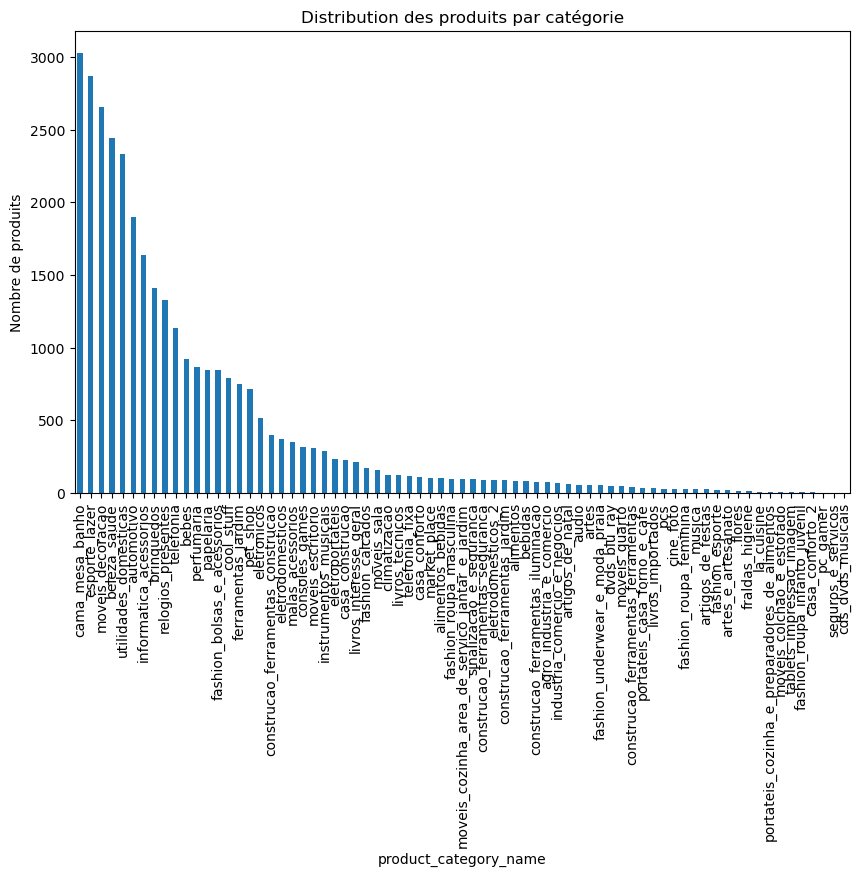

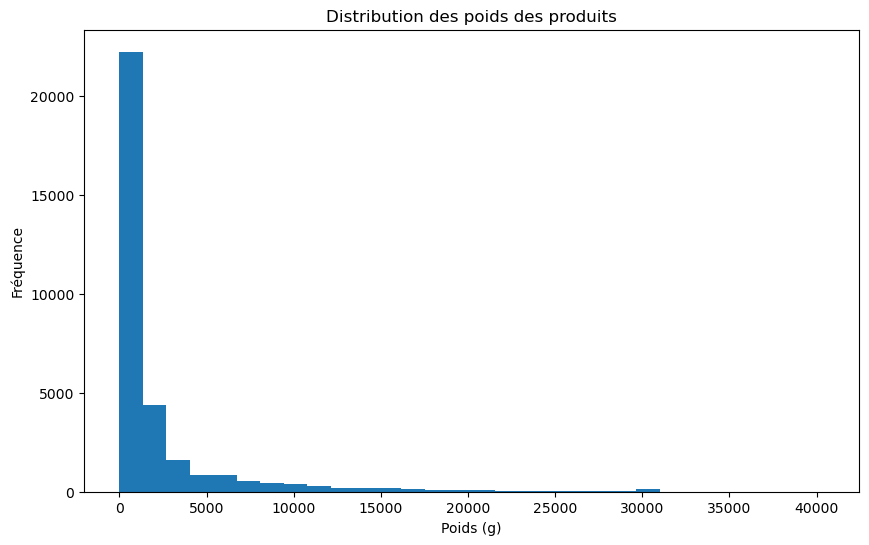

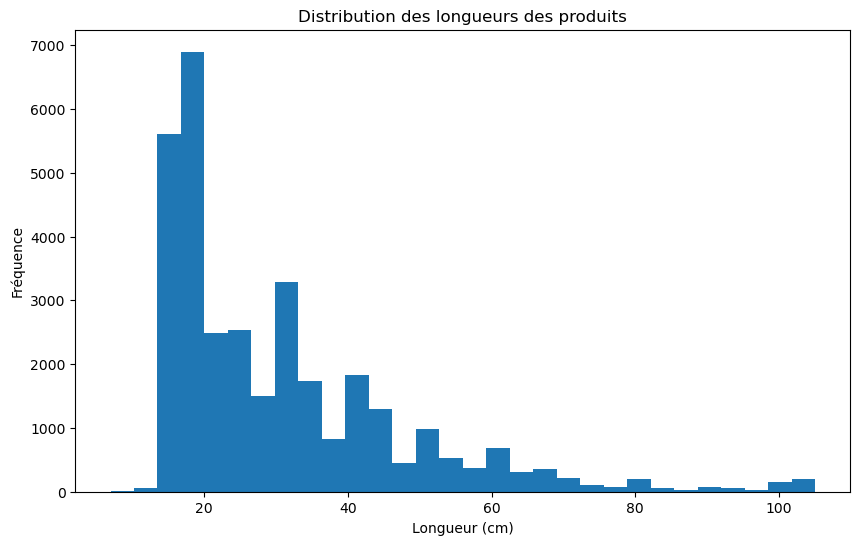

In [61]:
# Distribution des produits par catégorie
category_counts = products['product_category_name'].value_counts()

# Afficher la distribution des produits par catégorie
plt.figure(figsize=(10, 6))  # Ajuster la taille de la figure
category_counts.plot(kind='bar', title='Distribution des produits par catégorie')
plt.xticks(rotation=90)  # Faire pivoter les étiquettes de l'axe x
plt.ylabel('Nombre de produits')  # Ajouter un label à l'axe y
plt.show()

# Distribution des poids des produits
plt.figure(figsize=(10, 6))  # Ajuster la taille de la figure
products['product_weight_g'].plot(kind='hist', bins=30, title='Distribution des poids des produits')
plt.xlabel('Poids (g)')  # Ajouter un label à l'axe x
plt.ylabel('Fréquence')  # Ajouter un label à l'axe y
plt.show()

# Distribution des longueurs des produits
plt.figure(figsize=(10, 6))  # Ajuster la taille de la figure
products['product_length_cm'].plot(kind='hist', bins=30, title='Distribution des longueurs des produits')
plt.xlabel('Longueur (cm)')  # Ajouter un label à l'axe x
plt.ylabel('Fréquence')  # Ajouter un label à l'axe y
plt.show()

Il y a un nombre important de catégories de produits (73 au total), ce qui rend la distribution assez dispersée et difficile à analyser de manière efficace. Afin de simplifier l'analyse et d'obtenir des insights plus clairs, il serait pertinent de regrouper certaines catégories similaires. Par exemple, des catégories étroitement liées ou des sous-catégories pourraient être combinées pour offrir une vue d'ensemble plus cohérente et mieux exploitable. Cela permettrait de réduire la complexité et d'avoir des informations plus ciblées sur les principales catégories de produits présentes sur la plateforme.

In [62]:
# Liste des catégories distinctes dans la colonne 'product_category_name'
categories_distinctes = products['product_category_name'].unique()

# Afficher les catégories
print(categories_distinctes)

['perfumaria' 'artes' 'esporte_lazer' 'bebes' 'utilidades_domesticas'
 'instrumentos_musicais' 'cool_stuff' 'moveis_decoracao'
 'eletrodomesticos' 'brinquedos' 'cama_mesa_banho'
 'construcao_ferramentas_seguranca' 'informatica_acessorios'
 'beleza_saude' 'malas_acessorios' 'ferramentas_jardim'
 'moveis_escritorio' 'automotivo' 'eletronicos' 'fashion_calcados'
 'telefonia' 'papelaria' 'fashion_bolsas_e_acessorios' 'pcs'
 'casa_construcao' 'relogios_presentes'
 'construcao_ferramentas_construcao' 'pet_shop' 'eletroportateis'
 'agro_industria_e_comercio' None 'moveis_sala' 'sinalizacao_e_seguranca'
 'climatizacao' 'consoles_games' 'livros_interesse_geral'
 'construcao_ferramentas_ferramentas' 'fashion_underwear_e_moda_praia'
 'fashion_roupa_masculina'
 'moveis_cozinha_area_de_servico_jantar_e_jardim'
 'industria_comercio_e_negocios' 'telefonia_fixa'
 'construcao_ferramentas_iluminacao' 'livros_tecnicos'
 'eletrodomesticos_2' 'artigos_de_festas' 'bebidas' 'market_place'
 'la_cuisine' 'cons

### Table sellers

In [17]:
sellers.head()

,index,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


Cette table liste les vendeurs actifs sur la plateforme. Chaque vendeur est identifié par seller_id et a des informations géographiques associées (seller_zip_code_prefix, seller_city, seller_state).

| Colonne                    | Type     | Description                                  | Valeurs manquantes |
|:---------------------------|:--------|----------------------------------------------|:-------------------|
| `seller_id`                | `object` | Identifiant unique du vendeur               | 0 |
| `seller_zip_code_prefix`   | `int64`  | Préfixe du code postal du vendeur           | 0 |
| `seller_city`              | `object` | Ville du vendeur                            | 0 |
| `seller_state`             | `object` | État du vendeur                             | 0 |

La table sellers contient 3095 lignes qui représentent des vendeurs uniques enregistrés sur la plateforme. Chaque ligne correspond à un vendeur distinct, identifié par seller_id, avec des informations géographiques permettant d’analyser leur répartition sur le territoire.

#### Vérification des doublons

In [172]:
# Vérifier les doublons dans la colonne product_id
doublons_sellers = sellers['seller_id'].duplicated().sum()
print(f"Nombre de doublons dans la colonne 'sellers_id' : {doublons_sellers}")

Nombre de doublons dans la colonne 'sellers_id' : 0


#### Convertion des types

In [173]:
# Conversion de la colonne 'geolocation_zip_code_prefix' en type string (chaîne de caractères)
sellers['seller_zip_code_prefix'] = sellers['seller_zip_code_prefix'].astype(str)

# Vérification du type de la colonne après conversion
print(sellers['seller_zip_code_prefix'].dtype)

object


#### Nombre de valeurs uniques des colonnes catégorielles

In [174]:
# Vérification du nombre de valeurs uniques pour chaque colonne de type 'object'
for col in sellers.select_dtypes(include=['object']).columns:
    unique_values = sellers[col].nunique()
    print(f"Nombre de valeurs uniques dans la colonne {col} : {unique_values}")

Nombre de valeurs uniques dans la colonne seller_id : 3095
Nombre de valeurs uniques dans la colonne seller_zip_code_prefix : 2246
Nombre de valeurs uniques dans la colonne seller_city : 611
Nombre de valeurs uniques dans la colonne seller_state : 23


seller_id : Chaque vendeur est unique, pas de doublons.

seller_zip_code_prefix : 2246 préfixes différents, ce qui signifie que plusieurs vendeurs peuvent être dans le même secteur géographique.

seller_city : 611 villes différentes, certaines ayant plusieurs vendeurs.

seller_state : 23 états différents, ce qui montre une couverture géographique répartie sur tout le territoire.

### Table translation

In [18]:
translation.head()

,index,product_category_name,product_category_name_english
0,0,beleza_saude,health_beauty
1,1,informatica_acessorios,computers_accessories
2,2,automotivo,auto
3,3,cama_mesa_banho,bed_bath_table
4,4,moveis_decoracao,furniture_decor


Cette table sert à traduire les catégories de produits du portugais vers l'anglais. Elle associe chaque nom de catégorie (product_category_name) à sa version traduite (product_category_name_english).

| Colonne                    | Type     | Description                                  | Valeurs manquantes |
|:---------------------------|:--------|----------------------------------------------|:-------------------|
| `product_category_name`    | `object` | Nom de la catégorie du produit en portugais | 0 |
| `product_category_name_english` | `object` | Nom de la catégorie du produit en anglais  | 0 |

La table translation contient 71 lignes qui représentent les différentes catégories de produits disponibles sur la plateforme, avec leur nom en portugais et leur traduction en anglais. Chaque ligne correspond à une catégorie unique.

#### Vérification des doublons

In [175]:
# Vérifier les doublons dans la colonne product_id
doublons_translation = translation['product_category_name'].duplicated().sum()
print(f"Nombre de doublons dans la colonne 'product_category_name' : {doublons_sellers}")

Nombre de doublons dans la colonne 'product_category_name' : 0


#### Identification des catégories sans traduction dans le jeu de données "products"

In [46]:
# Récupérer les catégories distinctes dans chaque table
categories_products = products['product_category_name'].unique()
categories_translation = translation['product_category_name'].unique()

# Trouver les catégories présentes dans products mais pas dans translation
categories_sans_translation = set(categories_products) - set(categories_translation)

# Afficher les résultats
print(f"Catégories présentes dans 'products' mais pas dans 'translation' : {categories_sans_translation}")
print(f"Nombre de catégories sans traduction : {len(categories_sans_translation)}")

Catégories présentes dans 'products' mais pas dans 'translation' : {None, 'pc_gamer', 'portateis_cozinha_e_preparadores_de_alimentos'}
Nombre de catégories sans traduction : 3


Les résultats montrent que 3 catégories présentes dans la table products ne sont pas traduites dans la table translation. 
- None : Cela signifie qu'il y a des produits sans catégorie spécifiée (dans la table products).
- pc_gamer : Cette catégorie semble correspondre à des produits liés aux ordinateurs pour gamers.
- portateis_cozinha_e_preparadores_de_alimentos : Cette catégorie semble correspondre à des appareils portatifs de cuisine et préparateurs d'aliments..

## Conclusion

Notre analyse exploratoire des différentes tables du jeu de données a mis en évidence plusieurs axes d'amélioration et de nettoyage des données :

**Problèmes de qualité des données**
- Certaines valeurs incohérentes ont été détectées, notamment pour le poids des articles (poids nul).
- Des valeurs manquantes ont été identifiées dans plusieurs colonnes et devront être traitées.

**Transformations et conversions nécessaires**
- Dates : Les colonnes shipping_limit_date, review_creation_date, review_answer_timestamp, etc., doivent être converties en format datetime pour permettre des analyses temporelles précises.
- Codes postaux : La colonne seller_zip_code_prefix nécessite une conversion et potentiellement un mapping géographique plus détaillé.
- Quantité de photos : La colonne product_photos_qty doit être convertie en int64 après imputation des valeurs manquantes.

**Problèmes liés aux catégories et correspondances entre tables**
- Certaines catégories de produits présentes dans la table products ne disposent pas de traduction dans la table translation, ce qui peut compliquer l’interprétation des données.
- Les catégories de produits sont parfois trop spécifiques ou redondantes. Il est nécessaire de regrouper certaines catégories similaires pour simplifier les analyses et obtenir des insights plus clairs.

**Prochaines étapes**
- Nettoyage des données : traiter les valeurs aberrantes et manquantes pour assurer la cohérence des analyses.
- Conversions et transformations : appliquer les modifications nécessaires aux formats des colonnes (dates, codes postaux, types numériques).
- Harmonisation des catégories : corriger les incohérences entre les tables products et translation, et regrouper les catégories de produits pour simplifier l’analyse.

Ces actions garantiront une meilleure qualité des données avant d’entamer des analyses avancées.

# Valeurs manquantes

## Table orders

In [177]:
orders.isnull().sum()

index                               0
order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

### order_approved_at

**order_approved_at (160 valeurs manquantes)**: Cette colonne indique la date d'approbation du paiement.<br>
Si cette valeur est manquante, cela peut signifier que :
- La commande n'a pas encore été approuvée.
- Il s'agit d'une anomalie dans les données (commande annulée ou erreur technique)

In [178]:
missing_approved = orders[orders['order_approved_at'].isnull()]
print(missing_approved['order_status'].value_counts())

order_status
canceled     141
delivered     14
created        5
Name: count, dtype: int64


**Commandes annulées (canceled)** :<br>
La majorité des valeurs manquantes (141 sur 160) sont liées à des commandes annulées.<br>

**Commandes livrées (delivered)** :<br>
Il est surprenant que certaines commandes livrées (14 cas) n'aient pas de date d'approbation.<br>
Cela pourrait indiquer une anomalie dans le processus de gestion des données :<br>

**Commandes créées (created)** :<br>
Les 5 commandes créées mais non approuvées sont cohérentes avec l'absence de date d'approbation.<br>


Dans le cadre de cette analyse, nous avons décidé de ne conserver que les commandes avec le statut delivered, car elles représentent des transactions complètes et réussies. Les autres statuts (shipped, processing, canceled, etc.) concernent des commandes incomplètes ou annulées, ce qui les rend moins pertinentes pour une segmentation basée sur le comportement client. Cela garantit une cohérence des données et évite d'introduire du bruit ou des biais dans nos analyses.

In [181]:
# Identifier les commandes livrées sans date d'approbation
delivered_missing_approval = orders[(orders['order_status'] == 'delivered') & (orders['order_approved_at'].isnull())]

# Afficher le nombre de commandes concernées
print(f"Nombre de commandes livrées sans date d'approbation : {len(delivered_missing_approval)}")

# Afficher un aperçu des données concernées
delivered_missing_approval[['order_id', 'order_approved_at', 'order_purchase_timestamp', 'order_delivered_customer_date']]

Nombre de commandes livrées sans date d'approbation : 14


,order_id,order_approved_at,order_purchase_timestamp,order_delivered_customer_date
5323,e04abd8149ef81b95221e88f6ed9ab6a,None,2017-02-18 14:40:00,2017-03-01 13:25:33
16567,8a9adc69528e1001fc68dd0aaebbb54a,None,2017-02-18 12:45:31,2017-03-02 10:05:06
19031,7013bcfc1c97fe719a7b5e05e61c12db,None,2017-02-18 13:29:47,2017-03-01 08:07:38
22663,5cf925b116421afa85ee25e99b4c34fb,None,2017-02-18 16:48:35,2017-03-09 07:28:47
23156,12a95a3c06dbaec84bcfb0e2da5d228a,None,2017-02-17 13:05:55,2017-03-02 11:09:19
26800,c1d4211b3dae76144deccd6c74144a88,None,2017-01-19 12:48:08,2017-01-30 18:16:01
38290,d69e5d356402adc8cf17e08b5033acfb,None,2017-02-19 01:28:47,2017-03-02 03:41:58
39334,d77031d6a3c8a52f019764e68f211c69,None,2017-02-18 11:04:19,2017-03-02 16:15:23
48401,7002a78c79c519ac54022d4f8a65e6e8,None,2017-01-19 22:26:59,2017-02-06 14:22:19
61743,2eecb0d85f281280f79fa00f9cec1a95,None,2017-02-17 17:21:55,2017-03-03 12:16:03


Ces commandes ont une date d'achat (order_purchase_timestamp) et une date de livraison au client (order_delivered_customer_date) cohérentes, ce qui indique que le processus de commande a été correctement complété.

La date d'approbation du paiement (order_approved_at) est probablement très proche, voire identique à la date d'achat (order_purchase_timestamp). En effet, dans un contexte e-commerce, l'approbation du paiement est souvent réalisée immédiatement après l'achat.

Pour corriger cette anomalie et éviter des valeurs manquantes dans les analyses futures, nous proposons d'imputer les valeurs manquantes de order_approved_at avec celles de order_purchase_timestamp.

### order_delivered_carrier_date

**order_delivered_carrier_date (1 783 valeurs manquantes)** :Cette colonne représente la date à laquelle la commande a été remise au transporteur.

Si cette valeur est manquante, cela peut signifier que :
- La commande n'a pas encore été expédiée.
- La commande a été annulée avant expédition.

In [182]:
missing_carrier = orders[orders['order_delivered_carrier_date'].isnull()]
print(missing_carrier['order_status'].value_counts())

order_status
unavailable    609
canceled       550
invoiced       314
processing     301
created          5
approved         2
delivered        2
Name: count, dtype: int64


**Commandes annulées (canceled) et non disponibles (unavailable)** :<br>
Ces statuts expliquent naturellement l'absence de date dans order_delivered_carrier_date. Ces lignes peuvent être exclues des analyses si elles ne sont pas pertinentes.

**Commandes facturées (invoiced) et en traitement (processing)** :<br>
Ces commandes sont probablement en attente d'expédition, ce qui justifie l'absence de date de remise au transporteur.

**Commandes livrées (delivered)** :<br>
Les 2 cas où le statut est delivered mais sans date de remise au transporteur nécessitent une analyse approfondie pour vérifier la cohérence des autres colonnes (par exemple, order_delivered_customer_date).

In [187]:
missing_carrier_delivered = missing_carrier[
    missing_carrier['order_status'] == 'delivered'
]

colonnes = [
    'order_id',
    'order_delivered_carrier_date',
    'order_purchase_timestamp',
    'order_delivered_customer_date',
    'order_status'
]

missing_carrier_delivered[colonnes]

,order_id,order_delivered_carrier_date,order_purchase_timestamp,order_delivered_customer_date,order_status
73222,2aa91108853cecb43c84a5dc5b277475,None,2017-09-29 08:52:58,2017-11-20 19:44:47,delivered
92643,2d858f451373b04fb5c984a1cc2defaf,None,2017-05-25 23:22:43,None,delivered


**Commande 73222 :**<br>
- La commande a été achetée le 29 septembre 2017 et livrée au client le 20 novembre 2017.
- Bien que la date de remise au transporteur (order_delivered_carrier_date) soit absente, la livraison au client (order_delivered_customer_date) est renseignée, ce qui indique que la commande a été complétée.
- L'absence de la date de remise au transporteur pourrait être une erreur d'enregistrement dans les données.

**Commande 92643 :**<br>
- La commande a été achetée le 25 mai 2017, mais la date de livraison au client (order_delivered_customer_date) est absente.
- Cela pourrait indiquer une anomalie dans les données : le statut est marqué comme delivered, mais aucune preuve de livraison n'est disponible.

In [191]:
order_id = "2d858f451373b04fb5c984a1cc2defaf"

# Vérifier si cette commande a des articles associés
items_info = order_items[order_items['order_id'] == order_id]

# Vérifier si un paiement a été effectué
payment_info = order_pymts[order_pymts['order_id'] == order_id]

# Afficher les résultats
items_info

,index,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
19838,19838,2d858f451373b04fb5c984a1cc2defaf,1,30b5b5635a79548a48d04162d971848f,f9bbdd976532d50b7816d285a22bd01e,2017-06-04 23:30:16,179.0,15.0


Elle a bien un article dans order_items

Produit : 30b5b5635a79548a48d04162d971848f

Vendeur : f9bbdd976532d50b7816d285a22bd01e

Date limite d'expédition : 2017-06-04

Prix : 179.0 BRL

Frais de livraison : 15.0 BRL

In [192]:
payment_info

,index,order_id,payment_sequential,payment_type,payment_installments,payment_value
47287,47287,2d858f451373b04fb5c984a1cc2defaf,1,credit_card,4,194.0


Elle a bien un paiement dans order_payments

Méthode : Carte de crédit

Montant total payé : 194.0 BRL

Paiement en 4 fois

In [193]:
order_reviews[order_reviews['order_id'] == "2d858f451373b04fb5c984a1cc2defaf"]

,index,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
51996,51996,4e755f114e50d33b9ac6a56e0d7d3ea9,2d858f451373b04fb5c984a1cc2defaf,5,None,None,2017-06-25 00:00:00,2017-06-27 01:49:04


Un avis a été laissé pour cette commande !
- Score donné : 5/5
- Date de création de l’avis : 25 juin 2017
- Date de réponse du vendeur : 27 juin 2017
- Pas de commentaire écrit, mais la note est excellente.

La commande a bien été livrée 
L'absence de order_delivered_carrier_date et order_delivered_customer_date est donc une erreur d'enregistrement.

**Stratégie de correction possible :** <br>
- Imputer order_delivered_customer_date avec la date de l’avis (25 juin 2017) → si le client a laissé un avis, c’est qu’il a bien reçu sa commande.
- Pour les imputations de order_delivered_carrier_date, nous ne l’imputons pas pour le moment et nous évaluerons plus tard si cela est nécessaire en fonction de l’analyse.

### order_delivered_customer_date

**order_delivered_customer_date (2 965 valeurs manquantes)** :Cette colonne indique la date de livraison au client.

Si cette valeur est manquante, cela peut signifier que :
- La commande n'a pas encore été livrée.
- La commande a été annulée ou n'a jamais atteint le client.

In [183]:
missing_customer = orders[orders['order_delivered_customer_date'].isnull()]
print(missing_customer['order_status'].value_counts())

order_status
shipped        1107
canceled        619
unavailable     609
invoiced        314
processing      301
delivered         8
created           5
approved          2
Name: count, dtype: int64


Ici, on a 2 965 commandes sans date de livraison au client. En regardant les statuts, on remarque :
- shipped 1 107: Ces commandes ont été expédiées mais n'ont pas de date de livraison. Cela indique soit une erreur de saisie, soit une livraison non finalisée.
- canceled	619: Ces commandes ont été annulées avant livraison → L'absence de date est normale.
- unavailable	609	Ces commandes ne sont pas disponibles → L'absence de date est cohérente.
- invoiced	314	: Facturées mais pas encore expédiées → Pas de livraison prévisible.
- processing	301: 	En cours de traitement → Logique que la date soit manquante.
- delivered	8:	Anomalie : Le statut est delivered sans date de livraison. À corriger.
- created	5:	Commandes créées mais non finalisées → Cohérent.
- approved	2:	Commandes approuvées mais non expédiées → Cohérent.

In [196]:
delivered_missing = orders[
    (orders["order_status"] == "delivered") &
    (orders["order_delivered_customer_date"].isnull())
]

colonnes = [
    "order_id",
    "order_purchase_timestamp",
    "order_delivered_carrier_date",
    "order_delivered_customer_date"
]

delivered_missing[colonnes]

,order_id,order_purchase_timestamp,order_delivered_carrier_date,order_delivered_customer_date
3002,2d1e2d5bf4dc7227b3bfebb81328c15f,2017-11-28 17:44:07,2017-11-30 18:12:23,None
20618,f5dd62b788049ad9fc0526e3ad11a097,2018-06-20 06:58:43,2018-06-25 08:05:00,None
43834,2ebdfc4f15f23b91474edf87475f108e,2018-07-01 17:05:11,2018-07-03 13:57:00,None
79263,e69f75a717d64fc5ecdfae42b2e8e086,2018-07-01 22:05:55,2018-07-03 13:57:00,None
82868,0d3268bad9b086af767785e3f0fc0133,2018-07-01 21:14:02,2018-07-03 09:28:00,None
92643,2d858f451373b04fb5c984a1cc2defaf,2017-05-25 23:22:43,None,None
97647,ab7c89dc1bf4a1ead9d6ec1ec8968a84,2018-06-08 12:09:39,2018-06-12 14:10:00,None
98038,20edc82cf5400ce95e1afacc25798b31,2018-06-27 16:09:12,2018-07-03 19:26:00,None


Commandes avec date de remise au transporteur (order_delivered_carrier_date) :

Les commandes suivantes ont une date de remise au transporteur mais pas de date de livraison au client :

3002, 20618, 43834, 79263, 82868, 97647, 98038.

Cela pourrait indiquer que la livraison finale n'a pas été enregistrée correctement dans la base de données.

Commande sans date de remise au transporteur ni de livraison (92643) : Déja vue <br>
Imputer order_delivered_customer_date avec la date de l’avis (25 juin 2017) → si le client a laissé un avis, c’est qu’il a bien reçu sa commande.

In [202]:
order_ids = ["2d1e2d5bf4dc7227b3bfebb81328c15f", 
             "f5dd62b788049ad9fc0526e3ad11a097",
             "2ebdfc4f15f23b91474edf87475f108e",
             "e69f75a717d64fc5ecdfae42b2e8e086",
             "0d3268bad9b086af767785e3f0fc0133",
             "ab7c89dc1bf4a1ead9d6ec1ec8968a84",
             "20edc82cf5400ce95e1afacc25798b31"]

for order_id in order_ids:
    print(f"Analyse de la commande {order_id}")
    
    # Vérifier les articles associés
    items_info = order_items[order_items['order_id'] == order_id]
    print("Articles associés :")
    print(items_info)

    # Vérifier si un paiement a été effectué
    payment_info = order_pymts[order_pymts['order_id'] == order_id]
    print("Paiement associé :")
    print(payment_info)

    # Vérifier si un avis a été laissé
    review_info = order_reviews[order_reviews['order_id'] == order_id]
    print("Avis client :")
    print(review_info)

    print("-" * 80)  # Séparateur entre chaque commande

Analyse de la commande 2d1e2d5bf4dc7227b3bfebb81328c15f
Articles associés :
       index                          order_id  order_item_id  \
19642  19642  2d1e2d5bf4dc7227b3bfebb81328c15f              1   

                             product_id                         seller_id  \
19642  a50acd33ba7a8da8e9db65094fa990a4  8581055ce74af1daba164fdbd55a40de   

       shipping_limit_date  price  freight_value  
19642  2017-12-04 17:56:40  117.3          17.53  
Paiement associé :
       index                          order_id  payment_sequential  \
16949  16949  2d1e2d5bf4dc7227b3bfebb81328c15f                   1   

      payment_type  payment_installments  payment_value  
16949  credit_card                     3         134.83  
Avis client :
       index                         review_id  \
86011  86011  f48c6c944a5d52dcca8ac5c4ec417cf2   

                               order_id  review_score review_comment_title  \
86011  2d1e2d5bf4dc7227b3bfebb81328c15f             5              

6 commandes sur 7 ont eu une note de 5/5, ce qui indique une satisfaction élevée.

Une seule commande (ab7c89dc1bf4a1ead9d6ec1ec8968a84) a une note de 1/5 pour cause de produit incorrect mais elle bel et bien été livrée

Toutes ces commandes ont donc été livrées avec succès, y compris celle avec un problème de produit.
Nous pouvons raisonnablement estimer que la commande a été livrée au plus tard à la date du commentaire.

Ainsi, pour les commandes avec une date de livraison manquante mais disposant d'un commentaire, nous imputons la date de livraison en utilisant la date du commentaire correspondant. Cette approche permet de compléter les données de manière cohérente tout en préservant la logique du processus de commande et de réception des produits

## Table order_reviews

In [203]:
order_reviews.isnull().sum()

index                          0
review_id                      0
order_id                       0
review_score                   0
review_comment_title       87656
review_comment_message     58247
review_creation_date           0
review_answer_timestamp        0
dtype: int64

Les valeurs manquantes dans les colonnes review_comment_title et review_comment_message ne nécessitent pas d'imputation, car leur absence représente une information exploitable. En effet, le fait qu'un client n'ait pas laissé de commentaire est une donnée significative qui peut être utilisée pour comprendre son comportement ou son niveau de satisfaction.

Pour mieux exploiter cette information, nous pouvons envisager d'ajouter une colonne supplémentaire, nommée a_commenté, qui indiquera si le client a laissé un commentaire ou non. Cette colonne binaire permettra de différencier explicitement les avis accompagnés de commentaires des avis sans commentaire, tout en conservant les valeurs manquantes dans les colonnes existantes. Cela garantit que l'absence de commentaire reste identifiable et exploitable dans nos analyses.

## Table products

In [204]:
products.isnull().sum()

index                           0
product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

**Imputation des colonnes numériques** <br>
Pour les colonnes numériques (product_name_lenght, product_description_lenght, etc.), on peut utiliser une imputation par :
- Moyenne si les données sont normalement distribuées.
- Médiane si les données contiennent des valeurs extrêmes (distribution asymétrique).

**Imputation de la colonne catégorique (product_category_name)**<br>
Pour product_category_name, on peut imputer par "Autre", afin de regrouper les produits dont la catégorie n'est pas renseignée sous une catégorie générique. Cela permet de conserver ces lignes dans les données tout en évitant d'introduire un biais en leur attribuant une catégorie incorrecte ou trop fréquente. Cette approche garantit que les produits sans catégorie restent exploitables dans les analyses, tout en simplifiant leur interprétation.

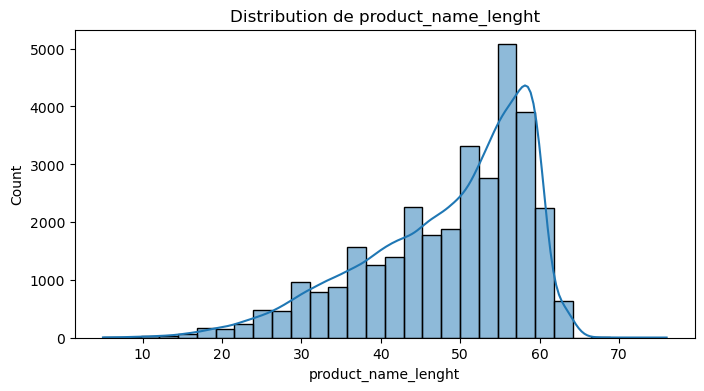

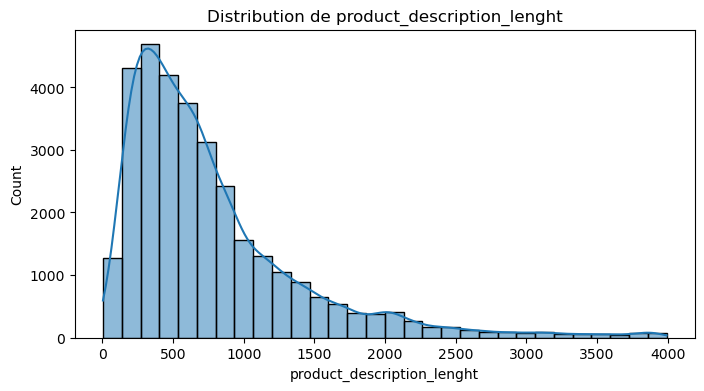

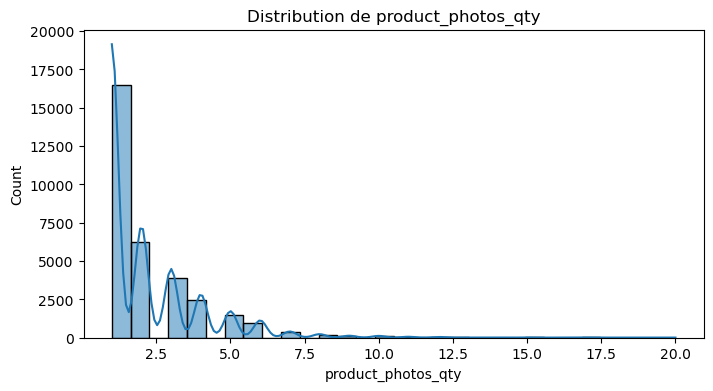

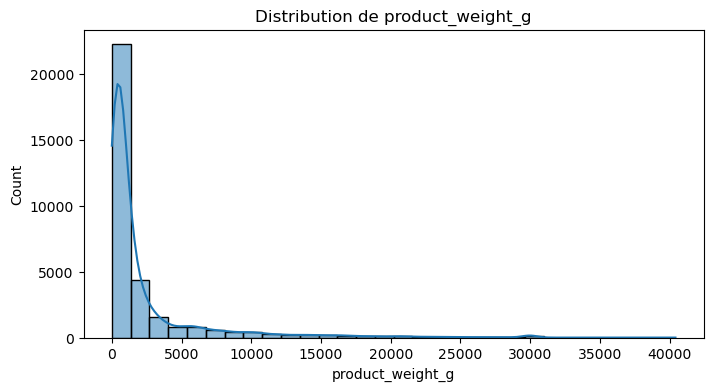

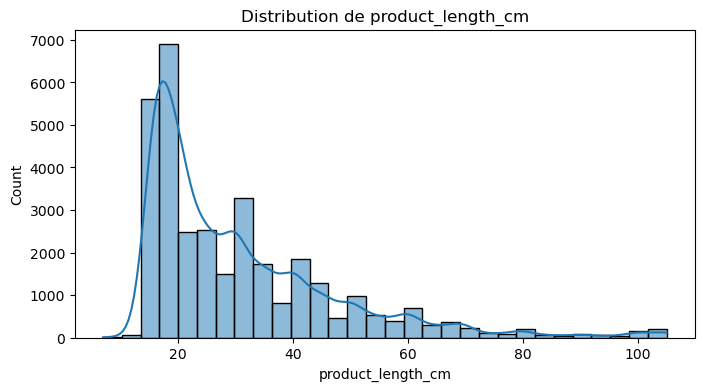

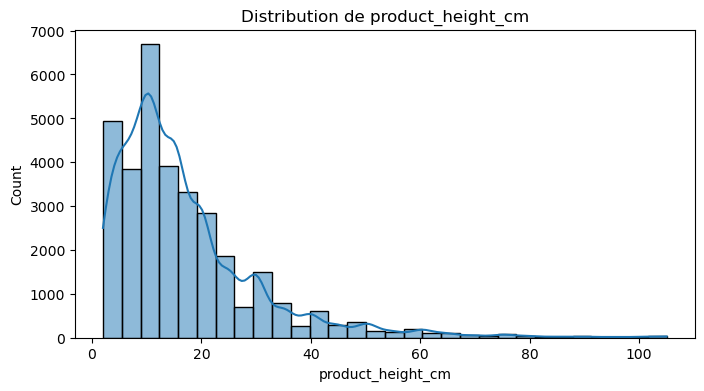

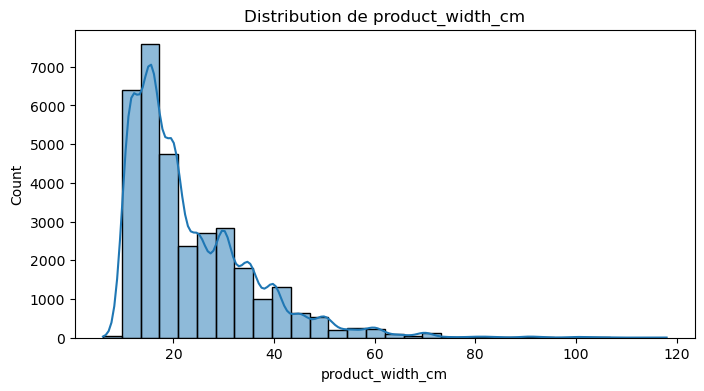

In [205]:
# Liste des colonnes numériques à analyser
numeric_columns = [
    'product_name_lenght', 'product_description_lenght', 'product_photos_qty',
    'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm'
]

# Visualiser les distributions avec des histogrammes
for column in numeric_columns:
    plt.figure(figsize=(8, 4))
    sns.histplot(products[column], kde=True, bins=30)
    plt.title(f'Distribution de {column}')
    plt.show()

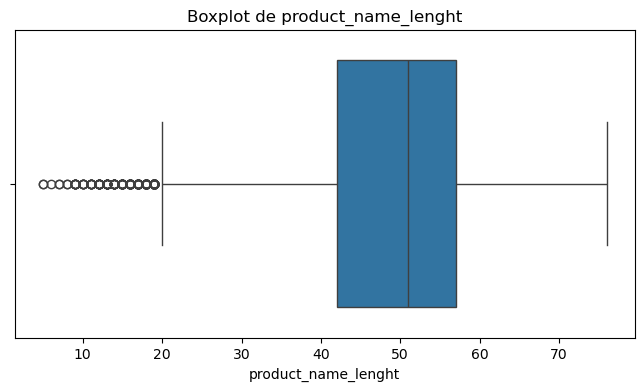

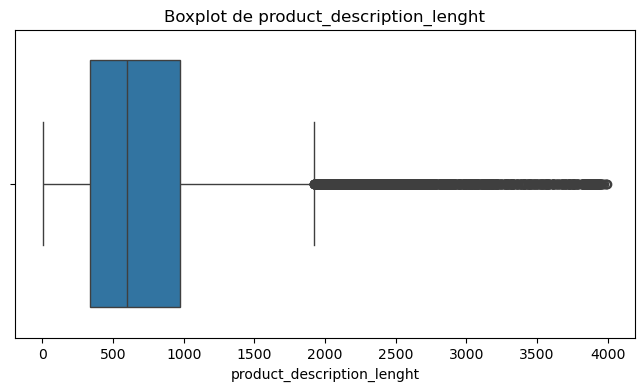

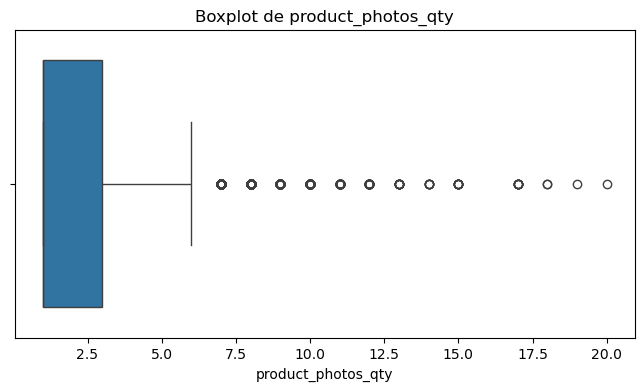

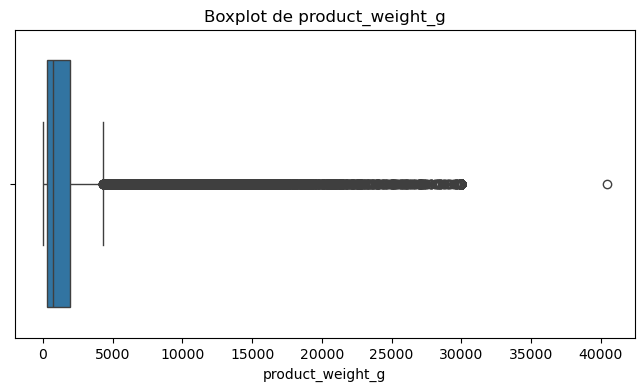

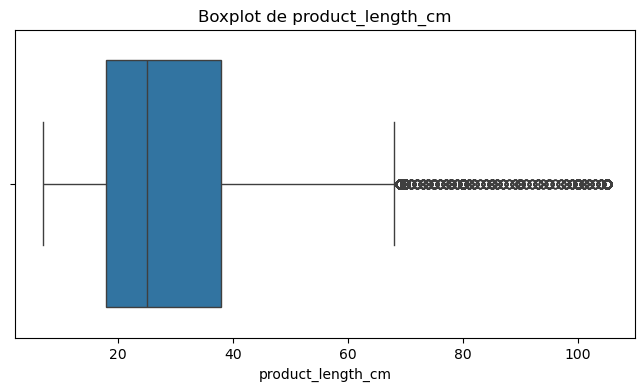

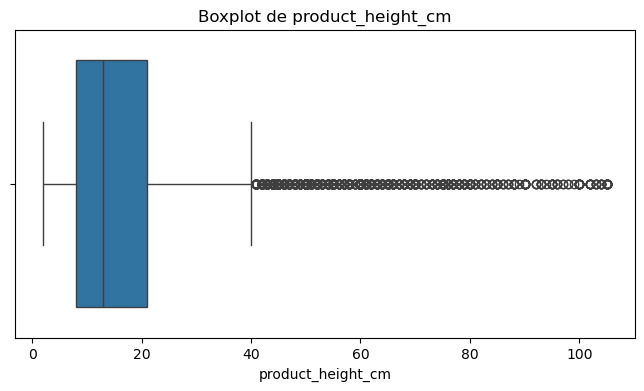

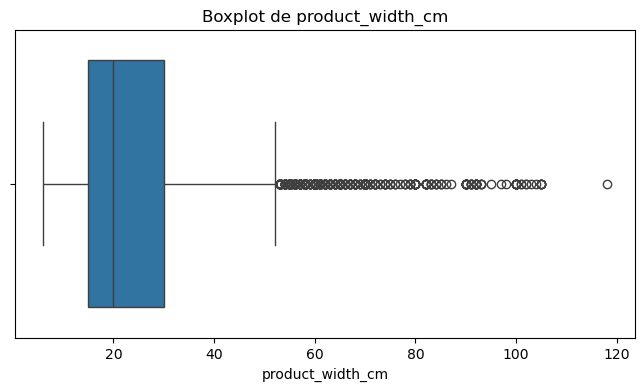

In [207]:
# Visualiser les outliers avec des boxplots
for column in numeric_columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=products[column])
    plt.title(f'Boxplot de {column}')
    plt.show()

In [206]:
# Afficher les statistiques descriptives pour les colonnes numériques
products[numeric_columns].describe()

,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
count,32341.000000,32341.000000,32341.000000,32949.000000,32949.000000,32949.000000,32949.000000
mean,48.476949,771.495285,2.188986,2276.472488,30.815078,16.937661,23.196728
std,10.245741,635.115225,1.736766,4282.038731,16.914458,13.637554,12.079047
min,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000
25%,42.000000,339.000000,1.000000,300.000000,18.000000,8.000000,15.000000
50%,51.000000,595.000000,1.000000,700.000000,25.000000,13.000000,20.000000
75%,57.000000,972.000000,3.000000,1900.000000,38.000000,21.000000,30.000000
max,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000


Après analyse des données numériques (product_name_lenght, product_description_lenght, product_photos_qty, product_weight_g, product_length_cm, product_height_cm, product_width_cm), nous avons constaté que :

Les distributions sont asymétriques, comme le montrent les statistiques descriptives (écarts significatifs entre la moyenne et la médiane, ainsi que des valeurs extrêmes).

La présence d'outliers a été confirmée par les boxplots, avec des valeurs très élevées (par exemple, product_weight_g allant jusqu'à 40 425 g).

Dans ce contexte, l'utilisation de la médiane pour imputer les valeurs manquantes est plus appropriée que la moyenne. La médiane est robuste face aux valeurs extrêmes et reflète mieux la tendance centrale des données dans des distributions asymétriques. Cela permet d'éviter que les outliers n'influencent excessivement les imputations, garantissant ainsi une meilleure cohérence des données.

# Nettoyage des données

## Fonction de changement des types

In [5]:
def convertir_types(orders, products, geoloc, order_items, order_reviews, customers, sellers):
    """
    Convertit les types des colonnes, renomme certaines colonnes en français et supprime les colonnes originales.
    
    Args:
        orders (DataFrame): Table des commandes.
        products (DataFrame): Table des produits.
        geolocation (DataFrame): Table de géolocalisation.
    
    Returns:
        Tuple(DataFrame, DataFrame, DataFrame): Tables modifiées (orders, products, geolocation).
    """
    
    # Conversion des colonnes de dates en format datetime avec noms français
    orders['date_achat'] = pd.to_datetime(orders['order_purchase_timestamp'], errors='coerce')
    orders['date_livraison_estimee'] = pd.to_datetime(orders['order_estimated_delivery_date'], errors='coerce')
    orders['date_livraison_reelle'] = pd.to_datetime(orders['order_delivered_customer_date'], errors='coerce')
    orders['date_approbation'] = pd.to_datetime(orders['order_approved_at'], errors='coerce')
    orders['date_expedition_transporteur'] = pd.to_datetime(orders['order_delivered_carrier_date'], errors='coerce')
    
    # Conversion des autres colonnes de dates
    order_items['date_limite_expedition'] = pd.to_datetime(order_items['shipping_limit_date'], errors='coerce')
    order_reviews['date_creation_commentaire'] = pd.to_datetime(order_reviews['review_creation_date'], errors='coerce')
    order_reviews['date_reponse_commentaire'] = pd.to_datetime(order_reviews['review_answer_timestamp'], errors='coerce')
    
    # Supprimer les colonnes originales en anglais
    orders = orders.drop(columns=[
        'order_purchase_timestamp', 'order_estimated_delivery_date', 
        'order_delivered_customer_date', 'order_approved_at', 
        'order_delivered_carrier_date'
    ])
    order_reviews = order_reviews.drop(columns=['review_creation_date', 'review_answer_timestamp'])
    order_items = order_items.drop(columns=['shipping_limit_date'])
    
    # Conversion des codes postaux en type string pour éviter les erreurs
    customers['customer_code_postal'] = customers['customer_zip_code_prefix'].astype(str)
    geoloc['code_postal_geolocalisation'] = geoloc['geolocation_zip_code_prefix'].astype(str)
    sellers['vendeur_code_postal'] = sellers['seller_zip_code_prefix'].astype(str)
    
    # Supprimer les colonnes originales des codes postaux
    customers = customers.drop(columns=['customer_zip_code_prefix'])
    geoloc = geoloc.drop(columns=['geolocation_zip_code_prefix'])
    sellers = sellers.drop(columns=['seller_zip_code_prefix'])
    
    # Conversion de la quantité de photos en int64 dans products
    products['product_photos_qty'] = products['product_photos_qty'].astype('int64')
    
    # Retourner les tables modifiées
    return orders, products, geoloc, order_items, order_reviews, customers, sellers

In [6]:
orders_cleaned, products_cleaned, geoloc_cleaned, order_items_cleaned, \
order_reviews_cleaned, customers_cleaned, sellers_cleaned = convertir_types(
    orders, products, geoloc, order_items, order_reviews, customers, sellers
)

In [7]:
orders_cleaned.head()

,index,order_id,customer_id,order_status,date_achat,date_livraison_estimee,date_livraison_reelle,date_approbation,date_expedition_transporteur
0,0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-18,2017-10-10 21:25:13,2017-10-02 11:07:15,2017-10-04 19:55:00
1,1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-08-13,2018-08-07 15:27:45,2018-07-26 03:24:27,2018-07-26 14:31:00
2,2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-09-04,2018-08-17 18:06:29,2018-08-08 08:55:23,2018-08-08 13:50:00
3,3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-12-15,2017-12-02 00:28:42,2017-11-18 19:45:59,2017-11-22 13:39:59
4,4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-26,2018-02-16 18:17:02,2018-02-13 22:20:29,2018-02-14 19:46:34


In [8]:
orders_cleaned.dtypes

index                                    int64
order_id                                object
customer_id                             object
order_status                            object
date_achat                      datetime64[ns]
date_livraison_estimee          datetime64[ns]
date_livraison_reelle           datetime64[ns]
date_approbation                datetime64[ns]
date_expedition_transporteur    datetime64[ns]
dtype: object

In [9]:
print(orders_cleaned.isnull().sum())  

index                              0
order_id                           0
customer_id                        0
order_status                       0
date_achat                         0
date_livraison_estimee             0
date_livraison_reelle           2965
date_approbation                 160
date_expedition_transporteur    1783
dtype: int64


In [10]:
products_cleaned.dtypes

index                           int64
product_id                     object
product_category_name          object
product_name_lenght           float64
product_description_lenght    float64
product_photos_qty            float64
product_weight_g              float64
product_length_cm             float64
product_height_cm             float64
product_width_cm              float64
dtype: object

In [11]:
print(products_cleaned.isnull().sum())# Vérifier les valeurs manquantes dans products

index                           0
product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64


In [12]:
geoloc_cleaned.dtypes

index                            int64
geolocation_lat                float64
geolocation_lng                float64
geolocation_city                object
geolocation_state               object
code_postal_geolocalisation     object
dtype: object

In [13]:
order_items_cleaned.dtypes

index                              int64
order_id                          object
order_item_id                      int64
product_id                        object
seller_id                         object
price                            float64
freight_value                    float64
date_limite_expedition    datetime64[ns]
dtype: object

In [14]:
order_reviews_cleaned.dtypes

index                                 int64
review_id                            object
order_id                             object
review_score                          int64
review_comment_title                 object
review_comment_message               object
date_creation_commentaire    datetime64[ns]
date_reponse_commentaire     datetime64[ns]
dtype: object

In [15]:
customers_cleaned.dtypes

index                    int64
customer_id             object
customer_unique_id      object
customer_city           object
customer_state          object
customer_code_postal    object
dtype: object

In [16]:
sellers_cleaned.dtypes

index                   int64
seller_id              object
seller_city            object
seller_state           object
vendeur_code_postal    object
dtype: object

## Fonction de complétion des Nan et de remplacement des valeurs incohérentes

In [17]:
def nettoyage_imputation(products, orders):
    """
    Nettoie et impute les données des tables products et orders.
    
    Args:
        products (DataFrame): Table des produits.
        orders (DataFrame): Table des commandes.
    
    Returns:
        Tuple(DataFrame, DataFrame): Tables nettoyées (products, orders).
    """
    
    # Étape 1 : Remplacer les poids nuls par NaN dans products
    products.loc[products['product_weight_g'] == 0, 'product_weight_g'] = np.nan
    
    # Étape 2 : Imputer order_approved_at avec order_purchase_timestamp pour les commandes spécifiques
    order_ids_to_impute = [
        'e04abd8149ef81b95221e88f6ed9ab6a', '8a9adc69528e1001fc68dd0aaebbb54a',
        '7013bcfc1c97fe719a7b5e05e61c12db', '5cf925b116421afa85ee25e99b4c34fb',
        '12a95a3c06dbaec84bcfb0e2da5d228a', 'c1d4211b3dae76144deccd6c74144a88',
        'd69e5d356402adc8cf17e08b5033acfb', 'd77031d6a3c8a52f019764e68f211c69',
        '7002a78c79c519ac54022d4f8a65e6e8', '2eecb0d85f281280f79fa00f9cec1a95',
        '51eb2eebd5d76a24625b31c33dd41449', '88083e8f64d95b932164187484d90212',
        '3c0b8706b065f9919d0505d3b3343881', '2babbb4b15e6d2dfe95e2de765c97bce'
    ]
    orders.loc[
        (orders['order_id'].isin(order_ids_to_impute)) & (orders['date_approbation'].isnull()),
        'date_approbation'
    ] = orders['date_achat']
    
    # Étape 3 : Imputer order_delivered_customer_date pour des commandes spécifiques
    customer_date_imputations = {
        "2d1e2d5bf4dc7227b3bfebb81328c15f": "2017-12-19",
        "2ebdfc4f15f23b91474edf87475f108e": "2018-07-11",
        "e69f75a717d64fc5ecdfae42b2e8e086": "2018-07-07",
        "0d3268bad9b086af767785e3f0fc0133": "2018-07-06",
        "ab7c89dc1bf4a1ead9d6ec1ec8968a84": "2018-06-16",
        "20edc82cf5400ce95e1afacc25798b31": "2018-07-06",
        "f5dd62b788049ad9fc0526e3ad11a097": "2018-06-29",
        "2d858f451373b04fb5c984a1cc2defaf": "2017-06-25"
    }
    for order_id, date in customer_date_imputations.items():
        orders.loc[orders['order_id'] == order_id, 'date_livraison_reelle'] = date
    
    # Étape 4 : Imputer les colonnes numériques par la médiane dans products
    numeric_columns = [
        'product_name_lenght', 'product_description_lenght', 
        'product_photos_qty', 'product_weight_g', 
        'product_length_cm', 'product_height_cm', 
        'product_width_cm'
    ]
    for column in numeric_columns:
        products.loc[:, column] = products[column].fillna(products[column].median())
    
    # Étape 5 : Imputer product_category_name par "Autre"
    products.loc[:, 'product_category_name'] = products['product_category_name'].fillna('Autre')
    
    # Retourner les tables nettoyées
    return products, orders

In [18]:
# Nettoyer et imputer les données
products_cleaned, orders_cleaned = nettoyage_imputation(products_cleaned, orders_cleaned)

# Vérifier les résultats
print(products_cleaned.isnull().sum())# Vérifier les valeurs manquantes dans products
print("---------------------------")
print(orders_cleaned.isnull().sum())    # Vérifier les valeurs manquantes dans orders

index                         0
product_id                    0
product_category_name         0
product_name_lenght           0
product_description_lenght    0
product_photos_qty            0
product_weight_g              0
product_length_cm             0
product_height_cm             0
product_width_cm              0
dtype: int64
---------------------------
index                              0
order_id                           0
customer_id                        0
order_status                       0
date_achat                         0
date_livraison_estimee             0
date_livraison_reelle           2957
date_approbation                 146
date_expedition_transporteur    1783
dtype: int64


## Fonction de regroupement des catégories

In [19]:
def ajouter_categories_manquantes(translation):
    """
    Ajoute les catégories manquantes à la table translation.
    Les catégories manquantes sont 'pc_gamer' et 'portateis_cozinha_e_preparadores_de_alimentos'.
    
    Paramètre :
    translation (pd.DataFrame) : DataFrame contenant les colonnes 'product_category_name' 
    et 'product_category_name_english'.
    
    Retourne :
    pd.DataFrame : DataFrame avec les nouvelles catégories ajoutées.
    """
    # Création des nouvelles lignes pour les catégories manquantes
    categories_manquantes = pd.DataFrame({
        'product_category_name': ['pc_gamer', 'portateis_cozinha_e_preparadores_de_alimentos', 'Autre'],
        'product_category_name_english': ['PC Gamer', 'Portable kitchen appliances and food processors', 'Autre']
    })
    
    # Ajouter ces nouvelles lignes au DataFrame de translation existant
    translation = pd.concat([translation, categories_manquantes], ignore_index=True)
    
    return translation

In [20]:
translation_cleaned = ajouter_categories_manquantes(translation)
translation_cleaned.shape

(74, 3)

In [21]:
categorie_mapping  = {
    
# Mode_Habillement 
    'fashion_bolsas_e_acessorios': 'Mode_Habillement',
    'fashion_calcados': 'Mode_Habillement',
    'fashion_roupa_masculina': 'Mode_Habillement',
    'fashion_underwear_e_moda_praia': 'Mode_Habillement',
    'fashion_esporte': 'Mode_Habillement',
    'fashion_roupa_feminina': 'Mode_Habillement',
    'fashion_roupa_infanto_juvenil': 'Mode_Habillement',
    
# Maison_Mobilier 
    'moveis_decoracao': 'Maison_Mobilier',
    'moveis_sala': 'Maison_Mobilier',
    'moveis_escritorio': 'Maison_Mobilier',
    'moveis_cozinha_area_de_servico_jantar_e_jardim': 'Maison_Mobilier',
    'moveis_quarto': 'Maison_Mobilier',
    'moveis_colchao_e_estofado': 'Maison_Mobilier',
    'portateis_cozinha_e_preparadores_de_alimentos': 'Maison_Mobilier',
    'cama_mesa_banho': 'Maison_Mobilier',
    'utilidades_domesticas': 'Maison_Mobilier',
    
# Electronique_Informatique 
    'informatica_acessorios': 'Electronique_Informatique',
    'eletronicos': 'Electronique_Informatique',
    'pcs': 'Electronique_Informatique',
    'tablets_impressao_imagem': 'Electronique_Informatique',
    'telefonia': 'Electronique_Informatique',
    'telefonia_fixa': 'Electronique_Informatique',
    'portateis_casa_forno_e_cafe': 'Electronique_Informatique',
    'consoles_games': 'Electronique_Informatique',
    'pc_gamer': 'Electronique_Informatique',
    'eletroportateis': 'Electronique_Informatique',
    'audio': 'Electronique_Informatique',
    'eletrodomesticos': 'Electronique_Informatique',
    'eletrodomesticos_2': 'Electronique_Informatique',
    
# Divertissement 
    'esporte_lazer': 'Divertissement',
    'instrumentos_musicais': 'Divertissement',
    'musica': 'Divertissement',
    'cds_dvds_musicais': 'Divertissement',
    'dvds_blu_ray': 'Divertissement',
    'cine_foto': 'Divertissement',
    'artes': 'Divertissement',
    'livros_tecnicos': 'Divertissement',
    'livros_importados': 'Divertissement',
    'livros_interesse_geral': 'Divertissement',
    'artes_e_artesanato': 'Divertissement',
    'papelaria': 'Divertissement',
    
# Alimentation_Boissons 
    'alimentos_bebidas': 'Alimentation_Boissons',
    'alimentos': 'Alimentation_Boissons',
    'bebidas': 'Alimentation_Boissons',
    'la_cuisine': 'Alimentation_Boissons',
    
# Maison_Jardin 
    'casa_construcao': 'Maison_Jardin',
    'casa_conforto': 'Maison_Jardin',
    'casa_conforto_2': 'Maison_Jardin',
    'construcao_ferramentas_seguranca': 'Maison_Jardin',
    'construcao_ferramentas_construcao': 'Maison_Jardin',
    'construcao_ferramentas_ferramentas': 'Maison_Jardin',
    'construcao_ferramentas_iluminacao': 'Maison_Jardin',
    'construcao_ferramentas_jardim': 'Maison_Jardin',
    
# Automobile    
    'automotivo': 'Automobile',
    'climatizacao': 'Automobile',
    
# Sante_Beaute 
    'beleza_saude': 'Sante_Beaute',
    'perfumaria': 'Sante_Beaute',
    'fraldas_higiene': 'Sante_Beaute',
    
# Bebe_Enfants 
    'bebes': 'Bebe_Enfants',
    'pet_shop': 'Bebe_Enfants',
    'brinquedos': 'Bebe_Enfants',
    
# Outils_Construction
    'ferramentas_jardim': 'Outils_Construction',
    'construcao_ferramentas_construcao': 'Outils_Construction',
    'construcao_ferramentas_ferramentas': 'Outils_Construction',
    'construcao_ferramentas_iluminacao': 'Outils_Construction',
    'construcao_ferramentas_seguranca': 'Outils_Construction',
    
# Autre  
    'cool_stuff': 'Autre',
    'malas_acessorios': 'Autre',
    'market_place': 'Autre',
    'artigos_de_festas': 'Autre',
    'agro_industria_e_comercio': 'Autre',
    'industria_comercio_e_negocios': 'Autre',
    'sinalizacao_e_seguranca': 'Autre',
    'seguros_e_servicos': 'Autre',
    'artigos_de_natal': 'Autre',
    'flores': 'Autre',
    'relogios_presentes': 'Autre',
    'Autre': 'Autre'
}

In [22]:
def nettoyer_categories(df, mapping):
    """
    Remplace les noms de catégories de produits par leur traduction.

    Paramètres :
    df (pd.DataFrame) : DataFrame contenant la colonne 'product_category_name'.
    mapping (dict) : Dictionnaire de correspondance des catégories.

    Retourne :
    pd.DataFrame : DataFrame avec la nouvelle colonne 'categorie_produit' et sans 'product_category_name'.
    """
    df['categorie_produit'] = df['product_category_name'].map(mapping)
    
    # Vérifier les valeurs non mappées
    non_mappes = df.loc[df['categorie_produit'].isna(), 'product_category_name'].unique()
    
    if len(non_mappes) > 0:
        print("Valeurs non mappées :", non_mappes)
    
    return df

In [23]:
translation_cleaned = nettoyer_categories(translation_cleaned, categorie_mapping)

In [24]:
translation_cleaned.head()

,index,product_category_name,product_category_name_english,categorie_produit
0,0.0,beleza_saude,health_beauty,Sante_Beaute
1,1.0,informatica_acessorios,computers_accessories,Electronique_Informatique
2,2.0,automotivo,auto,Automobile
3,3.0,cama_mesa_banho,bed_bath_table,Maison_Mobilier
4,4.0,moveis_decoracao,furniture_decor,Maison_Mobilier


In [25]:
# Distribution des produits par catégorie
category_counts = translation_cleaned['categorie_produit'].value_counts()
category_counts

categorie_produit
Electronique_Informatique    13
Divertissement               12
Autre                        12
Maison_Mobilier               9
Mode_Habillement              7
Outils_Construction           5
Alimentation_Boissons         4
Maison_Jardin                 4
Sante_Beaute                  3
Bebe_Enfants                  3
Automobile                    2
Name: count, dtype: int64

In [26]:
translation_cleaned.shape

(74, 4)

## Fonction de nettoyage des commandes

In [27]:
def nettoyer_commandes(orders):
    """
    Filtre uniquement les commandes livrées et supprime les autres statuts.

    Paramètres :
    orders (pd.DataFrame) : Table des commandes contenant la colonne 'order_status'.

    Retourne :
    pd.DataFrame : Table contenant uniquement les commandes avec le statut 'delivered'.
    """
    # Filtrer uniquement les commandes livrées
    orders_cleaned = orders[orders['order_status'] == 'delivered'].copy()

    # Supprimer les colonnes inutiles ou incohérentes si nécessaire
    # Exemple : Supprimer les colonnes liées aux statuts inutiles
    orders_cleaned.drop(columns=['order_status'], inplace=True)

    return orders_cleaned

In [28]:
orders_cleaned = nettoyer_commandes(orders_cleaned)

In [29]:
print(orders_cleaned.isnull().sum()) 

index                           0
order_id                        0
customer_id                     0
date_achat                      0
date_livraison_estimee          0
date_livraison_reelle           0
date_approbation                0
date_expedition_transporteur    2
dtype: int64


In [838]:
orders_cleaned.shape

(96478, 8)

In [31]:
# Liste des DataFrames nettoyés et leurs noms correspondants
dataframes = {
    "customers_cleaned": customers_cleaned, 
    "geoloc_cleaned": geoloc_cleaned, 
    "order_items_cleaned": order_items_cleaned,
    "order_reviews_cleaned": order_reviews_cleaned, 
    "orders_cleaned": orders_cleaned, 
    "products_cleaned": products_cleaned,
    "sellers_cleaned": sellers_cleaned, 
    "translation_cleaned": translation_cleaned,
    "order_pymts": order_pymts  # Enregistrer sans "_cleaned"
}

# Enregistrer chaque DataFrame en Pickle
for name, df in dataframes.items():
    df.to_pickle(f"{name}.pkl")

print("Tous les DataFrames nettoyés ont été enregistrés au format Pickle.")

Tous les DataFrames nettoyés ont été enregistrés au format Pickle.


# Fusion des données et création de features

## Fusion des tables products et translation

Dans cette étape, nous allons enrichir la table products en ajoutant une nouvelle colonne regroupant les catégories de produits. Cette colonne provient de la table translation, où les catégories ont été traduites et regroupées sous une colonne appelée categorie_produit.

Objectif : Ajouter la colonne categorie_produit provenant de la table translation à la table products, en utilisant product_category_name comme clé de jointure.

La fusion se fait sur la colonne product_category_name de la table products et product_category_name de la table translation. Nous n'avons besoin que de cette colonne de translation pour la jointure, et non de toutes les colonnes de translation.

Approche :<br>
Nous utilisons la fonction merge() de pandas pour effectuer une jointure de type "left join" entre les deux DataFrames sur la colonne product_category_name.

Nous conservons uniquement la colonne categorie_produit de translation, qui sera ajoutée à products et nous supprimons les colonnes suivantes :
- index : Généré automatiquement par Pandas, il n’apporte pas d’information pertinente.
- product_category_name : Cette colonne est remplacée par categorie_produit, qui contient la version traduite et regroupée des catégories de produits.

In [947]:
df_products_translation = pd.merge(
    products_cleaned, 
    translation_cleaned[['product_category_name', 'categorie_produit']], 
    on='product_category_name', 
    how='left'
)
df_products_translation.drop(columns=['index', 'product_category_name'], inplace=True)

In [948]:
df_products_translation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_name_lenght         32951 non-null  float64
 2   product_description_lenght  32951 non-null  float64
 3   product_photos_qty          32951 non-null  float64
 4   product_weight_g            32951 non-null  float64
 5   product_length_cm           32951 non-null  float64
 6   product_height_cm           32951 non-null  float64
 7   product_width_cm            32951 non-null  float64
 8   categorie_produit           32951 non-null  object 
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


## Fusion des tables df_products_translation et orde_items

Nous allons maintenant fusionner la table des produits enrichie (df_products_translation) avec la table order_items_cleaned, qui contient les détails des articles commandés.

L’objectif de cette fusion est d’associer chaque article commandé aux caractéristiques du produit correspondant. Cela nous permettra d’analyser l’impact des caractéristiques produits sur les commandes et de créer des features pertinentes pour le clustering.

Clé de jointure<br>
La fusion se fera sur la colonne product_id, qui est présente dans les deux tables et permet de relier chaque commande à un produit spécifique.

Type de jointure<br>
Nous allons utiliser une jointure à gauche (LEFT JOIN) en prenant order_items_cleaned comme table principale.

Cela garantit que toutes les commandes restent dans le jeu de données, même si certaines n’ont pas d’information produit associée.

En cas de valeurs manquantes après la fusion, elles seront traitées lors de la phase de nettoyage.

In [949]:
df_orders_items_products = pd.merge(
    order_items_cleaned,
    df_products_translation,
    on='product_id',
    how='left'
)

df_orders_items_products.drop(columns=['index'], inplace=True)

In [950]:
df_orders_items_products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 15 columns):
 #   Column                      Non-Null Count   Dtype         
---  ------                      --------------   -----         
 0   order_id                    112650 non-null  object        
 1   order_item_id               112650 non-null  int64         
 2   product_id                  112650 non-null  object        
 3   seller_id                   112650 non-null  object        
 4   price                       112650 non-null  float64       
 5   freight_value               112650 non-null  float64       
 6   date_limite_expedition      112650 non-null  datetime64[ns]
 7   product_name_lenght         112650 non-null  float64       
 8   product_description_lenght  112650 non-null  float64       
 9   product_photos_qty          112650 non-null  float64       
 10  product_weight_g            112650 non-null  float64       
 11  product_length_cm           112650 non-

## Agrégation des commandes et caractéristiques des produits

Chaque commande peut contenir plusieurs articles. Nous allons donc regrouper les lignes par commande (order_id) pour calculer :
- Montant total de la commande = somme des prix des articles
- Nombre total d’articles = nombre d’articles distincts dans la commande
- Frais de livraison total = somme des freight_value
- Poids total de la livraison = somme des poids des articles
- Longueur totale et moyenne des descriptions : Calculées à partir de product_description_lenght.
- Distribution des catégories = pour voir quelles catégories sont les plus commandées
- Prix moyen par article = montant total divisé par le nombre d'articles dans la commande

Cette étape est importante pour comprendre les tendances de consommation au niveau des commandes.

In [951]:
df_commandes_agg = df_orders_items_products.groupby("order_id").agg(
    montant_total=("price", "sum"),  # Somme des prix des articles
    nombre_articles=("order_item_id", "count"),  # Nombre d'articles dans la commande
    frais_livraison_total=("freight_value", "sum"),  # Somme des frais de livraison
    poids_total=("product_weight_g", "sum"),  # Somme des poids des articles
    longueur_desc_totale=("product_description_lenght", "sum"),  # Longueur totale des descriptions
    longueur_desc_moyenne=("product_description_lenght", "mean"),  # Longueur moyenne des descriptions
    categorie_mode=("categorie_produit", lambda x: x.mode()[0])  # Catégorie la plus fréquente
).reset_index()

# Calcul du montant moyen par article
df_commandes_agg["montant_moyen_par_article"] = df_commandes_agg["montant_total"] / df_commandes_agg["nombre_articles"]

# Afficher les premières lignes pour vérifier
df_commandes_agg.head()

,order_id,montant_total,nombre_articles,frais_livraison_total,poids_total,longueur_desc_totale,longueur_desc_moyenne,categorie_mode,montant_moyen_par_article
0,00010242fe8c5a6d1ba2dd792cb16214,58.90,1,13.29,650.0,598.0,598.0,Autre,58.90
1,00018f77f2f0320c557190d7a144bdd3,239.90,1,19.93,30000.0,239.0,239.0,Bebe_Enfants,239.90
2,000229ec398224ef6ca0657da4fc703e,199.00,1,17.87,3050.0,695.0,695.0,Maison_Mobilier,199.00
3,00024acbcdf0a6daa1e931b038114c75,12.99,1,12.79,200.0,480.0,480.0,Sante_Beaute,12.99
4,00042b26cf59d7ce69dfabb4e55b4fd9,199.90,1,18.14,3750.0,409.0,409.0,Outils_Construction,199.90


In [952]:
df_commandes_agg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98666 entries, 0 to 98665
Data columns (total 9 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   order_id                   98666 non-null  object 
 1   montant_total              98666 non-null  float64
 2   nombre_articles            98666 non-null  int64  
 3   frais_livraison_total      98666 non-null  float64
 4   poids_total                98666 non-null  float64
 5   longueur_desc_totale       98666 non-null  float64
 6   longueur_desc_moyenne      98666 non-null  float64
 7   categorie_mode             98666 non-null  object 
 8   montant_moyen_par_article  98666 non-null  float64
dtypes: float64(6), int64(1), object(2)
memory usage: 6.8+ MB


In [953]:
df_commandes_agg['order_id'].nunique()

98666

Chaque ligne du tableau correspond à une commande unique et contient les informations suivantes, avec leur utilité pour le clustering des clients :
- order_id : Identifiant unique de la commande (utile pour le suivi, mais pas pour le clustering).
- montant_total : Somme des prix des articles commandés. Permet d'identifier les clients à fort ou faible pouvoir d'achat.
- nombre_articles : Nombre total d'articles dans la commande. Indique si un client achète en grande quantité ou en faible volume.
- frais_livraison_total : Frais de livraison total pour cette commande. Peut révéler des habitudes d’achat (ex : clients qui commandent loin, acceptent de payer plus en livraison).
- poids_total : Poids cumulé de tous les articles de la commande (en grammes). Indique si un client achète des produits légers (ex : vêtements) ou lourds (ex : électroménager).
- longueur_desc_totale : Somme des longueurs de description des produits de la commande. Peut refléter la complexité des produits achetés (ex : high-tech vs produits basiques).
- longueur_desc_moyenne : Longueur moyenne des descriptions des articles de la commande. Indique si le client privilégie des articles détaillés ou non.
- categorie_produit : Catégorie de produit la plus fréquente dans la commande. Permet de segmenter les clients selon leurs préférences d'achat (mode, high-tech, maison, etc.).
- montant_moyen_par_article : Montant moyen dépensé par article dans la commande. Permet de différencier les clients qui achètent des articles coûteux (premium) de ceux qui privilégient des articles bon marché.

En utilisant ces variables, nous pourrons identifier différents types de clients :
- **Gros acheteurs vs acheteurs occasionnels** : Basé sur montant_total et nombre_articles.
- **Clients sensibles au prix vs premium** : Basé sur montant_moyen_par_article et montant_total.
- **Préférences produits** (mode, tech, maison, etc.) : Basé sur categorie_produit.
- **Habitudes logistiques** : Basé sur frais_livraison_total, poids_total.

## Fusion de df_commandes_agg avec orders 

L'étape suivante consiste à fusionner les données agrégées des commandes (provenant de df_commandes_agg) avec les informations détaillées des commandes et des clients (provenant de orders_cleaned). Cette fusion se fait sur la colonne order_id, qui est commune aux deux DataFrames, afin de lier les informations agrégées des commandes avec les détails spécifiques de chaque commande.

**Type de jointure : inner join sur order_id**<br>
Nous allons utiliser un inner join pour fusionner les deux tableaux, ce qui signifie que nous ne garderons que les lignes où il y a une correspondance dans les deux DataFrames (c'est-à-dire les commandes qui sont présentes à la fois dans df_commandes_agg et orders_cleaned).

L’utilisation d’un inner join est essentielle ici, car nous voulons uniquement les commandes qui ont un statut "delivered" (livrées) et qui sont présentes dans orders_cleaned. En faisant un inner join, nous nous assurons de ne garder que les commandes livrées, et ainsi éviter d'introduire des valeurs manquantes dans notre dataset pour les informations de commande (comme la date d'achat, les dates de livraison, etc.). Cela garantit que les informations enrichies proviennent uniquement des commandes complètes et livrées.

Après cette étape, nous aurons pour chaque commande :
- Son prix, sa catégorie, ses dimensions…
- Les détails de la commande associée (date d’achat, statut "delivered", dates de livraison, etc.).

Cela permet d'assurer une cohérence des données en ne traitant que les commandes livrées et de ne pas avoir de lignes manquantes.

In [954]:
# Fusion avec la table orders
df_client_orders_full = pd.merge(
    df_commandes_agg, 
    orders_cleaned, 
    on='order_id', 
    how='inner'
)
df_client_orders_full.drop(columns=['index'], inplace=True)

In [955]:
df_client_orders_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96478 entries, 0 to 96477
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   order_id                      96478 non-null  object        
 1   montant_total                 96478 non-null  float64       
 2   nombre_articles               96478 non-null  int64         
 3   frais_livraison_total         96478 non-null  float64       
 4   poids_total                   96478 non-null  float64       
 5   longueur_desc_totale          96478 non-null  float64       
 6   longueur_desc_moyenne         96478 non-null  float64       
 7   categorie_mode                96478 non-null  object        
 8   montant_moyen_par_article     96478 non-null  float64       
 9   customer_id                   96478 non-null  object        
 10  date_achat                    96478 non-null  datetime64[ns]
 11  date_livraison_estimee      

In [956]:
orders_cleaned['order_id'].nunique()

96478

On a bien les détails sur les 96478 commandes livrées.

## Création de nouvelles features

Dans le cadre de notre analyse et du clustering des clients, nous avons enrichi notre dataset avec de nouvelles variables liées aux délais de traitement et de livraison. Ces variables permettront d’identifier des comportements spécifiques et d’affiner notre segmentation.

**Délai de livraison**<br>
- délai_livraison = date_livraison_reelle - date_achat
- Représente le temps total entre l’achat et la réception du produit.
- Un délai court peut être un facteur de satisfaction et de fidélité.
- Un délai long peut frustrer certains clients et influencer leur rétention.

**Retard de livraison**<br>
- retard_livraison = date_livraison_reelle - date_livraison_estimee
- Indique si les délais annoncés sont respectés.
- Un retard fréquent peut impacter la perception du service et pousser certains clients à changer de fournisseur.

**Impact sur la segmentation client**<br>
En utilisant ces variables, nous pourrons identifier plusieurs types de clients :
- **Clients impatients vs tolérants aux délais** : basé sur délai_livraison et retard_livraison. Certains exigent une livraison rapide, tandis que d’autres acceptent des délais plus longs si la qualité ou le prix sont avantageux.

**Conclusion**<br>
Ces variables offrent une vision détaillée des comportements liés à la livraison et au traitement des commandes. Elles permettent d’identifier les attentes spécifiques des clients, d’optimiser leur expérience et d’améliorer leur fidélisation..

In [957]:
# Création des nouvelles variables liées à la livraison

# Délai de livraison (temps écoulé entre l'achat et la livraison réelle)
df_client_orders_full["délai_livraison"] = (
    df_client_orders_full["date_livraison_reelle"] - df_client_orders_full["date_achat"]
).dt.days

# Retard de livraison (différence entre la livraison réelle et estimée)
df_client_orders_full["retard_livraison"] = (
    df_client_orders_full["date_livraison_reelle"] - df_client_orders_full["date_livraison_estimee"]
).dt.days

# Suppression des colonnes inutiles
df_client_orders_full.drop(columns=['date_livraison_estimee', 'date_livraison_reelle', 
                                    'date_approbation', 'date_expedition_transporteur'], inplace=True)

In [958]:
df_client_orders_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96478 entries, 0 to 96477
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   order_id                   96478 non-null  object        
 1   montant_total              96478 non-null  float64       
 2   nombre_articles            96478 non-null  int64         
 3   frais_livraison_total      96478 non-null  float64       
 4   poids_total                96478 non-null  float64       
 5   longueur_desc_totale       96478 non-null  float64       
 6   longueur_desc_moyenne      96478 non-null  float64       
 7   categorie_mode             96478 non-null  object        
 8   montant_moyen_par_article  96478 non-null  float64       
 9   customer_id                96478 non-null  object        
 10  date_achat                 96478 non-null  datetime64[ns]
 11  délai_livraison            96478 non-null  int64         
 12  reta

In [959]:
df_client_orders_full[["délai_livraison", "retard_livraison"]].describe()

,délai_livraison,retard_livraison
count,96478.000000,96478.000000
mean,12.093545,-11.875910
std,9.551292,10.181989
min,0.000000,-147.000000
25%,6.000000,-17.000000
50%,10.000000,-12.000000
75%,15.000000,-7.000000
max,209.000000,188.000000


Vérification de la cohérence des variables :<br>
- délai_livraison : Cette variable représente la différence entre la date de livraison réelle et la date d'achat. Les valeurs sont positives et cohérentes, ce qui signifie que la livraison a bien eu lieu après l'achat. Le délai de livraison est donc correctement calculé.

- retard_livraison : Cette variable calcule la différence entre la date de livraison réelle et la date estimée de livraison. Les valeurs négatives indiquent que la livraison a eu lieu avant la date estimée, ce qui est cohérent avec le fait que des livraisons peuvent être anticipées. Les valeurs positives indiquent un retard par rapport à la date estimée, ce qui est également logique.

## Agrégation des paiements des commandes

Avant de fusionner la table order_payments avec df_client_orders_full, il est essentiel d'agréger les informations de paiement au niveau de chaque commande. En effet, une commande peut être associée à plusieurs transactions de paiement, notamment en raison de paiements fractionnés ou d’échelonnement en plusieurs fois. L’agrégation permettra de regrouper ces paiements en une seule ligne par commande, tout en conservant des indicateurs pertinents pour enrichir l’analyse.

Voici les métriques que nous allons calculer : 
- Montant total payé (payment_value total) : sum() sur la colonne payment_value.
Cela permet de connaître la somme totale des paiements associés à une commande et de vérifier si elle correspond au montant total attendu.
- Nombre de paiements (payment_sequential max) : max() de la colonne payment_sequential, qui indique la séquence des paiements.
 Cela reflète le nombre total de transactions réalisées pour une commande.
- Nombre d’échéances moyenne (payment_installments mean) : mean() sur la colonne payment_installments.
Cela permet de comprendre si une commande a été payée en plusieurs fois (paiement fractionné).
- Diversité des moyens de paiement (payment_type unique) : nunique() sur la colonne payment_type, qui compte le nombre de types de paiement distincts.
Cela permet d’identifier les commandes où plusieurs moyens de paiement ont été utilisés.
- Moyen de paiement principal (payment_type mode) : mode() sur la colonne payment_type.
Cela permet d’identifier le moyen de paiement le plus fréquemment utilisé pour une commande.

In [960]:
# Agrégation de order_payments au niveau de chaque commande
order_payments_aggregated = order_pymts.groupby('order_id').agg(
    montant_total_paye=('payment_value', 'sum'),  # Somme des montants payés
    nombre_paiements=('payment_sequential', 'max'),# Nb paiements effectués pour la commande (max payment_sequential)
    nombre_echeances_moy=('payment_installments', 'mean'), # Nombre moyen d'échéances pour la commande
    diversite_moyens_paiement=('payment_type', 'nunique'),  # Nombre de moyens de paiement distincts
    moyen_paiement_principal=('payment_type', lambda x: x.mode()[0])  # Moyen de paiement le plus utilisé
).reset_index()

In [961]:
order_payments_aggregated.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99440 entries, 0 to 99439
Data columns (total 6 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   order_id                   99440 non-null  object 
 1   montant_total_paye         99440 non-null  float64
 2   nombre_paiements           99440 non-null  int64  
 3   nombre_echeances_moy       99440 non-null  float64
 4   diversite_moyens_paiement  99440 non-null  int64  
 5   moyen_paiement_principal   99440 non-null  object 
dtypes: float64(2), int64(2), object(2)
memory usage: 4.6+ MB


In [962]:
order_pymts['order_id'].nunique()

99440

En utilisant les nouvelles variables issues de l’agrégation des données de paiement, nous pourrons identifier différents types de clients :

- **Clients avec paiements simples vs paiements complexes** : Basé sur le nombre de paiements (nombre_paiements) et la diversité des moyens de paiement (diversite_moyens_paiement). Les clients avec des paiements multiples ou diversifiés peuvent avoir des besoins financiers spécifiques ou une flexibilité dans leurs choix.

- **Clients préférant le paiement fractionné vs intégral** : Basé sur le nombre d’échéances (nombre_echeances_moy). Les clients qui optent pour des paiements en plusieurs fois peuvent être segmentés comme ayant une préférence pour la gestion financière à court terme.

- **Clients sensibles aux montants élevés vs montants faibles** : Basé sur le montant total payé (montant_total_paye). Les clients avec des montants élevés peuvent être classés comme premium, tandis que ceux avec des montants faibles peuvent être sensibles au prix.

- **Clients fidèles à un moyen de paiement vs clients polyvalents** : Basé sur le moyen de paiement principal (moyen_paiement_principal) et la diversité des moyens de paiement (diversite_moyens_paiement). Les clients fidèles à un moyen spécifique (ex. carte bancaire) peuvent être ciblés différemment des clients utilisant plusieurs moyens.

## Fusion de df_client_orders_full avec order_payments_aggregated

L'étape suivante consiste à fusionner les informations agrégées de paiement avec le DataFrame df_client_orders_full. Cette fusion permet de joindre les données des paiements (par commande) aux détails des commandes déjà présentes dans df_client_orders_full.

Nous utiliserons order_id comme clé de jointure, qui est la colonne présente dans les deux DataFrames. En procédant ainsi, chaque commande aura désormais des informations complètes : les détails de la commande ainsi que les agrégations des paiements associés. 

Avant de fusionner les données, nous allons d'abord vérifier si toutes les commandes présentes dans df_client_orders_full ont bien une correspondance dans order_pymts. En effet, certaines commandes peuvent ne pas avoir d'enregistrement de paiement, ce qui pourrait entraîner des valeurs manquantes après la fusion.

Une fois cette vérification effectuée, nous procéderons à la fusion en utilisant une jointure interne (inner join) sur order_id. Cette approche garantit que seules les commandes ayant une correspondance dans order_pymts seront conservées. Ainsi, chaque commande retenue disposera à la fois des détails transactionnels (montant total, nombre d'articles, délai de livraison, etc.) et des informations de paiement associées (montant total payé, nombre de paiements, échéances, moyen de paiement principal, etc.).

Cette fusion permettra d'obtenir un jeu de données cohérent et complet, sans valeurs manquantes dans les colonnes relatives aux paiements.

In [963]:
# Identifier les order_id présents dans df_client_orders_full mais pas dans order_pymts
order_ids_without_payments = df_client_orders_full[~df_client_orders_full['order_id'].isin(order_pymts['order_id'])]

# Afficher les order_id concernés
order_ids_without_payments[['order_id']]

,order_id
72234,bfbd0f9bdef84302105ad712db648a6c


In [964]:
order_id = "bfbd0f9bdef84302105ad712db648a6c"

order_pymts[order_pymts['order_id'] == order_id]

,index,order_id,payment_sequential,payment_type,payment_installments,payment_value


Il y a bien une commande présente dans notre table des commandes livrées mais pas dans la table des payments.

In [965]:
# Vérifier si cette commande a des articles associés
order_items[order_items['order_id'] == order_id]

,index,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,date_limite_expedition
84389,84389,bfbd0f9bdef84302105ad712db648a6c,1,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83,2016-09-19 23:11:33
84390,84390,bfbd0f9bdef84302105ad712db648a6c,2,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83,2016-09-19 23:11:33
84391,84391,bfbd0f9bdef84302105ad712db648a6c,3,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83,2016-09-19 23:11:33


In [966]:
# Vérifier si la commande a été livrée
orders[orders['order_id'] == order_id]

,index,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,date_achat,date_livraison_estimee,date_livraison_reelle,date_approbation,date_expedition_transporteur
30710,30710,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,2016-09-15 12:16:38,2016-10-04,2016-11-09 07:47:38,2016-09-15 12:16:38,2016-11-07 17:11:53


Cette commande est bien livrée et associée à des articles, mais n'a aucune information de paiement. Comme on ne peut pas imputer ces valeurs de manière fiable, il est préférable de l'exclure pour éviter d'introduire des biais dans l'analyse.

In [967]:
# Fusion de df_client_orders_full avec order_payments_aggregated
df_client_orders = pd.merge(
    df_client_orders_full,                # DataFrame principal (détails des commandes)
    order_payments_aggregated,            # DataFrame agrégé des paiements
    on='order_id',                        # Clé de jointure
    how='inner'                           # Garder toutes les lignes présentes dans les 2 tables
)

In [968]:
df_client_orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96477 entries, 0 to 96476
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   order_id                   96477 non-null  object        
 1   montant_total              96477 non-null  float64       
 2   nombre_articles            96477 non-null  int64         
 3   frais_livraison_total      96477 non-null  float64       
 4   poids_total                96477 non-null  float64       
 5   longueur_desc_totale       96477 non-null  float64       
 6   longueur_desc_moyenne      96477 non-null  float64       
 7   categorie_mode             96477 non-null  object        
 8   montant_moyen_par_article  96477 non-null  float64       
 9   customer_id                96477 non-null  object        
 10  date_achat                 96477 non-null  datetime64[ns]
 11  délai_livraison            96477 non-null  int64         
 12  reta

## Agrégation des avis des commandes

Avant de fusionner les avis avec df_client_orders_full, il est nécessaire d'agréger les informations des avis au niveau de chaque commande. En effet, une commande peut être associée à plusieurs avis, et l’agrégation permettra de regrouper ces avis en une seule ligne par commande tout en conservant des indicateurs pertinents.

Objectif de l’agrégation<br>
**Synthétiser les retours clients :**<br>
- Regrouper tous les avis associés à une commande pour obtenir une vue globale de la satisfaction client.
- Calculer des métriques clés pour évaluer l’expérience client.<br>

**Faciliter l’analyse :**<br>
- Réduire la complexité des données en consolidant les avis par commande.
- Préparer les données pour une fusion cohérente avec le DataFrame principal.

Voici les métriques essentielles que nous allons extraire des avis :
- Note moyenne attribuée à une commande : mean() sur la colonne review_score.
Cela permet d’évaluer la satisfaction globale pour une commande en calculant la moyenne des notes attribuées.
- Nombre total d’avis reçus par commande : count() sur la colonne review_id.
Cela reflète le niveau d’engagement des clients et leur propension à laisser un retour.

In [969]:
# Agrégation des données d'avis par commande
order_reviews_aggregated = order_reviews_cleaned.groupby('order_id').agg(
    note_moyenne=('review_score', 'mean'),  # Note moyenne attribuée
    nombre_avis=('review_id', 'count')     # Nombre total d'avis
).reset_index()

In [970]:
order_reviews_aggregated.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98673 entries, 0 to 98672
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   order_id      98673 non-null  object 
 1   note_moyenne  98673 non-null  float64
 2   nombre_avis   98673 non-null  int64  
dtypes: float64(1), int64(1), object(1)
memory usage: 2.3+ MB


In [971]:
order_reviews['order_id'].nunique()

98673

En utilisant les nouvelles variables issues de l’agrégation des avis des commandes, nous pourrons identifier différents types de clients :
- **Clients satisfaits vs insatisfaits** : Basé sur la note moyenne (note_moyenne). Les clients avec des notes élevées peuvent être considérés comme satisfaits, tandis que ceux avec des notes faibles pourraient indiquer des problèmes à résoudre dans l’expérience client.
- **Clients engagés vs peu engagés** : Basé sur le nombre d’avis reçus (nombre_avis). Les clients qui laissent plusieurs avis montrent un engagement plus fort envers leurs commandes et peuvent être plus impliqués dans leur relation avec la marque.

## Fusion de df_client_orders et order_reviews_aggregated

L’étape suivante consiste à fusionner le DataFrame df_client_orders avec order_reviews_aggregated pour ajouter les informations agrégées des avis des commandes. Cette fusion enrichira chaque commande avec des variables clés liées à la satisfaction des clients, comme la note moyenne et le nombre d'avis.

Cependant, il est important de noter que toutes les commandes n’ont pas forcément reçu un avis. Par conséquent, lors de la fusion, certaines lignes de order_reviews_aggregated pourraient ne pas correspondre à des commandes présentes dans df_client_orders, et vice versa. Nous devons donc gérer ces cas de manière appropriée.

In [972]:
# Identifier les order_id présents dans df_client_ordersl mais pas dans order_reviews
order_ids_without_review = df_client_orders[~df_client_orders['order_id'].isin(order_reviews['order_id'])]

# Afficher le nombred' order_id concernés
order_ids_without_review[['order_id']].count()

order_id    646
dtype: int64

Dans notre table nous avons 646 commandes sans avis. Nous allons utiliser une jointure gauche (left join) pour conserver toutes les commandes présentes dans df_client_orders_full, même celles sans avis associés. Les commandes sans avis auront des valeurs NaN dans les colonnes provenant de order_reviews_aggregated.

**Gestion des valeurs manquantes :**
Pour l'instant, nous allons conserver les NaN et décider de leur traitement à la fin.

In [973]:
# Fusion des DataFrames df_client_orders et order_reviews_aggregated
df_with_reviews = pd.merge(
    df_client_orders, 
    order_reviews_aggregated, 
    how='left', 
    on='order_id')

In [974]:
df_with_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96477 entries, 0 to 96476
Data columns (total 20 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   order_id                   96477 non-null  object        
 1   montant_total              96477 non-null  float64       
 2   nombre_articles            96477 non-null  int64         
 3   frais_livraison_total      96477 non-null  float64       
 4   poids_total                96477 non-null  float64       
 5   longueur_desc_totale       96477 non-null  float64       
 6   longueur_desc_moyenne      96477 non-null  float64       
 7   categorie_mode             96477 non-null  object        
 8   montant_moyen_par_article  96477 non-null  float64       
 9   customer_id                96477 non-null  object        
 10  date_achat                 96477 non-null  datetime64[ns]
 11  délai_livraison            96477 non-null  int64         
 12  reta

## Traitement des doublons de codes postaux dans la table geoloc

Nous souhaitons regrouper les clients en fonction de leur localisation pour enrichir notre analyse géographique. Cependant, la table geoloc présente une particularité : elle contient des doublons sur les codes postaux, mais les latitudes et longitudes associées à ces doublons sont différentes. Cela peut être dû à des variations géographiques au sein d’un même code postal ou à des erreurs dans les données.

Pour résoudre ce problème et obtenir une localisation unique par code postal, nous allons calculer la moyenne des latitudes et longitudes pour chaque code postal. Cette méthode permettra de synthétiser les données tout en conservant une représentation géographique cohérente.

Avantages de cette approche:
- Simplification des données : En regroupant les doublons, nous réduisons la complexité de la table tout en conservant une localisation représentative.
- Précision suffisante : La moyenne des coordonnées offre une approximation fiable pour des analyses à l’échelle régionale ou nationale.
- Préparation pour l’analyse client : Une localisation unique par code postal facilitera l’association avec les données clients et permettra d’identifier des tendances géographiques.

In [975]:
# Afficher la table geoloc_cleaned
geoloc_cleaned.head()

,index,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,code_postal_geolocalisation
0,0,-23.545621,-46.639292,sao paulo,SP,1037
1,1,-23.546081,-46.644820,sao paulo,SP,1046
2,2,-23.546129,-46.642951,sao paulo,SP,1046
3,3,-23.544392,-46.639499,sao paulo,SP,1041
4,4,-23.541578,-46.641607,sao paulo,SP,1035


In [976]:
# Regrouper par code postal et calculer la moyenne des latitudes et longitudes
geoloc_agg = geoloc_cleaned.groupby('code_postal_geolocalisation', as_index=False).agg({
    'geolocation_lat': 'mean',
    'geolocation_lng': 'mean'
})

# Afficher un aperçu du résultat
geoloc_agg.head()

,code_postal_geolocalisation,geolocation_lat,geolocation_lng
0,1001,-23.550190,-46.634024
1,1002,-23.548146,-46.634979
2,1003,-23.548994,-46.635731
3,1004,-23.549799,-46.634757
4,1005,-23.549456,-46.636733


In [977]:
# Vérifier s'il y a encore des doublons sur code_postal_geolocalisation
doublons = geoloc_agg['code_postal_geolocalisation'].duplicated().sum()

# Afficher le nombre de doublons restants
print(f"Nombre de doublons restants : {doublons}")

Nombre de doublons restants : 0


Les données de localisation ont été consolidées avec succès. Après avoir regroupé les enregistrements par code postal et calculé la moyenne des latitudes et longitudes, nous avons vérifié qu'il ne restait plus de doublons. Chaque code postal est désormais associé à une localisation unique, ce qui garantit une meilleure cohérence pour nos analyses géographiques.

## Fusion des clients et de leurs données géographiques

Nous allons maintenant enrichir la table des clients en y ajoutant les informations géographiques issues de la table geoloc_agg. Cette fusion nous permettra d’associer chaque client à une localisation unique basée sur son code postal, facilitant ainsi les analyses géographiques et la segmentation des clients selon leur zone de résidence.

Étant donné que nous avons préalablement consolidé la table geoloc_agg pour éviter les doublons, l’association avec customers_cleaned se fera de manière optimale, garantissant une correspondance unique entre chaque client et ses coordonnées géographiques moyennes.

In [978]:
customers_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   index                 99441 non-null  int64 
 1   customer_id           99441 non-null  object
 2   customer_unique_id    99441 non-null  object
 3   customer_city         99441 non-null  object
 4   customer_state        99441 non-null  object
 5   customer_code_postal  99441 non-null  object
dtypes: int64(1), object(5)
memory usage: 4.6+ MB


In [979]:
# Vérifier si tous les customer_code_postal existent dans code_postal_geolocalisation
codes_manquants = customers_cleaned[~customers_cleaned['customer_code_postal'].isin(geoloc_agg['code_postal_geolocalisation'])]

# Afficher le nombre de codes manquants et un aperçu
print(f"Nombre de codes postaux clients sans correspondance : {codes_manquants['customer_code_postal'].nunique()}")
codes_manquants.head()

Nombre de codes postaux clients sans correspondance : 157


,index,customer_id,customer_unique_id,customer_city,customer_state,customer_code_postal
354,354,ecb1725b26e8b8c458181455dfa434ea,b55a113bb84fc10eaf58c6d09ec69794,brasilia,DF,72300
382,382,bcf86029aeed4ed8bac0e16eb14c22f5,7cd7974c9f79f75b77f323878ef87f43,cubatao,SP,11547
877,877,f4302056f0c58570522590f8181de2c7,67b05b597a66b5c449025000b9430abb,picos,PI,64605
1218,1218,03bbe0ce5c28e05f22917607db798818,8f3dca4306d5a89e4ae2c65c110603a2,brasilia,DF,72465
1272,1272,ad4950aded55c2ea376be59506456d68,aa2b96dd03307ea6dc4b763c0b5f0b39,caieiras,SP,7729


Il y a 157 codes postaux clients sans correspondance dans geoloc_agg. Cela signifie que ces codes postaux ne figurent pas dans la table des localisations agrégées. Afin de garantir la qualité et la précision de notre étude, nous avons décidé de ne conserver que les clients disposant de données de géolocalisation valides. Cette approche nous permettra de concentrer notre analyse sur des clients pour lesquels des liens géographiques fiables peuvent être établis, tout en simplifiant le traitement des données en éliminant les entrées manquantes ou erronées.

In [980]:
# Fusionner customers_cleaned avec geoloc_agg sur le code postal
customers_geo = customers_cleaned.merge(
    geoloc_agg, 
    how='left', 
    left_on='customer_code_postal', 
    right_on='code_postal_geolocalisation'
)

# Supprimer la colonne redondante après la fusion
customers_geo = customers_geo.drop(columns=['code_postal_geolocalisation'])

# Afficher un aperçu du résultat
customers_geo.head()

,index,customer_id,customer_unique_id,customer_city,customer_state,customer_code_postal,geolocation_lat,geolocation_lng
0,0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,franca,SP,14409,-20.498489,-47.396929
1,1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,sao bernardo do campo,SP,9790,-23.727992,-46.542848
2,2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,sao paulo,SP,1151,-23.531642,-46.656289
3,3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,mogi das cruzes,SP,8775,-23.499702,-46.185233
4,4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,campinas,SP,13056,-22.975100,-47.142925


In [981]:
customers_geo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   index                 99441 non-null  int64  
 1   customer_id           99441 non-null  object 
 2   customer_unique_id    99441 non-null  object 
 3   customer_city         99441 non-null  object 
 4   customer_state        99441 non-null  object 
 5   customer_code_postal  99441 non-null  object 
 6   geolocation_lat       99163 non-null  float64
 7   geolocation_lng       99163 non-null  float64
dtypes: float64(2), int64(1), object(5)
memory usage: 6.1+ MB


In [982]:
# Vérifier le nombre de codes postaux dont les latitudes sont manquantes
codes_postaux_lat_vide = customers_geo[customers_geo['geolocation_lat'].isnull()]

# Afficher le nombre de codes postaux avec latitudes manquantes
print(f"Nombre de codes postaux avec des latitudes manquantes : {codes_postaux_lat_vide['customer_code_postal'].nunique()}")

# Afficher un aperçu des codes postaux concernés
codes_postaux_lat_vide.head()

Nombre de codes postaux avec des latitudes manquantes : 157


,index,customer_id,customer_unique_id,customer_city,customer_state,customer_code_postal,geolocation_lat,geolocation_lng
354,354,ecb1725b26e8b8c458181455dfa434ea,b55a113bb84fc10eaf58c6d09ec69794,brasilia,DF,72300,NaN,NaN
382,382,bcf86029aeed4ed8bac0e16eb14c22f5,7cd7974c9f79f75b77f323878ef87f43,cubatao,SP,11547,NaN,NaN
877,877,f4302056f0c58570522590f8181de2c7,67b05b597a66b5c449025000b9430abb,picos,PI,64605,NaN,NaN
1218,1218,03bbe0ce5c28e05f22917607db798818,8f3dca4306d5a89e4ae2c65c110603a2,brasilia,DF,72465,NaN,NaN
1272,1272,ad4950aded55c2ea376be59506456d68,aa2b96dd03307ea6dc4b763c0b5f0b39,caieiras,SP,7729,NaN,NaN


In [983]:
# Supprimer les lignes avec des valeurs manquantes dans la colonne geolocation_lat
customers_geo = customers_geo.dropna(subset=['geolocation_lat'], inplace=False)

In [984]:
customers_geo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 99163 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   index                 99163 non-null  int64  
 1   customer_id           99163 non-null  object 
 2   customer_unique_id    99163 non-null  object 
 3   customer_city         99163 non-null  object 
 4   customer_state        99163 non-null  object 
 5   customer_code_postal  99163 non-null  object 
 6   geolocation_lat       99163 non-null  float64
 7   geolocation_lng       99163 non-null  float64
dtypes: float64(2), int64(1), object(5)
memory usage: 6.8+ MB


## Fusion de df_with_reviews avec customers_geo

Nous souhaitons fusionner le DataFrame df_with_reviews, qui contient des informations détaillées sur les commandes et les avis, avec customers_geo, qui ajoute une dimension géographique à chaque client. Cette fusion permettra d'enrichir les données des commandes avec les informations géographiques des clients.

In [985]:
df_with_reviews['customer_id'].nunique()

96477

In [986]:
customers_geo['customer_id'].nunique()

99163

In [987]:
# Fusionner df_with_reviews avec customers_geo en utilisant une jointure interne
df_final = df_with_reviews.merge(
    customers_geo,
    how='inner',  # Jointure interne pour ne conserver que les commandes livrées
    on='customer_id'
)

df_final.drop(columns=['index'], inplace=True)

In [988]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96213 entries, 0 to 96212
Data columns (total 26 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   order_id                   96213 non-null  object        
 1   montant_total              96213 non-null  float64       
 2   nombre_articles            96213 non-null  int64         
 3   frais_livraison_total      96213 non-null  float64       
 4   poids_total                96213 non-null  float64       
 5   longueur_desc_totale       96213 non-null  float64       
 6   longueur_desc_moyenne      96213 non-null  float64       
 7   categorie_mode             96213 non-null  object        
 8   montant_moyen_par_article  96213 non-null  float64       
 9   customer_id                96213 non-null  object        
 10  date_achat                 96213 non-null  datetime64[ns]
 11  délai_livraison            96213 non-null  int64         
 12  reta

In [989]:
# Nombre de clients
nb_clients = df_final['customer_unique_id'].nunique()
print('Nombre de clients:',nb_clients)

Nombre de clients: 93103


## Création de nouvelles features pour l'analyse temporelle des comportements d'achat

La saisonnalité et les habitudes d'achat liées aux jours de la semaine jouent un rôle crucial dans la compréhension du comportement des consommateurs. Les préférences et les décisions d'achat varient souvent en fonction des saisons, influencées par des facteurs comme la météo, les vacances ou les événements culturels. De même, le jour de la semaine peut refléter des habitudes récurrentes, comme un pic d'achats en ligne le week-end ou en début de semaine.

Dans cette partie, nous ajoutons trois nouvelles variables à notre analyse : le nombre de jours depuis le dernier achat, la saison et le jour d'achat. Ces informations permettront d'identifier des tendances temporelles dans les comportements des clients, facilitant ainsi l'élaboration de stratégies marketing adaptées et la segmentation comportementale. En comprenant ces dynamiques, nous pourrons mieux anticiper les besoins des clients et optimiser nos actions commerciales.

En utilisant les variables saison, jour, et jours depuis l'achat, nous pourrons identifier plusieurs types de clients :

- **Clients saisonniers vs réguliers :**
Basé sur la variable saison. Certains clients concentrent leurs achats à des périodes spécifiques de l'année (ex. : achats estivaux ou pendant les fêtes), tandis que d'autres achètent régulièrement tout au long de l'année. Cette distinction permet d'adapter les offres en fonction des périodes d'activité.

- **Clients planificateurs vs impulsifs :**
Basé sur la variable jour. Les clients planificateurs effectuent leurs achats à des moments stratégiques (ex. : début de semaine ou jours ouvrables), tandis que les clients impulsifs achètent plutôt le week-end ou lors d'événements ponctuels. Identifier ces comportements permet d'optimiser les campagnes marketing selon les jours de forte activité.

- **Clients récents vs fidèles :**
Basé sur la variable jours depuis l'achat. Les clients récents ont acheté récemment et peuvent être sensibles à des offres de fidélisation, tandis que les clients fidèles ont une longue histoire d'achat et pourraient bénéficier de programmes de récompense ou de promotions personnalisées.

In [998]:
# Trouver la date de la dernière commande dans le dataset
date_max = orders['order_purchase_timestamp'].max()

# Convertir date_max en datetime
date_max = pd.to_datetime(date_max)

# Ajouter la colonne saison en fonction du mois d'achat
df_final['saison'] = df_final['date_achat'].dt.month.map({
    12: 'Hiver', 1: 'Hiver', 2: 'Hiver',
    3: 'Printemps', 4: 'Printemps', 5: 'Printemps',
    6: 'Été', 7: 'Été', 8: 'Été',
    9: 'Automne', 10: 'Automne', 11: 'Automne'
})

# Ajouter la colonne jour en fonction du jour de la semaine
df_final['jour'] = df_final['date_achat'].dt.day_name()

# Calculer le nombre de jours écoulés depuis l'achat
df_final['jours_depuis_achat'] = (date_max - df_final['date_achat']).dt.days

# Vérifier un aperçu des nouvelles colonnes ajoutées
print(df_final[['date_achat', 'saison', 'jour', 'jours_depuis_achat']].head())

           date_achat     saison       jour  jours_depuis_achat
0 2017-09-13 08:59:02    Automne  Wednesday                 399
1 2017-04-26 10:53:06  Printemps  Wednesday                 539
2 2018-01-14 14:33:31      Hiver     Sunday                 276
3 2018-08-08 10:00:35        Été  Wednesday                  70
4 2017-02-04 13:57:51      Hiver   Saturday                 620


In [999]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96213 entries, 0 to 96212
Data columns (total 29 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   order_id                   96213 non-null  object        
 1   montant_total              96213 non-null  float64       
 2   nombre_articles            96213 non-null  int64         
 3   frais_livraison_total      96213 non-null  float64       
 4   poids_total                96213 non-null  float64       
 5   longueur_desc_totale       96213 non-null  float64       
 6   longueur_desc_moyenne      96213 non-null  float64       
 7   categorie_mode             96213 non-null  object        
 8   montant_moyen_par_article  96213 non-null  float64       
 9   customer_id                96213 non-null  object        
 10  date_achat                 96213 non-null  datetime64[ns]
 11  délai_livraison            96213 non-null  int64         
 12  reta

On peut supprimer les variables qui ne vont plus servir.

## Agrégation au niveau des clients

L'objectif est de déterminer la méthode d'agrégation la plus pertinente pour chaque variable dans le DataFrame df_final afin de conserver des informations utiles et synthétiques pour chaque client.

1. order_id
- Méthode d'agrégation : count<br>
- Pourquoi ? : Compter le nombre total de commandes par client.<br>
- Résultat attendu : Nombre total de commandes réalisées par chaque client.<br>

2. montant_total<br>
- Méthode d'agrégation : sum (somme totale) et mean (moyenne par commande)<br>
- Pourquoi ? : Calculer le montant total dépensé par chaque client et le montant moyen par commande.<br>
- Résultat attendu : Montant cumulé des achats et moyenne des achats par commande.

3. nombre_articles<br>
- Méthode d'agrégation : sum (total) et mean (moyenne par commande)<br>
- Pourquoi ? : Totaliser le nombre d'articles achetés par chaque client et calculer la moyenne par commande.<br>
- Résultat attendu : Nombre total d'articles commandés et nombre moyen d'articles par commande.

4. frais_livraison_total<br>
- Méthode d'agrégation : sum (total) et mean (moyenne par commande)<br>
- Pourquoi ? : Calculer les frais de livraison totaux payés par chaque client et les frais de livraison moyens par commande.<br>
- Résultat attendu : Somme des frais de livraison et frais moyens de livraison par commande.

5. poids_total<br>
- Méthode d'agrégation : sum (total) et mean (moyenne par commande)<br>
- Pourquoi ? : Totaliser le poids des articles commandés et calculer le poids moyen par commande.<br>
- Résultat attendu : Poids total des commandes et poids moyen des commandes.

6. longueur_desc_totale et longueur_desc_moyenne<br>
- Méthode d'agrégation :<br>
- - longueur_desc_totale : sum (total des longueurs)
- - longueur_desc_moyenne : mean (moyenne des longueurs)<br>
- Pourquoi ? :<br>
- - La somme donne une idée de l'étendue totale des descriptions pour un client.
- -  La moyenne permet d'évaluer la longueur typique des descriptions.<br>
- Résultat attendu : Longueur totale des descriptions et longueur moyenne des descriptions.

7. categorie_mode<br>
- Méthode d'agrégation :  mode (valeur la plus fréquente) et nunique (nombre de catégories uniques)<br>
- Pourquoi ? : Identifier la catégorie de produit la plus commandée et compter le nombre unique de catégories pour évaluer la diversité des achats.<br>
- Résultat attendu : Catégorie la plus commandée et diversité des catégories achetées.

8. montant_moyen_par_article<br>
- Méthode d'agrégation : mean<br>
- Pourquoi ? : Calculer le montant moyen dépensé par article pour chaque client.<br>
- Résultat attendu : Indicateur du panier moyen par article.

9. délai_livraison et retard_livraison<br>
- Méthode d'agrégation :<br>
- - délai_livraison : mean (moyenne des délais)
- - retard_livraison : mean ou sum (proportion ou total des retards)<br>
- Pourquoi ? :<br>
- - La moyenne du délai donne une idée générale du temps de livraison typique.
- - Le total ou la proportion des retards aide à identifier les clients affectés par des livraisons tardives.<br>
- Résultat attendu : Délai moyen de livraison et proportion ou total des retards de livraison.

10. montant_total_paye, nombre_paiements, et nombre_echeances_moy<br>
- Méthode d'agrégation :<br>
- - montant_total_paye : sum (total payé)
- - nombre_paiements : sum (nombre total de paiements)
- - nombre_echeances_moy : mean (moyenne des échéances)<br>
- Pourquoi ? : Ces métriques permettent de comprendre les habitudes de paiement des clients et les montants réellement réglés.<br>
- Résultat attendu : Total payé, nombre total de paiements, et moyenne des échéances par commande.

11. diversite_moyens_paiement et moyen_paiement_principal<br>
- Méthode d'agrégation :<br>
- - diversite_moyens_paiement : max (diversité maximale des moyens de paiement)
- - moyen_paiement_principal : mode (moyen de paiement le plus utilisé)<br>
- Pourquoi ? : Identifier la diversité des moyens de paiement utilisés et le moyen le plus utilisé par chaque client.<br>
- Résultat attendu : Diversité des moyens de paiement et moyen de paiement principal.

12. note_moyenne<br>
- Méthode d'agrégation : mean<br>
- Pourquoi ? : Obtenir la moyenne des notes attribuées par le client sur ses commandes.<br>
- Résultat attendu : Note moyenne donnée par le client.<br>

13. nombre_avis<br>
- Méthode d'agrégation : sum<br>
- Pourquoi ? : Compter le nombre total d'avis donnés par un client.<br>
- Résultat attendu : Nombre total d'avis donnés par un client.<br>

14. Variables géographiques (customer_city, customer_state, etc.)<br>
- Méthode d'agrégation : mode<br>
- Pourquoi ? : Identifier la ville et l'état les plus fréquents pour chaque client (si le client a plusieurs adresses).<br>
- Résultat attendu : Ville et état les plus fréquents du client.

15. saison, jour, et jours_depuis_achat<br>
- Méthodes d'agrégation :<br>
- - saison et jour : mode (identifier les saisons et jours les plus fréquents d'achat)
- - jours_depuis_achat : min (calculer la récence maximale, c'est-à-dire le dernier achat effectué)<br>
- Pourquoi ? : Identifier les saisons et jours les plus populaires pour les achats, et déterminer la récence du dernier achat.<br>
- Résultat attendu : Saison et jour les plus fréquents d'achat, ainsi que la récence maximale du dernier achat.

In [1017]:
# Agrégation par customer_unique_id
df_aggregated = df_final.groupby('customer_unique_id').agg({
    'order_id': 'count',                # Nombre total de commandes
    'montant_total': ['sum', 'mean'],   # Montant total et moyen dépensé
    'nombre_articles': ['sum', 'mean'], # Nombre total et moyen d'articles
    'frais_livraison_total': ['sum', 'mean'], # Frais totaux et moyens
    'poids_total': ['sum', 'mean'],     # Poids total et moyen des commandes
    'longueur_desc_totale': 'sum',      # Longueur totale des descriptions
    'longueur_desc_moyenne': 'mean',    # Moyenne des longueurs de description
    'categorie_mode': ['nunique', lambda x: x.mode()[0]], # Diversité et catégorie la plus fréquente
    'montant_moyen_par_article': 'mean',# Montant moyen par article
    'délai_livraison': 'mean',          # Moyenne du délai de livraison
    'retard_livraison': ['mean', 'sum'],# Proportion et total des retards
    'montant_total_paye': 'sum',        # Montant total payé
    'nombre_paiements': 'sum',          # Nombre total de paiements
    'nombre_echeances_moy': 'mean',     # Moyenne des échéances par commande
    'diversite_moyens_paiement': 'max', # Diversité maximale des moyens de paiement
    'moyen_paiement_principal': lambda x: x.mode()[0], # Moyen de paiement le plus utilisé
    'note_moyenne': 'mean',             # Moyenne des notes données par le client
    'nombre_avis': 'sum',               # Nombre total d'avis donnés par le client
    'saison': lambda x: x.mode()[0],         # Saison la plus fréquente d'achat
    'jour': lambda x: x.mode()[0],           # Jour le plus fréquent d'achat
    'jours_depuis_achat': 'min',             # Récence maximale (dernier achat)
    'customer_city': lambda x: x.mode()[0],  # Ville la plus fréquente du client
    'customer_state': lambda x: x.mode()[0], # État le plus fréquent du client
    'geolocation_lat': lambda x: x.mode()[0],# Latitude la plus fréquente du client
    'geolocation_lng': lambda x: x.mode()[0], # Longitude la plus fréquente du client
    'customer_code_postal': lambda x: x.mode()[0] # Code postal le plus fréquent du client
}).reset_index()

In [1018]:
df_aggregated.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93103 entries, 0 to 93102
Data columns (total 33 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   (customer_unique_id, )                93103 non-null  object 
 1   (order_id, count)                     93103 non-null  int64  
 2   (montant_total, sum)                  93103 non-null  float64
 3   (montant_total, mean)                 93103 non-null  float64
 4   (nombre_articles, sum)                93103 non-null  int64  
 5   (nombre_articles, mean)               93103 non-null  float64
 6   (frais_livraison_total, sum)          93103 non-null  float64
 7   (frais_livraison_total, mean)         93103 non-null  float64
 8   (poids_total, sum)                    93103 non-null  float64
 9   (poids_total, mean)                   93103 non-null  float64
 10  (longueur_desc_totale, sum)           93103 non-null  float64
 11  (longueur_desc_

In [1019]:
# Aplatir les colonnes MultiIndex
df_aggregated.columns = ['_'.join(col).strip('_') if isinstance(col, tuple) else col for col in df_aggregated.columns]

# Dictionnaire de mappage pour renommer les colonnes
rename_dict = {
    'order_id_count': 'nb_commandes',
    'montant_total_sum': 'total_depense',
    'montant_total_mean': 'depense_moyenne_par_commande',
    'nombre_articles_sum': 'total_articles_achetes',
    'nombre_articles_mean': 'articles_moyens_par_commande',
    'frais_livraison_total_sum': 'total_frais_livraison',
    'frais_livraison_total_mean': 'frais_livraison_moyens',
    'poids_total_sum': 'poids_total_commandes',
    'poids_total_mean': 'poids_moyen_commandes',
    'longueur_desc_totale_sum': 'longueur_totale_descriptions',
    'longueur_desc_moyenne_mean': 'longueur_moyenne_descriptions',
    'categorie_mode_nunique': 'diversite_categories',
    'categorie_mode_<lambda_0>': 'categorie_la_plus_commandee',
    'montant_moyen_par_article_mean': 'depense_moyenne_par_article',
    'délai_livraison_mean': 'delai_livraison_moyen',
    'retard_livraison_mean': 'moy_retards_livraison',
    'retard_livraison_sum': 'total_retards_livraison',
    'montant_total_paye_sum': 'montant_total_paye',
    'nombre_paiements_sum': 'nb_paiements_total',
    'nombre_echeances_moy_mean': 'moyenne_echeances_paiement',
    'diversite_moyens_paiement_max': 'diversite_max_paiements',
    'moyen_paiement_principal_<lambda>': 'paiement_principal_utilise',
    'note_moyenne_mean': 'note_moyenne_client',
    'nombre_avis_sum': 'total_avis_donnes',
    'saison_<lambda>': 'saison_la_plus_frequente',
    'jour_<lambda>': 'jour_le_plus_frequent',
    'jours_depuis_achat_min': 'recence_en_jours',
    'customer_city_<lambda>': 'ville_principale_client',
    'customer_state_<lambda>': 'etat_principal_client',
    'geolocation_lat_<lambda>': 'latitude_principale_client',
    'geolocation_lng_<lambda>': 'longitude_principale_client',
    'customer_code_postal_<lambda>': 'code_postal_principal_client'
}

# Renommer les colonnes
df_aggregated.rename(columns=rename_dict, inplace=True)

In [1020]:
df_aggregated.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93103 entries, 0 to 93102
Data columns (total 33 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   customer_unique_id             93103 non-null  object 
 1   nb_commandes                   93103 non-null  int64  
 2   total_depense                  93103 non-null  float64
 3   depense_moyenne_par_commande   93103 non-null  float64
 4   total_articles_achetes         93103 non-null  int64  
 5   articles_moyens_par_commande   93103 non-null  float64
 6   total_frais_livraison          93103 non-null  float64
 7   frais_livraison_moyens         93103 non-null  float64
 8   poids_total_commandes          93103 non-null  float64
 9   poids_moyen_commandes          93103 non-null  float64
 10  longueur_totale_descriptions   93103 non-null  float64
 11  longueur_moyenne_descriptions  93103 non-null  float64
 12  diversite_categories           93103 non-null 

En utilisant les variables de notre DataFrame, voici les types de clients que nous pouvons identifier pour une segmentation efficace :

Types de clients identifiables:
1. **Gros acheteurs vs acheteurs occasionnels**<br>
Basé sur : total_depense, nb_commandes, et total_articles_achetes.<br>
Description : Les gros acheteurs dépensent beaucoup et commandent fréquemment, tandis que les acheteurs occasionnels ont un faible nombre de commandes et de dépenses.

2. **Clients sensibles au prix vs premium**<br>
Basé sur : depense_moyenne_par_article et depense_moyenne_par_commande.<br>
Description : Les clients sensibles au prix recherchent des articles économiques, tandis que les clients premium privilégient des produits haut de gamme avec des montants élevés par article ou commande.

3. **Acheteurs variés vs spécialisés**<br>
Basé sur : diversite_categories et categorie_la_plus_commandee.<br>
Description : Les acheteurs variés commandent dans plusieurs catégories, tandis que les spécialisés se concentrent sur une catégorie préférée.

4. **Clients réguliers vs saisonniers**<br>
Basé sur : saison_la_plus_frequente et jour_le_plus_frequent.<br>
Description : Les clients réguliers achètent tout au long de l'année, tandis que les saisonniers concentrent leurs achats à des périodes spécifiques (ex. fêtes ou soldes).

5. **Acheteurs impulsifs vs planificateurs**<br>
Basé sur : jour_le_plus_frequent et recence_en_jours.<br>
Description : Les acheteurs impulsifs achètent souvent le week-end ou à des moments imprévus, tandis que les planificateurs achètent régulièrement en semaine ou selon une logique temporelle.

6. **Clients sensibles à la livraison**<br>
Basé sur : delai_livraison_moyen, moy_retards_livraison, et total_frais_livraison.<br>
Description : Les clients sensibles à la livraison exigent des délais rapides et sont impactés par les retards, tandis que d'autres sont plus tolérants.

7. **Clients engagés vs passifs**<br>
Basé sur : note_moyenne_client et total_avis_donnes.<br>
Description : Les clients engagés donnent des avis et interagissent activement avec la marque, tandis que les passifs ne laissent pas de feedback.

8. **Acheteurs locaux vs distants**<br>
Basé sur : ville_principale_client, etat_principal_client, et coordonnées géographiques (latitude_principale_client, longitude_principale_client).<br>
Description : Les acheteurs locaux sont situés près du point de vente ou du centre logistique, tandis que les distants nécessitent une logistique étendue.

9. **Clients fidèles vs nouveaux**<br>
Basé sur : recence_en_jours et nb_commandes.<br>
Description : Les clients fidèles ont une longue histoire d'achat avec plusieurs commandes, tandis que les nouveaux viennent de réaliser leurs premières transactions.

10. **Clients sensibles aux moyens de paiement**<br>
Basé sur : paiement_principal_utilise et diversite_max_paiements.<br>
Description : Certains clients préfèrent un moyen de paiement spécifique (ex. carte bancaire), tandis que d'autres utilisent plusieurs options (ex. paiements fractionnés).


In [1021]:
df_client_final = df_aggregated.drop(columns=['customer_unique_id'])

In [1022]:
df_client_final.shape

(93103, 32)

In [1023]:
# Enregistrement de mon df
df_client_final.to_csv('df_client_final.csv', index=False)

In [1436]:
# Recharger le df
df_client_final = pd.read_csv('df_client_final.csv')

In [1437]:
customers['customer_unique_id'].nunique()

96096

Après filtrage des commandes livrées et des clients avec des informations géographiques complètes, notre analyse porte sur 93 103 clients, soit 96,89 % des clients initiaux. Nous avons exclu 3,11 % des clients pour assurer la cohérence et la qualité des données.

# Exploration des caractéristiques client

## Variables quantitatives

In [1438]:
df_client_final.describe().T

,count,mean,std,min,25%,50%,75%,max
nb_commandes,93103.0,1.033404,0.209085,1.000000,1.000000,1.000000,1.000000,15.000000
total_depense,93103.0,141.623059,215.748304,0.850000,47.650000,89.790000,154.440000,13440.000000
depense_moyenne_par_commande,93103.0,137.512293,209.915037,0.850000,46.000000,87.000000,149.900000,13440.000000
total_articles_achetes,93103.0,1.180478,0.621143,1.000000,1.000000,1.000000,1.000000,24.000000
articles_moyens_par_commande,93103.0,1.139657,0.527372,1.000000,1.000000,1.000000,1.000000,21.000000
total_frais_livraison,93103.0,23.541763,22.788569,0.000000,14.060000,17.600000,25.510000,1794.960000
frais_livraison_moyens,93103.0,22.774868,21.468308,0.000000,13.860000,17.230000,24.110000,1794.960000
poids_total_commandes,93103.0,2467.564837,4937.385560,2.000000,300.000000,800.000000,2152.000000,184400.000000
poids_moyen_commandes,93103.0,2389.474325,4753.166562,2.000000,300.000000,750.000000,2100.000000,184400.000000
longueur_totale_descriptions,93103.0,926.334941,956.478070,4.000000,389.000000,665.000000,1132.000000,40975.000000


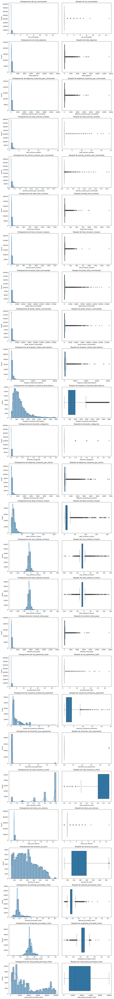

In [1439]:
# Sélectionner les colonnes numériques
num_cols = df_client_final.select_dtypes(include=['number']).columns

# Définir la taille de la figure
fig, axes = plt.subplots(nrows=len(num_cols), ncols=2, figsize=(12, len(num_cols) * 4))

# Boucle pour créer les graphiques
for i, col in enumerate(num_cols):
    # Histogramme
    sns.histplot(df_client_final[col], bins=30, kde=True, ax=axes[i, 0])
    axes[i, 0].set_title(f"Histogramme de {col}")

    # Boxplot
    sns.boxplot(x=df_client_final[col], ax=axes[i, 1])
    axes[i, 1].set_title(f"Boxplot de {col}")

# Ajuster l'affichage
plt.tight_layout()
plt.show()

1. Variables avec forte dispersion
- total_depense et depense_moyenne_par_commande :
Écart-type élevé (215.75 et 209.91 respectivement), avec des valeurs maximales très élevées (jusqu'à 13,440). Cela indique une forte hétérogénéité entre les clients en termes de dépenses.
Cela peut nécessiter une normalisation pour éviter que ces variables dominent le clustering.

- poids_total_commandes et poids_moyen_commandes :
Très grande dispersion (écart-type > 4,700), avec des valeurs maximales extrêmement élevées (184,400). Ces valeurs aberrantes pourraient biaiser l'analyse.

2. Variables avec distributions asymétriques
- nb_commandes, total_articles_achetes, articles_moyens_par_commande :
Les quartiles montrent que la majorité des clients effectuent peu de commandes (médiane = 1) et achètent peu d'articles (médiane = 1). Cependant, les valeurs maximales (15 commandes, 24 articles) indiquent quelques clients très actifs.

- delai_livraison_moyen :
Bien que la médiane soit de 10 jours, les valeurs maximales (209 jours) suggèrent des cas extrêmes qui pourraient refléter des inefficacités logistiques ou des erreurs.

3. Variables avec valeurs aberrantes
- frais_livraison_moyens :
Des frais de livraison allant jusqu'à 1,794.96 sont bien au-dessus du troisième quartile (24.11). Ces valeurs extrêmes doivent être examinées pour vérifier leur validité.

- moy_retards_livraison et total_retards_livraison :
Les valeurs négatives moyennes (-11.85 et -12.28) indiquent que les livraisons sont souvent en avance, mais les maximums positifs (188 jours de retard) pourraient représenter des anomalies ou des cas particuliers.

4. Variables homogènes ou peu discriminantes
- diversite_categories, diversite_max_paiements, nb_paiements_total, total_avis_donnes :
Ces variables ont une faible dispersion (écart-type < 0.5), ce qui indique que la majorité des clients se comportent de manière similaire sur ces aspects.
Elles risquent d'avoir un faible impact sur le clustering.

6. Récence (recence_en_jours)
- La médiane est de 267 jours, mais certains clients n'ont pas acheté depuis plus de deux ans (maximum = 744 jours). Cela peut indiquer des clients inactifs ou perdus, importants à identifier dans un contexte de segmentation.

**Impact potentiel sur la modélisation**
- **Normalisation nécessaire** : Les variables comme total_depense, poids_total_commandes, et frais_livraison_moyens, avec leurs fortes dispersions, nécessitent une normalisation pour éviter qu'elles dominent le clustering.

- **Traitement des outliers** : Les valeurs extrêmes dans poids_total_commandes, frais_livraison_moyens, et delai_livraison_moyen doivent être examinées pour décider si elles doivent être conservées ou corrigées.

- **Variables peu discriminantes** : Les variables comme diversite_categories pourraient être exclues ou combinées avec d'autres pour améliorer leur pertinence.


## Variables peu discriminantes ou homogènes

In [1440]:
# Liste des variables à examiner
variables_peu_discriminantes = ['total_articles_achetes', 'articles_moyens_par_commande',
                                'nb_commandes', 'diversite_categories', 'diversite_max_paiements',
                                'nb_paiements_total', 'total_avis_donnes']

# Compter les occurrences pour chaque variable
for var in variables_peu_discriminantes:
    print(f"Analyse de la variable '{var}':")
    print(df_client_final[var].value_counts())
    print("-" * 50)

Analyse de la variable 'total_articles_achetes':
total_articles_achetes
1     81518
2      8778
3      1644
4       618
5       240
6       190
7        45
8        16
10       11
11       11
9        10
12        9
15        3
14        3
20        2
13        2
18        1
21        1
24        1
Name: count, dtype: int64
--------------------------------------------------
Analyse de la variable 'articles_moyens_par_commande':
articles_moyens_par_commande
1.000000     83636
2.000000      6940
3.000000      1178
4.000000       445
1.500000       368
5.000000       176
6.000000       170
2.500000        36
1.333333        26
1.666667        22
7.000000        20
3.500000        14
10.000000        7
8.000000         6
12.000000        5
5.500000         5
9.000000         4
1.750000         4
4.500000         4
2.333333         4
2.666667         4
1.250000         3
11.000000        2
20.000000        2
1.833333         2
14.000000        2
1.200000         2
1.400000         2
3.66666

In [1441]:
# Compter les occurrences et calculer les proportions
for var in variables_peu_discriminantes:
    print(f"Proportion des valeurs pour la variable '{var}':")
    print(df_client_final[var].value_counts(normalize=True) * 100)
    print("-" * 50)

Proportion des valeurs pour la variable 'total_articles_achetes':
total_articles_achetes
1     87.556792
2      9.428268
3      1.765786
4      0.663781
5      0.257779
6      0.204075
7      0.048334
8      0.017185
10     0.011815
11     0.011815
9      0.010741
12     0.009667
15     0.003222
14     0.003222
20     0.002148
13     0.002148
18     0.001074
21     0.001074
24     0.001074
Name: proportion, dtype: float64
--------------------------------------------------
Proportion des valeurs pour la variable 'articles_moyens_par_commande':
articles_moyens_par_commande
1.000000     89.831692
2.000000      7.454110
3.000000      1.265265
4.000000      0.477965
1.500000      0.395261
5.000000      0.189038
6.000000      0.182593
2.500000      0.038667
1.333333      0.027926
1.666667      0.023630
7.000000      0.021482
3.500000      0.015037
10.000000     0.007519
8.000000      0.006444
12.000000     0.005370
5.500000      0.005370
9.000000      0.004296
1.750000      0.004296
4.500000

**Variables à supprimer**
1. total_articles_achetes<br>
87.56 % des clients ont acheté un seul article → Trop homogène.<br>
Redondante avec des variables comme total_depense, qui mesure mieux les comportements d'achat.<br>
Impact sur le clustering :<br>
Aucun impact significatif, car les gros acheteurs peuvent être identifiés via les montants dépensés (total_depense).

2. articles_moyens_par_commande<br>
89.83 % des clients ont une moyenne de 1 article par commande → Trop homogène.<br>
Redondante avec d'autres variables comme le montant moyen par commande (depense_moyenne_par_commande).<br>
Impact sur le clustering :<br>
Aucun impact significatif, car les comportements d'achat par commande sont mieux capturés via les montants.


**Variables à conserver**

3. nb_commandes<br>
Bien que cette variable soit homogène, elle est essentielle pour mesurer la fréquence dans le modèle RFM (Recency, Frequency, Monetary). Contrairement à la récence, qui identifie les clients récents ou anciens, nb_commandes permet de distinguer les clients fidèles (plusieurs commandes) des clients occasionnels (une seule commande).<br>
Impact sur le clustering :<br>
LEn conservant cette variable, on enrichit le modèle en ajoutant une dimension fondamentale de l'analyse RFM. Les segments "Clients fidèles vs Clients occasionnels" seront définis de manière plus précise et exploitable.<br>

4. diversite_categories
Cette variable mesure la diversité des catégories dans lesquelles un client achète. Bien que 98.59 % des clients achètent dans une seule catégorie, elle reste pertinente pour identifier les acheteurs variés (clients qui achètent dans plusieurs catégories) par rapport aux acheteurs spécialisés (clients concentrés sur une seule catégorie).<br>
La variable categorie_la_plus_commandee capture uniquement la catégorie dominante, mais ne reflète pas la diversité des comportements d'achat.<br>
Impact sur le clustering :<br>
En conservant cette variable, on enrichit le modèle en ajoutant une dimension comportementale importante qui permet de différencier les clients ayant des habitudes d'achat variées.<br>
Les segments "Acheteurs variés vs spécialisés" seront plus détaillés et exploitables.

5. diversite_max_paiements
Cette variable mesure le nombre de modes de paiement différents utilisés par un client. Bien que la majorité des clients (97.69 %) utilisent un seul mode de paiement, elle reste pertinente pour identifier les clients flexibles (ceux qui utilisent plusieurs modes de paiement) par rapport aux clients fidèles à un mode unique.<br>
La variable paiement_principal_utilise capture uniquement le mode dominant, mais ne reflète pas la flexibilité ou diversité des comportements financiers.<br>
Impact sur le clustering :<br>
En conservant cette variable, on enrichit le modèle avec une dimension financière importante qui permet de mieux comprendre les habitudes spécifiques des clients.<br>
Les segments "Clients sensibles aux moyens de paiement" seront plus détaillés et exploitables.

6. nb_paiements_total<br>
Bien que la majorité des clients (94 %) aient effectué un seul paiement, cette variable est pertinente pour identifier des comportements spécifiques (exemple : paiements en plusieurs fois).<br>
Impact sur le clustering :<br>
Permet d'enrichir l'analyse des comportements financiers et de mieux comprendre les clients ayant des habitudes uniques.

7. total_avis_donnes
Cette variable est pertinente pour analyser l'engagement client (exemple : identifier les clients engagés qui donnent beaucoup d'avis).<br>
Permet de définir clairement le segment "Clients engagés vs passifs".

In [1442]:
# Liste des variables à supprimer
variables_a_supprimer = [
    'total_articles_achetes', 
    'articles_moyens_par_commande',
]

# Supprimer les colonnes inutiles
df_client_final = df_client_final.drop(columns=variables_a_supprimer)

# Vérifier les colonnes restantes
print(df_client_final.columns)

Index(['nb_commandes', 'total_depense', 'depense_moyenne_par_commande',
       'total_frais_livraison', 'frais_livraison_moyens',
       'poids_total_commandes', 'poids_moyen_commandes',
       'longueur_totale_descriptions', 'longueur_moyenne_descriptions',
       'diversite_categories', 'categorie_la_plus_commandee',
       'depense_moyenne_par_article', 'delai_livraison_moyen',
       'moy_retards_livraison', 'total_retards_livraison',
       'montant_total_paye', 'nb_paiements_total',
       'moyenne_echeances_paiement', 'diversite_max_paiements',
       'paiement_principal_utilise', 'note_moyenne_client',
       'total_avis_donnes', 'saison_la_plus_frequente',
       'jour_le_plus_frequent', 'recence_en_jours', 'ville_principale_client',
       'etat_principal_client', 'latitude_principale_client',
       'longitude_principale_client', 'code_postal_principal_client'],
      dtype='object')


## Valeurs manquantes de la colonne des notes

La variable note_moyenne_client contient des valeurs manquantes dues au fait que certains clients n'ont pas donné de notes. Ces données manquantes ne peuvent pas être laissées telles quelles, car les algorithmes de clustering nécessitent des données complètes pour fonctionner correctement. 

In [1443]:
# Créer une colonne binaire pour indiquer si un client a donné une note
df_client_final['a_donne_une_note'] = df_client_final['note_moyenne_client'].notnull().astype(int)

# Calculer la moyenne arrondie
moyenne_arrondie = round(df_client_final['note_moyenne_client'].mean())

# Remplacer les valeurs manquantes par la moyenne arrondie SANS inplace
df_client_final['note_moyenne_client'] = df_client_final['note_moyenne_client'].fillna(moyenne_arrondie)

# Vérifier les modifications
print(df_client_final[['note_moyenne_client', 'a_donne_une_note']].head())

   note_moyenne_client  a_donne_une_note
0                  5.0                 1
1                  4.0                 1
2                  3.0                 1
3                  4.0                 1
4                  5.0                 1


In [1444]:
# Compter le nombre de clients qui n'ont pas donné de notes
nb_clients_sans_note = df_client_final['a_donne_une_note'].value_counts()[0]

print(f"Nombre de clients sans note : {nb_clients_sans_note}")

Nombre de clients sans note : 602


**Préservation des données**<br>
Les valeurs manquantes ont été remplacées par la moyenne globale (arrondie) des notes afin de conserver tous les clients dans le dataset.
Cela garantit que chaque client est inclus dans l'analyse, même ceux qui n'ont pas donné de notes.

**Ajout d'une dimension sur l'engagement**<br>
Une nouvelle colonne binaire (a_donne_une_note) a été créée pour indiquer si un client a donné une note ou non.
- Cette colonne permet de capturer une information importante sur l'engagement des clients :
- Les clients qui donnent des avis sont souvent plus engagés.
- Les clients sans avis peuvent être considérés comme passifs ou moins interactifs.

**Réduction du biais lié au remplacement**<br>
- Remplacer les valeurs manquantes uniquement par une valeur neutre (comme la moyenne) pourrait biaiser le clustering en assimilant les clients sans note à ceux ayant donné une note moyenne.
- La nouvelle colonne (a_donne_une_note) permet de signaler explicitement que certains clients n'ont pas donné de notes, ce qui enrichit l'analyse et évite toute confusion.

**Enrichissement du clustering**<br>
Grâce à cette approche, le clustering peut différencier les clients selon leur niveau d'interaction :
- Clients engagés (ceux qui donnent des avis).
- Clients passifs (ceux qui ne donnent pas d'avis).

Cela permet de créer un segment "Clients engagés vs passifs" exploitable par l'équipe marketing.

## Outliers

### Frais de livraison

On va rechercher des informations sur la commande avec des frais de livraison très important.

In [1445]:
# Trouver la commande avec les frais de livraison maximum
max_frais_livraison = df_aggregated['total_frais_livraison'].max()
commande_max_frais_livraison = df_aggregated[df_aggregated['total_frais_livraison'] == max_frais_livraison]

# Afficher les informations de cette commande
commande_max_frais_livraison

,customer_unique_id,nb_commandes,total_depense,depense_moyenne_par_commande,total_articles_achetes,articles_moyens_par_commande,total_frais_livraison,frais_livraison_moyens,poids_total_commandes,poids_moyen_commandes,...,note_moyenne_client,total_avis_donnes,saison_la_plus_frequente,jour_le_plus_frequent,recence_en_jours,ville_principale_client,etat_principal_client,latitude_principale_client,longitude_principale_client,code_postal_principal_client
93091,fff5eb4918b2bf4b2da476788d42051c,1,1050.0,1050.0,6,6.0,1794.96,1794.96,112200.0,112200.0,...,5.0,1.0,Été,Monday,107,campina grande,PB,-7.22795,-35.869672,58407


On vient de récupérer l'identifiant du client.

In [1446]:
# ID du client trouvé
client_id = 'fff5eb4918b2bf4b2da476788d42051c'

# Filtrer les commandes pour ce client dans le DataFrame original
commande_client = customers[customers['customer_unique_id'] == client_id]

# Afficher les informations de la commande
commande_client

,index,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,customer_code_postal
50526,50526,ed583a2a1eaf0dedc33af816153e8b8c,fff5eb4918b2bf4b2da476788d42051c,58407,campina grande,PB,58407


On vient de récupérer l'identifiant de la commande lieé à ce client.

In [1447]:
# ID de la commande trouvée
commande_client_id = 'ed583a2a1eaf0dedc33af816153e8b8c'

# Filtrer les commandes pour ce client dans le DataFrame original
commande_client = orders[orders['customer_id'] == commande_client_id]

# Afficher les informations de la commande
commande_client

,index,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,date_achat,date_livraison_estimee,date_livraison_reelle,date_approbation,date_expedition_transporteur
20074,20074,cf4659487be50c0c317cff3564c4a840,ed583a2a1eaf0dedc33af816153e8b8c,delivered,2018-07-02 16:39:59,2018-07-05 16:04:19,2018-07-06 08:25:00,2018-07-16 11:12:52,2018-08-01 00:00:00,2018-07-02 16:39:59,2018-08-01,2018-07-16 11:12:52,2018-07-05 16:04:19,2018-07-06 08:25:00


On a maintenant l'identifiant de la commande.

In [1448]:
# ID de la commande trouvée
commande_id = 'cf4659487be50c0c317cff3564c4a840'

# Filtrer les commandes pour ce client dans le DataFrame original
commande = order_items[order_items['order_id'] == commande_id]

# Afficher les informations de la commande
commande

,index,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,date_limite_expedition
91324,91324,cf4659487be50c0c317cff3564c4a840,1,bc3c6d2a621414f2e1df7a8a32a2828e,56e361f411e38dcef17cdc2a3d99628b,2018-07-10 08:32:15,175.0,299.16,2018-07-10 08:32:15
91325,91325,cf4659487be50c0c317cff3564c4a840,2,bc3c6d2a621414f2e1df7a8a32a2828e,56e361f411e38dcef17cdc2a3d99628b,2018-07-10 08:32:15,175.0,299.16,2018-07-10 08:32:15
91326,91326,cf4659487be50c0c317cff3564c4a840,3,bc3c6d2a621414f2e1df7a8a32a2828e,56e361f411e38dcef17cdc2a3d99628b,2018-07-10 08:32:15,175.0,299.16,2018-07-10 08:32:15
91327,91327,cf4659487be50c0c317cff3564c4a840,4,bc3c6d2a621414f2e1df7a8a32a2828e,56e361f411e38dcef17cdc2a3d99628b,2018-07-10 08:32:15,175.0,299.16,2018-07-10 08:32:15
91328,91328,cf4659487be50c0c317cff3564c4a840,5,bc3c6d2a621414f2e1df7a8a32a2828e,56e361f411e38dcef17cdc2a3d99628b,2018-07-10 08:32:15,175.0,299.16,2018-07-10 08:32:15
91329,91329,cf4659487be50c0c317cff3564c4a840,6,bc3c6d2a621414f2e1df7a8a32a2828e,56e361f411e38dcef17cdc2a3d99628b,2018-07-10 08:32:15,175.0,299.16,2018-07-10 08:32:15


Nous avons le détails des produits de la commande et des frais de livraison. Il semble que la personne a commandé 6 fois le même produit. Le prix du produit est de 175 BRL l'unité et pour chacun il y a 299.16 BRL de frais de port.

In [1449]:
# ID du produit trouvé
produit_id = 'bc3c6d2a621414f2e1df7a8a32a2828e'

# Filtrer les produit dans le DataFrame original
produit = products[products['product_id'] == produit_id]

# Afficher les informations du produit
produit

,index,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
21795,21795,bc3c6d2a621414f2e1df7a8a32a2828e,sinalizacao_e_seguranca,50.0,408.0,3.0,18700.0,36.0,105.0,36.0


Le produit appartient à la catégorie "sinalização e segurança", qui signifie "signalisation et sécurité" en portugais.

D'après ses caractéristiques :<br>
Poids : 18,7 kg<br>
Dimensions : 36 cm x 105 cm x 36 cm<br>
Longueur de description : 408 caractères<br>
Nombre de photos : 3<br>

Cela semble être un équipement de sécurité ou de signalisation, potentiellement un panneau de signalisation, un extincteur grand format, une barrière de sécurité ou un dispositif similaire.

Le prix unitaire (175 BRL) et les frais de port élevés (299.16 BRL par unité) suggèrent qu'il s'agit d'un objet volumineux et lourd, ce qui expliquerait les coûts de livraison importants.

### Conclusion: création d'un nouvelle feature

Lors de l'analyse des frais de livraison, nous avons détecté des valeurs très élevées qui peuvent être considérées comme des outliers. Ces valeurs extrêmes, bien qu'elles soient justifiées, risquent d'avoir un impact disproportionné sur la modélisation. Pour atténuer cet effet et rendre l'analyse plus pertinente, nous avons décidé de transformer les frais de livraison en une proportion relative par rapport au montant total dépensé par le client.

Créer part_frais_livraison va nous permettre de :
- Atténuer les outliers :
Les frais de livraison bruts peuvent varier fortement et inclure des valeurs extrêmes. En les rapportant au montant total dépensé, ces valeurs sont mises en contexte et leur impact est réduit. Cela permet d'éviter que les frais absolus dominent l'analyse ou perturbent le clustering.

- Améliorer la pertinence :
La proportion des frais de livraison est une mesure plus représentative du poids réel des coûts logistiques pour chaque client. Elle reflète mieux leur sensibilité aux frais de port, indépendamment du montant total dépensé.

- Faciliter la comparaison entre clients :
En utilisant une mesure relative, nous standardisons les frais de livraison et rendons les clients comparables, qu'ils aient effectué des commandes importantes ou modestes.

In [1450]:
# Ajouter la nouvelle feature part_frais_livraison
df_client_final['part_frais_livraison'] = (
        df_client_final['total_frais_livraison'] / df_client_final['total_depense'])
df_client_final = df_client_final.drop(columns=['total_frais_livraison'])

In [1451]:
df_client_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93103 entries, 0 to 93102
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   nb_commandes                   93103 non-null  int64  
 1   total_depense                  93103 non-null  float64
 2   depense_moyenne_par_commande   93103 non-null  float64
 3   frais_livraison_moyens         93103 non-null  float64
 4   poids_total_commandes          93103 non-null  float64
 5   poids_moyen_commandes          93103 non-null  float64
 6   longueur_totale_descriptions   93103 non-null  float64
 7   longueur_moyenne_descriptions  93103 non-null  float64
 8   diversite_categories           93103 non-null  int64  
 9   categorie_la_plus_commandee    93103 non-null  object 
 10  depense_moyenne_par_article    93103 non-null  float64
 11  delai_livraison_moyen          93103 non-null  float64
 12  moy_retards_livraison          93103 non-null 

In [1452]:
df_client_final['part_frais_livraison'].describe()

count    93103.000000
mean         0.306240
std          0.308799
min          0.000000
25%          0.132000
50%          0.224165
75%          0.378220
max         21.447059
Name: part_frais_livraison, dtype: float64

### Poid total commandé

On va rechercher des informations sur le poid total commandé maximum.

In [1453]:
# Trouver la commande avec le poids total maximum
max_poids_commandes = df_aggregated['poids_total_commandes'].max()
commande_max_poids = df_aggregated[df_aggregated['poids_total_commandes'] == max_poids_commandes]

# Afficher les informations de cette commande
commande_max_poids

,customer_unique_id,nb_commandes,total_depense,depense_moyenne_par_commande,total_articles_achetes,articles_moyens_par_commande,total_frais_livraison,frais_livraison_moyens,poids_total_commandes,poids_moyen_commandes,...,note_moyenne_client,total_avis_donnes,saison_la_plus_frequente,jour_le_plus_frequent,recence_en_jours,ville_principale_client,etat_principal_client,latitude_principale_client,longitude_principale_client,code_postal_principal_client
22337,3d47f4368ccc8e1bb4c4a12dbda7111b,1,1879.9,1879.9,10,10.0,354.76,354.76,184400.0,184400.0,...,1.0,1.0,Automne,Monday,380,sao paulo,SP,-23.579517,-46.644081,4011


On vient de récupérer l'identifiant du client.

In [1454]:
# ID du client trouvé
client_id = '3d47f4368ccc8e1bb4c4a12dbda7111b'

# Filtrer les commandes pour ce client dans le DataFrame original
commande_client = customers[customers['customer_unique_id'] == client_id]

# Afficher les informations de la commande
commande_client

,index,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,customer_code_postal
65788,65788,e7d6802668de6e74d0d6c56565bf2a24,3d47f4368ccc8e1bb4c4a12dbda7111b,4011,sao paulo,SP,4011


On vient de récupérer l'identifiant de la commande lieé à ce client.

In [1455]:
# ID de la commande trouvée
commande_client_id = 'e7d6802668de6e74d0d6c56565bf2a24'

# Filtrer les commandes pour ce client dans le DataFrame original
commande_client = orders[orders['customer_id'] == commande_client_id]

# Afficher les informations de la commande
commande_client

,index,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,date_achat,date_livraison_estimee,date_livraison_reelle,date_approbation,date_expedition_transporteur
99009,99009,9aec4e1ae90b23c7bf2d2b3bfafbd943,e7d6802668de6e74d0d6c56565bf2a24,delivered,2017-10-02 15:49:23,2017-10-02 16:05:19,2017-10-09 21:33:34,2017-10-11 17:11:54,2017-10-24 00:00:00,2017-10-02 15:49:23,2017-10-24,2017-10-11 17:11:54,2017-10-02 16:05:19,2017-10-09 21:33:34


On a maintenant l'identifiant de la commande.

In [1456]:
# ID de la commande trouvée
commande_id = '9aec4e1ae90b23c7bf2d2b3bfafbd943'

# Filtrer les commandes pour ce client dans le DataFrame original
commande = order_items[order_items['order_id'] == commande_id]

# Afficher les informations de la commande
commande

,index,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,date_limite_expedition
67747,67747,9aec4e1ae90b23c7bf2d2b3bfafbd943,1,0db4869ac8a908414823d44d742f5ba3,7c67e1448b00f6e969d365cea6b010ab,2017-10-13 16:05:19,199.99,88.57,2017-10-13 16:05:19
67748,67748,9aec4e1ae90b23c7bf2d2b3bfafbd943,2,47920da896bbd89e851429c78a7a7a8b,7c67e1448b00f6e969d365cea6b010ab,2017-10-13 16:05:19,179.99,0.08,2017-10-13 16:05:19
67749,67749,9aec4e1ae90b23c7bf2d2b3bfafbd943,3,47920da896bbd89e851429c78a7a7a8b,7c67e1448b00f6e969d365cea6b010ab,2017-10-13 16:05:19,179.99,0.08,2017-10-13 16:05:19
67750,67750,9aec4e1ae90b23c7bf2d2b3bfafbd943,4,47920da896bbd89e851429c78a7a7a8b,7c67e1448b00f6e969d365cea6b010ab,2017-10-13 16:05:19,179.99,0.08,2017-10-13 16:05:19
67751,67751,9aec4e1ae90b23c7bf2d2b3bfafbd943,5,47920da896bbd89e851429c78a7a7a8b,7c67e1448b00f6e969d365cea6b010ab,2017-10-13 16:05:19,179.99,0.08,2017-10-13 16:05:19
67752,67752,9aec4e1ae90b23c7bf2d2b3bfafbd943,6,47920da896bbd89e851429c78a7a7a8b,7c67e1448b00f6e969d365cea6b010ab,2017-10-13 16:05:19,179.99,0.08,2017-10-13 16:05:19
67753,67753,9aec4e1ae90b23c7bf2d2b3bfafbd943,7,0db4869ac8a908414823d44d742f5ba3,7c67e1448b00f6e969d365cea6b010ab,2017-10-13 16:05:19,199.99,88.57,2017-10-13 16:05:19
67754,67754,9aec4e1ae90b23c7bf2d2b3bfafbd943,8,0db4869ac8a908414823d44d742f5ba3,7c67e1448b00f6e969d365cea6b010ab,2017-10-13 16:05:19,199.99,88.57,2017-10-13 16:05:19
67755,67755,9aec4e1ae90b23c7bf2d2b3bfafbd943,9,0db4869ac8a908414823d44d742f5ba3,7c67e1448b00f6e969d365cea6b010ab,2017-10-13 16:05:19,199.99,88.57,2017-10-13 16:05:19
67756,67756,9aec4e1ae90b23c7bf2d2b3bfafbd943,10,47920da896bbd89e851429c78a7a7a8b,7c67e1448b00f6e969d365cea6b010ab,2017-10-13 16:05:19,179.99,0.08,2017-10-13 16:05:19


Nous avons le détails des produits de la commande. 2 produits distincts commandés 4 fois pour l'un et 6 fois pour l'autre.

In [1457]:
# Liste des IDs de produits
produits_ids = ['0db4869ac8a908414823d44d742f5ba3', '47920da896bbd89e851429c78a7a7a8b']

# Filtrer les produits correspondants
produits_selectionnes = products[products['product_id'].isin(produits_ids)]

# Afficher les informations des produits
produits_selectionnes

,index,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
23495,23495,47920da896bbd89e851429c78a7a7a8b,moveis_escritorio,55.0,1086.0,2.0,19400.0,48.0,45.0,56.0
26787,26787,0db4869ac8a908414823d44d742f5ba3,moveis_escritorio,47.0,1158.0,1.0,17000.0,63.0,58.0,24.0


Les deux produits appartiennent à la catégorie "moveis_escritorio", qui signifie "meubles de bureau" en portugais.
D'après leurs dimensions et poids :<br>

Produit 1 (47920da896bbd89e851429c78a7a7a8b) : 19,4 kg, 48x45x56 cm<br>
Produit 2 (0db4869ac8a908414823d44d742f5ba3) : 17 kg, 63x58x24 cm<br>

Ils pourraient être des chaises de bureau, petits bureaux ou meubles de rangement.<br>

Cette valeur maximale n'est pas incohérente.

### Retards de livraisons

In [1458]:
# Trouver le maximum des retards de livraison
max_retards_livraison = df_aggregated['total_retards_livraison'].max()
commande_retard_max = df_aggregated[df_aggregated['total_retards_livraison'] == max_retards_livraison]

# Afficher les informations de cette commande
commande_retard_max.T

,85614
customer_unique_id,eb21169c3153a2b507fc7e76d561ff14
nb_commandes,1
total_depense,144.99
depense_moyenne_par_commande,144.99
total_articles_achetes,1
articles_moyens_par_commande,1.0
total_frais_livraison,17.26
frais_livraison_moyens,17.26
poids_total_commandes,1050.0
poids_moyen_commandes,1050.0


On vient de récupérer l'identifiant du client.

In [1459]:
# ID du client trouvé
client_id = 'eb21169c3153a2b507fc7e76d561ff14'

# Filtrer les commandes pour ce client dans le DataFrame original
commande_client = customers[customers['customer_unique_id'] == client_id]

# Afficher les informations de la commande
commande_client

,index,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,customer_code_postal
70700,70700,d306426abe5fca15e54b645e4462dc7b,eb21169c3153a2b507fc7e76d561ff14,22723,rio de janeiro,RJ,22723


On vient de récupérer l'identifiant de la commande lieé à ce client.

In [1460]:
# ID de la commande trouvée
commande_client_id = 'd306426abe5fca15e54b645e4462dc7b'

# Filtrer les commandes pour ce client dans le DataFrame original
commande_client = orders[orders['customer_id'] == commande_client_id]

# Afficher les informations de la commande
commande_client

,index,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,date_achat,date_livraison_estimee,date_livraison_reelle,date_approbation,date_expedition_transporteur
55619,55619,1b3190b2dfa9d789e1f14c05b647a14a,d306426abe5fca15e54b645e4462dc7b,delivered,2018-02-23 14:57:35,2018-02-23 15:16:14,2018-02-26 18:49:07,2018-09-19 23:24:07,2018-03-15 00:00:00,2018-02-23 14:57:35,2018-03-15,2018-09-19 23:24:07,2018-02-23 15:16:14,2018-02-26 18:49:07


Date d'achat : 2018-02-23<br>
Date de livraison estimée : 15 mars 2018 <br>
Date de livraison réelle : 2018-09-19<br>
Le retard de livraison est bien de 188 jours (du 15 mars au 19 septembre).

Cette valeur n'est pas incohérente est correspond bien à ce qui est vérifié avec les dates.

### Avance de livraison

In [1461]:
# Trouver le minimum des retards de livraison
min_retards_livraison = df_aggregated['total_retards_livraison'].min()
commande_avance = df_aggregated[df_aggregated['total_retards_livraison'] == min_retards_livraison]

# Afficher les informations de cette commande
commande_avance.T

,29037,48595
customer_unique_id,4facc2e6fbc2bffab2fea92d2b4aa7e4,85895a0452aba21c4bb0e5b0e1b5e6eb
nb_commandes,4,1
total_depense,1686.9,125.98
depense_moyenne_par_commande,421.725,125.98
total_articles_achetes,4,2
articles_moyens_par_commande,1.0,2.0
total_frais_livraison,73.85,20.18
frais_livraison_moyens,18.4625,20.18
poids_total_commandes,1557.0,10600.0
poids_moyen_commandes,389.25,10600.0


On vient de récupérer les identifiants des clients.

In [1462]:
# ID du client trouvé
client_id = ['4facc2e6fbc2bffab2fea92d2b4aa7e4', '85895a0452aba21c4bb0e5b0e1b5e6eb']

# Filtrer les commandes pour ce client dans le DataFrame original
commande_client = customers[customers['customer_unique_id'].isin(client_id)]

# Afficher les informations de la commande
commande_client

,index,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,customer_code_postal
18435,18435,a47eef7a7043f321d272a603771704a2,4facc2e6fbc2bffab2fea92d2b4aa7e4,91450,porto alegre,RS,91450
27638,27638,45e3a54b29d4b8e7f1eb2e61433ad320,4facc2e6fbc2bffab2fea92d2b4aa7e4,91450,porto alegre,RS,91450
33268,33268,a5fbb6579eacbeb02752a143bfe82405,85895a0452aba21c4bb0e5b0e1b5e6eb,13175,sumare,SP,13175
81896,81896,b5c1c56fe1ec3cec6893b98d90a339bd,4facc2e6fbc2bffab2fea92d2b4aa7e4,91450,porto alegre,RS,91450
96724,96724,94316b10a38127d6f2291d061879acee,4facc2e6fbc2bffab2fea92d2b4aa7e4,91450,porto alegre,RS,91450


On vient de récupérer les identifiants des commandes lieés à ces clients.

In [1463]:
# ID de la commande trouvée
commande_client_id = ['a47eef7a7043f321d272a603771704a2', '45e3a54b29d4b8e7f1eb2e61433ad320',
                      'a5fbb6579eacbeb02752a143bfe82405', 'b5c1c56fe1ec3cec6893b98d90a339bd',
                      '94316b10a38127d6f2291d061879acee']

# Filtrer les commandes pour ce client dans le DataFrame original
commande_client = orders_cleaned[orders_cleaned['customer_id'].isin(commande_client_id)]

# Afficher les informations de la commande
commande_client

,index,order_id,customer_id,date_achat,date_livraison_estimee,date_livraison_reelle,date_approbation,date_expedition_transporteur
40094,40094,0607f0efea4b566f1eb8f7d3c2397320,a5fbb6579eacbeb02752a143bfe82405,2018-03-06 09:47:07,2018-08-03,2018-03-09 23:36:47,2018-03-06 09:55:47,2018-03-07 21:33:39
40776,40776,77d6b708885d2096c60a2c70d6339b47,45e3a54b29d4b8e7f1eb2e61433ad320,2018-07-20 10:12:21,2018-08-16,2018-07-31 20:56:42,2018-07-20 10:23:54,2018-07-20 12:26:00
82521,82521,0ba4f7e89d304a02edca85087abfd14c,b5c1c56fe1ec3cec6893b98d90a339bd,2018-08-13 22:51:49,2018-10-25,2018-08-30 23:38:26,2018-08-13 23:04:09,2018-08-22 14:04:00
84376,84376,f66b8bf378bdd2acca8604ef27039f1f,94316b10a38127d6f2291d061879acee,2018-08-09 08:24:53,2018-10-15,2018-08-15 20:12:44,2018-08-09 08:35:17,2018-08-09 14:10:00
95594,95594,b9b426ab253dc328825da35f1bad83f9,a47eef7a7043f321d272a603771704a2,2017-06-18 23:14:46,2017-07-13,2017-06-29 14:04:54,2017-06-18 23:30:11,2017-06-19 18:43:01


1er client avec 1 commande livrée:<br>
Date estimée : 3 août 2018 - Date réelle de livraison : 9 mars 2018 => Retard de livraison = 9 mars 2018 - 3 août 2018 = -147 jours

2ème client avec 4 commandes livrées:<br>
Commande 1: Date estimée : 16 août 2018 - Date réelle de livraison : 31 juillet 2018 => Retard de livraison = 31 juillet 2018 - 16 août 2018 = -16 jours (livraison en avance)

Commande 2: Date estimée : 25 octobre 2018 - Date réelle de livraison : 30 août 2018 => Retard de livraison = 30 août 2018 - 25 octobre 2018 = -56 jours (livraison en avance)

Commande 3: Date estimée : 13 juillet 2017 - Date réelle de livraison : 29 juin 2017 => Retard de livraison = 29 juin 2017 - 13 juillet 2017 = -14 jours (livraison en avance)

Commande 4: Date estimée : 15 octobre 2018 - Date réelle de livraison : 15 aout 2018 => Retard de livraison = 15 octobre 2018 - 15 octobre 2018 = -61 jours  (livraison en avance)

Total de client 2 = -16 - 56 - 14 -61 = -147 jours

Les données sont cohérentes.

### Conclusion : création de classe de délais de livraison

Après avoir examiné les valeurs extrêmes des retards et avances de livraison, nous avons constaté que les valeurs maximales (188 jours de retard) et minimales (-147 jours d'avance) sont cohérentes avec les dates fournies.

L'analyse montre une grande variabilité des retards, allant de livraisons très en avance à des retards significatifs.

Pourquoi créer des classes ?
- Simplification et interprétation métier :
Les retards de livraison sont une variable difficile à interpréter sous forme brute, surtout dans le cadre d'une segmentation client.<br>
En regroupant les retards en catégories (exemple : "livraison en avance", "ponctuelle", "retard modéré"), on simplifie leur compréhension et leur exploitation dans le clustering.

- Réduction de l'impact des valeurs extrêmes :
Les valeurs extrêmes comme 188 jours ou -147 jours risquent d'avoir un poids disproportionné dans les algorithmes sensibles à la distance (exemple : K-Means).<br>
Les classes permettent d'atténuer cet effet en regroupant ces cas dans des catégories qualitatives.

- Pertinence métier :
Les catégories permettent de mieux refléter les expériences clients liées aux délais de livraison.<br>
Par exemple, un client ayant subi un retard important peut être traité différemment d’un client toujours livré en avance.

**Conclusion**
Compte tenu de la cohérence des données et de la variabilité importante des retards, il est préférable de créer des classes pour cette variable. Cela simplifie l’analyse, réduit l’impact des valeurs extrêmes et enrichit la segmentation client avec une dimension qualitative liée aux délais logistiques.

**Choix de la variable et stratégie d'intégration**
Après avoir décidé de créer des classes pour simplifier l'analyse des retards de livraison, il est également nécessaire de choisir la variable la plus adaptée pour cette catégorisation et de définir comment intégrer les informations complémentaires dans le clustering.

Nous avons deux variables liées aux retards de livraison :
- moy_retards_livraison : Moyenne des retards ou avances pour chaque client.
- total_retards_livraison : Somme des retards ou avances cumulés pour l'ensemble des commandes d'un client.

Pour créer les classes, nous choisissons d'utiliser moy_retards_livraison, car :

- Elle permet une comparaison relative entre les clients, indépendamment du nombre de commandes passées.
- Elle reflète directement la qualité logistique moyenne pour chaque client, ce qui est pertinent pour identifier des segments liés à l'expérience de livraison.

**Utilisation complémentaire de total_retards_livraison**
Bien que nous utilisions moy_retards_livraison pour créer les classes, la variable total_retards_livraison reste importante pour capturer l'impact cumulé des retards ou avances. Pour éviter que cette variable soit influencée par le nombre de commandes passées (et donc biaisée), nous allons la normaliser avant de l'intégrer au clustering. Cela garantit une contribution équilibrée et évite que les clients ayant passé beaucoup de commandes dominent l'analyse.

**Conclusion**
Nous allons :
- Créer des classes qualitatives basées sur moy_retards_livraison pour simplifier l'interprétation et enrichir la segmentation avec une dimension qualitative.
- Conserver total_retards_livraison comme une mesure quantitative complémentaire, après normalisation, afin de capturer le volume total des retards logistiques.

In [1464]:
# Fonction pour catégoriser les retards moyens de livraison
def categoriser_moy_retard(x):
    """
    Catégorise un retard moyen de livraison en fonction de sa valeur.

    Les catégories sont les suivantes :
    - 'Livraison très en avance' : retard moyen inférieur à -30 jours.
    - 'Livraison en avance' : retard moyen compris entre -30 et -10 jours.
    - 'Livraison ponctuelle' : retard moyen compris entre -10 et 10 jours.
    - 'Retard modéré' : retard moyen compris entre 10 et 30 jours.
    - 'Retard important' : retard moyen supérieur à 30 jours.

    Args:
        x (float): Le retard moyen de livraison à catégoriser.

    Returns:
        str: La catégorie correspondante au retard moyen.
    """
    if x < -30:
        return 'Livraison très en avance'
    elif -30 <= x < -10:
        return 'Livraison en avance'
    elif -10 <= x <= 10:
        return 'Livraison ponctuelle'
    elif 10 < x <= 30:
        return 'Retard modéré'
    else:
        return 'Retard important'

# Appliquer la fonction à la colonne moy_retards_livraison
df_client_final['categorie_moy_retard'] = df_client_final['moy_retards_livraison'].apply(categoriser_moy_retard)

**Justification du choix des seuils pour les groupes de moy_retards_livraison**<br>
Les seuils pour la segmentation de la variable moy_retards_livraison ont été définis en se basant sur l'analyse de la distribution statistique et sur des considérations métier. Voici les raisons principales de ce choix :

Analyse statistique :<br>
- La moyenne des retards est de -11.85 jours, avec un écart-type de 10.13 jours, ce qui indique que la majorité des clients ont des livraisons en avance.
- Les quartiles (25 %, 50 %, 75 %) montrent une concentration des retards entre -17 jours et -7 jours, tandis que les valeurs extrêmes (-147 jours et 188 jours) représentent des cas rares mais cohérents.

Seuils naturels :<br>
Les seuils choisis (<-30, -30 à -10, -10 à 10, etc.) reflètent les comportements typiques (livraisons en avance ou ponctuelles) tout en isolant les cas atypiques (livraisons très en avance ou retards importants).

Interprétation métier :<br>
Ces catégories ("livraison très en avance", "livraison ponctuelle", "retard modéré", etc.) permettent une compréhension claire et exploitable dans un contexte opérationnel ou marketing.

Gestion des valeurs extrêmes :<br>
Les retards très longs (>30 jours) et les avances importantes (<-30 jours) sont regroupés dans des catégories spécifiques pour éviter qu'ils biaisent l'analyse tout en capturant leur impact logistique.

In [1465]:
# Vérifier le nombre de clients par classe
nombre_clients_par_classe = df_client_final['categorie_moy_retard'].value_counts()

# Afficher les résultats
print(nombre_clients_par_classe)

# Si vous voulez un affichage plus clair avec des pourcentages
nombre_clients_par_classe_pourcentage = df_client_final['categorie_moy_retard'].value_counts(normalize=True) * 100

print("\nNombre de clients par classe (en pourcentage) :")
print(nombre_clients_par_classe_pourcentage)

categorie_moy_retard
Livraison en avance         53038
Livraison ponctuelle        35848
Livraison très en avance     2218
Retard modéré                1675
Retard important              324
Name: count, dtype: int64

Nombre de clients par classe (en pourcentage) :
categorie_moy_retard
Livraison en avance         56.967015
Livraison ponctuelle        38.503593
Livraison très en avance     2.382308
Retard modéré                1.799083
Retard important             0.348002
Name: proportion, dtype: float64


In [1466]:
df_client_final = df_client_final.drop(columns=['moy_retards_livraison'])

## Variables qualitatives

In [1467]:
# Identifier les variables qualitatives
variables_qualitatives = df_client_final.select_dtypes(include=['object']).columns

# Afficher la liste des variables qualitatives
print("Variables qualitatives :", variables_qualitatives)

Variables qualitatives : Index(['categorie_la_plus_commandee', 'paiement_principal_utilise',
       'saison_la_plus_frequente', 'jour_le_plus_frequent',
       'ville_principale_client', 'etat_principal_client',
       'categorie_moy_retard'],
      dtype='object')


In [1468]:
# Analyse descriptive des variables qualitatives
for col in variables_qualitatives:
    print(f"Analyse de la variable '{col}':")
    print(df_client_final[col].value_counts())
    print("\nNombre de valeurs uniques :", df_client_final[col].nunique())
    print("-" * 50)

Analyse de la variable 'categorie_la_plus_commandee':
categorie_la_plus_commandee
Maison_Mobilier              21920
Electronique_Informatique    16063
Autre                        12240
Sante_Beaute                 11177
Divertissement               11175
Bebe_Enfants                  8054
Outils_Construction           4386
Automobile                    3992
Mode_Habillement              2131
Maison_Jardin                 1032
Alimentation_Boissons          933
Name: count, dtype: int64

Nombre de valeurs uniques : 11
--------------------------------------------------
Analyse de la variable 'paiement_principal_utilise':
paiement_principal_utilise
credit_card    71305
boleto         18652
voucher         1724
debit_card      1422
Name: count, dtype: int64

Nombre de valeurs uniques : 4
--------------------------------------------------
Analyse de la variable 'saison_la_plus_frequente':
saison_la_plus_frequente
Été          28515
Printemps    27933
Hiver        20876
Automne      15779


Les variables ville_principale_client et code_postal_principal_client contiennent un très grand nombre de catégories, ce qui rend leur utilisation directe impossible. L'application de One-Hot Encoding sur ces variables entraînerait une explosion de la dimensionnalité.

La variable etat_principal_client, quant à elle, comporte 27 catégories. Pour simplifier l'analyse, il est envisageable de regrouper ces états en zones géographiques plus larges, comme des régions.

In [1469]:
# Fonction pour regrouper les états en régions
def regrouper_region(etat):
    regions = {
        'Nord': ['AC', 'AP', 'AM', 'PA', 'RO', 'RR', 'TO'],
        'Nord-Est': ['AL', 'BA', 'CE', 'MA', 'PB', 'PE', 'PI', 'RN', 'SE'],
        'Centre-Ouest': ['DF', 'GO', 'MT', 'MS'],
        'Sud-Est': ['ES', 'MG', 'RJ', 'SP'],
        'Sud': ['PR', 'RS', 'SC']
    }
    for region, etats in regions.items():
        if etat in etats:
            return region
    return None  # Pour gérer les cas inattendus

# Appliquer la fonction au DataFrame
df_client_final['region'] = df_client_final['etat_principal_client'].apply(regrouper_region)

# Vérifier la répartition par région
print(df_client_final['region'].value_counts())

region
Sud-Est         63939
Sud             13366
Nord-Est         8781
Centre-Ouest     5281
Nord             1736
Name: count, dtype: int64


In [1470]:
# Supprimer les colonnes inutiles
colonnes_a_supprimer = ['etat_principal_client', 'ville_principale_client', 'code_postal_principal_client']
df_client_final = df_client_final.drop(columns=colonnes_a_supprimer)

# Vérifier les colonnes restantes
print(df_client_final.columns)

Index(['nb_commandes', 'total_depense', 'depense_moyenne_par_commande',
       'frais_livraison_moyens', 'poids_total_commandes',
       'poids_moyen_commandes', 'longueur_totale_descriptions',
       'longueur_moyenne_descriptions', 'diversite_categories',
       'categorie_la_plus_commandee', 'depense_moyenne_par_article',
       'delai_livraison_moyen', 'total_retards_livraison',
       'montant_total_paye', 'nb_paiements_total',
       'moyenne_echeances_paiement', 'diversite_max_paiements',
       'paiement_principal_utilise', 'note_moyenne_client',
       'total_avis_donnes', 'saison_la_plus_frequente',
       'jour_le_plus_frequent', 'recence_en_jours',
       'latitude_principale_client', 'longitude_principale_client',
       'a_donne_une_note', 'part_frais_livraison', 'categorie_moy_retard',
       'region'],
      dtype='object')


La variable moyen_paiement_principal présente un déséquilibre marqué entre ses catégories. En effet, la majorité des observations sont associées au mode de paiement carte_credit (71 305 occurrences), tandis que les autres moyens de paiement, comme boleto, voucher, et debit_card, sont beaucoup moins représentés. Ce déséquilibre peut poser des problèmes dans l'analyse et le clustering si les catégories minoritaires sont noyées par la catégorie dominante.
Pour pallier ce déséquilibre, nous proposons de regrouper les modalités en deux grandes catégories :
- carte_credit : Représente le mode de paiement dominant.
- autre_moyen_paiement : Regroupe les moyens de paiement moins fréquents (boleto, voucher, et debit_card).

In [1471]:
df_client_final['moyen_paiement_principal'] = df_client_final['paiement_principal_utilise'].apply(
    lambda x: 'carte_credit' if x == 'credit_card' else 'autre_moyen_paiement'
)

La variable categorie_la_plus_commandee présente une répartition déséquilibrée entre ses catégories. Certaines catégories, comme Maison_Mobilier et Electronique_Informatique, sont largement représentées, tandis que d'autres, comme Alimentation_Boissons ou Maison_Jardin, ont des effectifs beaucoup plus faibles. Afin de simplifier cette variable tout en conservant l'information essentielle, nous proposons un regroupement des catégories.

Les catégories seront regroupées selon leur nature et leur fréquence, comme suit :
- Maison_Mobilier : Conservée telle quelle (21 920 occurrences).
- Electronique_Informatique : Conservée telle quelle (16 063 occurrences).
- Autre : Inclut les catégories Autre (12 240 occurrences) et Alimentation_Boissons (933 occurrences).
- Mode_Beaute_Sante : Regroupe Sante_Beaute (11 177 occurrences) et Mode_Habillement (2 131 occurrences).
- Divertissement : Regroupe Divertissement (11 175 occurrences) et Maison_Jardin (1 032 occurrences).
- Bebe_Enfants : Conservée telle quelle (8 054 occurrences).
- Travaux : Regroupe Outils_Construction (4 386 occurrences) et Automobile (3 992 occurrences).

In [1472]:
# Regroupement des catégories
def regrouper_categories(categorie):
    """
    Regroupe les catégories de produits en grandes familles.

    Args:
        categorie (str): La catégorie de produit à regrouper.

    Returns:
        str: La famille de catégorie à laquelle le produit appartient.
    """
    if categorie in ['Maison_Mobilier']:
        return 'Maison_Mobilier'
    elif categorie in ['Electronique_Informatique']:
        return 'Electronique_Informatique'
    elif categorie in ['Autre', 'Alimentation_Boissons']:
        return 'Autre'
    elif categorie in ['Sante_Beaute', 'Mode_Habillement']:
        return 'Mode_Beaute_Sante'
    elif categorie in ['Divertissement', 'Maison_Jardin']:
        return 'Divertissement'
    elif categorie in ['Bebe_Enfants']:
        return 'Bebe_Enfants'
    elif categorie in ['Outils_Construction', 'Automobile']:
        return 'Travaux'
    else:
        return 'Autre'

# Appliquer le regroupement
df_client_final['categorie_plus_commandee'] = (
    df_client_final['categorie_la_plus_commandee'].apply(regrouper_categories)
)

In [1473]:
# Supprimer les colonnes inutiles
colonnes_a_supprimer = ['paiement_principal_utilise', 'categorie_la_plus_commandee']
df_client_final = df_client_final.drop(columns=colonnes_a_supprimer)

# Vérifier les colonnes restantes
print(df_client_final.columns)

Index(['nb_commandes', 'total_depense', 'depense_moyenne_par_commande',
       'frais_livraison_moyens', 'poids_total_commandes',
       'poids_moyen_commandes', 'longueur_totale_descriptions',
       'longueur_moyenne_descriptions', 'diversite_categories',
       'depense_moyenne_par_article', 'delai_livraison_moyen',
       'total_retards_livraison', 'montant_total_paye', 'nb_paiements_total',
       'moyenne_echeances_paiement', 'diversite_max_paiements',
       'note_moyenne_client', 'total_avis_donnes', 'saison_la_plus_frequente',
       'jour_le_plus_frequent', 'recence_en_jours',
       'latitude_principale_client', 'longitude_principale_client',
       'a_donne_une_note', 'part_frais_livraison', 'categorie_moy_retard',
       'region', 'moyen_paiement_principal', 'categorie_plus_commandee'],
      dtype='object')


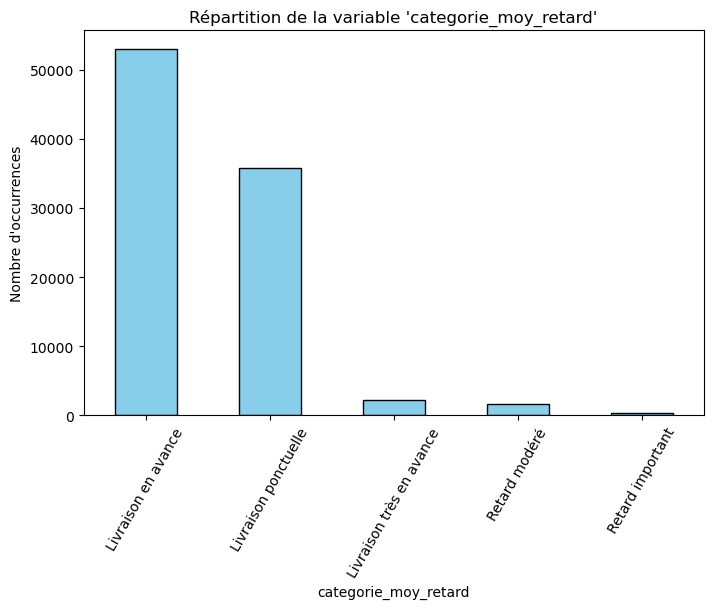

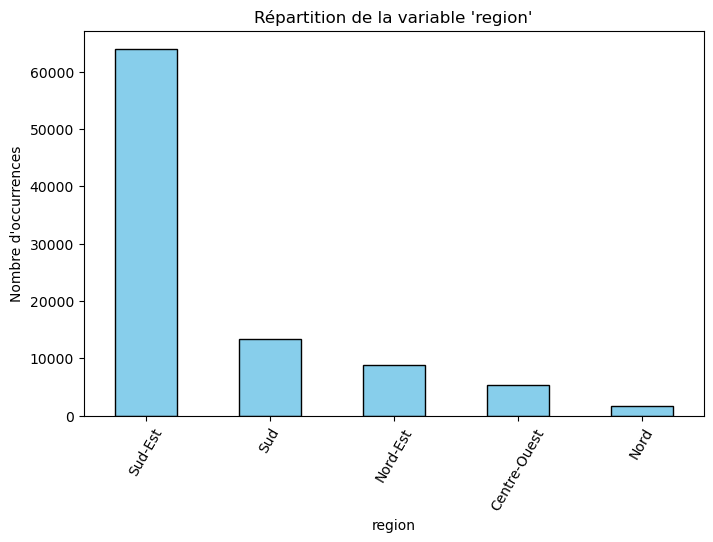

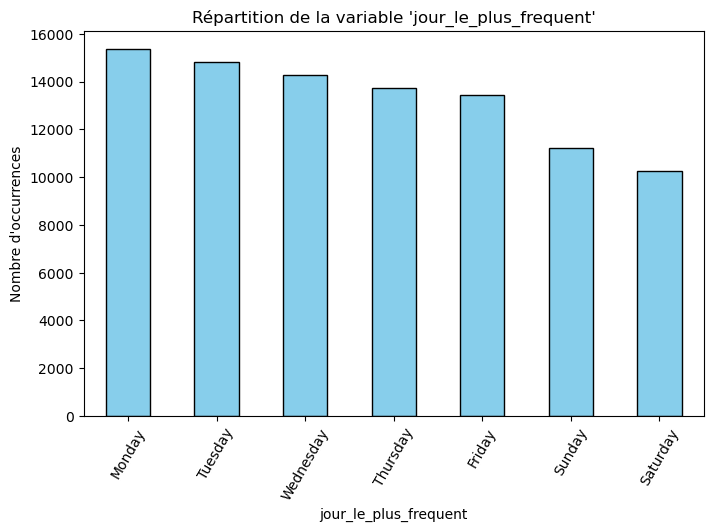

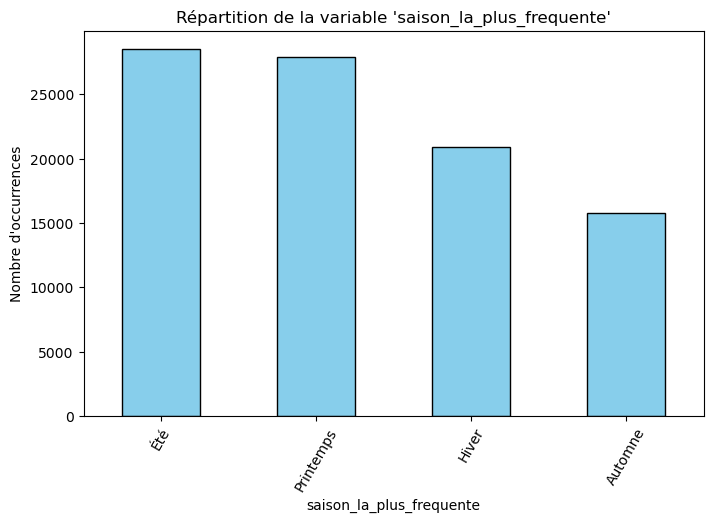

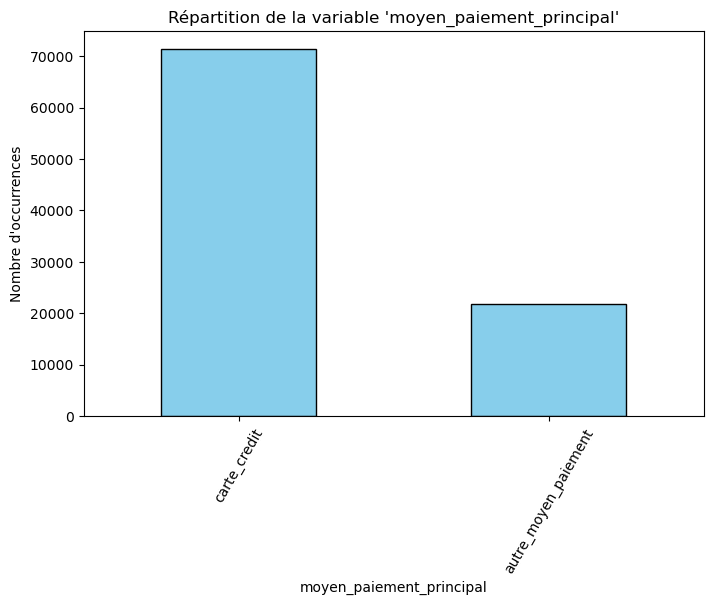

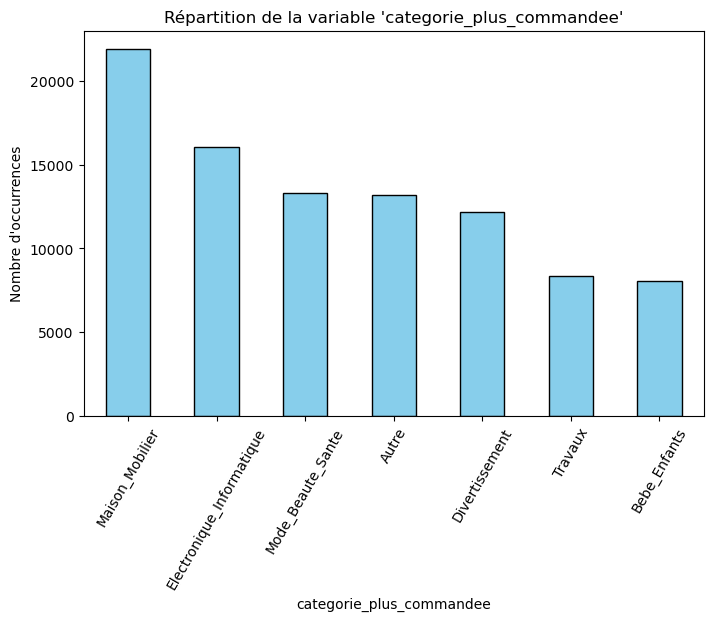

In [1474]:
variables = ['categorie_moy_retard', 'region',
             'jour_le_plus_frequent', 'saison_la_plus_frequente',
             'moyen_paiement_principal', 'categorie_plus_commandee']

# Visualisation pour chaque variable qualitative
for col in variables:
    plt.figure(figsize=(8, 5))
    df_client_final[col].value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
    plt.title(f"Répartition de la variable '{col}'")
    plt.xlabel(col)
    plt.ylabel("Nombre d'occurrences")
    plt.xticks(rotation=60)
    plt.show()

In [1475]:
# Identifier les variables qualitatives
variables_qualitatives = df_client_final.select_dtypes(include=['object']).columns
# Analyse descriptive des variables qualitatives
for col in variables_qualitatives:
    print(f"Analyse de la variable '{col}':")
    print(df_client_final[col].value_counts())
    print("\nNombre de valeurs uniques :", df_client_final[col].nunique())
    print("-" * 50)

Analyse de la variable 'saison_la_plus_frequente':
saison_la_plus_frequente
Été          28515
Printemps    27933
Hiver        20876
Automne      15779
Name: count, dtype: int64

Nombre de valeurs uniques : 4
--------------------------------------------------
Analyse de la variable 'jour_le_plus_frequent':
jour_le_plus_frequent
Monday       15349
Tuesday      14814
Wednesday    14290
Thursday     13740
Friday       13445
Sunday       11231
Saturday     10234
Name: count, dtype: int64

Nombre de valeurs uniques : 7
--------------------------------------------------
Analyse de la variable 'categorie_moy_retard':
categorie_moy_retard
Livraison en avance         53038
Livraison ponctuelle        35848
Livraison très en avance     2218
Retard modéré                1675
Retard important              324
Name: count, dtype: int64

Nombre de valeurs uniques : 5
--------------------------------------------------
Analyse de la variable 'region':
region
Sud-Est         63939
Sud             13366

In [1476]:
df_client_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93103 entries, 0 to 93102
Data columns (total 29 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   nb_commandes                   93103 non-null  int64  
 1   total_depense                  93103 non-null  float64
 2   depense_moyenne_par_commande   93103 non-null  float64
 3   frais_livraison_moyens         93103 non-null  float64
 4   poids_total_commandes          93103 non-null  float64
 5   poids_moyen_commandes          93103 non-null  float64
 6   longueur_totale_descriptions   93103 non-null  float64
 7   longueur_moyenne_descriptions  93103 non-null  float64
 8   diversite_categories           93103 non-null  int64  
 9   depense_moyenne_par_article    93103 non-null  float64
 10  delai_livraison_moyen          93103 non-null  float64
 11  total_retards_livraison        93103 non-null  int64  
 12  montant_total_paye             93103 non-null 

# Analyse bivariée

## Corrélations entre les variables numériques

Tester la normalité des variables numériques est une étape importante avant de calculer les corrélations, car la méthode choisie pour mesurer la corrélation (comme Pearson ou Spearman) dépend de la distribution des données. Si les variables suivent une loi normale, la corrélation de Pearson peut être utilisée pour mesurer les relations linéaires. En revanche, si les variables ne suivent pas une loi normale, des alternatives robustes comme Spearman ou Kendall sont plus adaptées.

Dans ce contexte, étant donné la taille importante du dataset (93 103 lignes), nous avons utilisé le test de Kolmogorov-Smirnov pour vérifier la normalité. Ce test est particulièrement adapté aux grands échantillons et compare la distribution d'une variable avec une loi normale en utilisant sa moyenne et son écart-type. Les résultats permettent de confirmer si l'hypothèse de normalité est respectée ou non avant de choisir la méthode de corrélation appropriée.

In [1477]:
# Sélectionner les variables numériques
colonnes_numeriques = df_client_final.select_dtypes(include=['number']).columns

# Tester la normalité avec Kolmogorov-Smirnov
for col in colonnes_numeriques:
    stat, p_value = kstest(df_client_final[col], 'norm', args=(df_client_final[col].mean(), df_client_final[col].std()))
    print(f"Variable : {col} | p-valeur : {p_value:.4f}")

Variable : nb_commandes | p-valeur : 0.0000
Variable : total_depense | p-valeur : 0.0000
Variable : depense_moyenne_par_commande | p-valeur : 0.0000
Variable : frais_livraison_moyens | p-valeur : 0.0000
Variable : poids_total_commandes | p-valeur : 0.0000
Variable : poids_moyen_commandes | p-valeur : 0.0000
Variable : longueur_totale_descriptions | p-valeur : 0.0000
Variable : longueur_moyenne_descriptions | p-valeur : 0.0000
Variable : diversite_categories | p-valeur : 0.0000
Variable : depense_moyenne_par_article | p-valeur : 0.0000
Variable : delai_livraison_moyen | p-valeur : 0.0000
Variable : total_retards_livraison | p-valeur : 0.0000
Variable : montant_total_paye | p-valeur : 0.0000
Variable : nb_paiements_total | p-valeur : 0.0000
Variable : moyenne_echeances_paiement | p-valeur : 0.0000
Variable : diversite_max_paiements | p-valeur : 0.0000
Variable : note_moyenne_client | p-valeur : 0.0000
Variable : total_avis_donnes | p-valeur : 0.0000
Variable : recence_en_jours | p-valeur

Les résultats du test de normalité (Kolmogorov-Smirnov) montrent que toutes les variables numériques ont une p-valeur égale à 0, ce qui indique que l'hypothèse de normalité est rejetée pour chacune d'entre elles. Cela signifie que aucune des variables numériques ne suit une loi normale.

En conséquence, pour analyser les corrélations entre ces variables, nous allons utiliser la corrélation de Spearman, qui est une méthode robuste adaptée aux données non normales. Spearman mesure les relations monotones (croissantes ou décroissantes) entre les variables, ce qui garantit des résultats fiables même en présence de distributions asymétriques ou non linéaires.

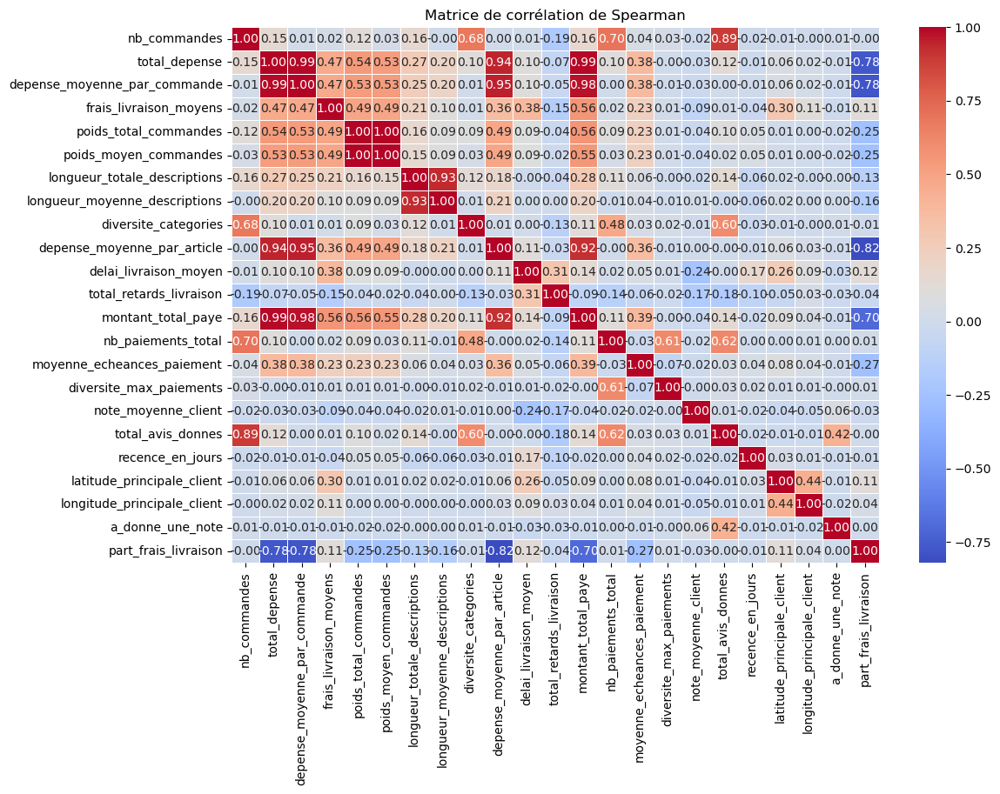

In [1478]:
# Calculer la matrice de corrélation de Spearman
corr_spearman = df_client_final[colonnes_numeriques].corr(method='spearman')

# Créer un heatmap de la matrice de corrélation
plt.figure(figsize=(12, 8))
sns.heatmap(corr_spearman, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)

# Afficher le graphique
plt.title('Matrice de corrélation de Spearman')
plt.show()

On constate des fortes corréations entre:
- total_depense et depense_moyenne_par_commande : 0.99
- total_depense et depense_moy_par_article : 0.94
- total_depense et montant_total_paye: 0.99

- depense_moyenne_par_commande et depense_moy_par_article : 0.94
- depense_moyenne_par_commande et montant_total_paye : 0.99

- montant_total_paye et depense_moy_par_article : 0.92
- poids_moyen_commandes et poids_total_commandes : 1

- longueur_totale_descriptions et longueur_moyenne_descriptions: 0.93

- part_frais_livraison et depense_moy_par_article : - 0.82

- nb_commandes et total_avis_donnes : 0.89

Ces corrélations très fortes montrent une forte redondance d'information. Pour éviter que ces redondances ne biaisent le processus de clustering (distances surestimées, surpondération de certains aspects), nous avons décidé de supprimer les variables suivantes :
- depense_moyenne_par_commande,
- depense_moyenne_par_article,
- montant_total_paye, 
- poids_total_commandes, 
- longueur_totale_descriptions.
- total_avis_donnes

In [1479]:
# Liste des variables à supprimer
variables_a_supprimer = [
    'depense_moyenne_par_commande',
    'depense_moyenne_par_article',
    'montant_total_paye',
    'poids_total_commandes',
    'longueur_totale_descriptions',
    'total_avis_donnes'
]

# Supprimer les colonnes du DataFrame
df_client_final = df_client_final.drop(columns=variables_a_supprimer)

# Vérifier le DataFrame après suppression
print("Colonnes restantes :")
print(df_client_final.columns)

Colonnes restantes :
Index(['nb_commandes', 'total_depense', 'frais_livraison_moyens',
       'poids_moyen_commandes', 'longueur_moyenne_descriptions',
       'diversite_categories', 'delai_livraison_moyen',
       'total_retards_livraison', 'nb_paiements_total',
       'moyenne_echeances_paiement', 'diversite_max_paiements',
       'note_moyenne_client', 'saison_la_plus_frequente',
       'jour_le_plus_frequent', 'recence_en_jours',
       'latitude_principale_client', 'longitude_principale_client',
       'a_donne_une_note', 'part_frais_livraison', 'categorie_moy_retard',
       'region', 'moyen_paiement_principal', 'categorie_plus_commandee'],
      dtype='object')


In [1480]:
df_client_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93103 entries, 0 to 93102
Data columns (total 23 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   nb_commandes                   93103 non-null  int64  
 1   total_depense                  93103 non-null  float64
 2   frais_livraison_moyens         93103 non-null  float64
 3   poids_moyen_commandes          93103 non-null  float64
 4   longueur_moyenne_descriptions  93103 non-null  float64
 5   diversite_categories           93103 non-null  int64  
 6   delai_livraison_moyen          93103 non-null  float64
 7   total_retards_livraison        93103 non-null  int64  
 8   nb_paiements_total             93103 non-null  int64  
 9   moyenne_echeances_paiement     93103 non-null  float64
 10  diversite_max_paiements        93103 non-null  int64  
 11  note_moyenne_client            93103 non-null  float64
 12  saison_la_plus_frequente       93103 non-null 

## Analyse bivariée des variables qualitatives entre elles

Tableau de contingence entre saison_la_plus_frequente et jour_le_plus_frequent :
jour_le_plus_frequent     Friday  Monday  Saturday  Sunday  Thursday  Tuesday  \
saison_la_plus_frequente                                                        
Automne                     2839    2470      1815    1935      2155     2428   
Hiver                       2936    3400      2420    2454      2938     3395   
Printemps                   3725    4735      2962    3383      4324     4373   
Été                         3945    4744      3037    3459      4323     4618   

jour_le_plus_frequent     Wednesday  
saison_la_plus_frequente             
Automne                        2137  
Hiver                          3333  
Printemps                      4431  
Été                            4389  


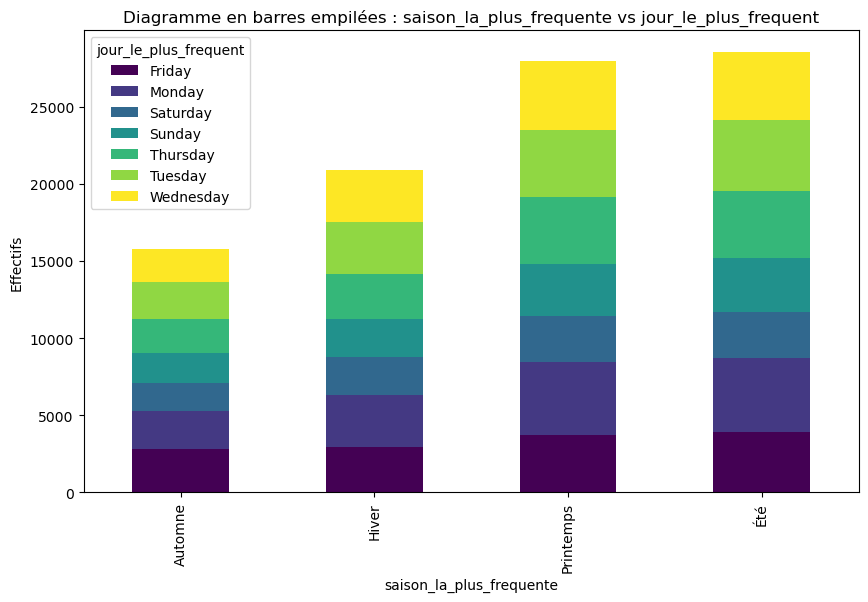

Statistique khi² pour saison_la_plus_frequente et jour_le_plus_frequent: 284.74571929170503
p-valeur : 6.53244943866587e-50
Les variables sont dépendantes (relation significative).
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Tableau de contingence entre saison_la_plus_frequente et categorie_moy_retard :
categorie_moy_retard      Livraison en avance  Livraison ponctuelle  \
saison_la_plus_frequente                                              
Automne                                  8026                  7036   
Hiver                                   13157                  6458   
Printemps                               15536                 11199   
Été                                     16319                 11155   

categorie_moy_retard      Livraison très en avance  Retard important  

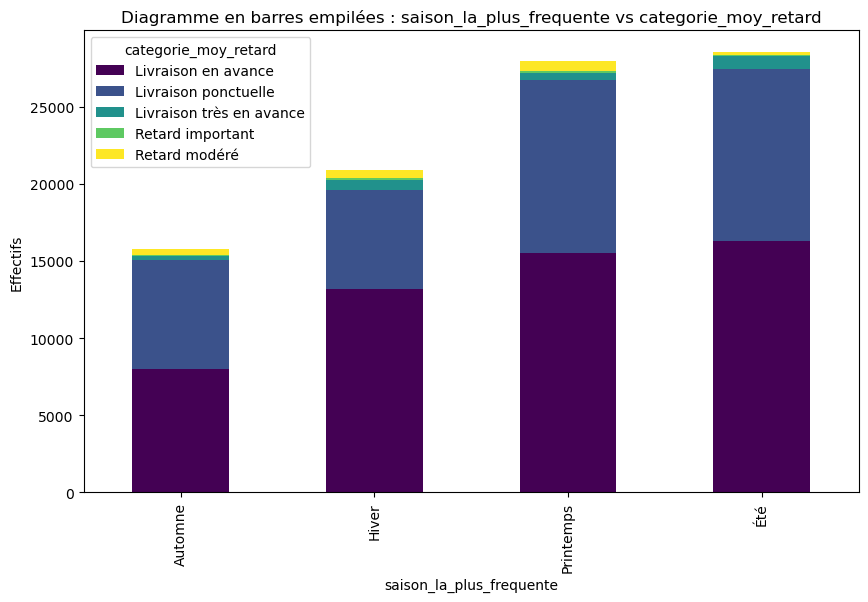

Statistique khi² pour saison_la_plus_frequente et categorie_moy_retard: 1293.3367742122305
p-valeur : 1.3585652298352688e-269
Les variables sont dépendantes (relation significative).
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Tableau de contingence entre saison_la_plus_frequente et region :
region                    Centre-Ouest  Nord  Nord-Est   Sud  Sud-Est
saison_la_plus_frequente                                             
Automne                            915   308      1590  2282    10684
Hiver                             1259   392      1951  3050    14224
Printemps                         1525   532      2587  4023    19266
Été                               1582   504      2653  4011    19765


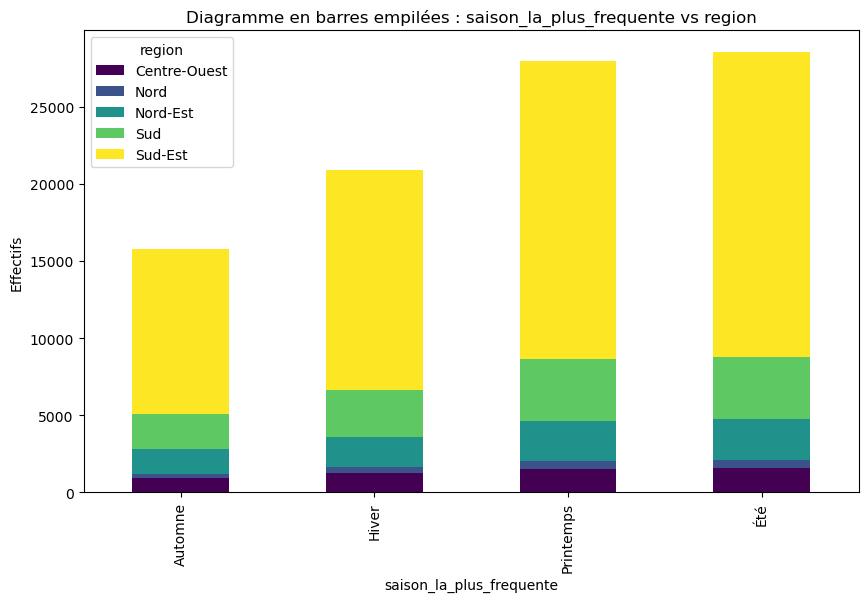

Statistique khi² pour saison_la_plus_frequente et region: 26.858271200664785
p-valeur : 0.008098435691858029
Les variables sont dépendantes (relation significative).
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Tableau de contingence entre saison_la_plus_frequente et moyen_paiement_principal :
moyen_paiement_principal  autre_moyen_paiement  carte_credit
saison_la_plus_frequente                                    
Automne                                   3690         12089
Hiver                                     4986         15890
Printemps                                 6242         21691
Été                                       6880         21635


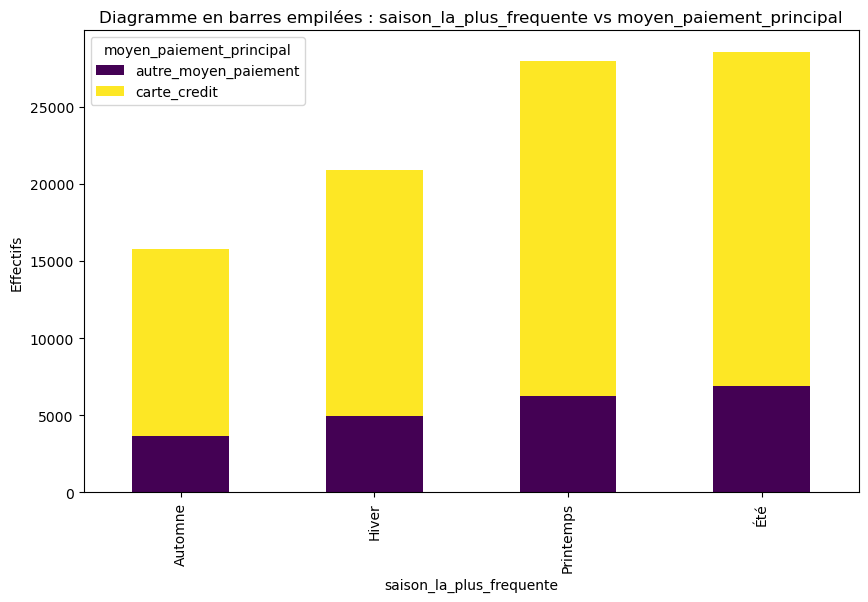

Statistique khi² pour saison_la_plus_frequente et moyen_paiement_principal: 28.434267621493635
p-valeur : 2.9442676665365057e-06
Les variables sont dépendantes (relation significative).
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Tableau de contingence entre saison_la_plus_frequente et categorie_plus_commandee :
categorie_plus_commandee  Autre  Bebe_Enfants  Divertissement  \
saison_la_plus_frequente                                        
Automne                    2315          1671            2014   
Hiver                      2931          1612            2993   
Printemps                  4049          2297            3601   
Été                        3878          2474            3599   

categorie_plus_commandee  Electronique_Informatique  Maison_Mobilier  \
saison_la_plus_frequente 

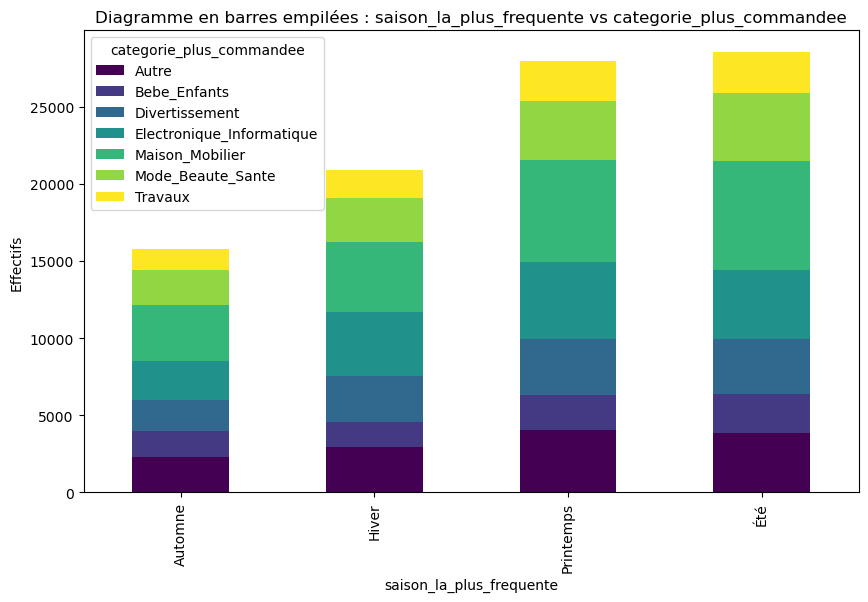

Statistique khi² pour saison_la_plus_frequente et categorie_plus_commandee: 379.1421910067953
p-valeur : 2.0211425889205052e-69
Les variables sont dépendantes (relation significative).
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Tableau de contingence entre jour_le_plus_frequent et categorie_moy_retard :
categorie_moy_retard   Livraison en avance  Livraison ponctuelle  \
jour_le_plus_frequent                                              
Friday                                7498                  5327   
Monday                                8304                  6341   
Saturday                              6173                  3553   
Sunday                                6629                  4083   
Thursday                              7945                  5235   
Tuesday             

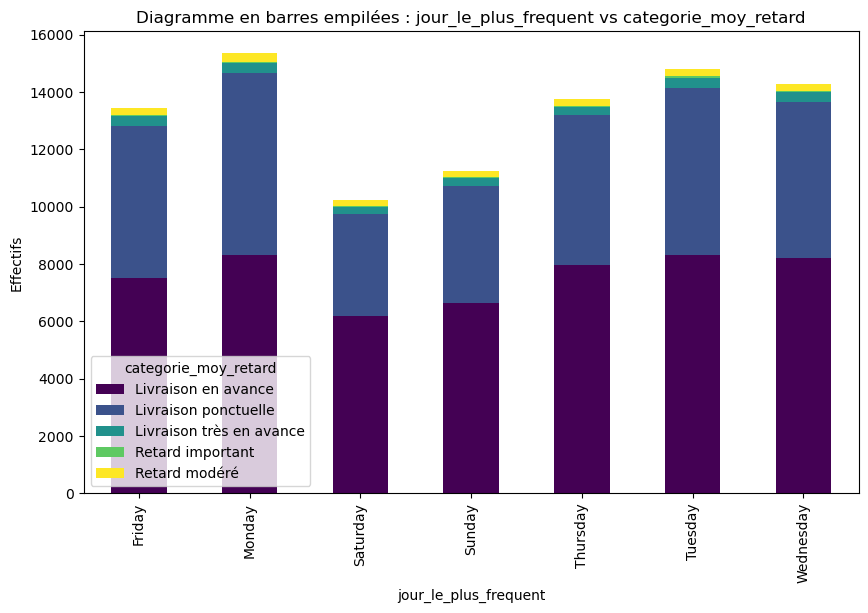

Statistique khi² pour jour_le_plus_frequent et categorie_moy_retard: 170.37842657752083
p-valeur : 4.955323625132157e-24
Les variables sont dépendantes (relation significative).
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Tableau de contingence entre jour_le_plus_frequent et region :
region                 Centre-Ouest  Nord  Nord-Est   Sud  Sud-Est
jour_le_plus_frequent                                             
Friday                          842   244      1282  1898     9179
Monday                          869   293      1395  2246    10546
Saturday                        552   218      1070  1430     6964
Sunday                          618   197      1018  1646     7752
Thursday                        744   249      1326  1941     9480
Tuesday                         811   271      1

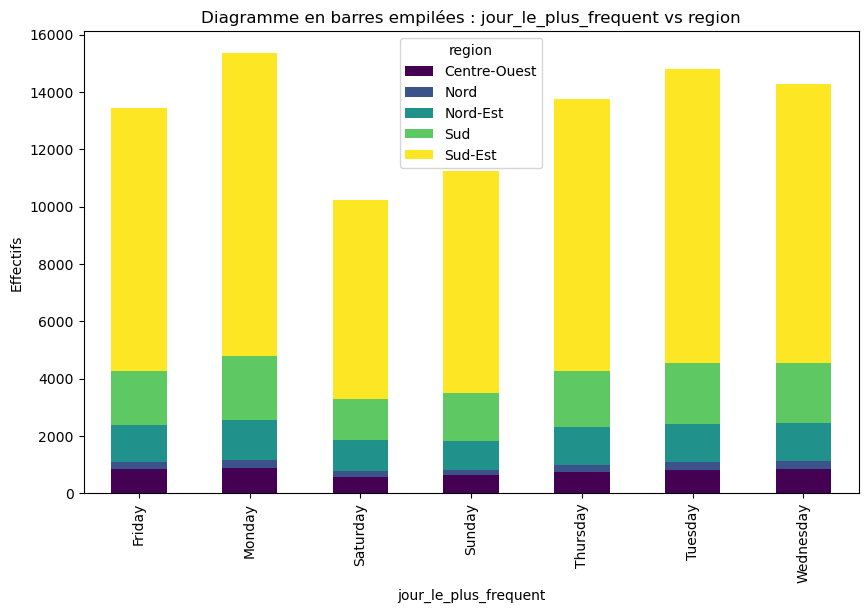

Statistique khi² pour jour_le_plus_frequent et region: 43.504465574286485
p-valeur : 0.008706731730073998
Les variables sont dépendantes (relation significative).
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Tableau de contingence entre jour_le_plus_frequent et moyen_paiement_principal :
moyen_paiement_principal  autre_moyen_paiement  carte_credit
jour_le_plus_frequent                                       
Friday                                    3205         10240
Monday                                    3773         11576
Saturday                                  1982          8252
Sunday                                    2150          9081
Thursday                                  3455         10285
Tuesday                                   3729         11085
Wednesday                 

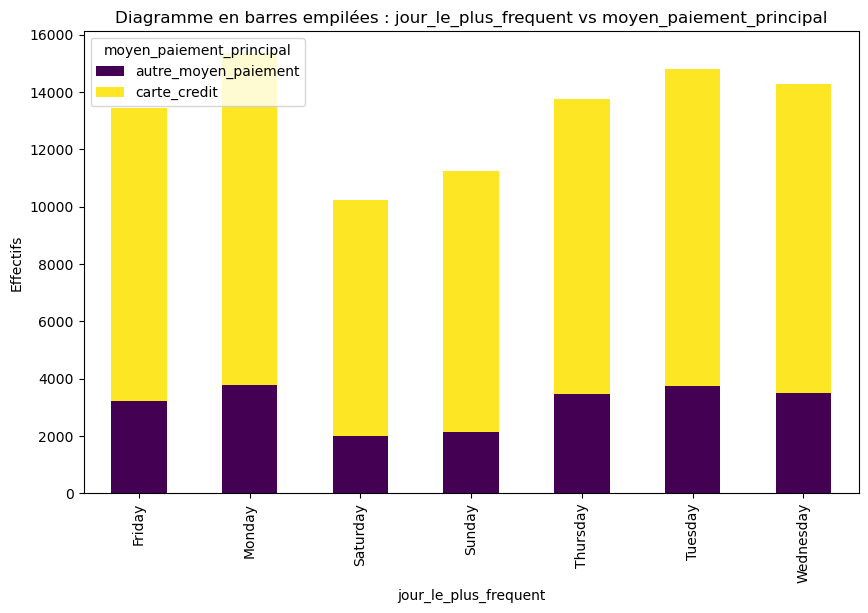

Statistique khi² pour jour_le_plus_frequent et moyen_paiement_principal: 278.99876377265605
p-valeur : 2.5735288992842266e-57
Les variables sont dépendantes (relation significative).
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Tableau de contingence entre jour_le_plus_frequent et categorie_plus_commandee :
categorie_plus_commandee  Autre  Bebe_Enfants  Divertissement  \
jour_le_plus_frequent                                           
Friday                     1903          1166            1728   
Monday                     2125          1355            2072   
Saturday                   1458           894            1262   
Sunday                     1624          1014            1446   
Thursday                   1988          1149            1797   
Tuesday                    2020        

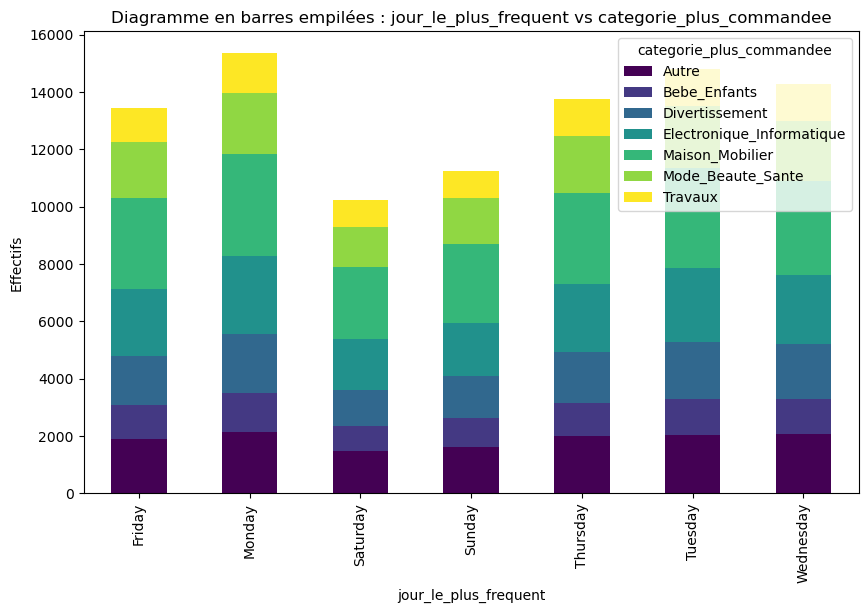

Statistique khi² pour jour_le_plus_frequent et categorie_plus_commandee: 64.11467982333491
p-valeur : 0.0026911328345555242
Les variables sont dépendantes (relation significative).
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Tableau de contingence entre categorie_moy_retard et region :
region                    Centre-Ouest  Nord  Nord-Est   Sud  Sud-Est
categorie_moy_retard                                                 
Livraison en avance               3181  1114      5011  8527    35205
Livraison ponctuelle              1886   428      3078  4274    26182
Livraison très en avance           115   147       276   329     1351
Retard important                    11     9        73    18      213
Retard modéré                       88    38       343   218      988


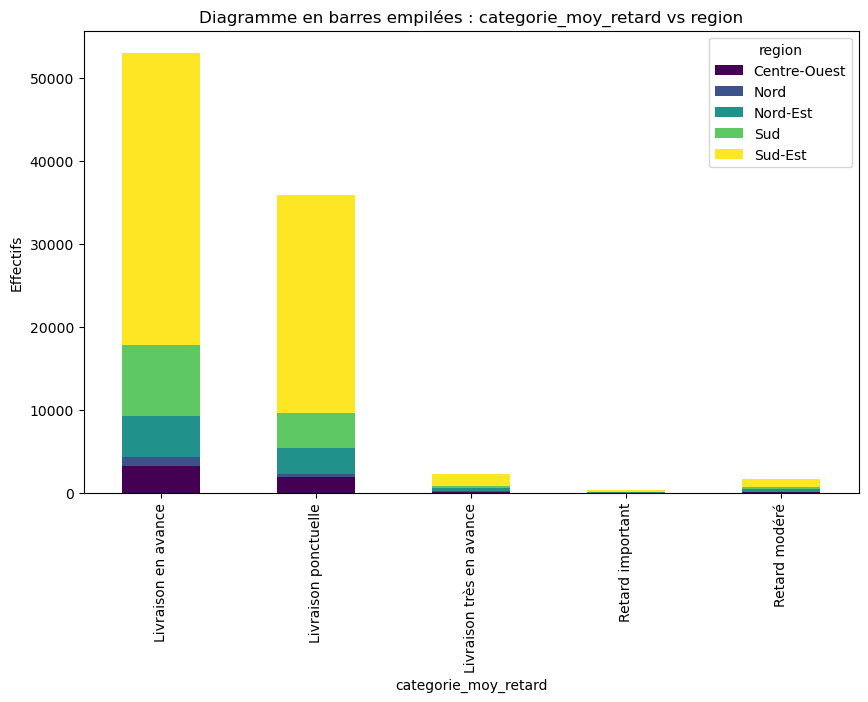

Statistique khi² pour categorie_moy_retard et region: 1184.284902569581
p-valeur : 3.5116359996089515e-242
Les variables sont dépendantes (relation significative).
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Tableau de contingence entre categorie_moy_retard et moyen_paiement_principal :
moyen_paiement_principal  autre_moyen_paiement  carte_credit
categorie_moy_retard                                        
Livraison en avance                      11661         41377
Livraison ponctuelle                      9191         26657
Livraison très en avance                   464          1754
Retard important                            69           255
Retard modéré                              413          1262


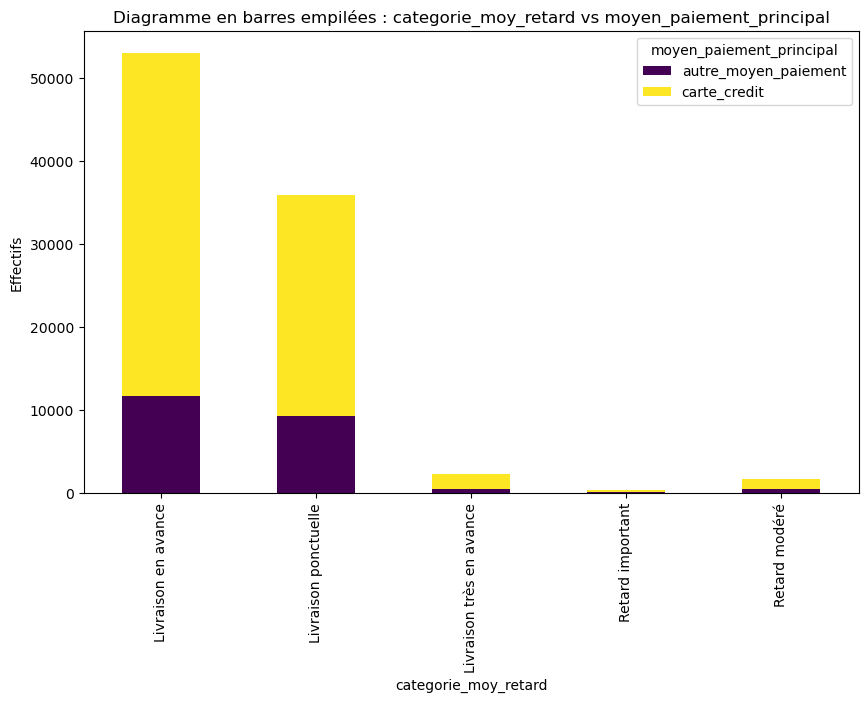

Statistique khi² pour categorie_moy_retard et moyen_paiement_principal: 169.20985024244564
p-valeur : 1.5454203607897204e-35
Les variables sont dépendantes (relation significative).
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Tableau de contingence entre categorie_moy_retard et categorie_plus_commandee :
categorie_plus_commandee  Autre  Bebe_Enfants  Divertissement  \
categorie_moy_retard                                            
Livraison en avance        7675          4614            7056   
Livraison ponctuelle       4961          3057            4635   
Livraison très en avance    286           201             247   
Retard important             39            28              40   
Retard modéré               212           154             229   

categorie_plus_commandee  Electronique_I

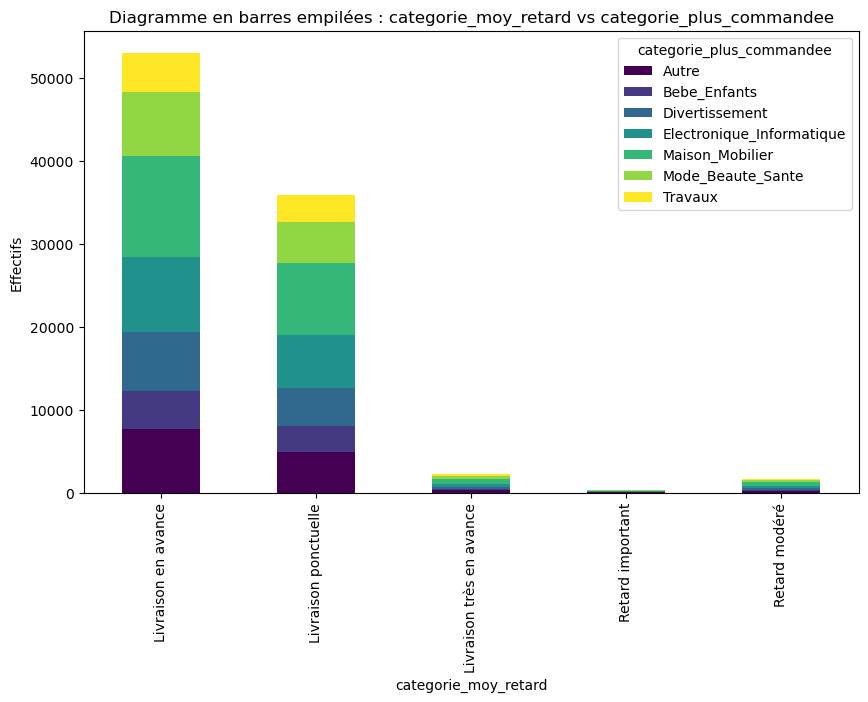

Statistique khi² pour categorie_moy_retard et categorie_plus_commandee: 93.84499604266867
p-valeur : 3.2992954055204533e-10
Les variables sont dépendantes (relation significative).
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Tableau de contingence entre region et moyen_paiement_principal :
moyen_paiement_principal  autre_moyen_paiement  carte_credit
region                                                      
Centre-Ouest                              1279          4002
Nord                                       451          1285
Nord-Est                                  1924          6857
Sud                                       3546          9820
Sud-Est                                  14598         49341


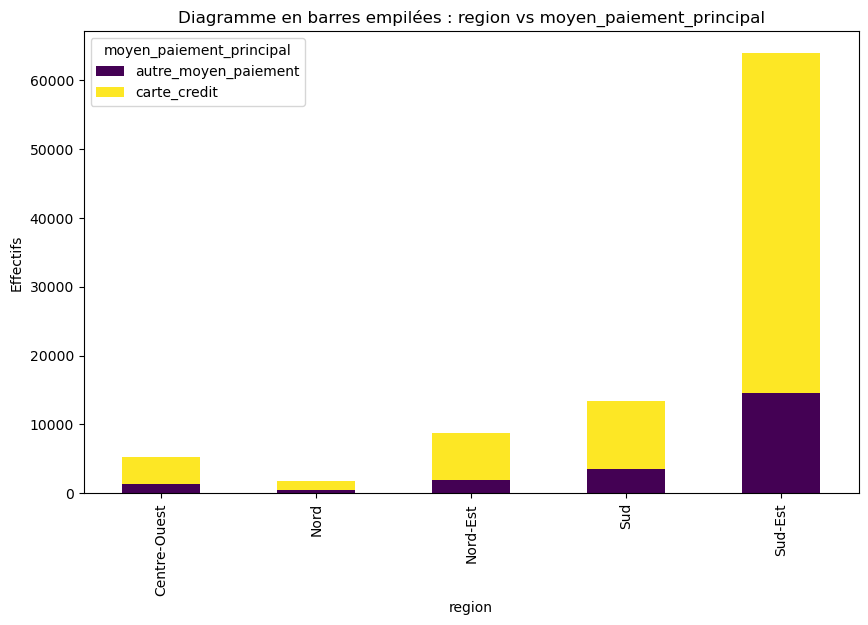

Statistique khi² pour region et moyen_paiement_principal: 103.83114150791499
p-valeur : 1.5029259443182594e-21
Les variables sont dépendantes (relation significative).
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Tableau de contingence entre region et categorie_plus_commandee :
categorie_plus_commandee  Autre  Bebe_Enfants  Divertissement  \
region                                                          
Centre-Ouest                820           475             717   
Nord                        285           153             231   
Nord-Est                   1426           680            1119   
Sud                        1847          1159            1822   
Sud-Est                    8795          5587            8318   

categorie_plus_commandee  Electronique_Informatique  Maison_Mobilier

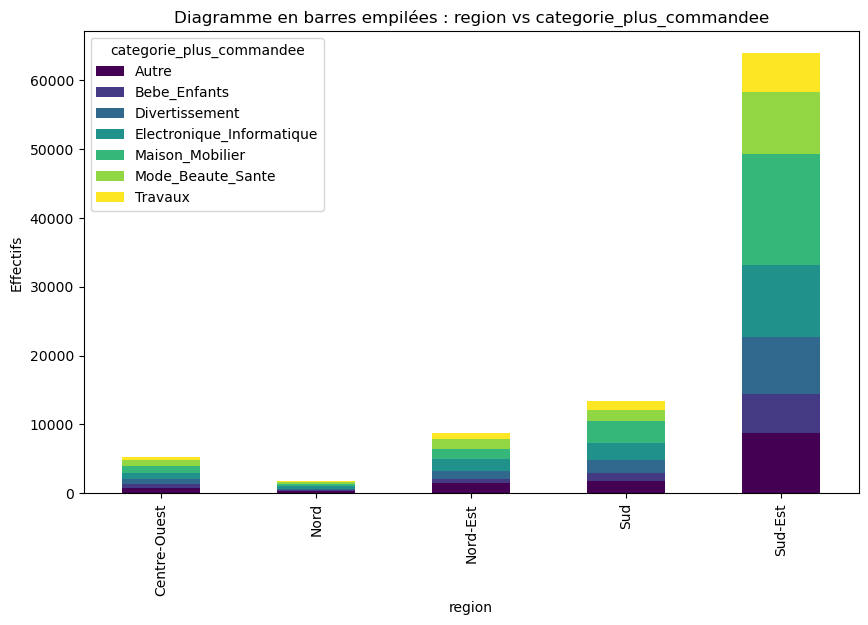

Statistique khi² pour region et categorie_plus_commandee: 626.1477542221432
p-valeur : 7.946645479174004e-117
Les variables sont dépendantes (relation significative).
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Tableau de contingence entre moyen_paiement_principal et categorie_plus_commandee :
categorie_plus_commandee  Autre  Bebe_Enfants  Divertissement  \
moyen_paiement_principal                                        
autre_moyen_paiement       2835          1675            2893   
carte_credit              10338          6379            9314   

categorie_plus_commandee  Electronique_Informatique  Maison_Mobilier  \
moyen_paiement_principal                                               
autre_moyen_paiement                           4357             4979   
carte_credit                  

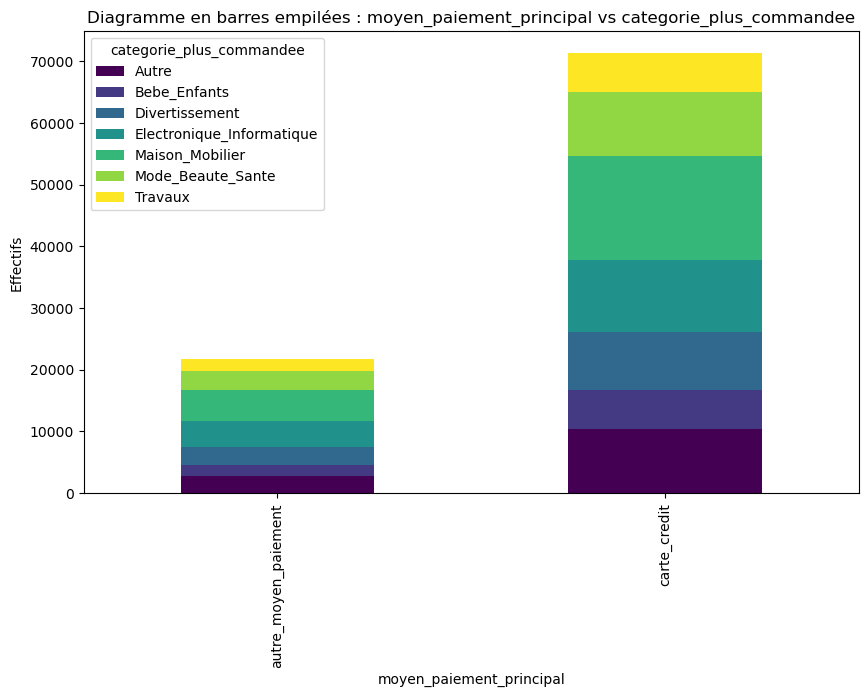

Statistique khi² pour moyen_paiement_principal et categorie_plus_commandee: 199.81316752199305
p-valeur : 2.0795704038120243e-40
Les variables sont dépendantes (relation significative).
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------


In [1481]:
# Sélectionner uniquement les colonnes qualitatives
colonnes_qualitatives = df_client_final.select_dtypes(include=['object']).columns

# Boucle sur toutes les paires de variables qualitatives
for i in range(len(colonnes_qualitatives)):
    for j in range(i + 1, len(colonnes_qualitatives)):
        var1 = colonnes_qualitatives[i]
        var2 = colonnes_qualitatives[j]
        
        # Créer le tableau de contingence
        tableau_contingence = pd.crosstab(df_client_final[var1], df_client_final[var2])
        
        # Afficher le tableau
        print(f"Tableau de contingence entre {var1} et {var2} :")
        print(tableau_contingence)
        
        # Visualiser avec un diagramme en barres empilées
        tableau_contingence.plot(kind='bar', stacked=True, figsize=(10, 6), colormap="viridis")
        plt.title(f"Diagramme en barres empilées : {var1} vs {var2}")
        plt.xlabel(var1)
        plt.ylabel("Effectifs")
        plt.legend(title=var2)
        plt.show()
        
        # Test du khi² sur le tableau de contingence
        chi2, p, dof, expected = chi2_contingency(tableau_contingence)

        print(f"Statistique khi² pour {var1} et {var2}: {chi2}")
        print(f"p-valeur : {p}")
        if p < 0.05:
            print("Les variables sont dépendantes (relation significative).")
        else:
            print("Les variables sont indépendantes.")
            
        print("-" * 120)
        print("-" * 120)

Toutes les relations entre les variables catégorielles ressortent comme significatives selon le test du khi². Toutefois, avec un échantillon de + de 90 000 observations, il est possible que certaines relations soient significatives uniquement en raison de la taille de l'échantillon.

## Analyse des corrélations entre variables catégorielles et quantitatives

Relations significatives :


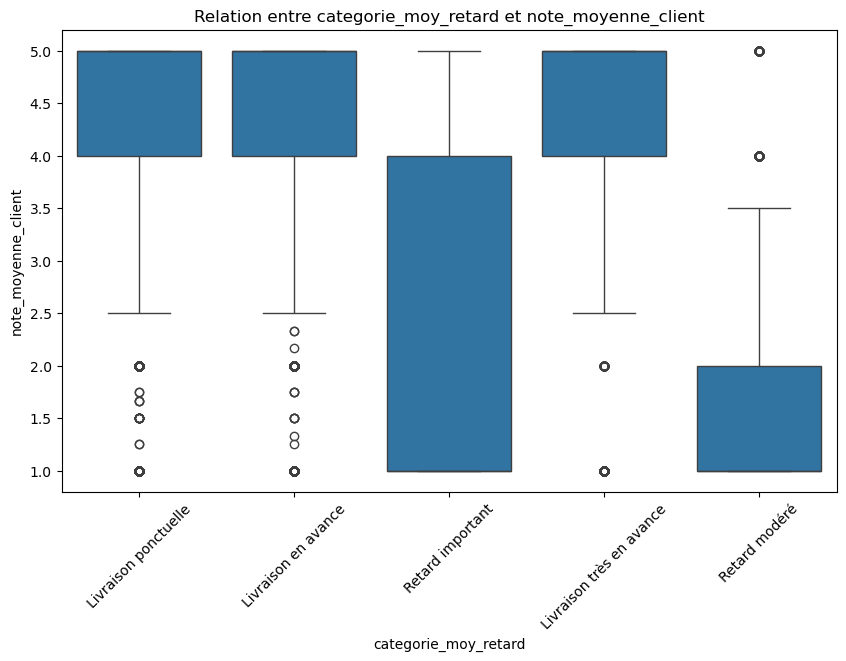

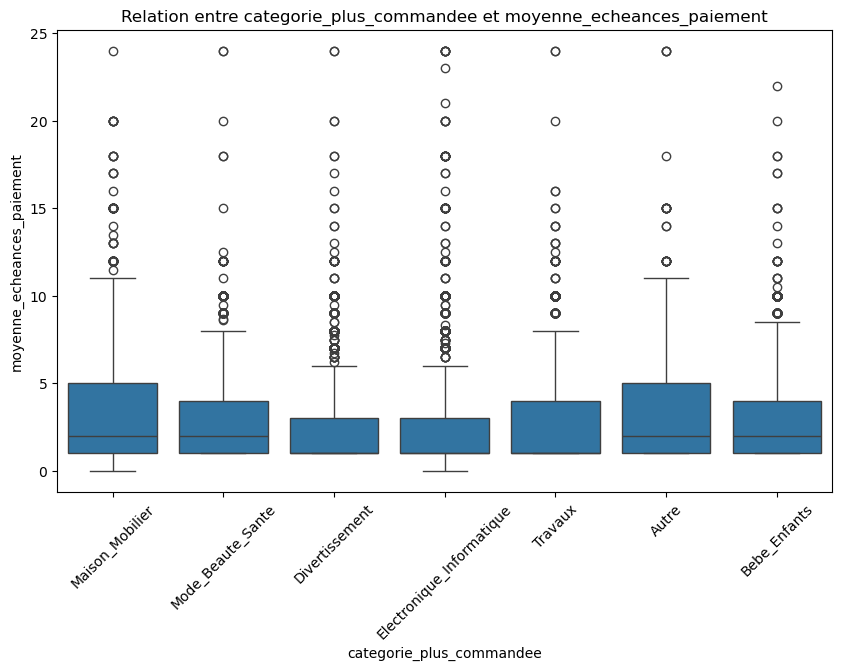

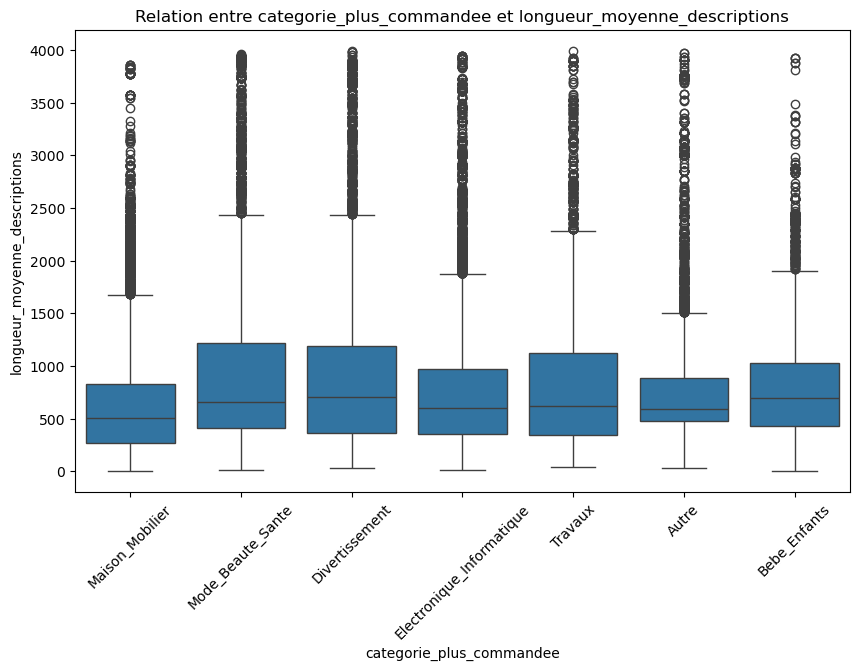

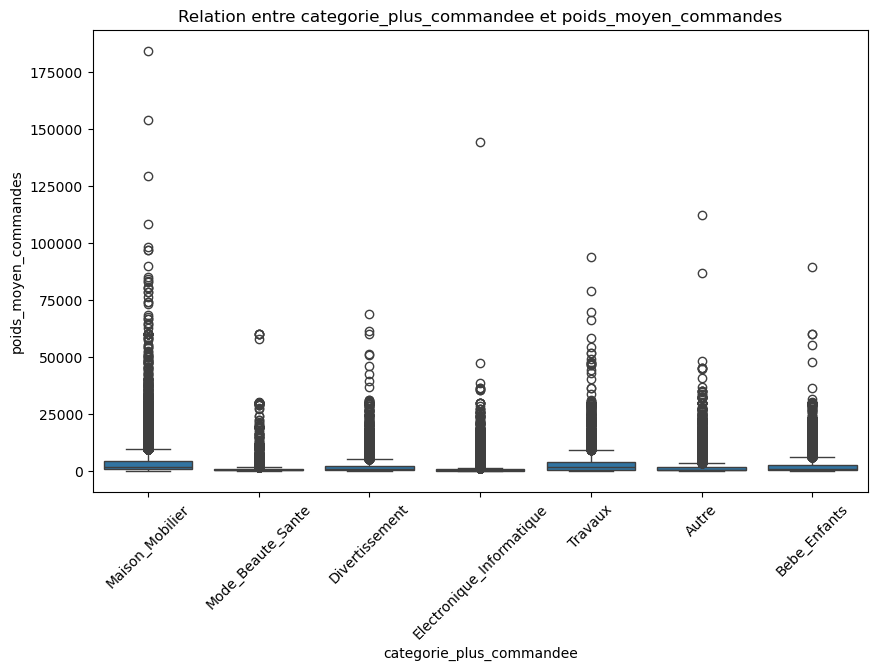

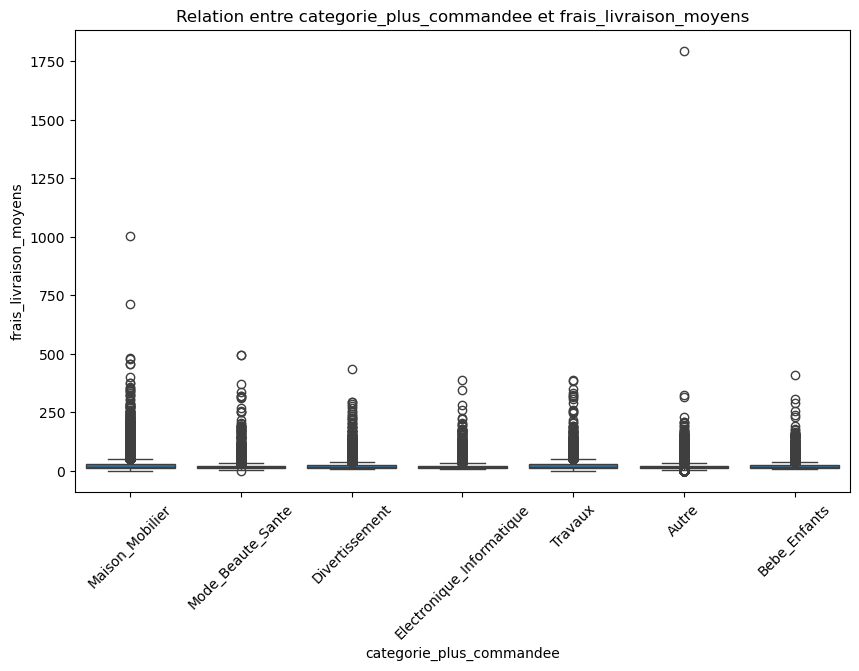

In [1482]:
# Sélectionner les variables numériques
colonnes_numeriques = df_client_final.select_dtypes(include=['number']).columns

# Définir le nombre maximal de graphes à afficher
nb_graphs_max = 5

# Résultats des tests
resultats_tests = []

# Boucle sur chaque combinaison de variable catégorielle et quantitative
for cat_var in colonnes_qualitatives:
    for quant_var in colonnes_numeriques:
        # Préparer les groupes pour le test Kruskal-Wallis
        groupes = [df_client_final[quant_var][df_client_final[cat_var] == categorie].dropna() for categorie in df_client_final[cat_var].unique()]
        
        # Vérifier qu'il y a au moins 3 groupes avec des données
        if len(groupes) >= 3:
            # Appliquer le test Kruskal-Wallis
            k_stat, p_value = stats.kruskal(*groupes)
            
            # Ajouter le résultat au tableau
            resultats_tests.append({
                'Variable_categorielle': cat_var,
                'Variable_quantitative': quant_var,
                'Statistique_Kruskal': k_stat,
                'p-valeur': p_value
            })

# Convertir les résultats en DataFrame pour une vue d'ensemble
resultats_df = pd.DataFrame(resultats_tests)

# Afficher les résultats significatifs (p-valeur < 0.05)
resultats_significatifs = resultats_df[resultats_df['p-valeur'] < 0.05].sort_values(by="p-valeur")

print("Relations significatives :")

# Limiter le nombre de graphes affichés
nb_graphes_affiches = 0

for _, row in resultats_significatifs.iterrows():
    if nb_graphes_affiches >= nb_graphs_max:
        break  # Stop si on atteint la limite
    
    cat_var = row['Variable_categorielle']
    quant_var = row['Variable_quantitative']
    
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=cat_var, y=quant_var, data=df_client_final)
    plt.title(f"Relation entre {cat_var} et {quant_var}")
    plt.xticks(rotation=45)
    plt.show()
    
    nb_graphes_affiches += 1  # Incrémenter le compteur de graphes affichés

In [1483]:
resultats_significatifs.head(10)

,Variable_categorielle,Variable_quantitative,Statistique_Kruskal,p-valeur
45,categorie_moy_retard,note_moyenne_client,5375.418871,0.0
77,categorie_plus_commandee,moyenne_echeances_paiement,2288.547668,0.0
72,categorie_plus_commandee,longueur_moyenne_descriptions,2387.041036,0.0
71,categorie_plus_commandee,poids_moyen_commandes,19446.664779,0.0
70,categorie_plus_commandee,frais_livraison_moyens,2346.344130,0.0
69,categorie_plus_commandee,total_depense,3124.879851,0.0
67,region,part_frais_livraison,2707.261418,0.0
65,region,longitude_principale_client,55185.993191,0.0
64,region,latitude_principale_client,58501.120792,0.0
57,region,delai_livraison_moyen,14376.137723,0.0


Les résultats des tests de Kruskal-Wallis montrent que plusieurs relations entre les variables catégorielles et quantitatives sont hautement significatives, avec des p-valeurs égales à 0. Cela indique que les différences observées entre les groupes sont extrêmement significatives. Par exemple, les variables comme "part_frais_livraison", "note_moyenne_client", et "total_retards_livraison" sont fortement liées aux catégories comme "categorie_moy_retard" et "categorie_plus_commandee", ce qui suggère des différences marquées entre ces groupes pour ces indicateurs.

# Analyse multivariée

L'analyse multivariée est une approche statistique essentielle qui permet d'explorer et d'analyser simultanément plusieurs variables afin de comprendre les relations complexes qui existent entre elles. Elle offre des outils puissants pour réduire la dimensionnalité des données, détecter des patterns, identifier des groupes homogènes, et interpréter les interactions entre variables. En combinant des méthodes descriptives et prédictives, elle aide à synthétiser l'information tout en préservant la richesse des données initiales. 

## Analyse de la redondance entre coordonnées géographiques et régions

Avant de poursuivre l’analyse multivariée, il est utile d’identifier d’éventuelles redondances entre les variables. Ici, nous nous interrogeons sur la nécessité de conserver les coordonnées géographiques (Latitude et Longitude), étant donné que la variable Region pourrait à elle seule capturer l'information géographique.

Pour cela, nous explorons visuellement la distribution des pays selon leurs coordonnées en les colorant par région, puis nous complétons cette approche par des statistiques descriptives et des tests d’hypothèse. L’objectif est de déterminer si les coordonnées peuvent être considérées comme redondantes par rapport à la région.

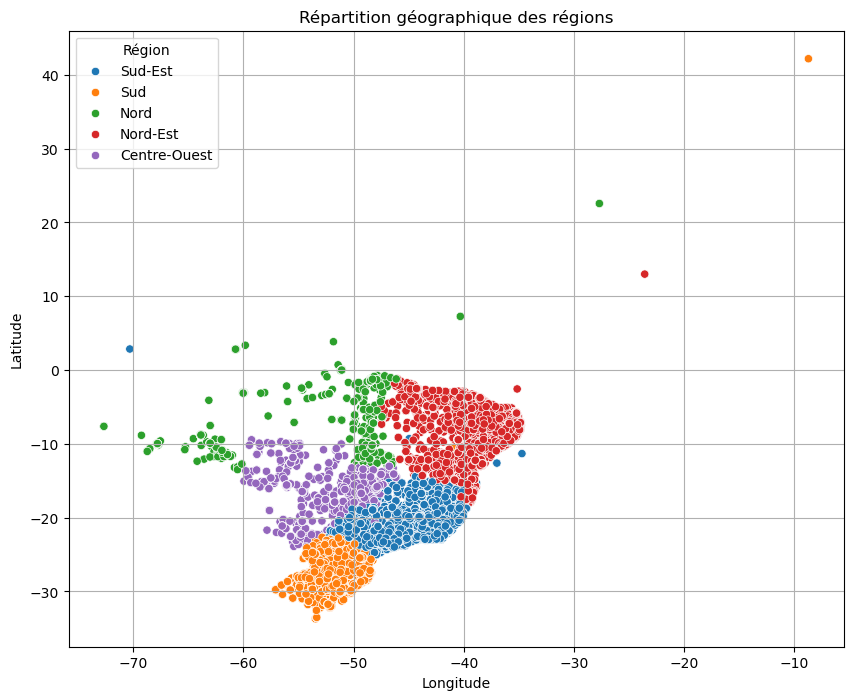

In [1484]:
# Scatter plot : Longitude en X, Latitude en Y, couleur = Région
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_client_final, x="longitude_principale_client", y="latitude_principale_client", hue="region")

plt.title("Répartition géographique des régions")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(title="Région")
plt.grid(True)
plt.show()

In [1485]:
# Calculer les statistiques pour les coordonnées des clients par région
coord_stats = df_client_final.groupby("region")[
    ["latitude_principale_client", "longitude_principale_client"]
].agg(["mean", "std"])

coord_stats

latitude_principale_client           longitude_principale_client  \
                                   mean       std                        mean   
region                                                                          
Centre-Ouest                 -16.505520  2.106045                  -50.557546   
Nord                          -4.712451  4.247763                  -52.838446   
Nord-Est                      -8.855525  3.800317                  -38.698423   
Sud                          -27.322412  2.388188                  -50.923249   
Sud-Est                      -22.438964  1.531550                  -45.684130   

                        
                   std  
region                  
Centre-Ouest  3.241001  
Nord          6.508964  
Nord-Est      2.935543  
Sud           1.785489  
Sud-Est       2.162351

L’analyse de la variance (ANOVA) est utilisée ici pour tester s’il existe une différence significative des moyennes de latitude et de longitude entre les différentes régions. En d’autres termes, on cherche à savoir si la localisation géographique varie selon la région, ou si les coordonnées géographiques sont similaires quel que soit le regroupement régional.
Si les différences sont statistiquement significatives, cela signifie que la variable Region contient déjà une bonne partie de l’information spatiale portée par les coordonnées (Latitude, Longitude).

In [1486]:
# Test ANOVA pour Latitude
latitude_groups = [group["latitude_principale_client"].values for _, group in df_client_final.groupby("region")]
f_lat, p_lat = f_oneway(*latitude_groups)

# Test ANOVA pour Longitude
longitude_groups = [group["longitude_principale_client"].values for _, group in df_client_final.groupby("region")]
f_lon, p_lon = f_oneway(*longitude_groups)

print(f"p-value Latitude :", p_lat)
print(f"p-value Longitude :", p_lon)

p-value Latitude : 0.0
p-value Longitude : 0.0


Les résultats montrent des différences nettes de moyennes de latitude et de longitude selon les régions, accompagnées de p-values nulles (< 0.05) pour les deux variables.
Cela indique que les coordonnées géographiques sont fortement dépendantes de la région : on peut donc considérer qu’elles sont redondantes, et dans certains cas, remplaçables par la variable Region.

In [1487]:
# Liste des variables à supprimer
variables_a_supprimer = [
    'latitude_principale_client', 
    'longitude_principale_client', 
]

# Supprimer les colonnes inutiles
df_client_final = df_client_final.drop(columns=variables_a_supprimer)

In [1488]:
df_client_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93103 entries, 0 to 93102
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   nb_commandes                   93103 non-null  int64  
 1   total_depense                  93103 non-null  float64
 2   frais_livraison_moyens         93103 non-null  float64
 3   poids_moyen_commandes          93103 non-null  float64
 4   longueur_moyenne_descriptions  93103 non-null  float64
 5   diversite_categories           93103 non-null  int64  
 6   delai_livraison_moyen          93103 non-null  float64
 7   total_retards_livraison        93103 non-null  int64  
 8   nb_paiements_total             93103 non-null  int64  
 9   moyenne_echeances_paiement     93103 non-null  float64
 10  diversite_max_paiements        93103 non-null  int64  
 11  note_moyenne_client            93103 non-null  float64
 12  saison_la_plus_frequente       93103 non-null 

## ACP avec variables quantitatives

L'Analyse en Composantes Principales (ACP) est une méthode statistique qui permet de réduire la dimensionnalité des données tout en préservant l'information la plus significative. Elle permet d'étudier la variabilité entre les individus, c'est-à-dire les différences et ressemblances entre eux, ainsi que les liaisons entre les variables, en identifiant des groupes de variables corrélées qui peuvent être regroupées en nouvelles variables synthétiques. Cette méthode est particulièrement adaptée à notre contexte car elle facilite la visualisation et l'interprétation des relations complexes entre plusieurs variables simultanément.

### Préparation des données

La préparation des données est une étape essentielle dans toute analyse statistique, en particulier pour l'analyse multivariée. Nous nous sommes déjà assurés de la fiablité des données et nous avons imputé toutes les données manquantes. Il nous faut maintenant normaliser nos données pour éviter que des variables à grande échelle n'influencent les résultats.

In [1380]:
# Charger le DataFrame
df = df_client_final

# Sélectionner les colonnes quantitatives pour l'ACP
colonnes_quanti = df_client_final.select_dtypes(include=['number']).columns

# Sélectionner les colonnes qualitatives comme variables supplémentaires
colonnes_quali = df_client_final.select_dtypes(include=['object']).columns

# Normalisation des données quantitatives
scaler = StandardScaler()
df_quanti_scaled = scaler.fit_transform(df[colonnes_quanti])

In [1381]:
# Appliquer l'ACP sur les données quantitatives
pca = PCA() # Initialisation d'un objet PCA
pca_result = pca.fit_transform(df_quanti_scaled)# Calcul des composantes principales et transformation des données

### Choix du nombre d'axes

Une fois l'ACP appliquée, il est essentiel de comprendre combien de composantes sont pertinentes. Cela se fait en examinant les valeurs propres et la variance expliquée.
- **Valeur propre** : Elle mesure l'importance relative de chaque composante. Une composante avec une grande valeur propre signifie qu'elle contient une grande partie de l'information des données initiales.
- **% de Variance Expliquée** : Pour chaque composante, cela indique la proportion de la variance totale des données qu'elle explique. Cela permet de déterminer quelles composantes sont les plus pertinentes pour garder l'essentiel des informations.
- **% Cumul de Variance Expliquée** : Cela montre le pourcentage total de la variance des données qui est capturé lorsque l'on considère les composantes une par une. Il aide à sélectionner le nombre optimal de composantes en fonction du seuil de variance souhaité (par exemple, conserver au moins 80% de l'information).

In [1382]:
# Créer un DataFrame pour analyser les valeurs propres
comp = pd.DataFrame({
    "Dimension": ["Dim" + str(i + 1) for i in range(len(pca.explained_variance_))], # Noms des dimensions (Dim1, ...)
    "Valeur propre": pca.explained_variance_, # Valeurs propres (quantité de variance expliquée par chaque composante)
    "% variance expliquée": np.round(pca.explained_variance_ratio_ * 100), # % de var. expliquée par chaque composante
    "% cum. var. expliquée": np.round(np.cumsum(pca.explained_variance_ratio_) * 100) # % cumulé de variance expliquée
})

comp

,Dimension,Valeur propre,% variance expliquée,% cum. var. expliquée
0,Dim1,2.256822,15.0,15.0
1,Dim2,2.203955,15.0,30.0
2,Dim3,1.694948,11.0,41.0
3,Dim4,1.265310,8.0,49.0
4,Dim5,1.202358,8.0,57.0
5,Dim6,1.063283,7.0,65.0
6,Dim7,0.994962,7.0,71.0
7,Dim8,0.916772,6.0,77.0
8,Dim9,0.770819,5.0,82.0
9,Dim10,0.754491,5.0,87.0


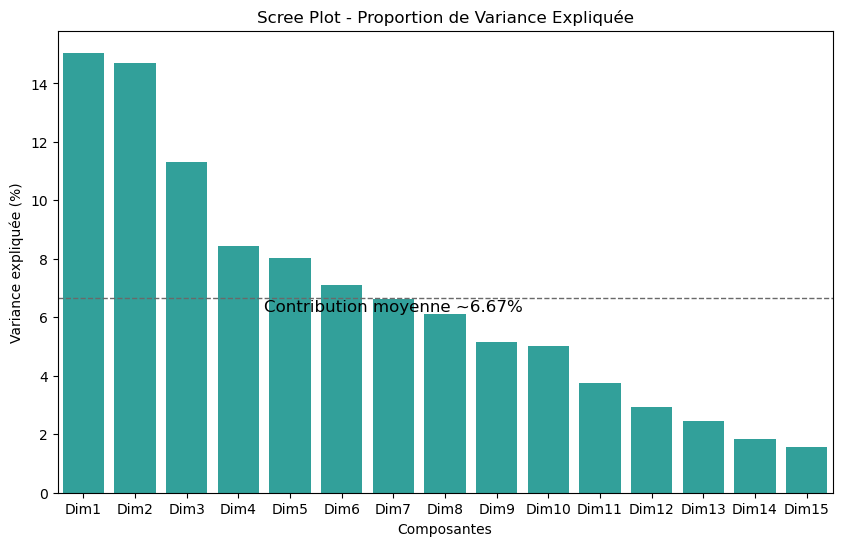

In [1383]:
# Création du DataFrame des valeurs propres pour le Scree Plot
comp = pd.DataFrame({
    "Dimension": ["Dim" + str(i + 1) for i in range(len(pca.explained_variance_))],  
    # Génération des noms de dimensions (Dim1, Dim2, ...)
    "% variance expliquée": np.round(pca.explained_variance_ratio_ * 100, 2)  
    # Calcul du pourcentage de variance expliquée pour chaque dimension
})

# Configuration du graphique
plt.figure(figsize=(10, 6))  # Définir la taille de la figure

# Création d'un barplot pour visualiser la variance expliquée par chaque composante principale
g_comp = sns.barplot(
    x="Dimension",  # Axe des abscisses : les dimensions (Dim1, Dim2, ...)
    y="% variance expliquée",  # Axe des ordonnées : le pourcentage de variance expliquée
    data=comp,  # Source des données : DataFrame 'comp'
    color="lightseagreen"  # Couleur des barres
)

# Ajouter un titre et des labels pour les axes
plt.title("Scree Plot - Proportion de Variance Expliquée")  # Titre du graphique
plt.ylabel("Variance expliquée (%)")  # Label de l'axe des ordonnées
plt.xlabel("Composantes")  # Label de l'axe des abscisses

# Tracer une ligne horizontale représentant la contribution moyenne
plt.axhline(y=100 / 15, linewidth=1, color="dimgray", linestyle="--")  # Ligne à la hauteur de la contribution moyenne
plt.text(3.5, 6.2, "Contribution moyenne ~6.67%", fontsize=12)  # Ajouter une annotation pour expliquer la ligne

# Afficher le graphique
plt.show()

L’Analyse en Composantes Principales (ACP) réalisée sur les variables quantitatives du dataset a pour objectif de réduire la dimensionnalité tout en conservant un maximum d’information.

Les résultats montrent que les deux premières dimensions, Dim1 et Dim2, expliquent chacune 15 % de la variance totale, soit 30 % au total. Elles constituent ainsi un bon point de départ pour visualiser les données en 2D tout en conservant une part significative de leur variabilité.

Les composantes suivantes apportent également une contribution non négligeable :
- Dim3 (11 %), Dim4 (8 %), Dim5 (8 %), Dim6 (7 %), Dim7 (7 %).

En cumulant les sept premières dimensions, on atteint 71 % de variance expliquée, ce qui montre qu’une large part de l'information contenue dans les données est concentrée dans ces composantes. Ces dimensions sont donc pertinentes pour l’analyse et la visualisation de la structure des données.

À partir de Dim8, les contributions passent sous le seuil de la moyenne (≈ 6.7 %), indiquant que les dimensions suivantes apportent une information plus marginale.

### Interprétation des composantes principales

Nous allons explorer et comprendre comment les composantes principales générées par l'Analyse en Composantes Principales (ACP) sont structurées et quelles relations elles entretiennent avec les variables initiales.
Nous souhaitons interpréter chaque composante principale pour identifier quelles variables contribuent le plus à chaque axe principal et ainsi comprendre la structure des données. Cela permet d’analyser la répartition des informations dans notre jeu de données et de découvrir des patterns ou des relations cachées.

Nous accédons aux composantes principales via pca.components_. Chaque composante représente une combinaison linéaire des variables originales et capture une partie des informations contenues dans les données.
Les valeurs dans le DataFrame montrent la contribution relative des variables à chaque composante principale.

In [1384]:
# Obtenir les composantes principales
pcs = pca.components_  # Matrice des vecteurs propres (composantes principales) issus de l'ACP

# Création d'un DataFrame pour interpréter chaque composante
df_pcs = pd.DataFrame(
    pcs,  # Les composantes principales
    columns=df[colonnes_quanti].columns,  # Noms des colonnes correspondant aux variables originales
    index=[f'F{i+1}' for i in range(df[colonnes_quanti].shape[1])]  # Index représentant les nouvelles dim (F1, ...)
)

# Transposer le DataFrame pour visualiser les contributions de chaque variable dans chaque dimension
df_pcs.T  # Afficher la transposition du DataFrame pour faciliter l'interprétation

,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,F11,F12,F13,F14,F15
nb_commandes,0.512675,-0.174895,0.186217,-0.148758,-0.289020,-0.008117,-0.008841,0.048673,0.048705,-0.024425,0.014018,0.198689,0.061026,-0.422928,0.581799
total_depense,0.280334,0.405342,-0.150320,-0.174560,0.113444,-0.013110,-0.000778,-0.027592,0.028639,-0.061547,0.768297,-0.090775,-0.251898,-0.108996,-0.108531
frais_livraison_moyens,0.204978,0.474038,-0.044496,0.417115,-0.112748,-0.118324,-0.027190,0.055580,0.023131,-0.009459,0.017083,-0.017645,0.364235,0.513977,0.358746
poids_moyen_commandes,0.203617,0.459348,-0.093524,0.324641,-0.032481,-0.026698,-0.008139,-0.018391,0.153294,-0.273599,-0.469670,0.042547,-0.301675,-0.405680,-0.234285
longueur_moyenne_descriptions,0.062727,0.137928,-0.112621,-0.293156,0.244424,-0.345170,-0.062670,0.777644,-0.142438,0.191368,-0.181905,0.018801,-0.016375,-0.014140,0.007235
diversite_categories,0.457641,-0.162053,0.181213,-0.183611,-0.345651,-0.039299,-0.016717,0.052440,0.113279,-0.026420,-0.144692,-0.582221,-0.104850,0.308125,-0.307118
delai_livraison_moyen,-0.111577,0.287143,0.555639,-0.102886,-0.082477,0.082928,0.029460,0.105489,0.273764,0.158956,0.092017,0.070971,0.522428,-0.240495,-0.340026
total_retards_livraison,-0.301662,0.226919,0.452988,-0.210711,0.076259,-0.132818,-0.007152,-0.087646,0.359889,0.044190,-0.085775,-0.042131,-0.507947,0.204987,0.368898
nb_paiements_total,0.433976,-0.170779,0.294097,0.106332,0.329325,0.002353,0.007425,-0.048904,0.000379,0.056474,-0.007890,0.596989,-0.166469,0.333357,-0.274420
moyenne_echeances_paiement,0.145303,0.300193,-0.156772,-0.245811,-0.032651,0.276090,0.072234,-0.316776,-0.219620,0.713037,-0.246840,0.015025,-0.052111,0.000474,0.019706


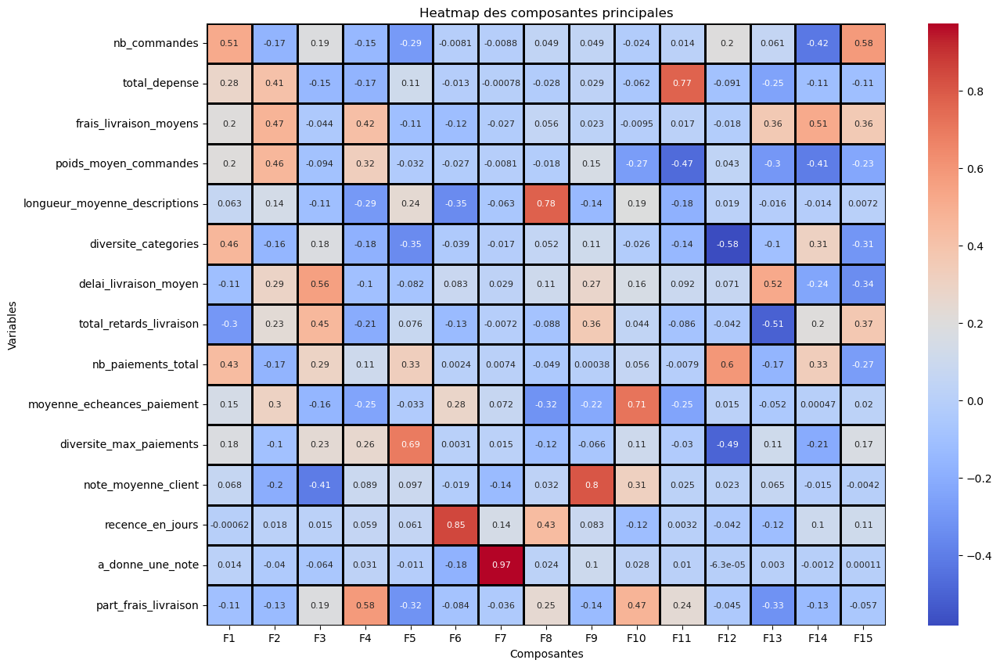

In [1385]:
# Afficher la heatmap
plt.figure(figsize=(14, 10))  # Définir la taille de la figure pour un affichage clair

# Créer une heatmap basée sur les coefficients des composantes principales
sns.heatmap(
    df_pcs.T,  # Transposer le DataFrame pour afficher les variables en lignes et les composantes en colonnes
    annot=True,  # Ajouter les annotations (valeurs numériques) sur la heatmap
    cmap='coolwarm',  # Palette de couleurs pour indiquer les valeurs positives et négatives
    linewidths=1,  # Épaisseur des lignes séparant les cellules
    linecolor='black',  # Couleur des lignes séparant les cellules
    annot_kws={"size": 8}  # Réduit la taille de la police
)

# Ajouter un titre et des étiquettes pour les axes
plt.title("Heatmap des composantes principales")  # Titre de la heatmap
plt.xlabel("Composantes")  # Étiquette pour l'axe des abscisses
plt.ylabel("Variables")  # Étiquette pour l'axe des ordonnées

# Afficher la heatmap
plt.show()

| **Axe**         | **Variables dominantes > 0**                                                  | **Variables dominantes < 0**                                             | **Interprétation**                                                                 |
|:----------------|:------------------------------------------------------------------------------|:------------------------------------------------------------------------|:-----------------------------------------------------------------------------------|
| **F1**          | nb_commandes (0.51), nb_paiements_total (0.43), diversite_categories (0.46)    | -                                                                       | Axe centré sur le **comportement d'achat global**, en particulier la **fréquence des commandes** et la **diversité des catégories** de produits achetés. |
| **F2**          | frais_livraison_moyens (0.47), total_depense (0.41), poids_moyen_commandes (0.46) | -                                                                       | Lié à la **gestion des paiements**, des **frais de livraison** et de la **taille des commandes**, ce qui influence les comportements d'achat en fonction des coûts. |
| **F3**          | delai_livraison_moyens (0.56), total_retards_livraison (0.45)                  | note_moyenne_client (-0.41)                                             | Influencé par les **délais et retards de livraison**, cet axe met en évidence l'impact de ces facteurs sur la **satisfaction client** et leurs **évaluations**. |
| **F4**          | frais_livraison_moyens (0.42), poids_moyen_commandes (0.32), part_frais_livraison (0.58) | -                                                                       | Combinaison de **logistique**, de **gestion des paiements** et des **frais de livraison** ayant un impact majeur sur l'expérience d'achat et la perception des clients. |
| **F5**          | diversite_max_paiements (0.69), nb_paiements_total (0.33)                      | part_frais_livraison (-0.32), diversite_categories (-0.35)               | L'axe capture l'**engagement client** à travers la diversité des **méthodes de paiement** et la gestion des **frais de livraison**, tout en tenant compte de l'influence négative de la diversité des catégories et des frais. |
| **F6**          | recence_en_jours (0.85)                                                       | longueur_moyenne_descriptions (-0.35)                                    | Cet axe est fortement lié à la **récence des achats**, indiquant que les clients actifs influencent les décisions d'achat, mais l'impact des **descriptions de produits** semble faible. |
| **F7**          | a_donne_une_note (0.97)                                                      | -                                                                       | Cet axe capture l'**engagement client** via les **avis laissés**, suggérant que les clients ayant donné des avis sont très impliqués dans l'expérience d'achat. |


### Analyse des contributions des variables
Pour approfondir notre compréhension de la structure des données, nous allons examiner les contributions relatives de chaque variable aux composantes principales.

In [1391]:
# Calcul des contributions
contributions = df_pcs ** 2  # Calcul des contributions des variables en élevant chaque coefficient au carré

# Normalisation des contributions pour obtenir des pourcentages
for col in contributions.columns:  # Boucle sur chaque colonne
    contributions[col] = contributions[col] / contributions[col].sum() * 100  # Normalisation

# Arrondir les valeurs à deux décimales pour une meilleure lisibilité
contributions_rounded = contributions.round(2)  # Arrondir les contributions à deux décimales

# Conversion des valeurs en pourcentages (sous forme de chaîne) pour un affichage clair
contributions_percentage = contributions_rounded.map(lambda x: f"{x:.2f}%")  # Appliquer un formatage

# Afficher les contributions en pourcentage transposées pour plus de lisibilité
print("\nContributions en pourcentage :")
contributions_percentage.T  # Transposer le DataFrame pour afficher les composantes principales en colonnes


Contributions en pourcentage :


,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,F11,F12,F13,F14,F15
nb_commandes,26.28%,3.06%,3.47%,2.21%,8.35%,0.01%,0.01%,0.24%,0.24%,0.06%,0.02%,3.95%,0.37%,17.89%,33.85%
total_depense,7.86%,16.43%,2.26%,3.05%,1.29%,0.02%,0.00%,0.08%,0.08%,0.38%,59.03%,0.82%,6.35%,1.19%,1.18%
frais_livraison_moyens,4.20%,22.47%,0.20%,17.40%,1.27%,1.40%,0.07%,0.31%,0.05%,0.01%,0.03%,0.03%,13.27%,26.42%,12.87%
poids_moyen_commandes,4.15%,21.10%,0.87%,10.54%,0.11%,0.07%,0.01%,0.03%,2.35%,7.49%,22.06%,0.18%,9.10%,16.46%,5.49%
longueur_moyenne_descriptions,0.39%,1.90%,1.27%,8.59%,5.97%,11.91%,0.39%,60.47%,2.03%,3.66%,3.31%,0.04%,0.03%,0.02%,0.01%
diversite_categories,20.94%,2.63%,3.28%,3.37%,11.95%,0.15%,0.03%,0.27%,1.28%,0.07%,2.09%,33.90%,1.10%,9.49%,9.43%
delai_livraison_moyen,1.24%,8.25%,30.87%,1.06%,0.68%,0.69%,0.09%,1.11%,7.49%,2.53%,0.85%,0.50%,27.29%,5.78%,11.56%
total_retards_livraison,9.10%,5.15%,20.52%,4.44%,0.58%,1.76%,0.01%,0.77%,12.95%,0.20%,0.74%,0.18%,25.80%,4.20%,13.61%
nb_paiements_total,18.83%,2.92%,8.65%,1.13%,10.85%,0.00%,0.01%,0.24%,0.00%,0.32%,0.01%,35.64%,2.77%,11.11%,7.53%
moyenne_echeances_paiement,2.11%,9.01%,2.46%,6.04%,0.11%,7.62%,0.52%,10.03%,4.82%,50.84%,6.09%,0.02%,0.27%,0.00%,0.04%


<Figure size 1200x800 with 0 Axes>

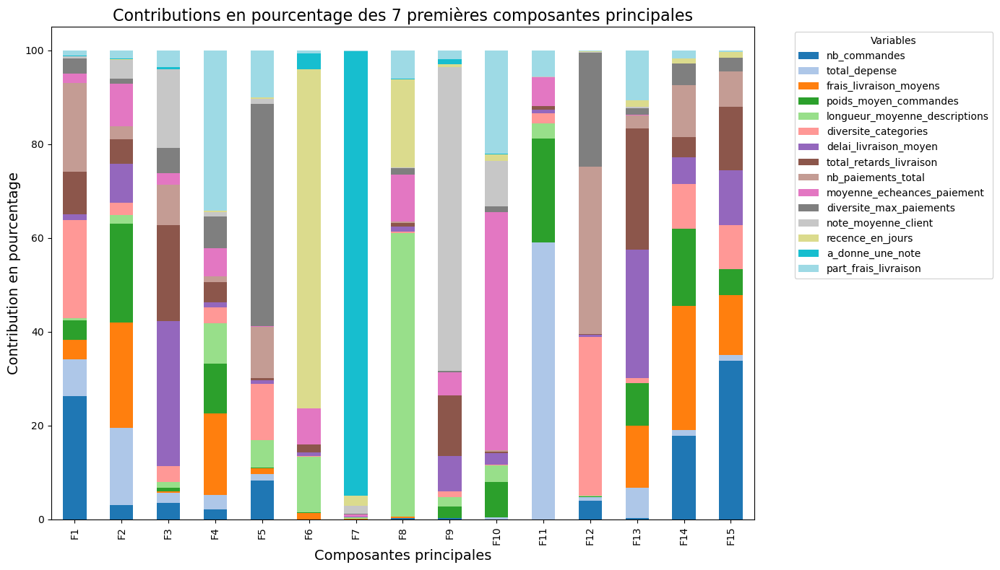

In [1392]:
# Tracer le graphique
plt.figure(figsize=(12, 8))
contributions.plot(kind='bar', stacked=True, figsize=(14, 8), colormap='tab20')

# Ajouter des étiquettes et un titre
plt.title('Contributions en pourcentage des 7 premières composantes principales', fontsize=16)
plt.xlabel('Composantes principales', fontsize=14)
plt.ylabel('Contribution en pourcentage', fontsize=14)
plt.legend(title='Variables', bbox_to_anchor=(1.05, 1), loc='upper left')

# Afficher le graphique
plt.tight_layout()
plt.show()

**F1 : Comportement d'achat global**<br>
Cet axe mesure l'activité globale des clients, en mettant l'accent sur leur fréquence d'achat (nb_commandes), leur diversité dans les catégories (diversite_categories), leurs paiements (nb_paiements_total), et les retards de livraison (total_retards_livraison).

**F2 : Logistique et finances**<br>
Cet axe est lié aux aspects logistiques comme les frais moyens de livraison (frais_livraison_moyens) et le poids moyen des commandes (poids_moyen_commandes), ainsi qu'aux dépenses totales (total_depense) effectuées par les clients.

**F3 : Délais de livraison et satisfaction client**<br>
Cet axe capture les comportements liés aux délais moyens de livraison (delai_livraison_moyen) et aux retards (total_retards_livraison). Il inclut également la satisfaction client mesurée par la note moyenne (note_moyenne_client).

**F4 : Frais logistiques**<br>
Cet axe combine les aspects financiers comme la proportion des frais de livraison dans le total dépensé (part_frais_livraison) avec les frais moyens de livraison (frais_livraison_moyens) et le poids moyen des commandes.

**F5 : Diversité dans les paiements**<br>
Cet axe capture l'engagement client via la diversité maximale dans leurs moyens de paiement (diversite_max_paiements) tout en reflétant leurs paiements totaux (nb_paiements_total) et leur diversité dans les catégories d'achat.

**F6 : Récence et descriptions produits**<br>
Cet axe est fortement lié au comportement actif ou inactif récent des clients (recence_en_jours) avec une influence mineure liée aux caractéristiques textuelles des produits achetés (longueur_moyenne_descriptions) et aux échéances moyennes de paiement.

**F7 : Engagement client via avis**<br>
Cet axe mesure directement l'engagement client via leur interaction avec la marque sous forme d'avis donnés (a_donne_une_note).

### Cercle des corrélations
Dans le cadre de l'Analyse en Composantes Principales (ACP), les cercles des corrélations permettent de mieux comprendre la relation entre les variables initiales et les composantes principales.

Chaque flèche sur le cercle représente une variable originale du dataset et sa contribution à une composante principale spécifique. La direction et la longueur des flèches indiquent :

La force de la corrélation : Une longueur plus grande signifie une contribution plus forte de la variable à la composante. La direction de la corrélation : Une direction similaire entre les flèches montre une corrélation positive, tandis qu'une direction opposée révèle une corrélation négative. Ces cercles permettent ainsi d’identifier quelles variables influencent le plus chaque composante principale, facilitant ainsi :

L'interprétation des composantes : Savoir quelles variables sont dominantes sur chaque axe principal. La réduction des dimensions : Comprendre quelles variables peuvent être regroupées ou ignorées sans perdre trop d'informations importantes. En visualisant ces corrélations, on peut mieux saisir les structures sous-jacentes des données, détecter des schémas significatifs, et interpréter les relations complexes entre les différentes composantes principales et les variables de l'analyse.

In [1283]:
def correlation_graph(pca, x_y, features, threshold=0.4):
    """
    Affiche le graphe des corrélations avec un zoom sur les variables les plus significatives.
    
    Arguments positionnels :
    -----------------------------------
    pca : sklearn.decomposition.PCA : L'objet PCA utilisé pour l'analyse
    x_y : list ou tuple : Le couple (x, y) correspondant aux plans à afficher, ex. [0,1] pour F1 et F2
    features : list ou tuple : La liste des variables (dimensions) à représenter
    threshold : float : Seuil de corrélation absolue pour sélectionner les variables à afficher
    """
    # Extraire les indices des axes à représenter (x et y)
    x, y = x_y
    
    # Créer la figure et les axes avec une taille spécifiée
    fig, ax = plt.subplots(figsize=(12, 12))  # Augmenter la taille du graphique
    
    # Ajouter un quadrillage discret pour améliorer la lisibilité
    ax.grid(color='lightgrey', linestyle='--', linewidth=0.5)
    
    # Calcul des coefficients de corrélation (valeurs absolues)
    correlations = np.abs(pca.components_[x, :]), np.abs(pca.components_[y, :])

    # Sélectionner uniquement les variables ayant une corrélation importante avec les composantes
    significant_variables = [
        i for i in range(len(features)) 
        if correlations[0][i] > threshold or correlations[1][i] > threshold
    ]

    # Parcourir les variables significatives pour les afficher
    for i in significant_variables:
        # Dessiner une flèche représentant la projection de chaque variable sur le plan (F1, F2)
        ax.arrow(0, 0, 
                 pca.components_[x, i],  # Coordonnée x
                 pca.components_[y, i],  # Coordonnée y
                 head_width=0.07,         # Largeur de la tête de flèche
                 head_length=0.07,        # Longueur de la tête de flèche
                 width=0.02)              # Épaisseur de la flèche

        # Ajouter un label pour chaque variable près de la tête de sa flèche
        ax.text(
            pca.components_[x, i] + 0.05,  # Position x légèrement décalée
            pca.components_[y, i] + 0.05,  # Position y légèrement décalée
            features[i]                    # Nom de la variable
        )

    # Ajouter des lignes horizontales et verticales passant par l'origine
    ax.plot([-1, 1], [0, 0], color='grey', ls='--')  # Ligne horizontale
    ax.plot([0, 0], [-1, 1], color='grey', ls='--')  # Ligne verticale

    # Ajouter les noms des axes avec le pourcentage d'inertie expliqué
    ax.set_xlabel('F{} ({}%)'.format(x + 1, round(100 * pca.explained_variance_ratio_[x], 1)))
    ax.set_ylabel('F{} ({}%)'.format(y + 1, round(100 * pca.explained_variance_ratio_[y], 1)))

    # Ajouter un titre décrivant le cercle des corrélations
    ax.set_title("Cercle des corrélations (F{} et F{})".format(x + 1, y + 1))

    # Tracer un cercle unité pour visualiser les limites des projections
    an = np.linspace(0, 2 * np.pi, 100)  # Angles pour dessiner un cercle
    ax.plot(np.cos(an), np.sin(an))       # Coordonnées x et y du cercle

    # S'assurer que les axes ont une échelle égale pour éviter la distorsion
    ax.axis('equal')

    # Afficher le graphique
    plt.tight_layout()
    plt.show(block=False)

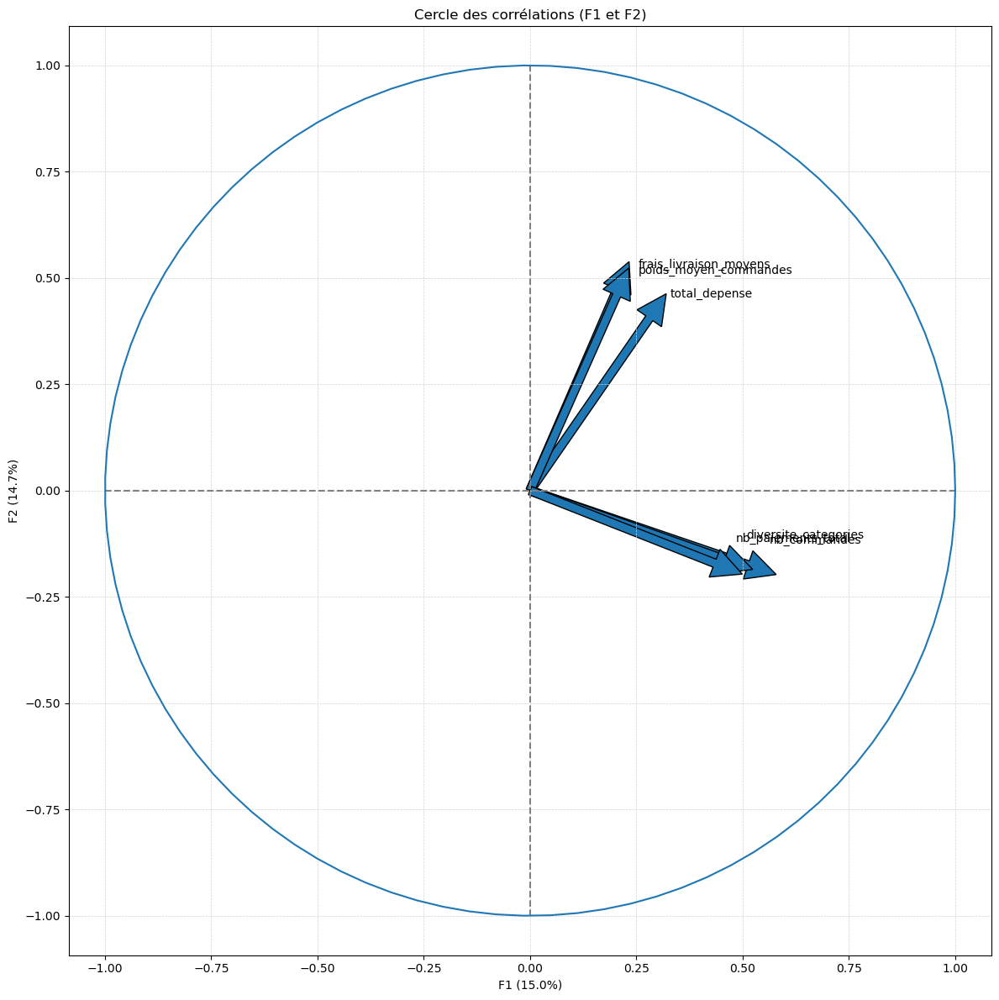

In [1386]:
# Pour comparer F1 avec F2
correlation_graph(pca, [0, 1], df[colonnes_quanti].columns, threshold=0.4)

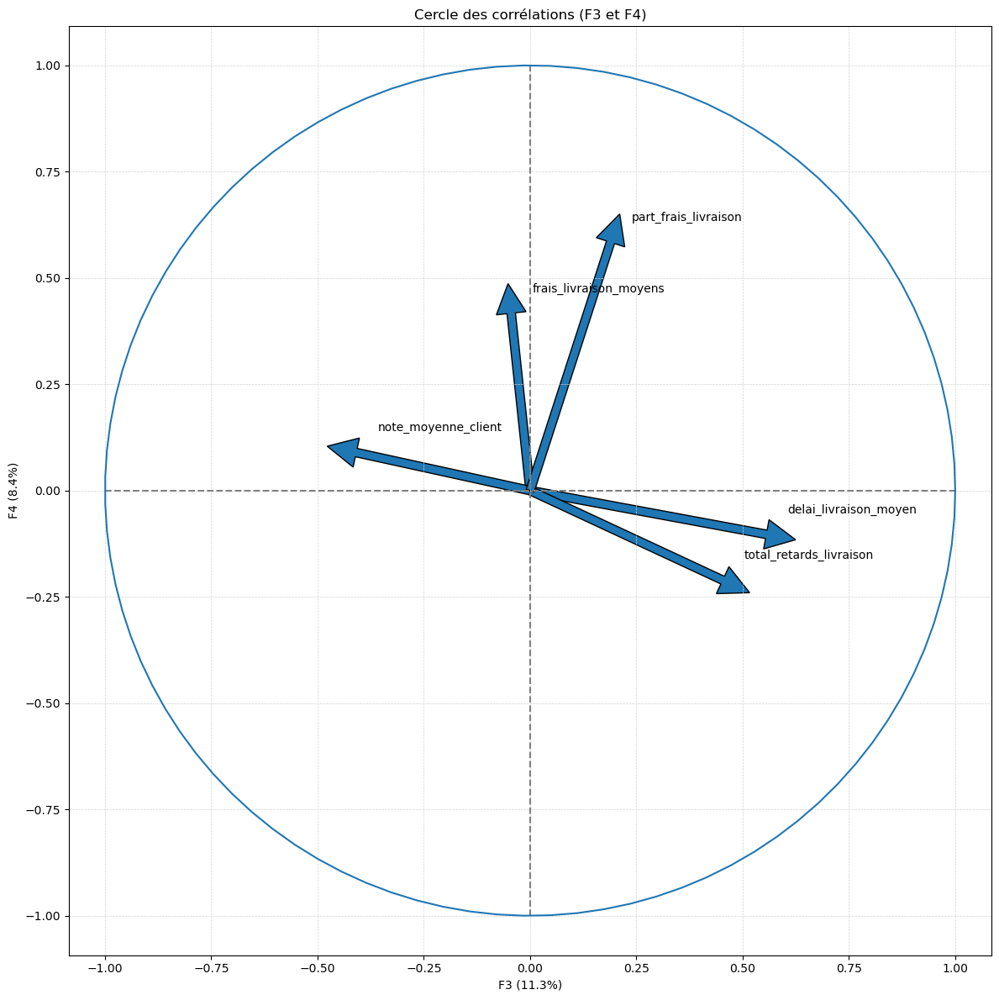

In [1387]:
# Pour comparer F3 avec F4
correlation_graph(pca, [2, 3], df[colonnes_quanti].columns)

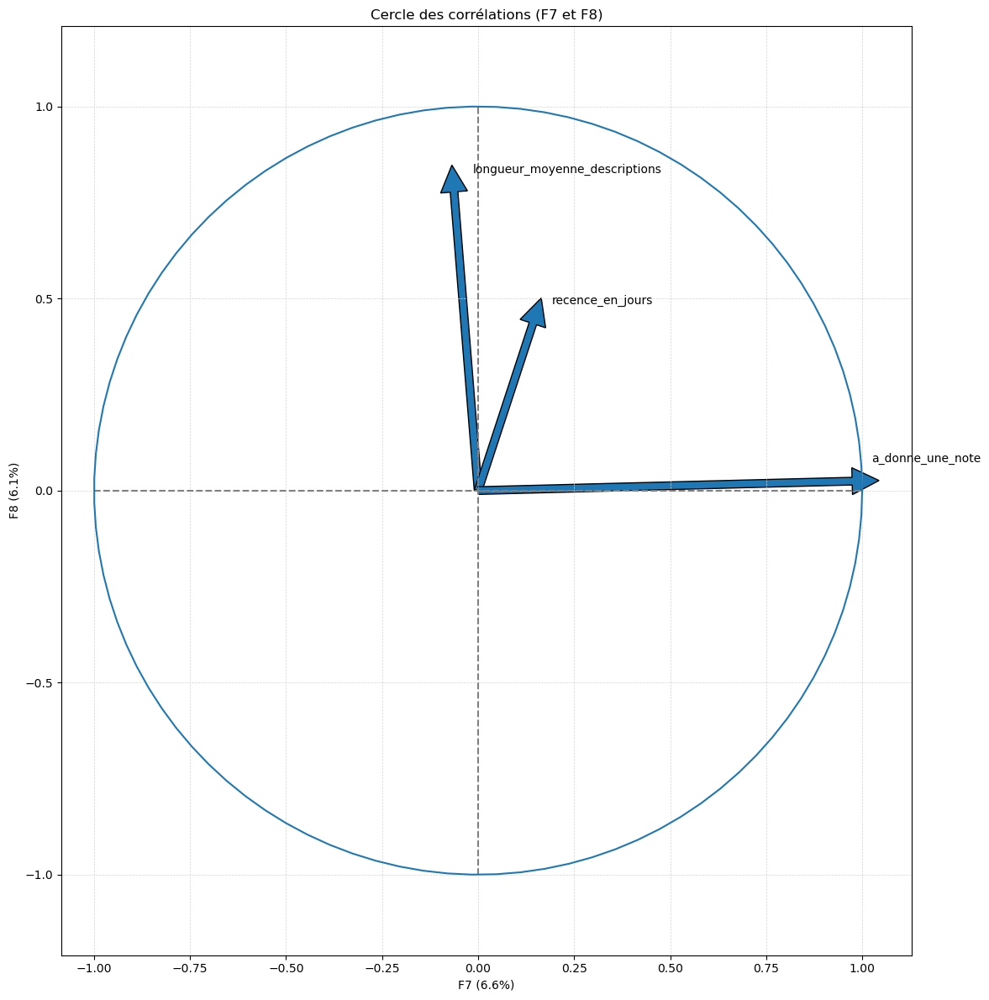

In [1388]:
# Pour comparer F6 avec F7
correlation_graph(pca, [6, 7], df[colonnes_quanti].columns)

D'après notre analyse en composantes principales (ACP), les comportements des clients se distinguent selon plusieurs dimensions fondamentales. Ces axes permettent de mieux comprendre leurs habitudes d'achat, leur engagement envers la marque, et leur expérience logistique. Les différences entre nos clients reposent principalement sur :

- Leur fréquence et montant d'achat (F1, nb_commandes, total_depense).
- Leur récence d'achat (F6, recence_en_jours).
- Leur diversité d'achat (F2, diversite_categories).
- Leur engagement envers la marque (F2 et F7, a_donne_une_note).
- Leurs choix financiers (F3 et F5, nb_paiements_total, diversite_max_paiements).
- Leur expérience logistique (F3 et F4, delai_livraison_moyen, total_retards_livraison).

### Nuages des individus sur les principaux axes factoriel

In [1389]:
# Créer un DataFrame des coordonnées des individus sur les composantes principales
df_pca = pd.DataFrame(pca_result, columns=[f'F{i+1}' for i in range(pca.n_components_)])

# Ajouter toutes les variables qualitatives au DataFrame des composantes principales
for var in colonnes_quali:  # colonnes_quali contient les noms des colonnes qualitatives
    df_pca[var] = df[var]  # Ajouter chaque variable qualitative au DataFrame df_pca

# Vérifier que les variables qualitatives ont bien été ajoutées
print("Colonnes disponibles dans df_pca :")
df_pca.columns

Colonnes disponibles dans df_pca :


Index(['F1', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11',
       'F12', 'F13', 'F14', 'F15', 'saison_la_plus_frequente',
       'jour_le_plus_frequent', 'categorie_moy_retard', 'region',
       'moyen_paiement_principal', 'categorie_plus_commandee'],
      dtype='object')

<Figure size 1300x1200 with 0 Axes>

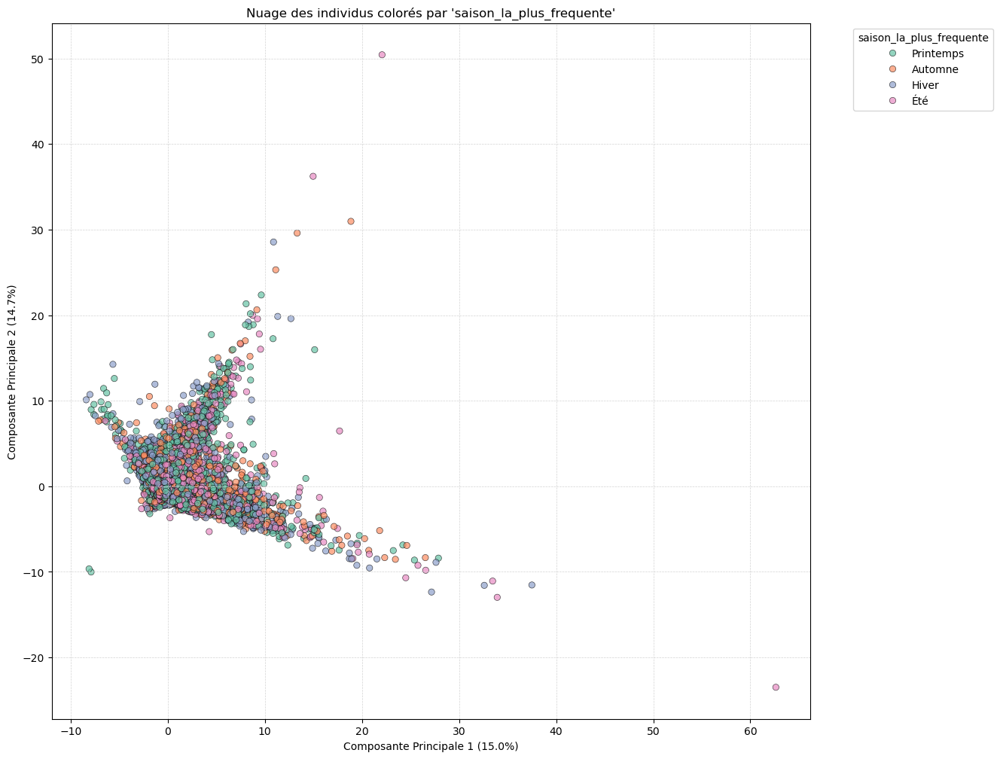

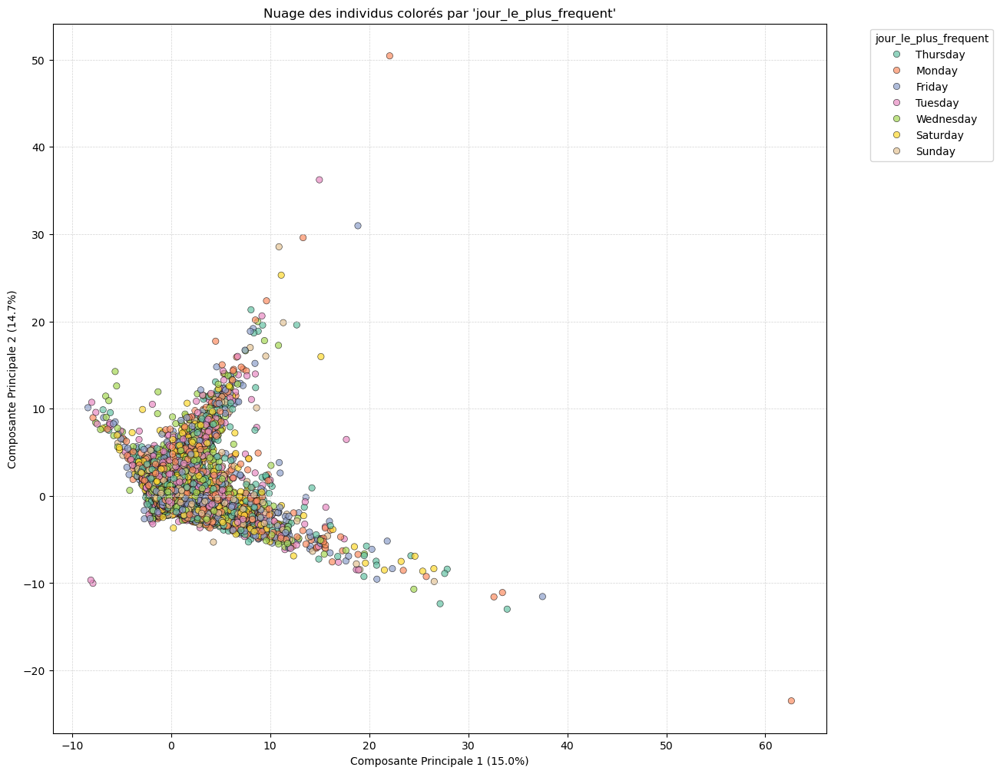

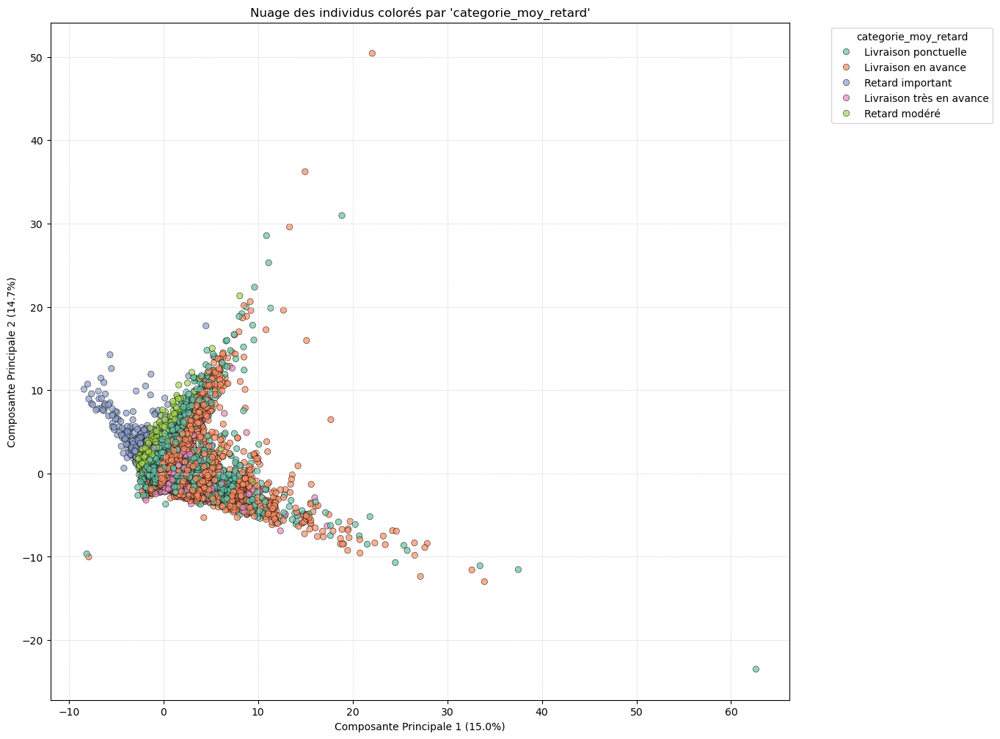

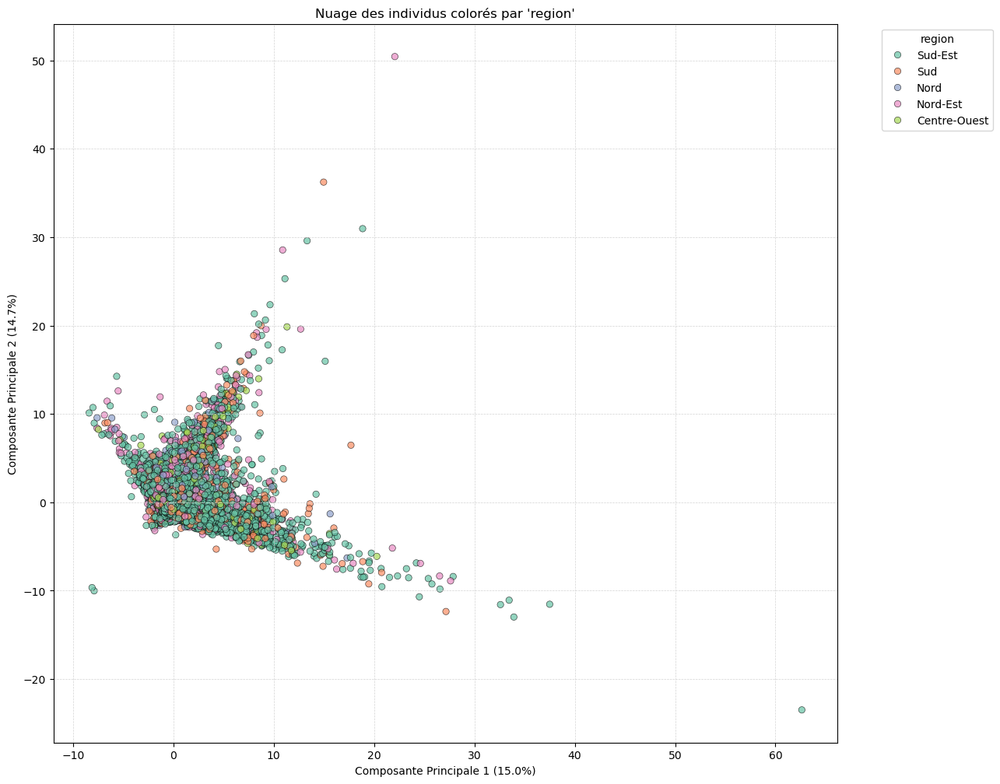

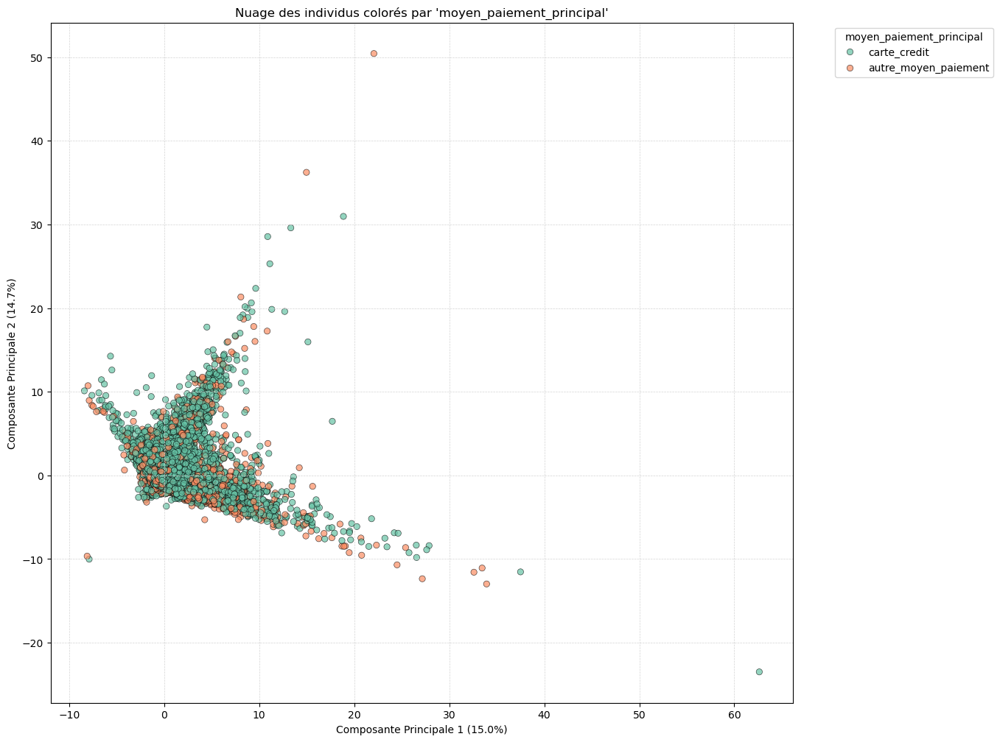

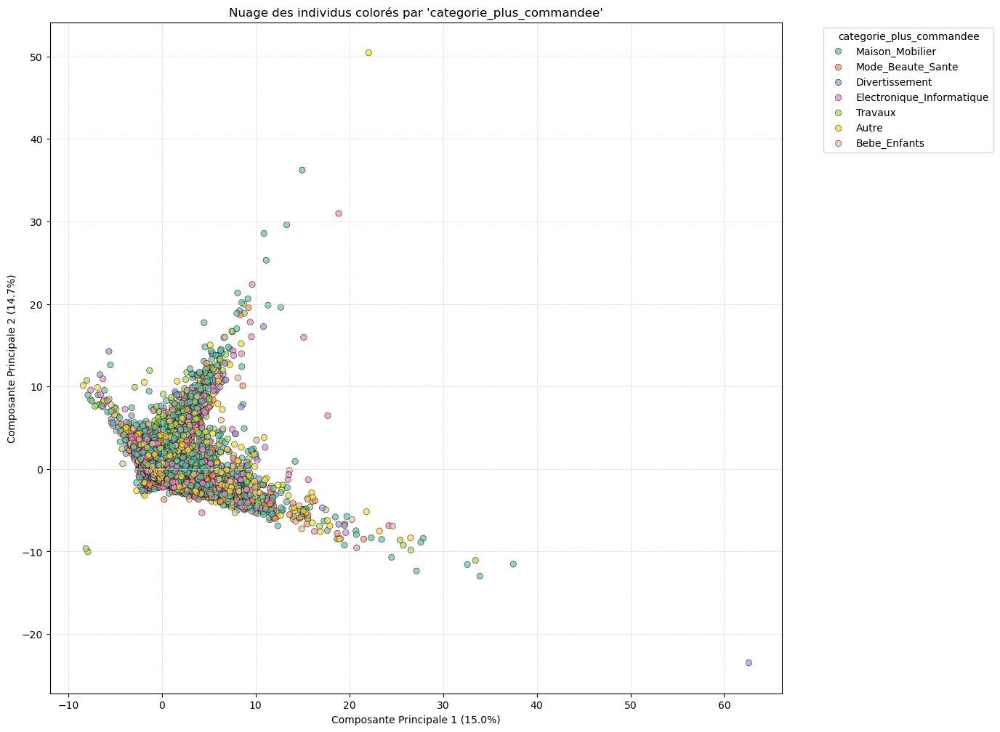

In [1390]:
# Obtenir les deux premières composantes principales
pc1 = pca_result[:, 0]  # Première composante
pc2 = pca_result[:, 1]  # Deuxième composante

# Visualisation des composantes principales avec coloration par variable catégorielle
plt.figure(figsize=(13, 12))

for var in colonnes_quali:
    plt.figure(figsize=(13, 12))
    sns.scatterplot(
        x=pc1, 
        y=pc2, 
        hue=df_pca[var],  # Utiliser chaque variable catégorielle
        palette='Set2',
        alpha=0.7,
        edgecolor='k'
    )
    plt.title(f"Nuage des individus colorés par '{var}'")
    plt.xlabel(f'Composante Principale 1 ({pca.explained_variance_ratio_[0] * 100:.1f}%)')
    plt.ylabel(f'Composante Principale 2 ({pca.explained_variance_ratio_[1] * 100:.1f}%)')
    plt.legend(title=var, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(color='lightgrey', linestyle='--', linewidth=0.5)
    plt.show()

<Figure size 1300x1200 with 0 Axes>

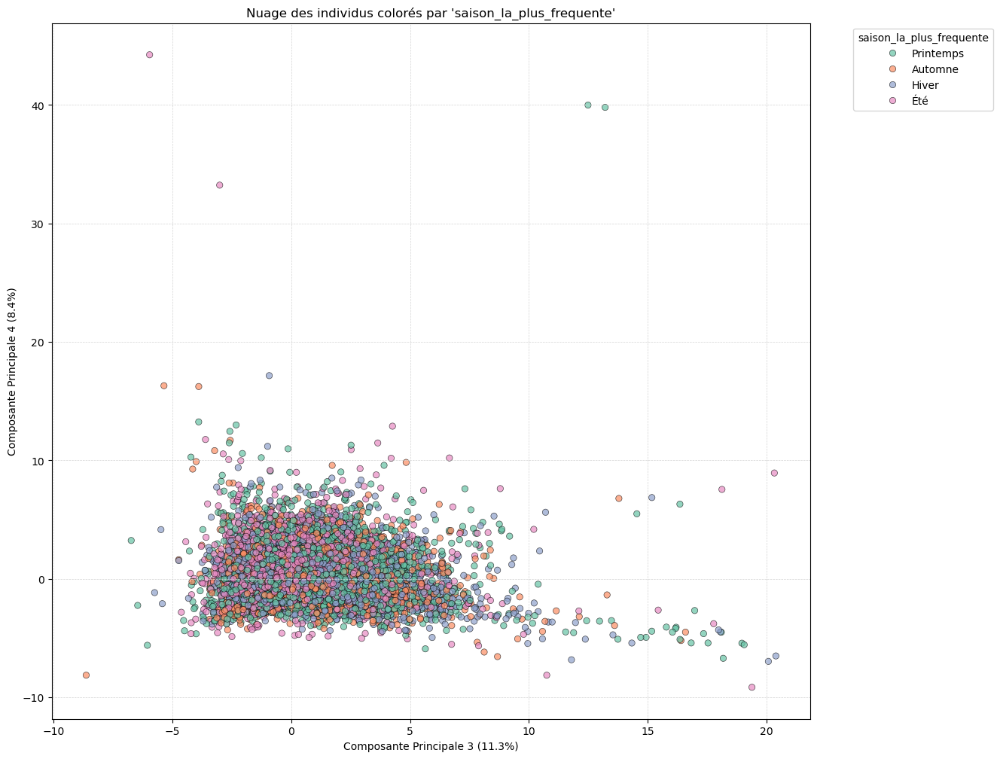

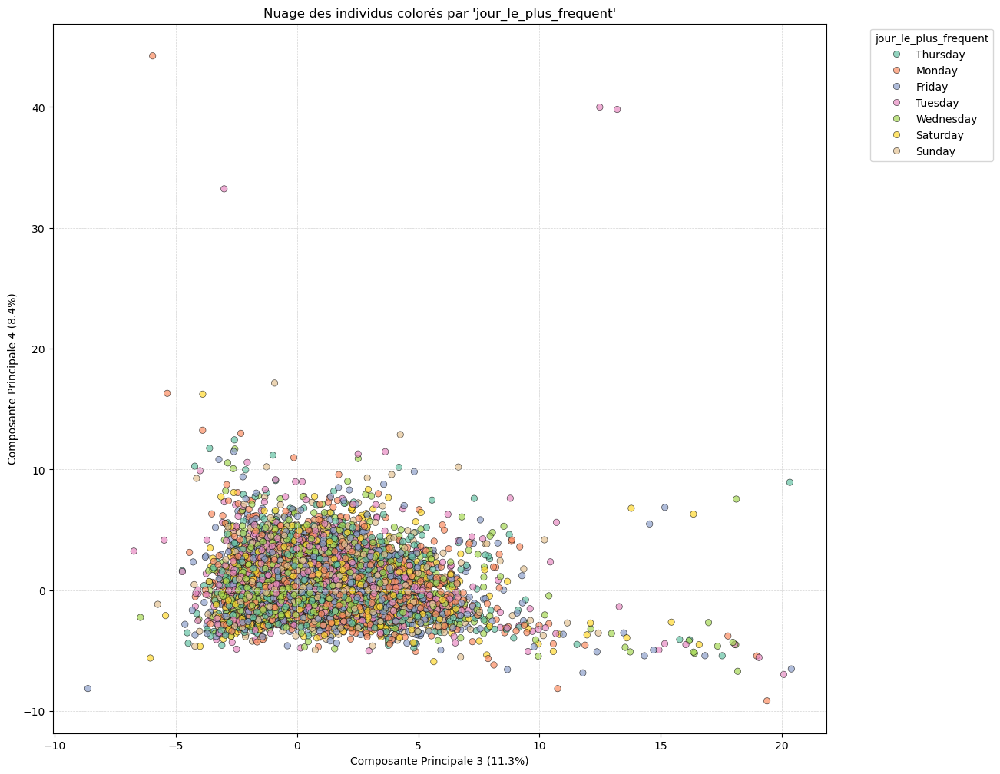

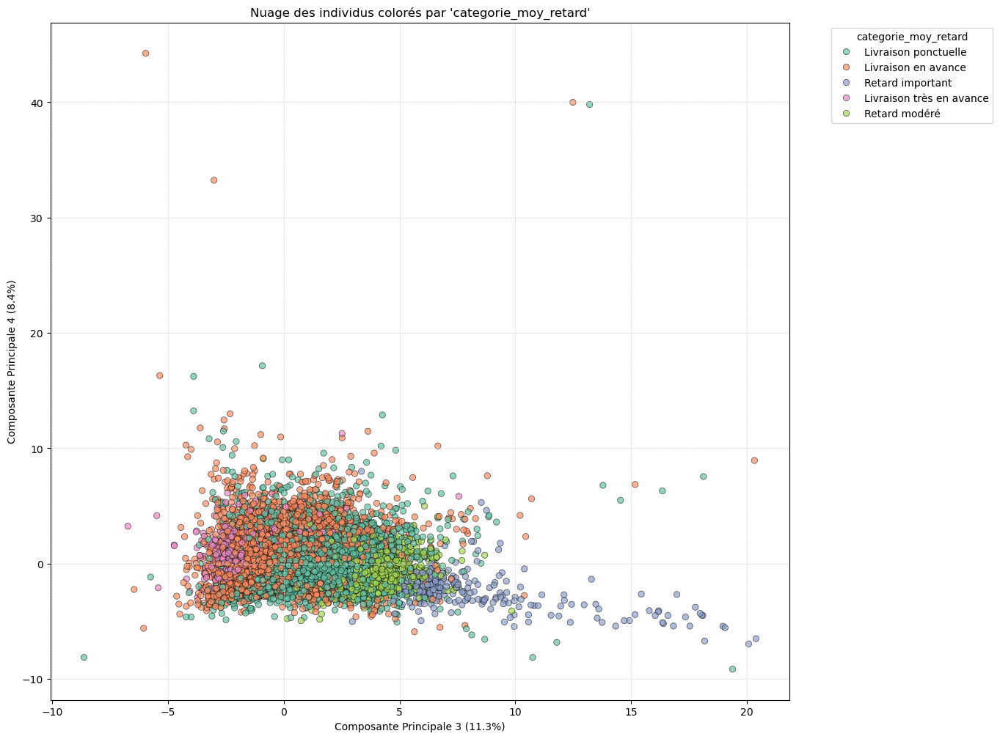

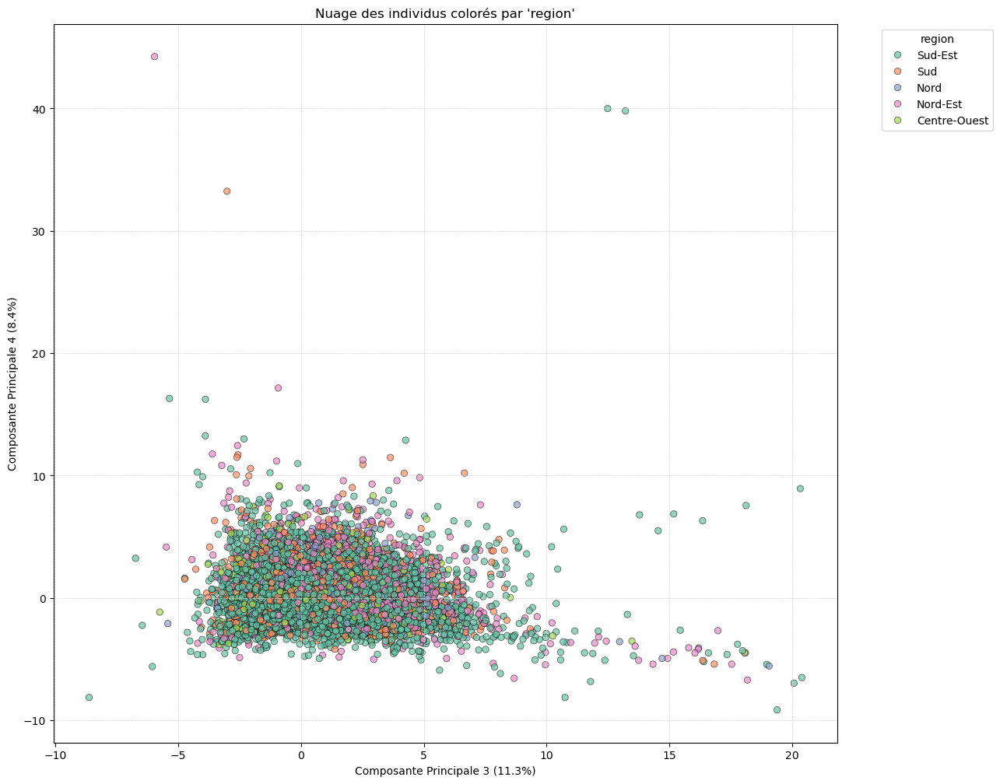

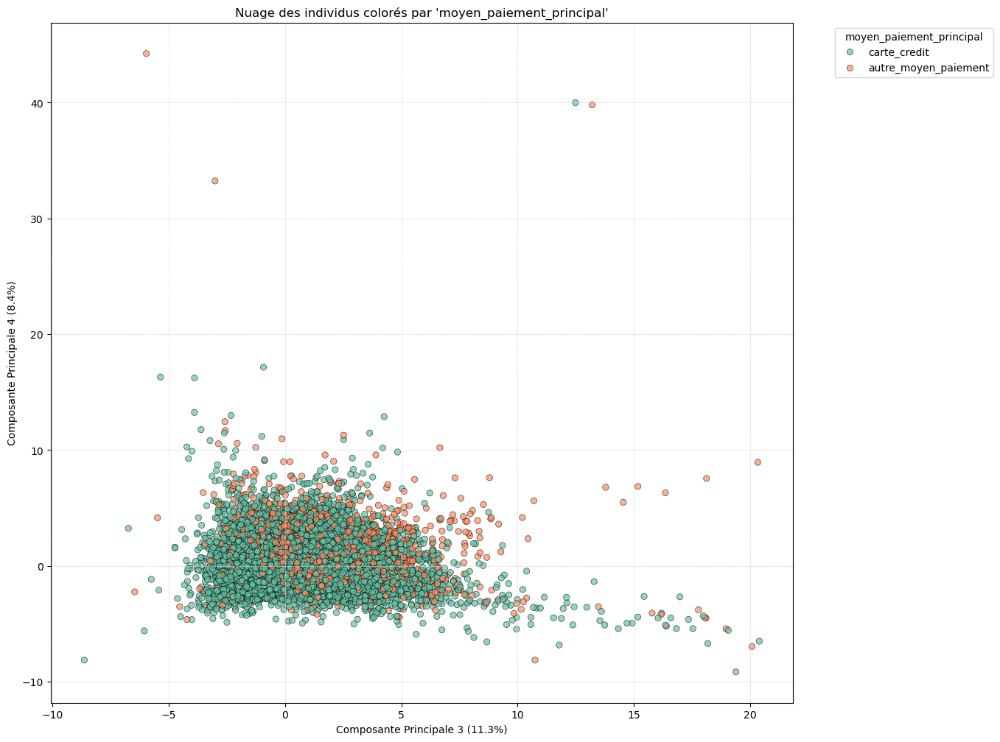

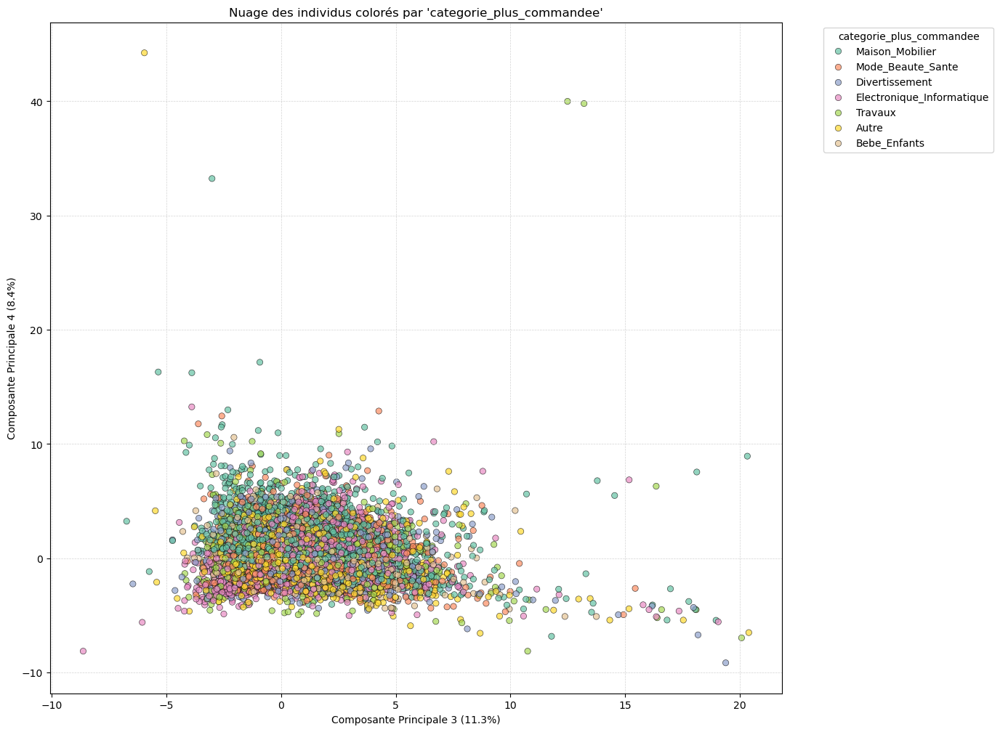

In [1393]:
# Obtenir les deux premières composantes principales
pc3 = pca_result[:, 2]  # 3ème composante
pc4 = pca_result[:, 3]  # 4èmecomposante

# Visualisation des composantes principales avec coloration par variable catégorielle
plt.figure(figsize=(13, 12))

for var in colonnes_quali:
    plt.figure(figsize=(13, 12))
    sns.scatterplot(
        x=pc3, 
        y=pc4, 
        hue=df_pca[var],  # Utiliser chaque variable catégorielle
        palette='Set2',
        alpha=0.7,
        edgecolor='k'
    )
    plt.title(f"Nuage des individus colorés par '{var}'")
    plt.xlabel(f'Composante Principale 3 ({pca.explained_variance_ratio_[2] * 100:.1f}%)')
    plt.ylabel(f'Composante Principale 4 ({pca.explained_variance_ratio_[3] * 100:.1f}%)')
    plt.legend(title=var, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(color='lightgrey', linestyle='--', linewidth=0.5)
    plt.show()

<Figure size 1300x1200 with 0 Axes>

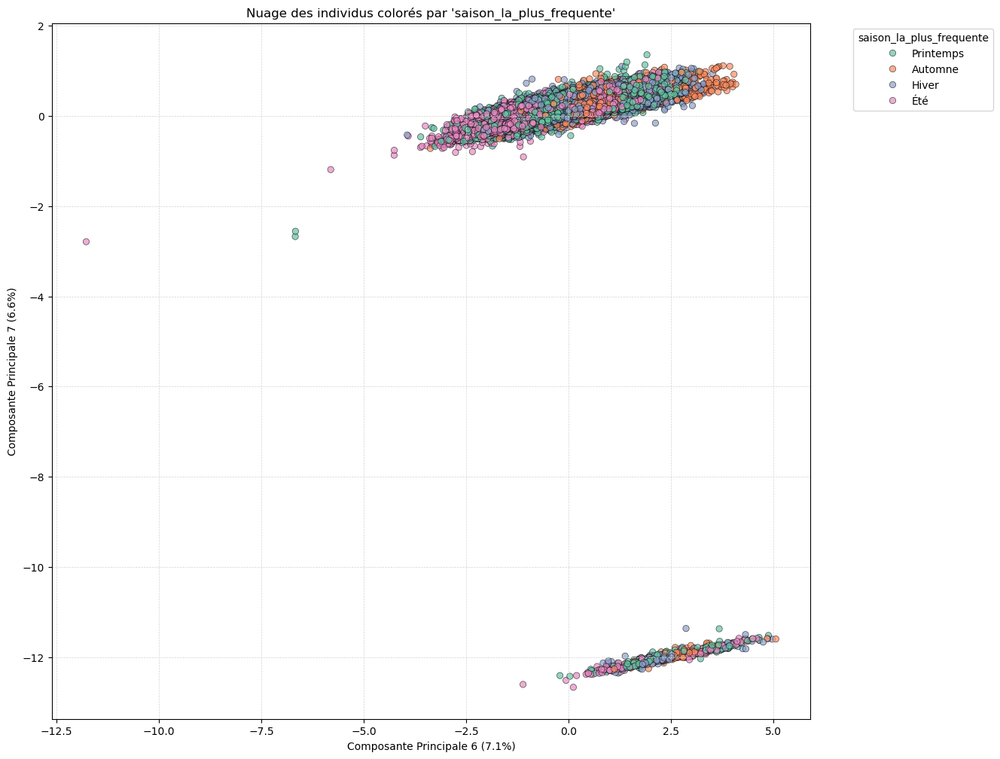

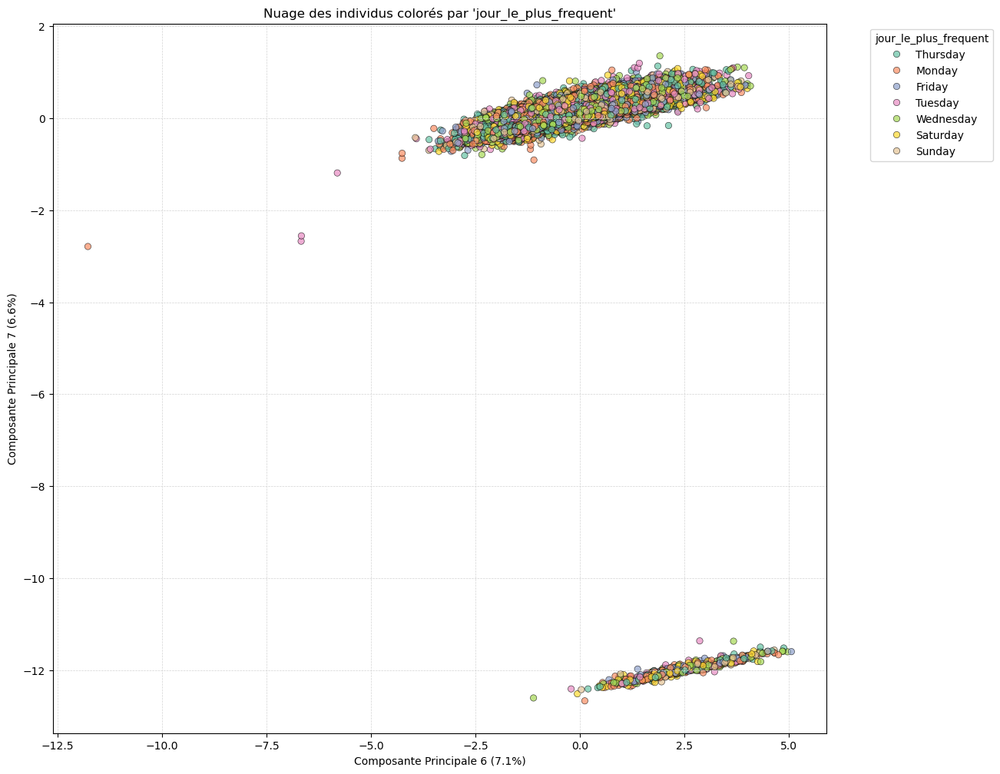

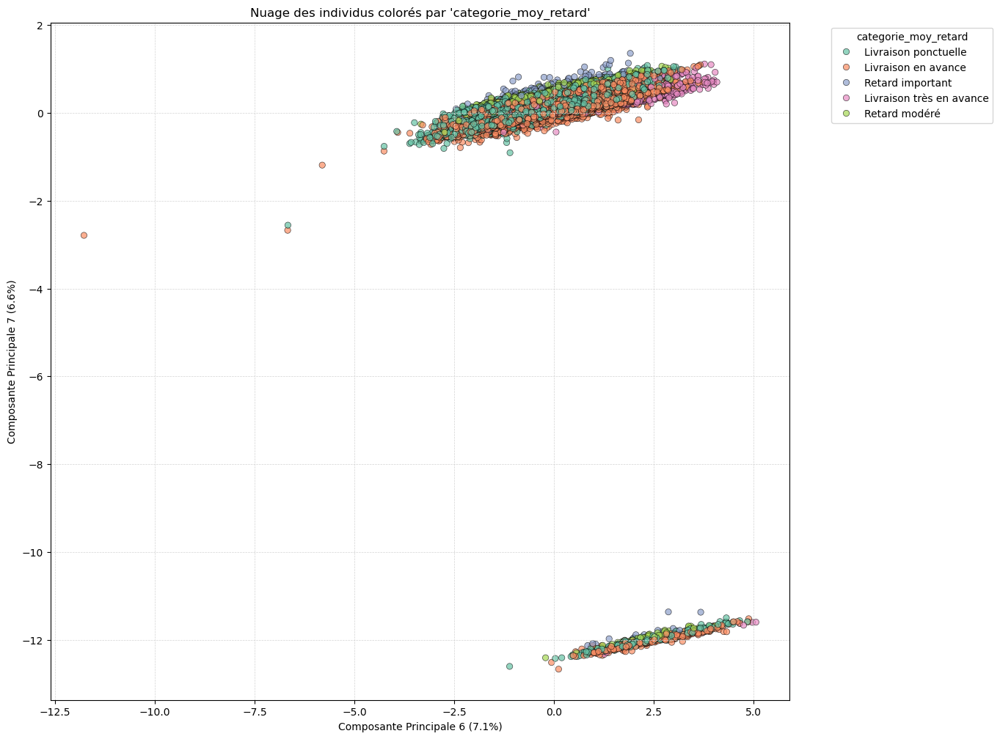

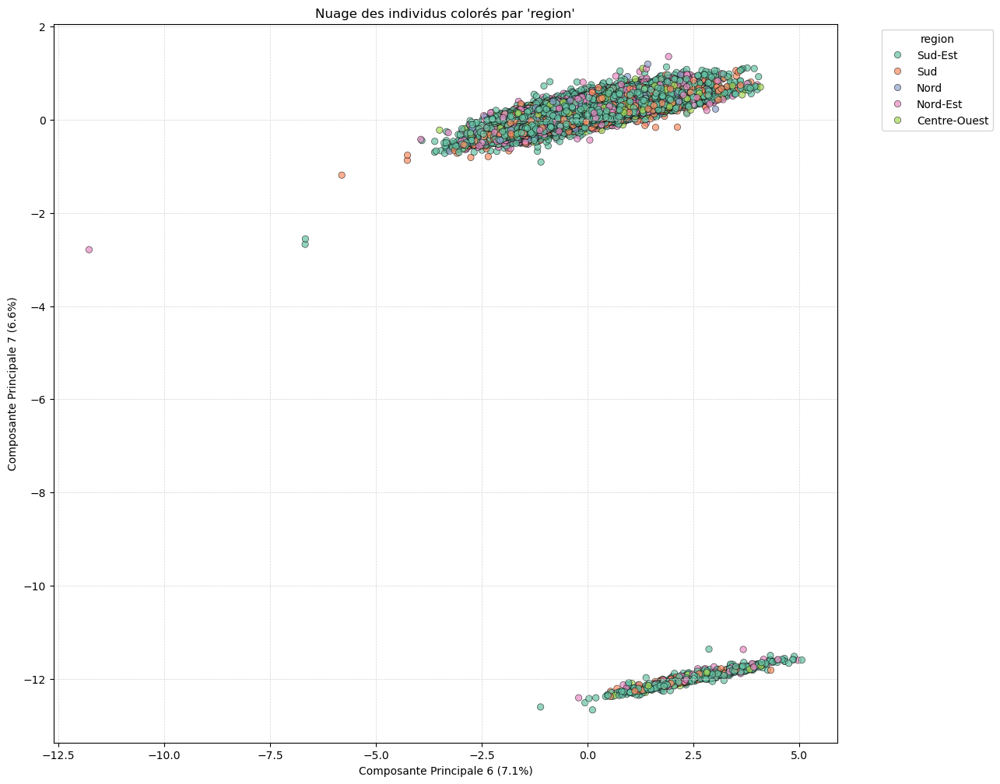

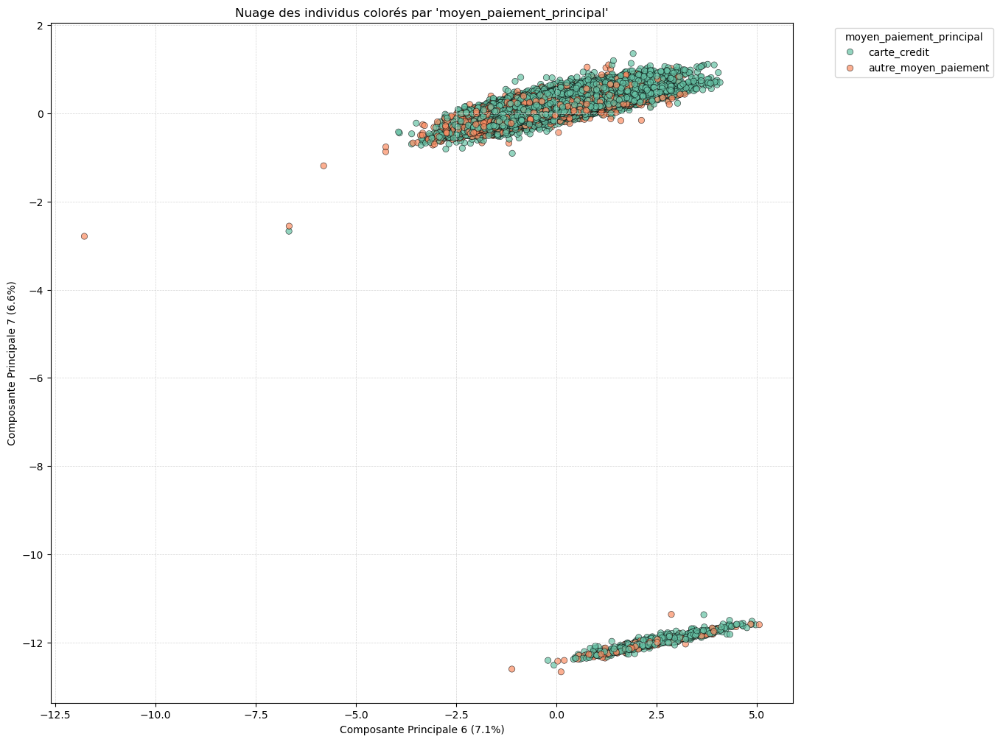

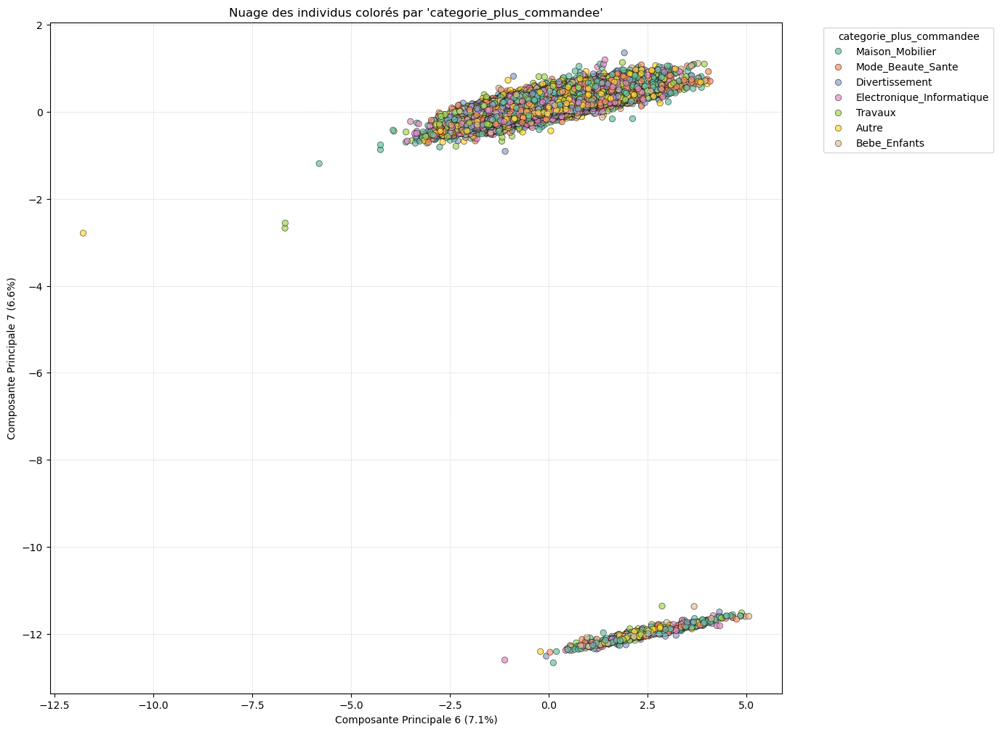

In [1394]:
# Obtenir les deux premières composantes principales
pc6 = pca_result[:, 5]  # 6ème composante
pc7 = pca_result[:, 6]  # 7èmecomposante

# Visualisation des composantes principales avec coloration par variable catégorielle
plt.figure(figsize=(13, 12))

for var in colonnes_quali:
    plt.figure(figsize=(13, 12))
    sns.scatterplot(
        x=pc6, 
        y=pc7, 
        hue=df_pca[var],  # Utiliser chaque variable catégorielle
        palette='Set2',
        alpha=0.7,
        edgecolor='k'
    )
    plt.title(f"Nuage des individus colorés par '{var}'")
    plt.xlabel(f'Composante Principale 6 ({pca.explained_variance_ratio_[5] * 100:.1f}%)')
    plt.ylabel(f'Composante Principale 7 ({pca.explained_variance_ratio_[6] * 100:.1f}%)')
    plt.legend(title=var, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(color='lightgrey', linestyle='--', linewidth=0.5)
    plt.show()

## ACP avec variables quantitatives et qualitatives

### Préparation des données

In [1493]:
# Charger le DataFrame
df = df_client_final

# Sélectionner les colonnes quantitatives pour l'ACP
colonnes_quanti = df.select_dtypes(include=['number']).columns

# Sélectionner les colonnes qualitatives comme variables supplémentaires
colonnes_quali = df.select_dtypes(include=['object']).columns

# Étape 1 : Normalisation des données quantitatives
scaler = StandardScaler()
df_quanti_scaled = pd.DataFrame(
    scaler.fit_transform(df[colonnes_quanti]), 
    columns=colonnes_quanti
)

# Étape 2 : Encodage des données qualitatives (One-Hot Encoding)
encoder = OneHotEncoder(drop="first", sparse_output=False)  # Utiliser sparse_output au lieu de sparse
encoded_quali = encoder.fit_transform(df[colonnes_quali])

# Convertir en DataFrame pour une meilleure lisibilité
encoded_quali_df = pd.DataFrame(
    encoded_quali, 
    columns=encoder.get_feature_names_out(colonnes_quali)
)

# Étape 3 : Combiner les données quantitatives normalisées et qualitatives encodées
df_combined = pd.concat([df_quanti_scaled, encoded_quali_df.reset_index(drop=True)], axis=1)

# Vérification du DataFrame final
print("Dimensions du DataFrame combiné :", df_combined.shape)

Dimensions du DataFrame combiné : (93103, 39)


In [1495]:
df_combined.head()

,nb_commandes,total_depense,frais_livraison_moyens,poids_moyen_commandes,longueur_moyenne_descriptions,diversite_categories,delai_livraison_moyen,total_retards_livraison,nb_paiements_total,moyenne_echeances_paiement,...,region_Nord-Est,region_Sud,region_Sud-Est,moyen_paiement_principal_carte_credit,categorie_plus_commandee_Bebe_Enfants,categorie_plus_commandee_Divertissement,categorie_plus_commandee_Electronique_Informatique,categorie_plus_commandee_Maison_Mobilier,categorie_plus_commandee_Mode_Beaute_Sante,categorie_plus_commandee_Travaux
0,-0.159763,-0.054337,-0.501899,-0.187134,-0.862008,-0.116637,-0.638318,0.673333,-0.177874,1.905839,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.159763,-0.568828,-0.674713,-0.423820,-0.243922,-0.116637,-0.952572,0.673333,-0.177874,-0.709867,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,-0.159763,-0.336612,-0.258749,-0.187134,-0.953404,-0.116637,1.351951,0.950876,-0.177874,1.905839,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
3,-0.159763,-0.535966,-0.239651,-0.471157,1.469370,-0.116637,0.828196,0.025731,-0.177874,0.411150,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
4,-0.159763,0.177879,-0.274120,0.770128,0.002383,-0.116637,0.094939,0.395789,-0.177874,1.158494,...,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0


In [1496]:
# Appliquer l'ACP sur les données quantitatives
pca = PCA() # Initialisation d'un objet PCA
pca_result = pca.fit_transform(df_combined)# Calcul des composantes principales et transformation des données

### Choix du nombre d'axes

In [1497]:
# Créer un DataFrame pour analyser les valeurs propres
comp = pd.DataFrame({
    "Dimension": ["Dim" + str(i + 1) for i in range(len(pca.explained_variance_))],  # Noms des dimensions (Dim1, ...)
    "Valeur propre": pca.explained_variance_,  # Valeurs propres (quantité de variance expliquée par chaque composante)
    "% variance expliquée": np.round(
        pca.explained_variance_ratio_ * 100),  # Pourcentage de variance expliquée par chaque composante
    "% cum. var. expliquée": np.round(
        np.cumsum(pca.explained_variance_ratio_) * 100)  # Pourcentage cumulé de variance expliquée
})

comp

,Dimension,Valeur propre,% variance expliquée,% cum. var. expliquée
0,Dim1,2.265330,13.0,13.0
1,Dim2,2.218603,12.0,25.0
2,Dim3,1.730556,10.0,35.0
3,Dim4,1.285296,7.0,42.0
4,Dim5,1.205293,7.0,48.0
5,Dim6,1.092235,6.0,55.0
6,Dim7,0.995765,6.0,60.0
7,Dim8,0.939892,5.0,65.0
8,Dim9,0.793511,4.0,70.0
9,Dim10,0.776654,4.0,74.0


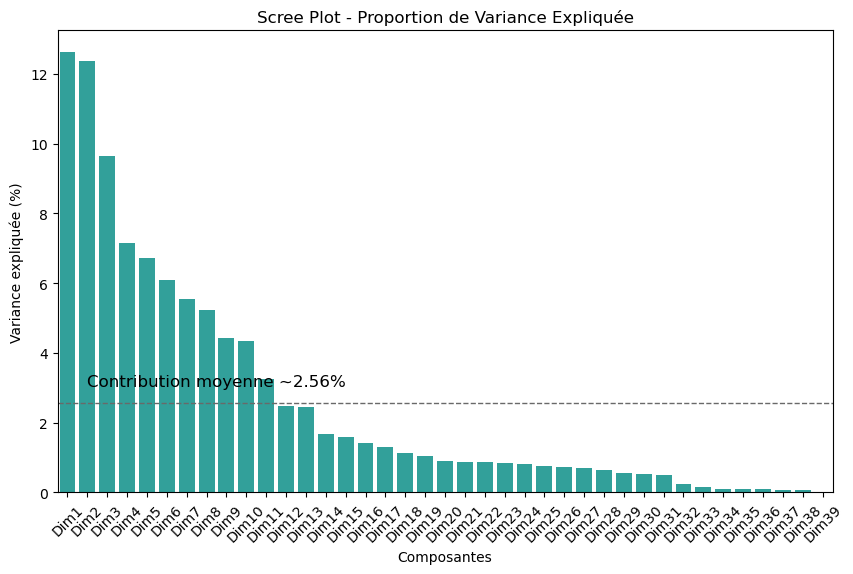

In [1500]:
# Création du DataFrame des valeurs propres pour le Scree Plot
comp = pd.DataFrame({
    "Dimension": ["Dim" + str(i + 1) for i in range(len(pca.explained_variance_))],  # Noms des dimensions
    "% variance expliquée": np.round(pca.explained_variance_ratio_ * 100, 2)  # Variance expliquée par composante
})

# Configuration du graphique
plt.figure(figsize=(10, 6))  # Taille de la figure

# Barplot pour visualiser la variance expliquée
g_comp = sns.barplot(
    x="Dimension",  # Dimensions (Dim1, Dim2, ...)
    y="% variance expliquée",  # Variance expliquée
    data=comp,  # Données du DataFrame
    color="lightseagreen"  # Couleur des barres
)

# Titre et labels des axes
plt.title("Scree Plot - Proportion de Variance Expliquée")
plt.ylabel("Variance expliquée (%)")
plt.xlabel("Composantes")

# Ligne horizontale pour la contribution moyenne
contribution_moyenne = 100 / len(pca.explained_variance_)  # Contribution moyenne
plt.axhline(y=contribution_moyenne, linewidth=1, color="dimgray", linestyle="--")  # Ligne horizontale

# Annotation pour la contribution moyenne
plt.text(1, contribution_moyenne + 0.5, f"Contribution moyenne ~{np.round(contribution_moyenne, 2)}%", fontsize=12)

# Incliner les labels de l'axe des x
plt.xticks(rotation=45)

# Afficher le graphique
plt.show()

Lors de l'analyse des résultats de l'ACP, nous avons utilisé plusieurs critères pour déterminer le nombre optimal de dimensions à retenir.

Selon la règle de Kaiser, nous avons retenu les 6 premières dimensions, car leurs valeurs propres sont supérieures à 1. Ces dimensions expliquent un total de 55% de la variance cumulée.

Pour capturer une part plus significative de l'information, nous avons analysé le pourcentage cumulé de variance expliquée :

- Les 9 premières dimensions couvrent environ 70% de la variance totale.
- Les 12 premières dimensions permettent d'atteindre un seuil conventionnel élevé avec 80% de la variance.

Enfin, en observant le Scree Plot, nous avons identifié un coude autour de la 9e ou 10e dimension, indiquant que les contributions des axes suivants deviennent négligeables.

En conclusion, notre choix s'est porté sur les 9 ou 10 premières dimensions, car elles offrent un bon équilibre entre simplicité et richesse d'information.

### Interprétation des composantes principales

In [1501]:
# Obtenir les composantes principales
pcs = pca.components_  # Matrice des vecteurs propres (composantes principales) issus de l'ACP

# Création d'un DataFrame pour interpréter chaque composante
df_pcs = pd.DataFrame(
    pcs,  # Les composantes principales
    columns=df_combined.columns,  # Noms des colonnes correspondant aux variables originales
    index=[f'F{i+1}' for i in range(pcs.shape[0])]  # Index représentant les nouvelles dimensions (F1, F2, ...)
)

# Transposer le DataFrame pour visualiser les contributions de chaque variable dans chaque dimension
df_pcs_transposed = df_pcs.T  # Transposer le DataFrame

# Afficher le DataFrame transposé
display(df_pcs_transposed)

,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,...,F30,F31,F32,F33,F34,F35,F36,F37,F38,F39
nb_commandes,0.511626,-0.153509,0.207043,-0.128944,-0.297499,-0.017150,-0.009090,0.041346,-0.053086,0.014320,...,0.053002,0.001659,0.015457,0.008082,0.004940,-0.005223,0.028215,-0.021807,0.004220,-0.010560
total_depense,0.268671,0.407364,-0.149569,-0.185120,0.099787,-0.014928,-0.001363,0.005936,-0.060244,-0.023406,...,0.007071,0.005350,0.000519,-0.001461,0.000933,0.009152,-0.001812,0.000319,0.001053,-0.000123
frais_livraison_moyens,0.192920,0.477964,-0.055128,0.416671,-0.075173,-0.135926,-0.020768,0.058951,-0.019904,0.012611,...,-0.082360,0.011568,0.010365,-0.016158,-0.001189,-0.003642,0.007748,-0.000573,-0.007786,0.001178
poids_moyen_commandes,0.191878,0.460997,-0.102005,0.310464,0.000771,-0.050447,-0.010766,-0.040457,-0.319563,-0.104512,...,0.063591,-0.007097,-0.007319,0.012139,0.000266,-0.006435,-0.000365,-0.000248,0.004947,0.000058
longueur_moyenne_descriptions,0.058236,0.135161,-0.108206,-0.304644,0.219753,-0.283095,-0.027822,0.787760,0.243012,0.039861,...,-0.004532,0.006316,-0.001021,-0.001514,-0.000528,-0.008562,-0.000265,0.000880,-0.000598,-0.000197
diversite_categories,0.456288,-0.142699,0.200588,-0.160764,-0.355485,-0.049250,-0.015458,0.045281,-0.097163,0.054513,...,-0.005923,-0.008575,0.002915,-0.001086,0.001520,0.008066,0.000384,0.000816,0.000311,0.000021
delai_livraison_moyen,-0.129675,0.296363,0.540636,-0.074721,-0.093370,0.102490,0.027792,0.113036,-0.054283,0.286185,...,-0.180912,0.004891,-0.013268,-0.035331,0.000560,-0.005486,-0.087103,0.004704,-0.018255,-0.020047
total_retards_livraison,-0.321750,0.226085,0.441026,-0.222531,0.071473,-0.141811,-0.004659,-0.094558,-0.235223,0.255540,...,0.157095,-0.001714,0.021639,0.029980,0.004585,0.003226,0.106327,-0.090736,0.017184,-0.045556
nb_paiements_total,0.431859,-0.150976,0.304680,0.080266,0.339108,0.002455,0.006433,-0.051973,0.031655,0.038005,...,-0.014050,-0.003324,-0.002279,0.000390,-0.000578,0.000844,-0.000550,-0.000417,-0.000361,-0.000222
moyenne_echeances_paiement,0.140341,0.303697,-0.164038,-0.243039,-0.058924,0.269325,0.055391,-0.340499,0.601394,0.361578,...,-0.001042,0.008622,0.002348,0.001801,0.000105,0.005804,0.002495,-0.000658,-0.001528,0.000309


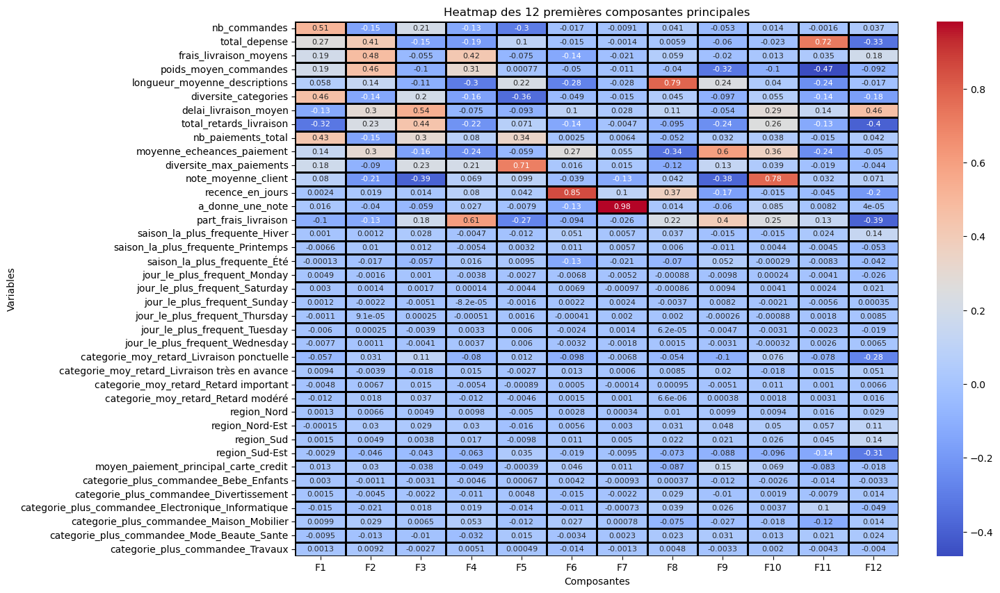

In [1503]:
# Filtrer pour ne conserver que les 12 premières composantes principales
df_pcs_12 = df_pcs.iloc[:12].T  # Sélectionner uniquement les 12 premières composantes et transposer

# Afficher la heatmap
plt.figure(figsize=(14, 10))  # Définir la taille de la figure pour un affichage clair

# Créer une heatmap basée sur les coefficients des 12 premières composantes principales
sns.heatmap(
    df_pcs_12,  # Utiliser le DataFrame filtré pour afficher les variables en lignes et les composantes en colonnes
    annot=True,  # Ajouter les annotations (valeurs numériques) sur la heatmap
    cmap='coolwarm',  # Palette de couleurs pour indiquer les valeurs positives et négatives
    linewidths=1,  # Épaisseur des lignes séparant les cellules
    linecolor='black',  # Couleur des lignes séparant les cellules
    annot_kws={"size": 8}  # Réduit la taille de la police
)

# Ajouter un titre et des étiquettes pour les axes
plt.title("Heatmap des 12 premières composantes principales")  # Titre de la heatmap
plt.xlabel("Composantes")  # Étiquette pour l'axe des abscisses
plt.ylabel("Variables")  # Étiquette pour l'axe des ordonnées

# Afficher la heatmap
plt.show()

### Analyse des contributions des variables
Pour approfondir notre compréhension de la structure des données, nous allons examiner les contributions relatives de chaque variable aux composantes principales.

In [1518]:
# Calcul des contributions
contributions = df_pcs ** 2  # Calcul des contributions des variables en élevant chaque coefficient au carré

# Normaliser les contributions pour obtenir des pourcentages
contributions = contributions.apply(lambda col: col / col.sum() * 100, axis=0)

# Arrondir les valeurs à deux décimales
contributions_rounded = contributions.round(2)

# Filtrer pour ne conserver que les 12 premières composantes principales
contributions_12 = contributions_rounded.iloc[:, :12]  # Sélectionner F1 à F12

# Transposer le DataFrame pour afficher les composantes principales en colonnes
contributions_12_transposed = contributions_12.T  # Transposition

# Afficher les contributions en pourcentage pour les 12 premières composantes
print("\nContributions en pourcentage (12 premières composantes) :")
display(contributions_12_transposed)


Contributions en pourcentage (12 premières composantes) :


,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,...,F30,F31,F32,F33,F34,F35,F36,F37,F38,F39
nb_commandes,26.18,2.36,4.29,1.66,8.85,0.03,0.01,0.17,0.28,0.02,...,0.28,0.00,0.02,0.01,0.0,0.00,0.08,0.05,0.00,0.01
total_depense,7.22,16.59,2.24,3.43,1.00,0.02,0.00,0.00,0.36,0.05,...,0.00,0.00,0.00,0.00,0.0,0.01,0.00,0.00,0.00,0.00
frais_livraison_moyens,3.72,22.84,0.30,17.36,0.57,1.85,0.04,0.35,0.04,0.02,...,0.68,0.01,0.01,0.03,0.0,0.00,0.01,0.00,0.01,0.00
poids_moyen_commandes,3.68,21.25,1.04,9.64,0.00,0.25,0.01,0.16,10.21,1.09,...,0.40,0.01,0.01,0.01,0.0,0.00,0.00,0.00,0.00,0.00
longueur_moyenne_descriptions,0.34,1.83,1.17,9.28,4.83,8.01,0.08,62.06,5.91,0.16,...,0.00,0.00,0.00,0.00,0.0,0.01,0.00,0.00,0.00,0.00
diversite_categories,20.82,2.04,4.02,2.58,12.64,0.24,0.02,0.21,0.94,0.30,...,0.00,0.01,0.00,0.00,0.0,0.01,0.00,0.00,0.00,0.00
delai_livraison_moyen,1.68,8.78,29.23,0.56,0.87,1.05,0.08,1.28,0.29,8.19,...,3.27,0.00,0.02,0.12,0.0,0.00,0.76,0.00,0.03,0.04
total_retards_livraison,10.35,5.11,19.45,4.95,0.51,2.01,0.00,0.89,5.53,6.53,...,2.47,0.00,0.05,0.09,0.0,0.00,1.13,0.82,0.03,0.21
nb_paiements_total,18.65,2.28,9.28,0.64,11.50,0.00,0.00,0.27,0.10,0.14,...,0.02,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00
moyenne_echeances_paiement,1.97,9.22,2.69,5.91,0.35,7.25,0.31,11.59,36.17,13.07,...,0.00,0.01,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00



Contributions en pourcentage (12 premières composantes) :


,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,F11,F12
nb_commandes,26.18,2.36,4.29,1.66,8.85,0.03,0.01,0.17,0.28,0.02,0.00,0.13
total_depense,7.22,16.59,2.24,3.43,1.00,0.02,0.00,0.00,0.36,0.05,52.37,11.20
frais_livraison_moyens,3.72,22.84,0.30,17.36,0.57,1.85,0.04,0.35,0.04,0.02,0.12,3.41
poids_moyen_commandes,3.68,21.25,1.04,9.64,0.00,0.25,0.01,0.16,10.21,1.09,21.73,0.84
longueur_moyenne_descriptions,0.34,1.83,1.17,9.28,4.83,8.01,0.08,62.06,5.91,0.16,5.59,0.03
diversite_categories,20.82,2.04,4.02,2.58,12.64,0.24,0.02,0.21,0.94,0.30,2.05,3.14
delai_livraison_moyen,1.68,8.78,29.23,0.56,0.87,1.05,0.08,1.28,0.29,8.19,1.94,21.49
total_retards_livraison,10.35,5.11,19.45,4.95,0.51,2.01,0.00,0.89,5.53,6.53,1.61,15.78
nb_paiements_total,18.65,2.28,9.28,0.64,11.50,0.00,0.00,0.27,0.10,0.14,0.02,0.18
moyenne_echeances_paiement,1.97,9.22,2.69,5.91,0.35,7.25,0.31,11.59,36.17,13.07,5.99,0.25


D'après le tableau des contributions :

La majorité des variables catégorielles encodées ont des contributions faibles ou négligeables dans les dimensions principales (F1 à F12), ce qui signifie qu'elles n'expliquent pas significativement la variance des données.

Quelques variables, comme region_Sud-Est (9.74% sur F12) et categorie_moy_retard_Livraison ponctuelle (7.63% sur F12), montrent des contributions modérées, mais ces contributions sont concentrées sur des dimensions secondaires.

#  Conclusion du notebook d'exploration

Dans le cadre de ce projet, je vais procéder par étapes en me concentrant exclusivement sur les variables quantitatives suivantes :

- RFM : recence_en_jours, nb_commandes, total_depense.
- Transport et livraison : delai_livraison_moyen, total_retards_livraison, frais_livraison_moyens, poids_moyen_commandes, part_frais_livraison.
- Diversité et paiement : diversite_categories, diversite_max_paiements, nb_paiements_total, moyenne_echeances_paiement.
- Satisfaction client : note_moyenne_client, a_donne_une_note.
- Descriptions produits : longueur_moyenne_descriptions.

En me limitant aux variables quantitatives, je m'assure de minimiser le bruit et de maximiser la pertinence des clusters. Cette approche méthodique permettra de structurer les comportements clients de manière claire et cohérente, tout en restant focalisé sur des dimensions directement mesurables et fiables.

In [1523]:
df_client_modelisation = df_client_final.copy()

In [1524]:
df_client_modelisation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93103 entries, 0 to 93102
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   nb_commandes                   93103 non-null  int64  
 1   total_depense                  93103 non-null  float64
 2   frais_livraison_moyens         93103 non-null  float64
 3   poids_moyen_commandes          93103 non-null  float64
 4   longueur_moyenne_descriptions  93103 non-null  float64
 5   diversite_categories           93103 non-null  int64  
 6   delai_livraison_moyen          93103 non-null  float64
 7   total_retards_livraison        93103 non-null  int64  
 8   nb_paiements_total             93103 non-null  int64  
 9   moyenne_echeances_paiement     93103 non-null  float64
 10  diversite_max_paiements        93103 non-null  int64  
 11  note_moyenne_client            93103 non-null  float64
 12  saison_la_plus_frequente       93103 non-null 

In [1525]:
# Enregistrement de mon df
df_client_modelisation.to_csv('df_client_modelisation.csv', index=False)